In [1]:
from jcs_sar_augmentation_edit import *
from wavelet import *
from time import *

In [2]:
def make_balanced_data(tensor_data, tensor_label, n_per_class=100, random_seed = 1234):
  indx_bal = []
  for j in range(5):
    random.seed(random_seed)
    t_indx = torch.nonzero(tensor_label==j).flatten()
    t_indx = [t_indx[i].item() for i in range(t_indx.shape[0])]
    t_indx100 = random.sample(t_indx, k=n_per_class)
    indx_bal += t_indx100
  
  return tensor_data[indx_bal], tensor_label[indx_bal]

In [3]:
def confusion_matrix(y_pred, y_test, num_class=5):
    cf = np.zeros((num_class,num_class),int)
    n = y_test.shape[0]
    for i in range(n):
        true_class = y_test[i].item()
        pred_class = y_pred[i].item()
        cf[true_class,pred_class] += 1
    cf = pd.DataFrame(cf)
    cf.columns = ['SLICY', 'ZSU_23_4', 'T62', '2S1', 'BRDM_2']
    cf.rename(index={0:'SLICY', 1:'ZSU_23_4', 2:'T62', 3:'2S1', 4:'BRDM_2'}, inplace=True)
    
    return cf

In [16]:
def geom_aug(tensor_data, tensor_label):
    # tensor_data, tensor_label을 입력받고 aug된 data만 return하는 함수.
    # vflip, hflip, center_crop, rotate, add_noise, affine 총 6가지의 종류의 기하적 증강 실시.
    
    tensor_temp_data = tensor_data.clone()
    tensor_temp_label = tensor_label.clone()

    vflip_data, vflip_label = geom_augmentation(tensor_temp_data, tensor_temp_label,
                                                    vflip=True)

    hflip_data, hflip_label = geom_augmentation(tensor_temp_data, tensor_temp_label,
                                                        hflip=True)

    c_crop_data, c_crop_label = geom_augmentation(tensor_temp_data, tensor_temp_label, 
                                                         resize_center_crop=(48,48))

    ang_vec = np.arange(-20,25,20)
    ang_vec = ang_vec[ang_vec!=0]
    rotate_data, rotate_label = geom_augmentation(tensor_temp_data, tensor_temp_label,
                                                           rotate=ang_vec)

    param_dict = {'dist':'unif', 'param':[0, 0.1]}
    add_noise_data, add_noise_label = geom_augmentation(tensor_temp_data,
                                                      tensor_temp_label, add_noise=param_dict)

    param_dict = {'angle':30, 'translate':[5, 10], 'scale':1.2,
                     'shear':(0,0), 'fill':0.0}
    affine_data, affine_label = geom_augmentation(tensor_temp_data, tensor_temp_label,
                                                           affine=param_dict)
    
    aug_dat = torch.cat([vflip_data, hflip_data, c_crop_data,
                                 rotate_data, add_noise_data, affine_data])
    aug_lbl = torch.cat([vflip_label, hflip_label, c_crop_label,
                                 rotate_label, add_noise_label, affine_label])

    aug_dat = aug_dat.type(torch.float32)
    aug_lbl = aug_lbl.type(torch.int64)
    
    return aug_dat, aug_lbl

In [6]:
t1 = time()
f_info = make_file_info('MSTAR_TargetData',1,4)
f_info_SLICY = f_info[f_info['object']=='SLICY']
f_info_ZSU = f_info[f_info['object']=='ZSU_23_4']
f_info_BRDM2 = f_info[f_info['object']=='BRDM_2']
f_info_2S1 = f_info[f_info['object']=='2S1']
f_info_T62 = f_info[f_info['object']=='T62']

comb_file_info = pd.concat([f_info_SLICY, f_info_T62, f_info_ZSU,
                                 f_info_2S1, f_info_BRDM2],axis=0)

class_label=['SLICY', 'ZSU_23_4', 'T62', '2S1', 'BRDM_2']

sz = 64
img_dat, lbl_dat, deg_dat = data_loader_target(comb_file_info,
                                                      size_out = (sz,sz), scale='max')

t2 = time()
print("Time: ", t2 - t1)

Time:  935.328446149826


In [12]:
print('전체 데이터 개수 및 비율\n')
for i in range(5):
    no_label = (lbl_dat==i).sum().item()
    n = lbl_dat.shape[0]
    print(f'{class_label[i]}: {no_label} ({round(no_label/n*100,1)}%)')
print('\n합계: ', n)

전체 데이터 개수 및 비율

SLICY: 2539 (35.8%)
ZSU_23_4: 1401 (19.8%)
T62: 572 (8.1%)
2S1: 1164 (16.4%)
BRDM_2: 1415 (20.0%)

합계:  7091


In [8]:
ratio = 0.7 #training이 0.7
tr_data, tr_lbl, ts_data, ts_lbl = train_test_split(img_dat, lbl_dat,
                                                      train_portion=ratio, seed=1234) #ts_data는 계속 고정

print('test 데이터 개수\n')
for i in range(5):
    print(class_label[i],': ',(ts_lbl==i).sum().item())
print('\n합계: ', ts_data.shape[0])

test 데이터 개수

SLICY :  758
ZSU_23_4 :  432
T62 :  174
2S1 :  347
BRDM_2 :  416

합계:  2127


In [9]:
tr_data100, tr_lbl100 = make_balanced_data(tr_data, tr_lbl, n_per_class=100)
print(tr_data100.shape)
print(tr_lbl100.shape)

tr_data200, tr_lbl200 = make_balanced_data(tr_data, tr_lbl, n_per_class=200)
print(tr_data200.shape)
print(tr_lbl200.shape)

tr_data300, tr_lbl300 = make_balanced_data(tr_data, tr_lbl, n_per_class=300)
print(tr_data300.shape)
print(tr_lbl300.shape)

torch.Size([500, 1, 64, 64])
torch.Size([500])
torch.Size([1000, 1, 64, 64])
torch.Size([1000])
torch.Size([1500, 1, 64, 64])
torch.Size([1500])


## class 별 300장

### 1. 증강 전

In [10]:
n_per_class = 300

In [11]:
os.makedirs('./model_save' + str(n_per_class))

In [12]:
# Classification without data augmentation
set_seed = 1234
random.seed(set_seed)
np.random.seed(set_seed)
torch.manual_seed(set_seed)
model_fit, ep_loss_fit, ep_acc_fit, ep_prd_list_fit, ep_y_list_fit, ep_loss_hist_fit = train_model(tr_data300, tr_lbl300, batch_size=48,
                                                                        n_epoch=5, lr_rate=0.0002, momentum=0.9, shuffle=False)

Epoch 1
-------------------------------
loss: 1.621209  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.602934 

Epoch 2
-------------------------------
loss: 1.580632  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.510808 

Epoch 3
-------------------------------
loss: 1.490286  [    0/ 1500]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.408286 

Epoch 4
-------------------------------
loss: 1.305023  [    0/ 1500]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.329878 

Epoch 5
-------------------------------
loss: 1.250599  [    0/ 1500]
 Training Error: 
 Accuracy: 48.7%, Avg loss: 1.272666 

Done!


In [13]:
torch.save(model_fit.state_dict(),
             './model_save' + str(n_per_class) + '/clf_without_augmnt_'+str(n_per_class)+'.pkl')

model_test = cnn_clf_net(sz, 1, 5)
model_test.load_state_dict(torch.load(
              './model_save' + str(n_per_class) + '/clf_without_augmnt_'+str(n_per_class)+'.pkl'))
model_test.to('cuda')
pred_test_nag, y_test_nag, loss_test_nag, acc_test_nag = test_model(model_test, ts_data, ts_lbl, batch_size=48)

 Test Error: 
 Accuracy: 69.2%, Avg loss: 1.040035 



In [14]:
confusion_matrix(pred_test_nag, y_test_nag)

,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,0,0,0,6
ZSU_23_4,87,194,0,149,2
T62,21,112,0,38,3
2S1,9,51,0,275,12
BRDM_2,12,32,0,121,251


### 2. 이미지 조작 증강

In [17]:
# Geometric Augmentation
only_aug_dat, only_aug_lbl = geom_aug(tr_data300, tr_lbl300)

tr_aug_dat = torch.cat([tr_data300, only_aug_dat])
tr_aug_lbl = torch.cat([tr_lbl300, only_aug_lbl])

tr_aug_dat = tr_aug_dat.type(torch.float32)
tr_aug_lbl = tr_aug_lbl.type(torch.int64)

In [19]:
os.makedirs('./img_out'+str(n_per_class))
geom_img_save_path = os.path.join('./img_out'+str(n_per_class), 'img_out_geom'+str(n_per_class)+'/')
os.makedirs(geom_img_save_path) #img_out300/img_out_geom300

export_images(geom_img_save_path,'mstar_aug', only_aug_dat, only_aug_lbl, class_label)

In [18]:
print('train300: 이미지 조작 후 데이터 개수\n')
for i in range(5):
    print(class_label[i],': ',(tr_aug_lbl==i).sum().item())
print('\n합계: ', tr_aug_dat.shape[0])

train300: 이미지 조작 후 데이터 개수

SLICY :  2400
ZSU_23_4 :  2400
T62 :  2400
2S1 :  2400
BRDM_2 :  2400

합계:  12000


In [20]:
# Classification with geometric augmentation
set_seed = 1234
random.seed(set_seed)
np.random.seed(set_seed)
torch.manual_seed(set_seed)
model_aug_fit, ep_loss_aug_fit, ep_acc_aug_fit, ep_prd_list_aug_fit, ep_y_list_aug_fit, ep_loss_hist_aug_fit = train_model(tr_aug_dat, tr_aug_lbl,
                                                                                              batch_size=48, n_epoch=5,
                                                                                              lr_rate=0.0002, momentum=0.9,
                                                                                              shuffle=False)

torch.save(model_aug_fit.state_dict(),
             './model_save' + str(n_per_class)+'/clf_geom_augmnt_'+str(n_per_class)+'.pkl')

model_geom_test = cnn_clf_net(sz, 1, 5)
model_geom_test.load_state_dict(torch.load(
                 './model_save' + str(n_per_class)+'/clf_geom_augmnt_'+str(n_per_class)+'.pkl'))
model_geom_test.to('cuda')
pred_aug_test, y_aug_test, loss_aug_test, acc_aug_test = test_model(model_geom_test, ts_data, ts_lbl, batch_size=48)

Epoch 1
-------------------------------
loss: 1.627471  [    0/12000]
loss: 1.549040  [ 2400/12000]
loss: 1.618776  [ 4800/12000]
loss: 1.211414  [ 7200/12000]
loss: 1.343438  [ 9600/12000]
 Training Error: 
 Accuracy: 41.5%, Avg loss: 1.383073 

Epoch 2
-------------------------------
loss: 1.130374  [    0/12000]
loss: 1.066315  [ 2400/12000]
loss: 1.103184  [ 4800/12000]
loss: 0.952207  [ 7200/12000]
loss: 1.101076  [ 9600/12000]
 Training Error: 
 Accuracy: 58.1%, Avg loss: 1.070550 

Epoch 3
-------------------------------
loss: 0.877942  [    0/12000]
loss: 0.838509  [ 2400/12000]
loss: 0.815995  [ 4800/12000]
loss: 0.722500  [ 7200/12000]
loss: 0.708327  [ 9600/12000]
 Training Error: 
 Accuracy: 67.0%, Avg loss: 0.802671 

Epoch 4
-------------------------------
loss: 0.703372  [    0/12000]
loss: 0.794041  [ 2400/12000]
loss: 0.735933  [ 4800/12000]
loss: 0.642718  [ 7200/12000]
loss: 0.596039  [ 9600/12000]
 Training Error: 
 Accuracy: 73.7%, Avg loss: 0.648044 

Epoch 5
----

In [21]:
confusion_matrix(pred_aug_test, y_aug_test)

,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,755,0,0,0,3
ZSU_23_4,0,136,202,93,1
T62,0,1,167,0,6
2S1,0,0,32,254,61
BRDM_2,1,0,27,4,384


### 3. DCGAN 증강

In [57]:
# DCGAN Model
num_nz = 512
num_node = 64
lr = 0.0002
n_epochs = 5000 #기존 10000 -> 5000
batch_size = 128
rec_step = 20

#### 1) class_label == 0, SLICY

In [83]:
os.makedirs('./model_gan'+str(n_per_class))

In [59]:
# class_label == 0 
t_indx = torch.nonzero(tr_lbl300==0).flatten()
gan_tr_data = 2*tr_data300[t_indx]-1
gan_tr_lbl = tr_lbl300[t_indx]

In [60]:
t1 = time()
netG_fit0, netD_fit0, G_losses0, D_losses0, fake_img0, fake_img_list0 = train_gan_model(gan_tr_data, gan_tr_lbl, num_nz=num_nz, num_node=num_node,
                                                                                        out_col = 1, num_epochs=n_epochs, batch_size=batch_size,
                                                                                        lr_rate=lr, rec_step=rec_step)
t2 = time()
print("Time: ", t2 - t1)

torch.save(fake_img_list0,'./model_gan'+str(n_per_class)+'/final_fake_gen_list_label_0_'+str(n_per_class)+'.pkl')
fake_img0_cpu = torch.load('./model_gan'+str(n_per_class)+'/final_fake_gen_list_label_0_'+str(n_per_class)+'.pkl')

Starting Training Loop...
[0/5000][0/3]	Loss_D: 1.3869	Loss_G: 1.3742	D(x): 0.4906	D(G(z)): 0.4907 / 0.4842
[6/5000][2/3]	Loss_D: 0.1893	Loss_G: 0.1569	D(x): 0.9179	D(G(z)): 0.0983 / 0.0687
[13/5000][1/3]	Loss_D: 0.0279	Loss_G: 0.0229	D(x): 0.9873	D(G(z)): 0.0150 / 0.0100
[20/5000][0/3]	Loss_D: 0.0108	Loss_G: 0.0092	D(x): 0.9949	D(G(z)): 0.0057 / 0.0040
[26/5000][2/3]	Loss_D: 0.1534	Loss_G: 0.0508	D(x): 0.9897	D(G(z)): 0.1331 / 0.0397
[33/5000][1/3]	Loss_D: 0.8483	Loss_G: 0.9285	D(x): 0.5059	D(G(z)): 0.1074 / 0.1686
[40/5000][0/3]	Loss_D: 0.4240	Loss_G: 0.4188	D(x): 0.7660	D(G(z)): 0.1302 / 0.1254
[46/5000][2/3]	Loss_D: 0.4018	Loss_G: 0.1910	D(x): 0.8812	D(G(z)): 0.2386 / 0.0606
[53/5000][1/3]	Loss_D: 0.2933	Loss_G: 0.2512	D(x): 0.8600	D(G(z)): 0.1268 / 0.0894
[60/5000][0/3]	Loss_D: 0.3743	Loss_G: 0.1853	D(x): 0.8763	D(G(z)): 0.2068 / 0.0451
[66/5000][2/3]	Loss_D: 1.6266	Loss_G: 1.7253	D(x): 0.2441	D(G(z)): 0.0852 / 0.1711
[73/5000][1/3]	Loss_D: 0.3166	Loss_G: 0.2380	D(x): 0.8623	D(G(z

[653/5000][1/3]	Loss_D: 0.1567	Loss_G: 0.0121	D(x): 0.9902	D(G(z)): 0.1255 / 0.0022
[660/5000][0/3]	Loss_D: 0.0581	Loss_G: 0.0213	D(x): 0.9866	D(G(z)): 0.0425 / 0.0077
[666/5000][2/3]	Loss_D: 0.0440	Loss_G: 0.0352	D(x): 0.9766	D(G(z)): 0.0192 / 0.0112
[673/5000][1/3]	Loss_D: 0.0261	Loss_G: 0.0132	D(x): 0.9947	D(G(z)): 0.0201 / 0.0078
[680/5000][0/3]	Loss_D: 0.0593	Loss_G: 0.0570	D(x): 0.9635	D(G(z)): 0.0203 / 0.0181
[686/5000][2/3]	Loss_D: 2.6592	Loss_G: 2.7962	D(x): 0.1849	D(G(z)): 0.0474 / 0.1621
[693/5000][1/3]	Loss_D: 0.7130	Loss_G: 0.0333	D(x): 0.9746	D(G(z)): 0.4225 / 0.0062
[700/5000][0/3]	Loss_D: 0.1752	Loss_G: 0.1525	D(x): 0.8811	D(G(z)): 0.0305 / 0.0092
[706/5000][2/3]	Loss_D: 0.1487	Loss_G: 0.1289	D(x): 0.9117	D(G(z)): 0.0297 / 0.0114
[713/5000][1/3]	Loss_D: 0.1495	Loss_G: 0.1466	D(x): 0.8812	D(G(z)): 0.0083 / 0.0056
[720/5000][0/3]	Loss_D: 0.2045	Loss_G: 0.2119	D(x): 0.8381	D(G(z)): 0.0062 / 0.0133
[726/5000][2/3]	Loss_D: 0.2428	Loss_G: 0.0127	D(x): 0.9907	D(G(z)): 0.1642 /

[1300/5000][0/3]	Loss_D: 0.0019	Loss_G: 0.0013	D(x): 0.9997	D(G(z)): 0.0016 / 0.0010
[1306/5000][2/3]	Loss_D: 0.0019	Loss_G: 0.0017	D(x): 0.9991	D(G(z)): 0.0010 / 0.0008
[1313/5000][1/3]	Loss_D: 0.0008	Loss_G: 0.0006	D(x): 0.9999	D(G(z)): 0.0007 / 0.0005
[1320/5000][0/3]	Loss_D: 0.0013	Loss_G: 0.0010	D(x): 0.9999	D(G(z)): 0.0012 / 0.0009
[1326/5000][2/3]	Loss_D: 0.0022	Loss_G: 0.0012	D(x): 0.9995	D(G(z)): 0.0016 / 0.0007
[1333/5000][1/3]	Loss_D: 0.0009	Loss_G: 0.0007	D(x): 0.9999	D(G(z)): 0.0008 / 0.0006
[1340/5000][0/3]	Loss_D: 0.0009	Loss_G: 0.0006	D(x): 0.9999	D(G(z)): 0.0008 / 0.0005
[1346/5000][2/3]	Loss_D: 0.0003	Loss_G: 0.0003	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[1353/5000][1/3]	Loss_D: 0.0002	Loss_G: 0.0002	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[1360/5000][0/3]	Loss_D: 0.0004	Loss_G: 0.0004	D(x): 0.9999	D(G(z)): 0.0002 / 0.0002
[1366/5000][2/3]	Loss_D: 0.0010	Loss_G: 0.0005	D(x): 0.9999	D(G(z)): 0.0009 / 0.0004
[1373/5000][1/3]	Loss_D: 0.0002	Loss_G: 0.0002	D(x): 0.9999	D(G(z

[1946/5000][2/3]	Loss_D: 0.0382	Loss_G: 0.0380	D(x): 0.9696	D(G(z)): 0.0059 / 0.0058
[1953/5000][1/3]	Loss_D: 0.0140	Loss_G: 0.0119	D(x): 0.9946	D(G(z)): 0.0084 / 0.0063
[1960/5000][0/3]	Loss_D: 0.0221	Loss_G: 0.0222	D(x): 0.9834	D(G(z)): 0.0047 / 0.0049
[1966/5000][2/3]	Loss_D: 0.0311	Loss_G: 0.0309	D(x): 0.9762	D(G(z)): 0.0056 / 0.0055
[1973/5000][1/3]	Loss_D: 0.1892	Loss_G: 0.0199	D(x): 0.9833	D(G(z)): 0.1432 / 0.0026
[1980/5000][0/3]	Loss_D: 0.0554	Loss_G: 0.0056	D(x): 0.9984	D(G(z)): 0.0498 / 0.0040
[1986/5000][2/3]	Loss_D: 0.0103	Loss_G: 0.0090	D(x): 0.9987	D(G(z)): 0.0090 / 0.0077
[1993/5000][1/3]	Loss_D: 0.0109	Loss_G: 0.0100	D(x): 0.9956	D(G(z)): 0.0065 / 0.0056
[2000/5000][0/3]	Loss_D: 0.1714	Loss_G: 0.0029	D(x): 0.9997	D(G(z)): 0.1326 / 0.0026
[2006/5000][2/3]	Loss_D: 0.1337	Loss_G: 0.1340	D(x): 0.9232	D(G(z)): 0.0053 / 0.0056
[2013/5000][1/3]	Loss_D: 0.0313	Loss_G: 0.0307	D(x): 0.9741	D(G(z)): 0.0026 / 0.0020
[2020/5000][0/3]	Loss_D: 0.0161	Loss_G: 0.0200	D(x): 0.9933	D(G(z

[2593/5000][1/3]	Loss_D: 0.0088	Loss_G: 0.0084	D(x): 0.9991	D(G(z)): 0.0079 / 0.0075
[2600/5000][0/3]	Loss_D: 0.0049	Loss_G: 0.0047	D(x): 0.9995	D(G(z)): 0.0044 / 0.0043
[2606/5000][2/3]	Loss_D: 0.0065	Loss_G: 0.0063	D(x): 0.9978	D(G(z)): 0.0043 / 0.0041
[2613/5000][1/3]	Loss_D: 0.0107	Loss_G: 0.0058	D(x): 0.9985	D(G(z)): 0.0090 / 0.0043
[2620/5000][0/3]	Loss_D: 0.0050	Loss_G: 0.0048	D(x): 0.9994	D(G(z)): 0.0044 / 0.0043
[2626/5000][2/3]	Loss_D: 0.0065	Loss_G: 0.0060	D(x): 0.9994	D(G(z)): 0.0058 / 0.0054
[2633/5000][1/3]	Loss_D: 0.0027	Loss_G: 0.0027	D(x): 0.9994	D(G(z)): 0.0021 / 0.0021
[2640/5000][0/3]	Loss_D: 0.0034	Loss_G: 0.0032	D(x): 0.9996	D(G(z)): 0.0030 / 0.0028
[2646/5000][2/3]	Loss_D: 0.0051	Loss_G: 0.0049	D(x): 0.9990	D(G(z)): 0.0041 / 0.0039
[2653/5000][1/3]	Loss_D: 0.0031	Loss_G: 0.0029	D(x): 0.9997	D(G(z)): 0.0028 / 0.0027
[2660/5000][0/3]	Loss_D: 0.0014	Loss_G: 0.0014	D(x): 0.9998	D(G(z)): 0.0013 / 0.0012
[2666/5000][2/3]	Loss_D: 0.0004	Loss_G: 0.0004	D(x): 0.9997	D(G(z

[3240/5000][0/3]	Loss_D: 0.0115	Loss_G: 0.0113	D(x): 0.9918	D(G(z)): 0.0028 / 0.0027
[3246/5000][2/3]	Loss_D: 0.1108	Loss_G: 0.1706	D(x): 0.9089	D(G(z)): 0.0057 / 0.0608
[3253/5000][1/3]	Loss_D: 0.0070	Loss_G: 0.0050	D(x): 0.9994	D(G(z)): 0.0063 / 0.0044
[3260/5000][0/3]	Loss_D: 0.0074	Loss_G: 0.0045	D(x): 0.9977	D(G(z)): 0.0050 / 0.0021
[3266/5000][2/3]	Loss_D: 0.0047	Loss_G: 0.0048	D(x): 0.9973	D(G(z)): 0.0020 / 0.0020
[3273/5000][1/3]	Loss_D: 0.0293	Loss_G: 0.0270	D(x): 0.9813	D(G(z)): 0.0089 / 0.0067
[3280/5000][0/3]	Loss_D: 0.0034	Loss_G: 0.0040	D(x): 0.9984	D(G(z)): 0.0018 / 0.0024
[3286/5000][2/3]	Loss_D: 0.0084	Loss_G: 0.0067	D(x): 0.9972	D(G(z)): 0.0055 / 0.0038
[3293/5000][1/3]	Loss_D: 0.0211	Loss_G: 0.0040	D(x): 0.9981	D(G(z)): 0.0182 / 0.0020
[3300/5000][0/3]	Loss_D: 0.0056	Loss_G: 0.0061	D(x): 0.9965	D(G(z)): 0.0020 / 0.0026
[3306/5000][2/3]	Loss_D: 0.0420	Loss_G: 0.0433	D(x): 0.9735	D(G(z)): 0.0023 / 0.0035
[3313/5000][1/3]	Loss_D: 0.0193	Loss_G: 0.0045	D(x): 0.9990	D(G(z

[3886/5000][2/3]	Loss_D: 0.0066	Loss_G: 0.0063	D(x): 0.9959	D(G(z)): 0.0024 / 0.0022
[3893/5000][1/3]	Loss_D: 0.0036	Loss_G: 0.0030	D(x): 0.9995	D(G(z)): 0.0030 / 0.0025
[3900/5000][0/3]	Loss_D: 0.0023	Loss_G: 0.0025	D(x): 1.0000	D(G(z)): 0.0022 / 0.0025
[3906/5000][2/3]	Loss_D: 0.0113	Loss_G: 0.0108	D(x): 0.9936	D(G(z)): 0.0048 / 0.0043
[3913/5000][1/3]	Loss_D: 0.0098	Loss_G: 0.0099	D(x): 0.9939	D(G(z)): 0.0010 / 0.0011
[3920/5000][0/3]	Loss_D: 0.1042	Loss_G: 0.1044	D(x): 0.9777	D(G(z)): 0.0016 / 0.0019
[3926/5000][2/3]	Loss_D: 0.0121	Loss_G: 0.0121	D(x): 0.9927	D(G(z)): 0.0045 / 0.0045
[3933/5000][1/3]	Loss_D: 0.0074	Loss_G: 0.0062	D(x): 1.0000	D(G(z)): 0.0073 / 0.0062
[3940/5000][0/3]	Loss_D: 0.0061	Loss_G: 0.0060	D(x): 0.9980	D(G(z)): 0.0041 / 0.0040
[3946/5000][2/3]	Loss_D: 0.1575	Loss_G: 0.1602	D(x): 0.8913	D(G(z)): 0.0031 / 0.0058
[3953/5000][1/3]	Loss_D: 0.0075	Loss_G: 0.0065	D(x): 0.9961	D(G(z)): 0.0035 / 0.0025
[3960/5000][0/3]	Loss_D: 0.0132	Loss_G: 0.0035	D(x): 0.9993	D(G(z

[4533/5000][1/3]	Loss_D: 0.0100	Loss_G: 0.0066	D(x): 0.9983	D(G(z)): 0.0083 / 0.0050
[4540/5000][0/3]	Loss_D: 0.0353	Loss_G: 0.0113	D(x): 0.9969	D(G(z)): 0.0295 / 0.0077
[4546/5000][2/3]	Loss_D: 0.0052	Loss_G: 0.0051	D(x): 1.0000	D(G(z)): 0.0052 / 0.0051
[4553/5000][1/3]	Loss_D: 0.0163	Loss_G: 0.0075	D(x): 0.9985	D(G(z)): 0.0147 / 0.0060
[4560/5000][0/3]	Loss_D: 0.0257	Loss_G: 0.0258	D(x): 0.9824	D(G(z)): 0.0031 / 0.0031
[4566/5000][2/3]	Loss_D: 0.0143	Loss_G: 0.0137	D(x): 0.9902	D(G(z)): 0.0038 / 0.0032
[4573/5000][1/3]	Loss_D: 0.0109	Loss_G: 0.0053	D(x): 0.9996	D(G(z)): 0.0104 / 0.0049
[4580/5000][0/3]	Loss_D: 0.0060	Loss_G: 0.0040	D(x): 1.0000	D(G(z)): 0.0059 / 0.0040
[4586/5000][2/3]	Loss_D: 0.1371	Loss_G: 0.0064	D(x): 0.9951	D(G(z)): 0.1136 / 0.0014
[4593/5000][1/3]	Loss_D: 0.0134	Loss_G: 0.0134	D(x): 0.9900	D(G(z)): 0.0029 / 0.0029
[4600/5000][0/3]	Loss_D: 0.0134	Loss_G: 0.0133	D(x): 0.9908	D(G(z)): 0.0034 / 0.0033
[4606/5000][2/3]	Loss_D: 0.0124	Loss_G: 0.0124	D(x): 0.9905	D(G(z

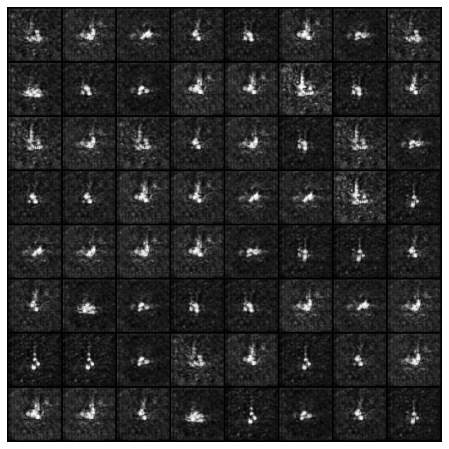

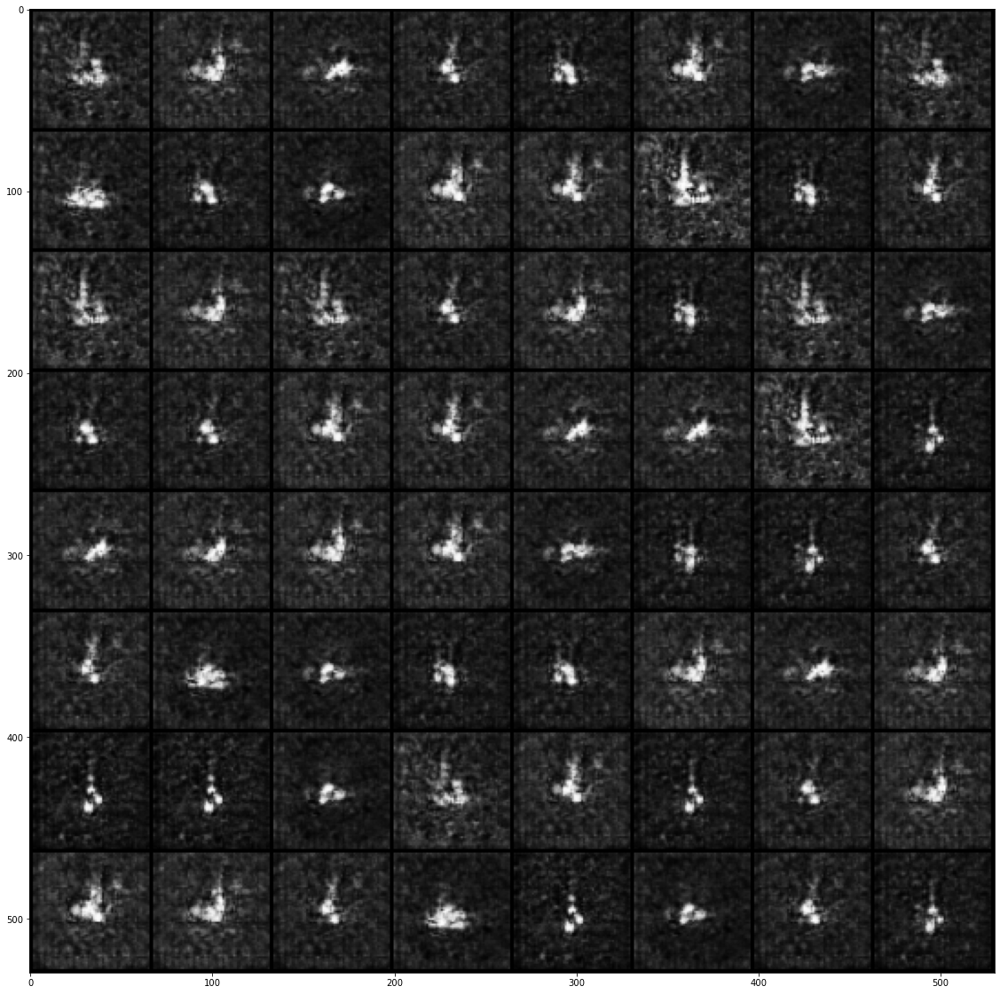

In [90]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)]
         for i in fake_img0_cpu]
ani0 = animation.ArtistAnimation(fig, ims, interval=1000,
                                       repeat_delay=1000, blit=True)

plt.figure(figsize=(20,20))
plt.imshow(np.transpose(fake_img0_cpu[-1],(1,2,0)), animated=True)
plt.savefig('./model_gan'+str(n_per_class)+'/Final_GAN_epoch'+str(n_epochs)+'_SLICY.png',
              format="png")

f = r"./model_gan"+str(n_per_class)+"/JCS_Final_GAN_SLICY_learn.mp4" 
writermp4 = animation.FFMpegWriter(fps=5,extra_args=['-acodec', 'libfaac',
                                         '-vcodec', 'mpeg4'])
ani0.save(f, writer=writermp4)

#### 2) class_label == 1, ZSU_23_4

In [62]:
t_indx = torch.nonzero(tr_lbl300==1).flatten()
gan_tr_data = 2*tr_data300[t_indx]-1
gan_tr_lbl = tr_lbl300[t_indx]

In [63]:
t1 = time()
netG_fit1, netD_fit1, G_losses1, D_losses1, fake_img1, fake_img_list1 = train_gan_model(gan_tr_data, gan_tr_lbl, num_nz=num_nz, 
                                            num_node=num_node,out_col = 1, num_epochs=n_epochs, batch_size=batch_size,
                                            lr_rate=lr, rec_step=rec_step)
t2 = time()
print("Time: ", t2 - t1)

torch.save(fake_img_list1, './model_gan'+str(n_per_class)+'/final_fake_gen_list_label_1_'+str(n_per_class)+'.pkl')
fake_img1_cpu = torch.load('./model_gan'+str(n_per_class)+'/final_fake_gen_list_label_1_'+str(n_per_class)+'.pkl')

Starting Training Loop...
[0/5000][0/3]	Loss_D: 1.3866	Loss_G: 1.3742	D(x): 0.4924	D(G(z)): 0.4924 / 0.4861
[6/5000][2/3]	Loss_D: 0.2744	Loss_G: 0.2236	D(x): 0.8835	D(G(z)): 0.1383 / 0.0934
[13/5000][1/3]	Loss_D: 0.0348	Loss_G: 0.0246	D(x): 0.9873	D(G(z)): 0.0218 / 0.0117
[20/5000][0/3]	Loss_D: 0.2984	Loss_G: 0.0184	D(x): 0.9859	D(G(z)): 0.2257 / 0.0041
[26/5000][2/3]	Loss_D: 0.6604	Loss_G: 0.0687	D(x): 0.9484	D(G(z)): 0.3665 / 0.0148
[33/5000][1/3]	Loss_D: 0.7385	Loss_G: 1.1060	D(x): 0.6476	D(G(z)): 0.2134 / 0.3955
[40/5000][0/3]	Loss_D: 1.1587	Loss_G: 0.3311	D(x): 0.9577	D(G(z)): 0.6007 / 0.2435
[46/5000][2/3]	Loss_D: 0.7687	Loss_G: 0.8370	D(x): 0.5844	D(G(z)): 0.1392 / 0.1928
[53/5000][1/3]	Loss_D: 0.8654	Loss_G: 0.6033	D(x): 0.6516	D(G(z)): 0.3067 / 0.1029
[60/5000][0/3]	Loss_D: 1.1158	Loss_G: 0.7967	D(x): 0.5749	D(G(z)): 0.4090 / 0.1865
[66/5000][2/3]	Loss_D: 1.0529	Loss_G: 0.3584	D(x): 0.7554	D(G(z)): 0.5166 / 0.0451
[73/5000][1/3]	Loss_D: 0.9958	Loss_G: 0.9645	D(x): 0.4799	D(G(z

[653/5000][1/3]	Loss_D: 0.1831	Loss_G: 0.1878	D(x): 0.8711	D(G(z)): 0.0352 / 0.0398
[660/5000][0/3]	Loss_D: 0.2170	Loss_G: 0.0245	D(x): 0.9849	D(G(z)): 0.1595 / 0.0089
[666/5000][2/3]	Loss_D: 0.1378	Loss_G: 0.0410	D(x): 0.9731	D(G(z)): 0.0956 / 0.0088
[673/5000][1/3]	Loss_D: 0.1271	Loss_G: 0.0795	D(x): 0.9412	D(G(z)): 0.0599 / 0.0160
[680/5000][0/3]	Loss_D: 0.0557	Loss_G: 0.0219	D(x): 0.9888	D(G(z)): 0.0414 / 0.0105
[686/5000][2/3]	Loss_D: 0.2329	Loss_G: 0.1425	D(x): 0.9522	D(G(z)): 0.1032 / 0.0232
[693/5000][1/3]	Loss_D: 0.1697	Loss_G: 0.0936	D(x): 0.9561	D(G(z)): 0.1098 / 0.0455
[700/5000][0/3]	Loss_D: 0.2510	Loss_G: 0.0267	D(x): 0.9882	D(G(z)): 0.1890 / 0.0147
[706/5000][2/3]	Loss_D: 0.0638	Loss_G: 0.0548	D(x): 0.9577	D(G(z)): 0.0195 / 0.0107
[713/5000][1/3]	Loss_D: 0.1096	Loss_G: 0.1014	D(x): 0.9333	D(G(z)): 0.0281 / 0.0209
[720/5000][0/3]	Loss_D: 0.1811	Loss_G: 0.1673	D(x): 0.8906	D(G(z)): 0.0545 / 0.0418
[726/5000][2/3]	Loss_D: 0.1346	Loss_G: 0.0836	D(x): 0.9340	D(G(z)): 0.0599 /

[1300/5000][0/3]	Loss_D: 0.0353	Loss_G: 0.0105	D(x): 0.9928	D(G(z)): 0.0253 / 0.0032
[1306/5000][2/3]	Loss_D: 0.0565	Loss_G: 0.0124	D(x): 0.9956	D(G(z)): 0.0486 / 0.0079
[1313/5000][1/3]	Loss_D: 1.4649	Loss_G: 1.4654	D(x): 0.4074	D(G(z)): 0.0001 / 0.0006
[1320/5000][0/3]	Loss_D: 0.1055	Loss_G: 0.1055	D(x): 0.9518	D(G(z)): 0.0019 / 0.0019
[1326/5000][2/3]	Loss_D: 1.1053	Loss_G: 1.1069	D(x): 0.9472	D(G(z)): 0.0077 / 0.0092
[1333/5000][1/3]	Loss_D: 0.3385	Loss_G: 0.3370	D(x): 0.9726	D(G(z)): 0.0068 / 0.0054
[1340/5000][0/3]	Loss_D: 0.2641	Loss_G: 0.2605	D(x): 0.9893	D(G(z)): 0.0089 / 0.0053
[1346/5000][2/3]	Loss_D: 0.0458	Loss_G: 0.0296	D(x): 0.9767	D(G(z)): 0.0212 / 0.0055
[1353/5000][1/3]	Loss_D: 0.0207	Loss_G: 0.0111	D(x): 0.9952	D(G(z)): 0.0149 / 0.0060
[1360/5000][0/3]	Loss_D: 0.0287	Loss_G: 0.0271	D(x): 0.9801	D(G(z)): 0.0072 / 0.0056
[1366/5000][2/3]	Loss_D: 0.0177	Loss_G: 0.0059	D(x): 0.9968	D(G(z)): 0.0130 / 0.0026
[1373/5000][1/3]	Loss_D: 0.0105	Loss_G: 0.0096	D(x): 0.9934	D(G(z

[1946/5000][2/3]	Loss_D: 0.0115	Loss_G: 0.0048	D(x): 0.9996	D(G(z)): 0.0110 / 0.0044
[1953/5000][1/3]	Loss_D: 0.0047	Loss_G: 0.0049	D(x): 0.9975	D(G(z)): 0.0021 / 0.0024
[1960/5000][0/3]	Loss_D: 0.0900	Loss_G: 0.0052	D(x): 0.9994	D(G(z)): 0.0768 / 0.0046
[1966/5000][2/3]	Loss_D: 0.0555	Loss_G: 0.0554	D(x): 0.9601	D(G(z)): 0.0101 / 0.0101
[1973/5000][1/3]	Loss_D: 0.0382	Loss_G: 0.0315	D(x): 0.9791	D(G(z)): 0.0155 / 0.0090
[1980/5000][0/3]	Loss_D: 0.0648	Loss_G: 0.0046	D(x): 0.9984	D(G(z)): 0.0548 / 0.0030
[1986/5000][2/3]	Loss_D: 0.0100	Loss_G: 0.0055	D(x): 0.9968	D(G(z)): 0.0067 / 0.0023
[1993/5000][1/3]	Loss_D: 0.2838	Loss_G: 0.0022	D(x): 0.9982	D(G(z)): 0.1592 / 0.0004
[2000/5000][0/3]	Loss_D: 0.0170	Loss_G: 0.0166	D(x): 0.9871	D(G(z)): 0.0021 / 0.0017
[2006/5000][2/3]	Loss_D: 0.0213	Loss_G: 0.0133	D(x): 0.9924	D(G(z)): 0.0134 / 0.0056
[2013/5000][1/3]	Loss_D: 3.1786	Loss_G: 3.1698	D(x): 0.2351	D(G(z)): 0.0085 / 0.0002
[2020/5000][0/3]	Loss_D: 0.1448	Loss_G: 0.1197	D(x): 0.9693	D(G(z

[2593/5000][1/3]	Loss_D: 0.0031	Loss_G: 0.0030	D(x): 0.9990	D(G(z)): 0.0021 / 0.0020
[2600/5000][0/3]	Loss_D: 0.0160	Loss_G: 0.0160	D(x): 0.9869	D(G(z)): 0.0024 / 0.0024
[2606/5000][2/3]	Loss_D: 0.0973	Loss_G: 0.1043	D(x): 0.9278	D(G(z)): 0.0020 / 0.0089
[2613/5000][1/3]	Loss_D: 0.0113	Loss_G: 0.0074	D(x): 0.9968	D(G(z)): 0.0080 / 0.0042
[2620/5000][0/3]	Loss_D: 0.0116	Loss_G: 0.0027	D(x): 0.9996	D(G(z)): 0.0109 / 0.0023
[2626/5000][2/3]	Loss_D: 0.0046	Loss_G: 0.0031	D(x): 0.9983	D(G(z)): 0.0028 / 0.0014
[2633/5000][1/3]	Loss_D: 0.0341	Loss_G: 0.0325	D(x): 0.9854	D(G(z)): 0.0044 / 0.0028
[2640/5000][0/3]	Loss_D: 0.5311	Loss_G: 0.5491	D(x): 0.9609	D(G(z)): 0.0055 / 0.0229
[2646/5000][2/3]	Loss_D: 0.0336	Loss_G: 0.0148	D(x): 0.9970	D(G(z)): 0.0300 / 0.0116
[2653/5000][1/3]	Loss_D: 0.0221	Loss_G: 0.0085	D(x): 0.9992	D(G(z)): 0.0209 / 0.0077
[2660/5000][0/3]	Loss_D: 0.4072	Loss_G: 0.3910	D(x): 0.9916	D(G(z)): 0.0219 / 0.0063
[2666/5000][2/3]	Loss_D: 0.0168	Loss_G: 0.0116	D(x): 0.9932	D(G(z

[3240/5000][0/3]	Loss_D: 0.8280	Loss_G: 0.0020	D(x): 0.9983	D(G(z)): 0.3542 / 0.0002
[3246/5000][2/3]	Loss_D: 0.0515	Loss_G: 0.0366	D(x): 0.9741	D(G(z)): 0.0239 / 0.0095
[3253/5000][1/3]	Loss_D: 0.0274	Loss_G: 0.0184	D(x): 0.9904	D(G(z)): 0.0170 / 0.0083
[3260/5000][0/3]	Loss_D: 0.0207	Loss_G: 0.0142	D(x): 0.9925	D(G(z)): 0.0127 / 0.0063
[3266/5000][2/3]	Loss_D: 0.0262	Loss_G: 0.0126	D(x): 0.9962	D(G(z)): 0.0219 / 0.0085
[3273/5000][1/3]	Loss_D: 0.0676	Loss_G: 0.0056	D(x): 0.9992	D(G(z)): 0.0582 / 0.0047
[3280/5000][0/3]	Loss_D: 0.0336	Loss_G: 0.0067	D(x): 0.9974	D(G(z)): 0.0290 / 0.0040
[3286/5000][2/3]	Loss_D: 0.0115	Loss_G: 0.0089	D(x): 0.9972	D(G(z)): 0.0086 / 0.0060
[3293/5000][1/3]	Loss_D: 0.0225	Loss_G: 0.0186	D(x): 0.9901	D(G(z)): 0.0121 / 0.0082
[3300/5000][0/3]	Loss_D: 0.0127	Loss_G: 0.0077	D(x): 0.9997	D(G(z)): 0.0122 / 0.0073
[3306/5000][2/3]	Loss_D: 0.0021	Loss_G: 0.0017	D(x): 0.9996	D(G(z)): 0.0018 / 0.0013
[3313/5000][1/3]	Loss_D: 0.0180	Loss_G: 0.0031	D(x): 0.9993	D(G(z

[3886/5000][2/3]	Loss_D: 0.0024	Loss_G: 0.0019	D(x): 0.9998	D(G(z)): 0.0022 / 0.0017
[3893/5000][1/3]	Loss_D: 0.0068	Loss_G: 0.0060	D(x): 0.9956	D(G(z)): 0.0021 / 0.0013
[3900/5000][0/3]	Loss_D: 0.0088	Loss_G: 0.0020	D(x): 0.9996	D(G(z)): 0.0080 / 0.0015
[3906/5000][2/3]	Loss_D: 0.0055	Loss_G: 0.0028	D(x): 0.9990	D(G(z)): 0.0045 / 0.0017
[3913/5000][1/3]	Loss_D: 0.0060	Loss_G: 0.0033	D(x): 0.9997	D(G(z)): 0.0057 / 0.0030
[3920/5000][0/3]	Loss_D: 0.0581	Loss_G: 0.0037	D(x): 0.9996	D(G(z)): 0.0544 / 0.0033
[3926/5000][2/3]	Loss_D: 0.0407	Loss_G: 0.0092	D(x): 0.9935	D(G(z)): 0.0322 / 0.0019
[3933/5000][1/3]	Loss_D: 0.0351	Loss_G: 0.0232	D(x): 0.9862	D(G(z)): 0.0172 / 0.0056
[3940/5000][0/3]	Loss_D: 0.0208	Loss_G: 0.0091	D(x): 0.9997	D(G(z)): 0.0201 / 0.0088
[3946/5000][2/3]	Loss_D: 0.6020	Loss_G: 2.5570	D(x): 0.6750	D(G(z)): 0.0051 / 0.6060
[3953/5000][1/3]	Loss_D: 0.0093	Loss_G: 0.0059	D(x): 0.9993	D(G(z)): 0.0086 / 0.0052
[3960/5000][0/3]	Loss_D: 0.0091	Loss_G: 0.0057	D(x): 0.9960	D(G(z

[4533/5000][1/3]	Loss_D: 0.0186	Loss_G: 0.0188	D(x): 0.9886	D(G(z)): 0.0010 / 0.0011
[4540/5000][0/3]	Loss_D: 0.0022	Loss_G: 0.0022	D(x): 0.9993	D(G(z)): 0.0015 / 0.0014
[4546/5000][2/3]	Loss_D: 0.0216	Loss_G: 0.0024	D(x): 0.9997	D(G(z)): 0.0206 / 0.0022
[4553/5000][1/3]	Loss_D: 0.0046	Loss_G: 0.0037	D(x): 0.9989	D(G(z)): 0.0035 / 0.0026
[4560/5000][0/3]	Loss_D: 0.0104	Loss_G: 0.0084	D(x): 0.9945	D(G(z)): 0.0026 / 0.0007
[4566/5000][2/3]	Loss_D: 0.0062	Loss_G: 0.0014	D(x): 0.9999	D(G(z)): 0.0059 / 0.0013
[4573/5000][1/3]	Loss_D: 0.0256	Loss_G: 0.0014	D(x): 0.9997	D(G(z)): 0.0242 / 0.0012
[4580/5000][0/3]	Loss_D: 0.0087	Loss_G: 0.0022	D(x): 0.9987	D(G(z)): 0.0069 / 0.0009
[4586/5000][2/3]	Loss_D: 0.0121	Loss_G: 0.0027	D(x): 0.9997	D(G(z)): 0.0116 / 0.0024
[4593/5000][1/3]	Loss_D: 0.0088	Loss_G: 0.0046	D(x): 0.9987	D(G(z)): 0.0074 / 0.0033
[4600/5000][0/3]	Loss_D: 0.1452	Loss_G: 0.1140	D(x): 0.9914	D(G(z)): 0.0304 / 0.0012
[4606/5000][2/3]	Loss_D: 0.9733	Loss_G: 0.8484	D(x): 0.8001	D(G(z

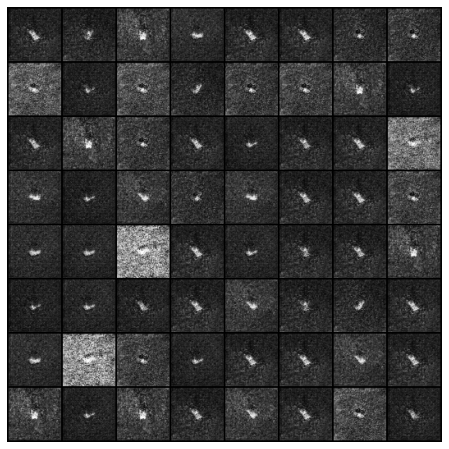

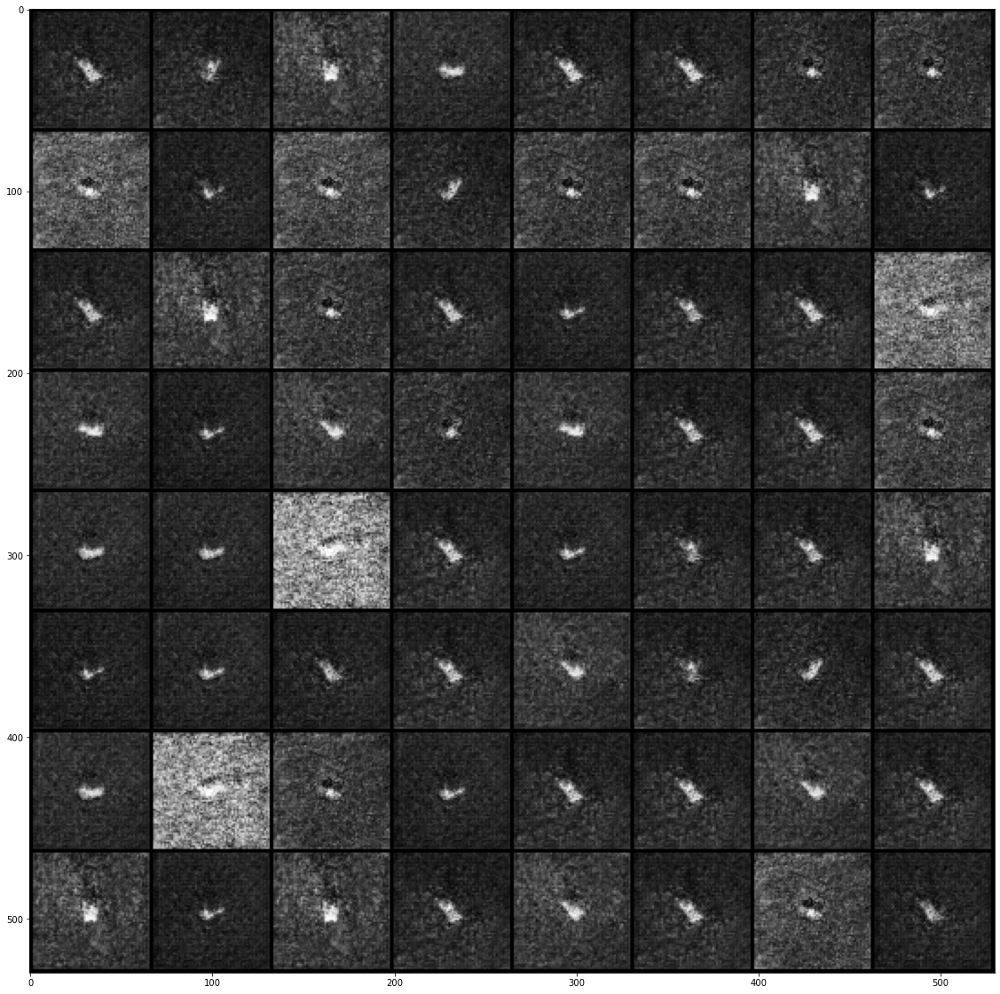

In [91]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)]
         for i in fake_img1_cpu]
ani1 = animation.ArtistAnimation(fig, ims, interval=1000,
                                       repeat_delay=1000, blit=True)

plt.figure(figsize=(20,20))
plt.imshow(np.transpose(fake_img1_cpu[-1],(1,2,0)), animated=True)
plt.savefig('./model_gan'+str(n_per_class)+'/Final_GAN_epoch'+str(n_epochs)+'_ZSU_23_4.png',
              format="png")

f = r"./model_gan"+str(n_per_class)+"/JCS_Final_GAN_ZSU_23_4_learn.mp4" 
writermp4 = animation.FFMpegWriter(fps=5,extra_args=['-acodec', 'libfaac',
                                         '-vcodec', 'mpeg4']) 
ani1.save(f, writer=writermp4)   

#### 3) class_label == 2, T62

In [65]:
t_indx = torch.nonzero(tr_lbl300==2).flatten()
gan_tr_data = 2*tr_data300[t_indx]-1
gan_tr_lbl = tr_lbl300[t_indx]

In [66]:
t1 = time()
netG_fit2, netD_fit2, G_losses2, D_losses2, fake_img2, fake_img_list2 = train_gan_model(gan_tr_data, gan_tr_lbl, num_nz=num_nz, 
                                            num_node=num_node, out_col = 1, num_epochs=n_epochs, batch_size=batch_size,
                                            lr_rate=lr, rec_step=rec_step)
t2 = time()
print("Time: ", t2 - t1)

torch.save(fake_img_list2, './model_gan'+str(n_per_class)+'/final_fake_gen_list_label_2'+str(n_per_class)+'.pkl')
fake_img2_cpu = torch.load('./model_gan'+str(n_per_class)+'/final_fake_gen_list_label_2'+str(n_per_class)+'.pkl')

Starting Training Loop...
[0/5000][0/3]	Loss_D: 1.3853	Loss_G: 1.3732	D(x): 0.5002	D(G(z)): 0.4997 / 0.4936
[6/5000][2/3]	Loss_D: 0.2705	Loss_G: 0.2200	D(x): 0.8899	D(G(z)): 0.1414 / 0.0972
[13/5000][1/3]	Loss_D: 0.0454	Loss_G: 0.0388	D(x): 0.9751	D(G(z)): 0.0199 / 0.0134
[20/5000][0/3]	Loss_D: 0.0416	Loss_G: 0.1631	D(x): 0.9645	D(G(z)): 0.0052 / 0.1058
[26/5000][2/3]	Loss_D: 0.6011	Loss_G: 0.5200	D(x): 0.6571	D(G(z)): 0.1531 / 0.0821
[33/5000][1/3]	Loss_D: 0.7113	Loss_G: 0.2587	D(x): 0.8437	D(G(z)): 0.3930 / 0.0813
[40/5000][0/3]	Loss_D: 0.4498	Loss_G: 0.3260	D(x): 0.8181	D(G(z)): 0.1909 / 0.1033
[46/5000][2/3]	Loss_D: 0.6449	Loss_G: 0.2564	D(x): 0.8471	D(G(z)): 0.3521 / 0.0721
[53/5000][1/3]	Loss_D: 0.8373	Loss_G: 0.2335	D(x): 0.8338	D(G(z)): 0.4515 / 0.0360
[60/5000][0/3]	Loss_D: 1.3410	Loss_G: 1.3654	D(x): 0.4769	D(G(z)): 0.1749 / 0.1919
[66/5000][2/3]	Loss_D: 0.8334	Loss_G: 0.8315	D(x): 0.5658	D(G(z)): 0.0948 / 0.0928
[73/5000][1/3]	Loss_D: 0.5808	Loss_G: 0.4155	D(x): 0.7982	D(G(z

[653/5000][1/3]	Loss_D: 0.0816	Loss_G: 0.0372	D(x): 0.9766	D(G(z)): 0.0519 / 0.0128
[660/5000][0/3]	Loss_D: 0.1768	Loss_G: 0.0129	D(x): 0.9908	D(G(z)): 0.1377 / 0.0036
[666/5000][2/3]	Loss_D: 0.0743	Loss_G: 0.0560	D(x): 0.9638	D(G(z)): 0.0350 / 0.0182
[673/5000][1/3]	Loss_D: 0.0613	Loss_G: 0.0426	D(x): 0.9680	D(G(z)): 0.0270 / 0.0093
[680/5000][0/3]	Loss_D: 0.0694	Loss_G: 0.0159	D(x): 0.9910	D(G(z)): 0.0549 / 0.0068
[686/5000][2/3]	Loss_D: 0.1009	Loss_G: 0.1082	D(x): 0.9134	D(G(z)): 0.0050 / 0.0122
[693/5000][1/3]	Loss_D: 0.1096	Loss_G: 0.0199	D(x): 0.9866	D(G(z)): 0.0704 / 0.0061
[700/5000][0/3]	Loss_D: 0.1556	Loss_G: 0.0055	D(x): 0.9968	D(G(z)): 0.1219 / 0.0022
[706/5000][2/3]	Loss_D: 0.0462	Loss_G: 0.0264	D(x): 0.9816	D(G(z)): 0.0268 / 0.0076
[713/5000][1/3]	Loss_D: 0.0626	Loss_G: 0.0609	D(x): 0.9578	D(G(z)): 0.0175 / 0.0159
[720/5000][0/3]	Loss_D: 0.0634	Loss_G: 0.0304	D(x): 0.9803	D(G(z)): 0.0395 / 0.0100
[726/5000][2/3]	Loss_D: 0.1401	Loss_G: 0.2085	D(x): 0.8969	D(G(z)): 0.0124 /

[1300/5000][0/3]	Loss_D: 0.0786	Loss_G: 0.0772	D(x): 0.9526	D(G(z)): 0.0053 / 0.0038
[1306/5000][2/3]	Loss_D: 0.0558	Loss_G: 0.0105	D(x): 0.9963	D(G(z)): 0.0468 / 0.0068
[1313/5000][1/3]	Loss_D: 0.0195	Loss_G: 0.0173	D(x): 0.9904	D(G(z)): 0.0096 / 0.0075
[1320/5000][0/3]	Loss_D: 0.0197	Loss_G: 0.0169	D(x): 0.9894	D(G(z)): 0.0088 / 0.0062
[1326/5000][2/3]	Loss_D: 0.4485	Loss_G: 0.3271	D(x): 0.8152	D(G(z)): 0.1828 / 0.0863
[1333/5000][1/3]	Loss_D: 0.0480	Loss_G: 0.0401	D(x): 0.9706	D(G(z)): 0.0160 / 0.0083
[1340/5000][0/3]	Loss_D: 0.0443	Loss_G: 0.0338	D(x): 0.9815	D(G(z)): 0.0250 / 0.0147
[1346/5000][2/3]	Loss_D: 0.0247	Loss_G: 0.0165	D(x): 0.9917	D(G(z)): 0.0160 / 0.0080
[1353/5000][1/3]	Loss_D: 0.0159	Loss_G: 0.0135	D(x): 0.9913	D(G(z)): 0.0070 / 0.0047
[1360/5000][0/3]	Loss_D: 0.0344	Loss_G: 0.0104	D(x): 0.9959	D(G(z)): 0.0288 / 0.0063
[1366/5000][2/3]	Loss_D: 0.0204	Loss_G: 0.0133	D(x): 0.9910	D(G(z)): 0.0110 / 0.0043
[1373/5000][1/3]	Loss_D: 0.0274	Loss_G: 0.0279	D(x): 0.9789	D(G(z

[1946/5000][2/3]	Loss_D: 0.1228	Loss_G: 0.1214	D(x): 0.9381	D(G(z)): 0.0061 / 0.0046
[1953/5000][1/3]	Loss_D: 0.0114	Loss_G: 0.0104	D(x): 0.9955	D(G(z)): 0.0067 / 0.0057
[1960/5000][0/3]	Loss_D: 0.0119	Loss_G: 0.0061	D(x): 0.9995	D(G(z)): 0.0114 / 0.0056
[1966/5000][2/3]	Loss_D: 0.0080	Loss_G: 0.0048	D(x): 0.9991	D(G(z)): 0.0071 / 0.0040
[1973/5000][1/3]	Loss_D: 0.0114	Loss_G: 0.0088	D(x): 0.9954	D(G(z)): 0.0054 / 0.0027
[1980/5000][0/3]	Loss_D: 0.0032	Loss_G: 0.0023	D(x): 0.9991	D(G(z)): 0.0023 / 0.0015
[1986/5000][2/3]	Loss_D: 0.0033	Loss_G: 0.0025	D(x): 1.0000	D(G(z)): 0.0033 / 0.0024
[1993/5000][1/3]	Loss_D: 0.0030	Loss_G: 0.0020	D(x): 0.9999	D(G(z)): 0.0029 / 0.0020
[2000/5000][0/3]	Loss_D: 0.0014	Loss_G: 0.0008	D(x): 0.9998	D(G(z)): 0.0012 / 0.0006
[2006/5000][2/3]	Loss_D: 0.0012	Loss_G: 0.0010	D(x): 0.9996	D(G(z)): 0.0008 / 0.0007
[2013/5000][1/3]	Loss_D: 0.0009	Loss_G: 0.0009	D(x): 0.9993	D(G(z)): 0.0002 / 0.0002
[2020/5000][0/3]	Loss_D: 0.0020	Loss_G: 0.0008	D(x): 0.9997	D(G(z

[2593/5000][1/3]	Loss_D: 0.0088	Loss_G: 0.0064	D(x): 0.9999	D(G(z)): 0.0086 / 0.0063
[2600/5000][0/3]	Loss_D: 0.0382	Loss_G: 0.0384	D(x): 0.9735	D(G(z)): 0.0044 / 0.0046
[2606/5000][2/3]	Loss_D: 0.0392	Loss_G: 0.0105	D(x): 0.9966	D(G(z)): 0.0342 / 0.0070
[2613/5000][1/3]	Loss_D: 0.0391	Loss_G: 0.0235	D(x): 0.9921	D(G(z)): 0.0296 / 0.0144
[2620/5000][0/3]	Loss_D: 0.1605	Loss_G: 0.0006	D(x): 0.9998	D(G(z)): 0.1285 / 0.0004
[2626/5000][2/3]	Loss_D: 0.0351	Loss_G: 0.0203	D(x): 0.9874	D(G(z)): 0.0206 / 0.0067
[2633/5000][1/3]	Loss_D: 0.0053	Loss_G: 0.0052	D(x): 0.9971	D(G(z)): 0.0023 / 0.0022
[2640/5000][0/3]	Loss_D: 0.0732	Loss_G: 0.0760	D(x): 0.9783	D(G(z)): 0.0066 / 0.0094
[2646/5000][2/3]	Loss_D: 0.0452	Loss_G: 0.0362	D(x): 0.9756	D(G(z)): 0.0179 / 0.0091
[2653/5000][1/3]	Loss_D: 0.0353	Loss_G: 0.0349	D(x): 0.9822	D(G(z)): 0.0114 / 0.0110
[2660/5000][0/3]	Loss_D: 0.0068	Loss_G: 0.0052	D(x): 0.9981	D(G(z)): 0.0049 / 0.0032
[2666/5000][2/3]	Loss_D: 0.0229	Loss_G: 0.0044	D(x): 0.9984	D(G(z

[3240/5000][0/3]	Loss_D: 0.0105	Loss_G: 0.0097	D(x): 1.0000	D(G(z)): 0.0103 / 0.0095
[3246/5000][2/3]	Loss_D: 0.0378	Loss_G: 0.0352	D(x): 0.9793	D(G(z)): 0.0109 / 0.0085
[3253/5000][1/3]	Loss_D: 0.0154	Loss_G: 0.0075	D(x): 0.9997	D(G(z)): 0.0147 / 0.0071
[3260/5000][0/3]	Loss_D: 0.0363	Loss_G: 0.0102	D(x): 0.9945	D(G(z)): 0.0287 / 0.0045
[3266/5000][2/3]	Loss_D: 0.0147	Loss_G: 0.0064	D(x): 0.9975	D(G(z)): 0.0120 / 0.0039
[3273/5000][1/3]	Loss_D: 0.0466	Loss_G: 0.0257	D(x): 0.9947	D(G(z)): 0.0388 / 0.0189
[3280/5000][0/3]	Loss_D: 0.0371	Loss_G: 0.0344	D(x): 0.9766	D(G(z)): 0.0074 / 0.0047
[3286/5000][2/3]	Loss_D: 0.0872	Loss_G: 0.0754	D(x): 0.9690	D(G(z)): 0.0404 / 0.0293
[3293/5000][1/3]	Loss_D: 0.0296	Loss_G: 0.0202	D(x): 0.9936	D(G(z)): 0.0217 / 0.0126
[3300/5000][0/3]	Loss_D: 0.0361	Loss_G: 0.0150	D(x): 0.9944	D(G(z)): 0.0291 / 0.0090
[3306/5000][2/3]	Loss_D: 0.1163	Loss_G: 0.0860	D(x): 0.9782	D(G(z)): 0.0436 / 0.0155
[3313/5000][1/3]	Loss_D: 0.0173	Loss_G: 0.0116	D(x): 0.9970	D(G(z

[3886/5000][2/3]	Loss_D: 0.0437	Loss_G: 0.0451	D(x): 0.9811	D(G(z)): 0.0040 / 0.0054
[3893/5000][1/3]	Loss_D: 0.0063	Loss_G: 0.0038	D(x): 0.9998	D(G(z)): 0.0061 / 0.0036
[3900/5000][0/3]	Loss_D: 0.0091	Loss_G: 0.0050	D(x): 0.9997	D(G(z)): 0.0087 / 0.0047
[3906/5000][2/3]	Loss_D: 0.1057	Loss_G: 0.1058	D(x): 0.9773	D(G(z)): 0.0022 / 0.0023
[3913/5000][1/3]	Loss_D: 0.0084	Loss_G: 0.0085	D(x): 0.9951	D(G(z)): 0.0028 / 0.0030
[3920/5000][0/3]	Loss_D: 0.0311	Loss_G: 0.0066	D(x): 0.9950	D(G(z)): 0.0244 / 0.0016
[3926/5000][2/3]	Loss_D: 0.0231	Loss_G: 0.0131	D(x): 0.9984	D(G(z)): 0.0213 / 0.0115
[3933/5000][1/3]	Loss_D: 0.0510	Loss_G: 0.0154	D(x): 0.9957	D(G(z)): 0.0431 / 0.0104
[3940/5000][0/3]	Loss_D: 0.0143	Loss_G: 0.0111	D(x): 0.9959	D(G(z)): 0.0100 / 0.0069
[3946/5000][2/3]	Loss_D: 0.0234	Loss_G: 0.0233	D(x): 0.9820	D(G(z)): 0.0027 / 0.0026
[3953/5000][1/3]	Loss_D: 0.0863	Loss_G: 0.0544	D(x): 0.9837	D(G(z)): 0.0661 / 0.0360
[3960/5000][0/3]	Loss_D: 0.0435	Loss_G: 0.0152	D(x): 0.9979	D(G(z

[4533/5000][1/3]	Loss_D: 0.0178	Loss_G: 0.0150	D(x): 0.9947	D(G(z)): 0.0124 / 0.0096
[4540/5000][0/3]	Loss_D: 0.0089	Loss_G: 0.0077	D(x): 0.9983	D(G(z)): 0.0071 / 0.0060
[4546/5000][2/3]	Loss_D: 0.0367	Loss_G: 0.0244	D(x): 0.9877	D(G(z)): 0.0212 / 0.0094
[4553/5000][1/3]	Loss_D: 0.0061	Loss_G: 0.0058	D(x): 0.9989	D(G(z)): 0.0050 / 0.0047
[4560/5000][0/3]	Loss_D: 0.0267	Loss_G: 0.0139	D(x): 0.9906	D(G(z)): 0.0159 / 0.0042
[4566/5000][2/3]	Loss_D: 0.0058	Loss_G: 0.0049	D(x): 0.9974	D(G(z)): 0.0032 / 0.0023
[4573/5000][1/3]	Loss_D: 0.0089	Loss_G: 0.0053	D(x): 0.9989	D(G(z)): 0.0076 / 0.0041
[4580/5000][0/3]	Loss_D: 0.0065	Loss_G: 0.0057	D(x): 0.9988	D(G(z)): 0.0052 / 0.0045
[4586/5000][2/3]	Loss_D: 0.2578	Loss_G: 0.2584	D(x): 0.9132	D(G(z)): 0.0013 / 0.0019
[4593/5000][1/3]	Loss_D: 0.0060	Loss_G: 0.0058	D(x): 0.9983	D(G(z)): 0.0043 / 0.0040
[4600/5000][0/3]	Loss_D: 0.0109	Loss_G: 0.0087	D(x): 0.9955	D(G(z)): 0.0059 / 0.0037
[4606/5000][2/3]	Loss_D: 0.0094	Loss_G: 0.0083	D(x): 0.9964	D(G(z

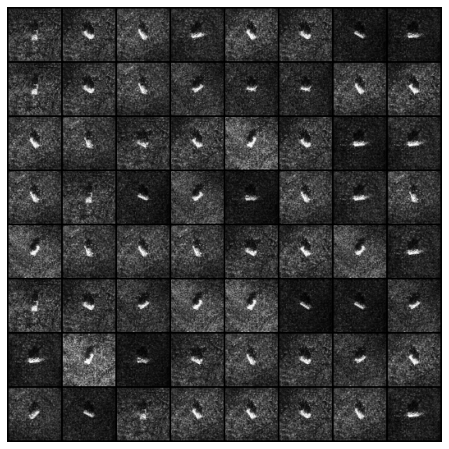

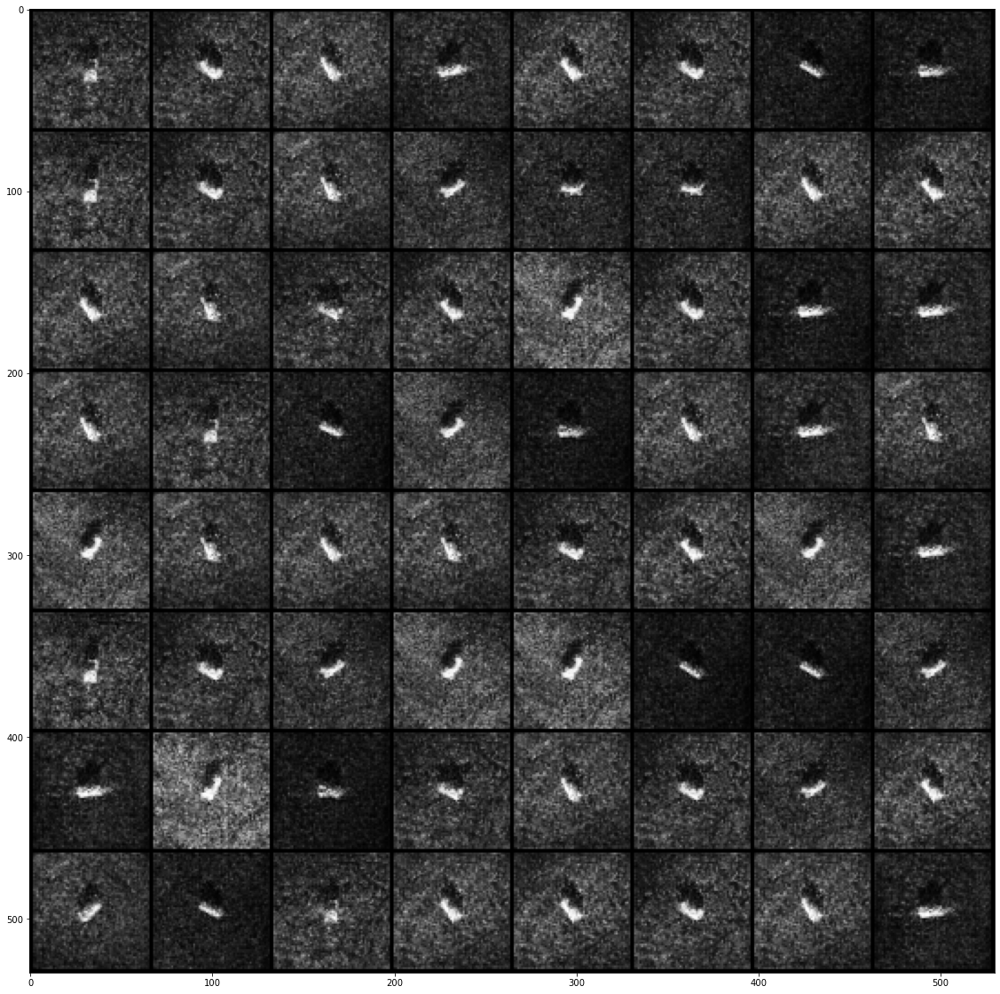

In [92]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)]
         for i in fake_img2_cpu]
ani2 = animation.ArtistAnimation(fig, ims, interval=1000,
                                       repeat_delay=1000, blit=True)

plt.figure(figsize=(20,20))
plt.imshow(np.transpose(fake_img2_cpu[-1],(1,2,0)), animated=True)
plt.savefig('./model_gan'+str(n_per_class)+'/Final_GAN_epoch'+str(n_epochs)+'_T62.png',
               format="png")

f = r"./model_gan"+str(n_per_class)+"/JCS_Final_GAN_T62_learn.mp4" 
writermp4 = animation.FFMpegWriter(fps=5,extra_args=['-acodec', 'libfaac',
                                         '-vcodec', 'mpeg4']) 
ani2.save(f, writer=writermp4)          

#### 4) class_label == 3, 2S1

In [79]:
t_indx = torch.nonzero(tr_lbl300==3).flatten()
gan_tr_data = 2*tr_data300[t_indx]-1
gan_tr_lbl = tr_lbl300[t_indx]

In [80]:
t1 = time()
netG_fit3, netD_fit3, G_losses3, D_losses3, fake_img3, fake_img_list3 = train_gan_model(gan_tr_data, gan_tr_lbl, num_nz=num_nz, num_node=num_node,
                    out_col = 1, num_epochs=n_epochs, batch_size=batch_size,
                    lr_rate=lr, rec_step=rec_step)
t2 = time()
print("Time: ", t2 - t1)

torch.save(fake_img_list3, './model_gan'+str(n_per_class)+'/final_fake_gen_list_label_3'+str(n_per_class)+'.pkl')
fake_img3_cpu = torch.load('./model_gan'+str(n_per_class)+'/final_fake_gen_list_label_3'+str(n_per_class)+'.pkl')

Starting Training Loop...
[0/5000][0/3]	Loss_D: 1.3867	Loss_G: 1.3767	D(x): 0.4904	D(G(z)): 0.4904 / 0.4852
[6/5000][2/3]	Loss_D: 0.5562	Loss_G: 0.4190	D(x): 0.7612	D(G(z)): 0.2389 / 0.1287
[13/5000][1/3]	Loss_D: 0.0701	Loss_G: 0.0526	D(x): 0.9615	D(G(z)): 0.0296 / 0.0125
[20/5000][0/3]	Loss_D: 0.0349	Loss_G: 0.0289	D(x): 0.9749	D(G(z)): 0.0090 / 0.0031
[26/5000][2/3]	Loss_D: 0.1963	Loss_G: 0.0633	D(x): 0.9728	D(G(z)): 0.1260 / 0.0306
[33/5000][1/3]	Loss_D: 0.5889	Loss_G: 0.2025	D(x): 0.8410	D(G(z)): 0.3201 / 0.0177
[40/5000][0/3]	Loss_D: 0.0940	Loss_G: 0.0450	D(x): 0.9775	D(G(z)): 0.0672 / 0.0217
[46/5000][2/3]	Loss_D: 0.8797	Loss_G: 0.2730	D(x): 0.9078	D(G(z)): 0.4438 / 0.1463
[53/5000][1/3]	Loss_D: 0.9423	Loss_G: 1.2224	D(x): 0.4974	D(G(z)): 0.0604 / 0.2483
[60/5000][0/3]	Loss_D: 0.6982	Loss_G: 0.2960	D(x): 0.8157	D(G(z)): 0.3334 / 0.0488
[66/5000][2/3]	Loss_D: 1.6805	Loss_G: 0.2211	D(x): 0.8417	D(G(z)): 0.7116 / 0.0276
[73/5000][1/3]	Loss_D: 0.7567	Loss_G: 0.1817	D(x): 0.8593	D(G(z

[653/5000][1/3]	Loss_D: 0.1757	Loss_G: 0.0678	D(x): 0.9483	D(G(z)): 0.1002 / 0.0094
[660/5000][0/3]	Loss_D: 0.1562	Loss_G: 0.0646	D(x): 0.9463	D(G(z)): 0.0852 / 0.0061
[666/5000][2/3]	Loss_D: 0.1109	Loss_G: 0.1073	D(x): 0.9068	D(G(z)): 0.0073 / 0.0037
[673/5000][1/3]	Loss_D: 0.1008	Loss_G: 0.0930	D(x): 0.9232	D(G(z)): 0.0175 / 0.0098
[680/5000][0/3]	Loss_D: 0.2565	Loss_G: 0.0127	D(x): 0.9920	D(G(z)): 0.1814 / 0.0046
[686/5000][2/3]	Loss_D: 0.2104	Loss_G: 0.0535	D(x): 0.9578	D(G(z)): 0.1208 / 0.0071
[693/5000][1/3]	Loss_D: 0.0550	Loss_G: 0.0446	D(x): 0.9662	D(G(z)): 0.0185 / 0.0086
[700/5000][0/3]	Loss_D: 0.0799	Loss_G: 0.0265	D(x): 0.9800	D(G(z)): 0.0534 / 0.0057
[706/5000][2/3]	Loss_D: 0.1259	Loss_G: 0.0821	D(x): 0.9332	D(G(z)): 0.0467 / 0.0080
[713/5000][1/3]	Loss_D: 0.0943	Loss_G: 0.0568	D(x): 0.9597	D(G(z)): 0.0461 / 0.0131
[720/5000][0/3]	Loss_D: 0.1779	Loss_G: 0.0542	D(x): 0.9601	D(G(z)): 0.0999 / 0.0114
[726/5000][2/3]	Loss_D: 0.2679	Loss_G: 0.7289	D(x): 0.8283	D(G(z)): 0.0206 /

[1300/5000][0/3]	Loss_D: 0.0123	Loss_G: 0.0098	D(x): 0.9921	D(G(z)): 0.0040 / 0.0016
[1306/5000][2/3]	Loss_D: 0.0079	Loss_G: 0.0046	D(x): 0.9973	D(G(z)): 0.0051 / 0.0019
[1313/5000][1/3]	Loss_D: 0.0423	Loss_G: 0.0136	D(x): 0.9899	D(G(z)): 0.0298 / 0.0032
[1320/5000][0/3]	Loss_D: 0.1421	Loss_G: 0.0060	D(x): 0.9950	D(G(z)): 0.0699 / 0.0009
[1326/5000][2/3]	Loss_D: 0.0600	Loss_G: 0.0594	D(x): 0.9587	D(G(z)): 0.0045 / 0.0039
[1333/5000][1/3]	Loss_D: 0.0659	Loss_G: 0.0150	D(x): 0.9886	D(G(z)): 0.0462 / 0.0014
[1340/5000][0/3]	Loss_D: 0.0139	Loss_G: 0.0107	D(x): 0.9924	D(G(z)): 0.0061 / 0.0030
[1346/5000][2/3]	Loss_D: 0.0096	Loss_G: 0.0079	D(x): 0.9940	D(G(z)): 0.0035 / 0.0018
[1353/5000][1/3]	Loss_D: 0.0136	Loss_G: 0.0063	D(x): 0.9960	D(G(z)): 0.0090 / 0.0021
[1360/5000][0/3]	Loss_D: 0.0656	Loss_G: 0.0048	D(x): 0.9957	D(G(z)): 0.0507 / 0.0004
[1366/5000][2/3]	Loss_D: 0.1129	Loss_G: 0.1263	D(x): 0.9182	D(G(z)): 0.0114 / 0.0236
[1373/5000][1/3]	Loss_D: 0.0414	Loss_G: 0.0316	D(x): 0.9756	D(G(z

[1946/5000][2/3]	Loss_D: 0.1160	Loss_G: 0.1316	D(x): 0.9205	D(G(z)): 0.0012 / 0.0153
[1953/5000][1/3]	Loss_D: 0.0095	Loss_G: 0.0055	D(x): 0.9967	D(G(z)): 0.0061 / 0.0022
[1960/5000][0/3]	Loss_D: 0.0167	Loss_G: 0.0077	D(x): 0.9954	D(G(z)): 0.0116 / 0.0030
[1966/5000][2/3]	Loss_D: 0.0392	Loss_G: 0.0074	D(x): 0.9932	D(G(z)): 0.0280 / 0.0004
[1973/5000][1/3]	Loss_D: 0.0382	Loss_G: 0.0124	D(x): 0.9937	D(G(z)): 0.0308 / 0.0059
[1980/5000][0/3]	Loss_D: 0.0192	Loss_G: 0.0173	D(x): 0.9875	D(G(z)): 0.0061 / 0.0042
[1986/5000][2/3]	Loss_D: 0.0261	Loss_G: 0.0244	D(x): 0.9805	D(G(z)): 0.0058 / 0.0041
[1993/5000][1/3]	Loss_D: 0.0108	Loss_G: 0.0063	D(x): 0.9967	D(G(z)): 0.0074 / 0.0030
[2000/5000][0/3]	Loss_D: 0.0079	Loss_G: 0.0060	D(x): 0.9974	D(G(z)): 0.0053 / 0.0034
[2006/5000][2/3]	Loss_D: 0.2655	Loss_G: 0.1892	D(x): 0.9317	D(G(z)): 0.0519 / 0.0022
[2013/5000][1/3]	Loss_D: 0.0110	Loss_G: 0.0062	D(x): 0.9963	D(G(z)): 0.0070 / 0.0023
[2020/5000][0/3]	Loss_D: 0.0138	Loss_G: 0.0095	D(x): 0.9924	D(G(z

[2593/5000][1/3]	Loss_D: 0.0166	Loss_G: 0.0022	D(x): 0.9998	D(G(z)): 0.0160 / 0.0020
[2600/5000][0/3]	Loss_D: 0.0076	Loss_G: 0.0049	D(x): 0.9980	D(G(z)): 0.0055 / 0.0028
[2606/5000][2/3]	Loss_D: 0.0014	Loss_G: 0.0006	D(x): 0.9997	D(G(z)): 0.0012 / 0.0003
[2613/5000][1/3]	Loss_D: 0.0270	Loss_G: 0.0031	D(x): 0.9972	D(G(z)): 0.0217 / 0.0002
[2620/5000][0/3]	Loss_D: 0.1849	Loss_G: 0.0645	D(x): 0.9922	D(G(z)): 0.0952 / 0.0002
[2626/5000][2/3]	Loss_D: 0.0327	Loss_G: 0.0149	D(x): 0.9896	D(G(z)): 0.0208 / 0.0035
[2633/5000][1/3]	Loss_D: 0.0295	Loss_G: 0.0274	D(x): 0.9902	D(G(z)): 0.0055 / 0.0034
[2640/5000][0/3]	Loss_D: 0.0087	Loss_G: 0.0071	D(x): 0.9964	D(G(z)): 0.0050 / 0.0034
[2646/5000][2/3]	Loss_D: 1.0195	Loss_G: 5.6124	D(x): 0.5252	D(G(z)): 0.0019 / 0.9578
[2653/5000][1/3]	Loss_D: 0.0740	Loss_G: 0.0420	D(x): 0.9776	D(G(z)): 0.0368 / 0.0061
[2660/5000][0/3]	Loss_D: 0.1062	Loss_G: 0.1042	D(x): 0.9387	D(G(z)): 0.0047 / 0.0027
[2666/5000][2/3]	Loss_D: 0.0194	Loss_G: 0.0087	D(x): 0.9964	D(G(z

[3240/5000][0/3]	Loss_D: 0.0055	Loss_G: 0.0050	D(x): 0.9975	D(G(z)): 0.0030 / 0.0024
[3246/5000][2/3]	Loss_D: 0.5185	Loss_G: 0.1821	D(x): 0.9490	D(G(z)): 0.1489 / 0.0003
[3253/5000][1/3]	Loss_D: 0.0117	Loss_G: 0.0094	D(x): 0.9956	D(G(z)): 0.0071 / 0.0047
[3260/5000][0/3]	Loss_D: 0.0068	Loss_G: 0.0047	D(x): 0.9993	D(G(z)): 0.0060 / 0.0039
[3266/5000][2/3]	Loss_D: 0.0273	Loss_G: 0.0071	D(x): 0.9959	D(G(z)): 0.0217 / 0.0027
[3273/5000][1/3]	Loss_D: 0.0983	Loss_G: 0.0019	D(x): 0.9999	D(G(z)): 0.0550 / 0.0018
[3280/5000][0/3]	Loss_D: 0.0269	Loss_G: 0.0267	D(x): 0.9814	D(G(z)): 0.0027 / 0.0025
[3286/5000][2/3]	Loss_D: 0.0568	Loss_G: 0.0037	D(x): 0.9983	D(G(z)): 0.0417 / 0.0020
[3293/5000][1/3]	Loss_D: 0.0045	Loss_G: 0.0028	D(x): 0.9999	D(G(z)): 0.0044 / 0.0027
[3300/5000][0/3]	Loss_D: 0.0036	Loss_G: 0.0035	D(x): 0.9978	D(G(z)): 0.0013 / 0.0013
[3306/5000][2/3]	Loss_D: 0.0028	Loss_G: 0.0020	D(x): 0.9992	D(G(z)): 0.0020 / 0.0012
[3313/5000][1/3]	Loss_D: 0.0076	Loss_G: 0.0050	D(x): 0.9973	D(G(z

[3886/5000][2/3]	Loss_D: 0.0227	Loss_G: 0.0172	D(x): 0.9884	D(G(z)): 0.0092 / 0.0039
[3893/5000][1/3]	Loss_D: 0.0208	Loss_G: 0.0169	D(x): 0.9897	D(G(z)): 0.0090 / 0.0052
[3900/5000][0/3]	Loss_D: 0.1899	Loss_G: 0.0009	D(x): 0.9998	D(G(z)): 0.1199 / 0.0007
[3906/5000][2/3]	Loss_D: 0.0037	Loss_G: 0.0028	D(x): 0.9996	D(G(z)): 0.0033 / 0.0024
[3913/5000][1/3]	Loss_D: 0.0323	Loss_G: 0.0306	D(x): 0.9915	D(G(z)): 0.0077 / 0.0060
[3920/5000][0/3]	Loss_D: 0.0072	Loss_G: 0.0065	D(x): 0.9957	D(G(z)): 0.0028 / 0.0021
[3926/5000][2/3]	Loss_D: 0.5395	Loss_G: 0.5303	D(x): 0.8772	D(G(z)): 0.0184 / 0.0100
[3933/5000][1/3]	Loss_D: 0.0555	Loss_G: 0.0554	D(x): 0.9767	D(G(z)): 0.0009 / 0.0008
[3940/5000][0/3]	Loss_D: 0.0196	Loss_G: 0.0165	D(x): 0.9943	D(G(z)): 0.0099 / 0.0071
[3946/5000][2/3]	Loss_D: 0.6609	Loss_G: 0.6609	D(x): 0.9051	D(G(z)): 0.0099 / 0.0099
[3953/5000][1/3]	Loss_D: 0.0187	Loss_G: 0.0155	D(x): 0.9898	D(G(z)): 0.0080 / 0.0048
[3960/5000][0/3]	Loss_D: 0.0104	Loss_G: 0.0089	D(x): 0.9979	D(G(z

[4533/5000][1/3]	Loss_D: 0.0264	Loss_G: 0.0238	D(x): 0.9820	D(G(z)): 0.0075 / 0.0049
[4540/5000][0/3]	Loss_D: 0.0203	Loss_G: 0.0085	D(x): 0.9983	D(G(z)): 0.0180 / 0.0068
[4546/5000][2/3]	Loss_D: 0.3173	Loss_G: 0.8706	D(x): 0.7966	D(G(z)): 0.0035 / 0.2435
[4553/5000][1/3]	Loss_D: 0.0446	Loss_G: 0.0344	D(x): 0.9921	D(G(z)): 0.0145 / 0.0048
[4560/5000][0/3]	Loss_D: 0.0047	Loss_G: 0.0048	D(x): 0.9977	D(G(z)): 0.0024 / 0.0025
[4566/5000][2/3]	Loss_D: 0.0098	Loss_G: 0.0098	D(x): 0.9926	D(G(z)): 0.0022 / 0.0022
[4573/5000][1/3]	Loss_D: 0.0086	Loss_G: 0.0058	D(x): 0.9996	D(G(z)): 0.0081 / 0.0054
[4580/5000][0/3]	Loss_D: 0.0060	Loss_G: 0.0045	D(x): 0.9992	D(G(z)): 0.0052 / 0.0037
[4586/5000][2/3]	Loss_D: 0.0073	Loss_G: 0.0035	D(x): 0.9993	D(G(z)): 0.0065 / 0.0027
[4593/5000][1/3]	Loss_D: 0.0436	Loss_G: 0.0427	D(x): 0.9846	D(G(z)): 0.0050 / 0.0041
[4600/5000][0/3]	Loss_D: 0.0138	Loss_G: 0.0045	D(x): 0.9996	D(G(z)): 0.0126 / 0.0040
[4606/5000][2/3]	Loss_D: 0.0489	Loss_G: 0.0027	D(x): 0.9984	D(G(z

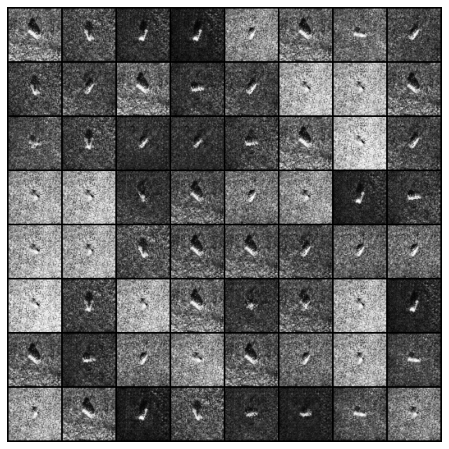

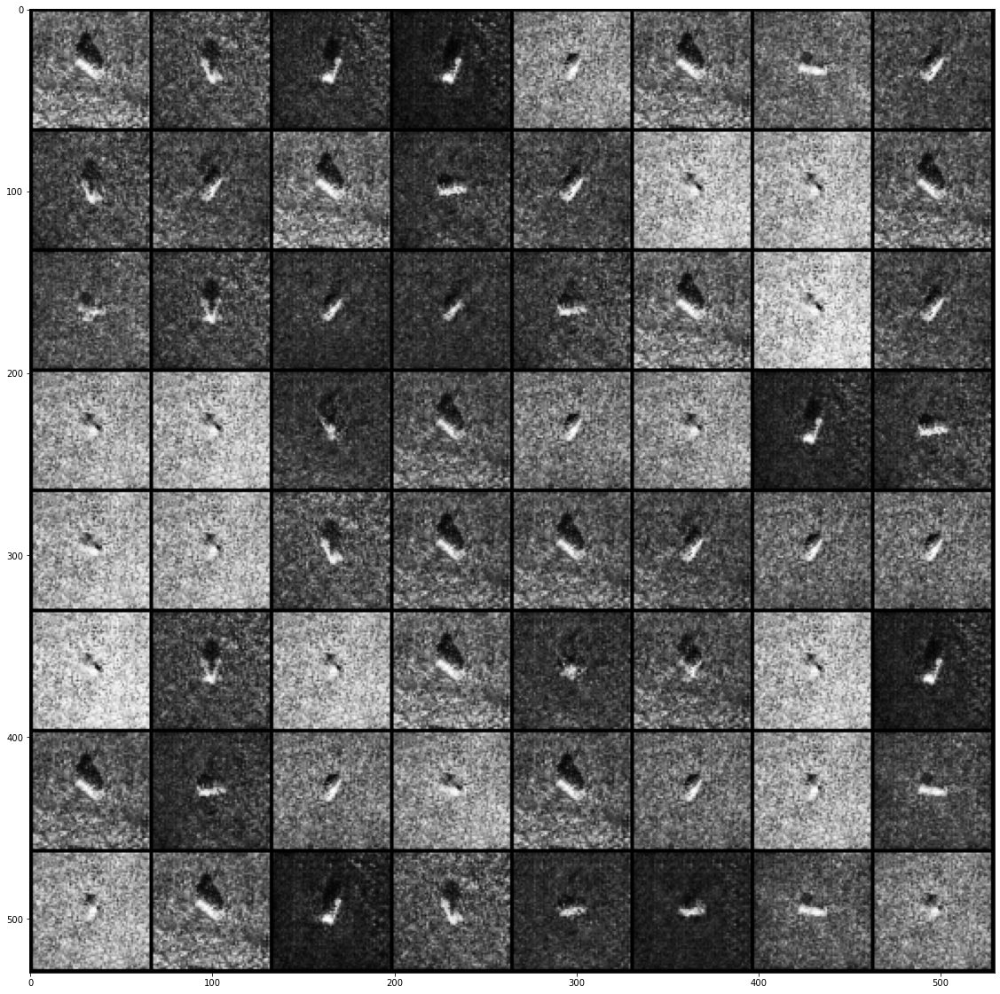

In [93]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)]
         for i in fake_img3_cpu]
ani3 = animation.ArtistAnimation(fig, ims, interval=1000,
                                       repeat_delay=1000, blit=True)

plt.figure(figsize=(20,20))
plt.imshow(np.transpose(fake_img3_cpu[-1],(1,2,0)), animated=True)
plt.savefig('./model_gan'+str(n_per_class)+'/Final_GAN_epoch'+str(n_epochs)+'_2S1.png',
              format="png")

f = r"./model_gan"+str(n_per_class)+"/JCS_Final_GAN_2S1_learn.mp4" 
writermp4 = animation.FFMpegWriter(fps=5,extra_args=['-acodec', 'libfaac',
                                         '-vcodec', 'mpeg4']) 
ani3.save(f, writer=writermp4)

#### 5) class_label == 4, BRDM_2

In [71]:
# class_label == 4
t_indx = torch.nonzero(tr_lbl300==4).flatten()
gan_tr_data = 2*tr_data300[t_indx]-1
gan_tr_lbl = tr_lbl300[t_indx]

In [72]:
t1 = time()
netG_fit4, netD_fit4, G_losses4, D_losses4, fake_img4, fake_img_list4 = train_gan_model(gan_tr_data, gan_tr_lbl, num_nz=num_nz, 
                                      num_node=num_node,out_col = 1, num_epochs=n_epochs, batch_size=batch_size,
                                                                                        lr_rate=lr, rec_step=rec_step)
t2 = time()
print("Time: ", t2 - t1)

torch.save(fake_img_list4, './model_gan'+str(n_per_class)+'/final_fake_gen_list_label_4'+str(n_per_class)+'.pkl')
fake_img4_cpu = torch.load('./model_gan'+str(n_per_class)+'/final_fake_gen_list_label_4'+str(n_per_class)+'.pkl')

Starting Training Loop...
[0/5000][0/3]	Loss_D: 1.3865	Loss_G: 1.3743	D(x): 0.5016	D(G(z)): 0.5017 / 0.4956
[6/5000][2/3]	Loss_D: 0.5363	Loss_G: 0.4290	D(x): 0.7726	D(G(z)): 0.2364 / 0.1534
[13/5000][1/3]	Loss_D: 0.3874	Loss_G: 0.3958	D(x): 0.7427	D(G(z)): 0.0681 / 0.0760
[20/5000][0/3]	Loss_D: 0.9788	Loss_G: 0.1636	D(x): 0.8970	D(G(z)): 0.4612 / 0.0475
[26/5000][2/3]	Loss_D: 0.2627	Loss_G: 0.1006	D(x): 0.9593	D(G(z)): 0.1706 / 0.0542
[33/5000][1/3]	Loss_D: 0.4430	Loss_G: 0.4341	D(x): 0.7387	D(G(z)): 0.0495 / 0.0421
[40/5000][0/3]	Loss_D: 1.0781	Loss_G: 0.0740	D(x): 0.9423	D(G(z)): 0.4326 / 0.0100
[46/5000][2/3]	Loss_D: 1.7635	Loss_G: 0.1260	D(x): 0.9116	D(G(z)): 0.7207 / 0.0277
[53/5000][1/3]	Loss_D: 0.5492	Loss_G: 0.4184	D(x): 0.7296	D(G(z)): 0.1703 / 0.0604
[60/5000][0/3]	Loss_D: 0.5130	Loss_G: 0.5058	D(x): 0.6558	D(G(z)): 0.0283 / 0.0213
[66/5000][2/3]	Loss_D: 1.2300	Loss_G: 0.1975	D(x): 0.8448	D(G(z)): 0.5914 / 0.0110
[73/5000][1/3]	Loss_D: 0.4814	Loss_G: 0.4514	D(x): 0.6992	D(G(z

[653/5000][1/3]	Loss_D: 0.1054	Loss_G: 0.0372	D(x): 0.9684	D(G(z)): 0.0649 / 0.0036
[660/5000][0/3]	Loss_D: 0.0920	Loss_G: 0.0721	D(x): 0.9457	D(G(z)): 0.0297 / 0.0115
[666/5000][2/3]	Loss_D: 0.1028	Loss_G: 0.0467	D(x): 0.9592	D(G(z)): 0.0543 / 0.0036
[673/5000][1/3]	Loss_D: 0.0701	Loss_G: 0.0494	D(x): 0.9591	D(G(z)): 0.0243 / 0.0049
[680/5000][0/3]	Loss_D: 0.0620	Loss_G: 0.0166	D(x): 0.9926	D(G(z)): 0.0484 / 0.0089
[686/5000][2/3]	Loss_D: 0.1699	Loss_G: 0.1860	D(x): 0.8683	D(G(z)): 0.0072 / 0.0226
[693/5000][1/3]	Loss_D: 0.0501	Loss_G: 0.0398	D(x): 0.9714	D(G(z)): 0.0189 / 0.0091
[700/5000][0/3]	Loss_D: 0.0942	Loss_G: 0.0735	D(x): 0.9422	D(G(z)): 0.0292 / 0.0094
[706/5000][2/3]	Loss_D: 0.0625	Loss_G: 0.0264	D(x): 0.9790	D(G(z)): 0.0377 / 0.0040
[713/5000][1/3]	Loss_D: 0.0741	Loss_G: 0.0675	D(x): 0.9441	D(G(z)): 0.0100 / 0.0036
[720/5000][0/3]	Loss_D: 0.0758	Loss_G: 0.0710	D(x): 0.9426	D(G(z)): 0.0104 / 0.0060
[726/5000][2/3]	Loss_D: 0.0904	Loss_G: 0.0701	D(x): 0.9422	D(G(z)): 0.0258 /

[1300/5000][0/3]	Loss_D: 0.0067	Loss_G: 0.0033	D(x): 0.9980	D(G(z)): 0.0045 / 0.0012
[1306/5000][2/3]	Loss_D: 0.0522	Loss_G: 0.0499	D(x): 0.9632	D(G(z)): 0.0041 / 0.0019
[1313/5000][1/3]	Loss_D: 0.0027	Loss_G: 0.0027	D(x): 0.9989	D(G(z)): 0.0016 / 0.0015
[1320/5000][0/3]	Loss_D: 0.0189	Loss_G: 0.0145	D(x): 0.9873	D(G(z)): 0.0058 / 0.0015
[1326/5000][2/3]	Loss_D: 0.0237	Loss_G: 0.0093	D(x): 0.9919	D(G(z)): 0.0148 / 0.0011
[1333/5000][1/3]	Loss_D: 0.0166	Loss_G: 0.0034	D(x): 0.9989	D(G(z)): 0.0141 / 0.0023
[1340/5000][0/3]	Loss_D: 0.0694	Loss_G: 0.0254	D(x): 0.9796	D(G(z)): 0.0357 / 0.0016
[1346/5000][2/3]	Loss_D: 0.0593	Loss_G: 0.0085	D(x): 0.9946	D(G(z)): 0.0476 / 0.0030
[1353/5000][1/3]	Loss_D: 0.0188	Loss_G: 0.0117	D(x): 0.9920	D(G(z)): 0.0104 / 0.0036
[1360/5000][0/3]	Loss_D: 0.0402	Loss_G: 0.0049	D(x): 0.9969	D(G(z)): 0.0321 / 0.0018
[1366/5000][2/3]	Loss_D: 0.0369	Loss_G: 0.0193	D(x): 0.9848	D(G(z)): 0.0198 / 0.0037
[1373/5000][1/3]	Loss_D: 0.0096	Loss_G: 0.0046	D(x): 0.9971	D(G(z

[1946/5000][2/3]	Loss_D: 0.0306	Loss_G: 0.0012	D(x): 0.9994	D(G(z)): 0.0268 / 0.0006
[1953/5000][1/3]	Loss_D: 0.0477	Loss_G: 0.0050	D(x): 0.9974	D(G(z)): 0.0394 / 0.0023
[1960/5000][0/3]	Loss_D: 0.0092	Loss_G: 0.0091	D(x): 0.9928	D(G(z)): 0.0013 / 0.0012
[1966/5000][2/3]	Loss_D: 0.0156	Loss_G: 0.0147	D(x): 0.9866	D(G(z)): 0.0017 / 0.0009
[1973/5000][1/3]	Loss_D: 0.0121	Loss_G: 0.0102	D(x): 0.9924	D(G(z)): 0.0028 / 0.0009
[1980/5000][0/3]	Loss_D: 0.2801	Loss_G: 0.2803	D(x): 0.9458	D(G(z)): 0.0001 / 0.0004
[1986/5000][2/3]	Loss_D: 0.1205	Loss_G: 0.0010	D(x): 0.9993	D(G(z)): 0.1027 / 0.0003
[1993/5000][1/3]	Loss_D: 0.0124	Loss_G: 0.0065	D(x): 0.9960	D(G(z)): 0.0081 / 0.0023
[2000/5000][0/3]	Loss_D: 0.0268	Loss_G: 0.0263	D(x): 0.9816	D(G(z)): 0.0018 / 0.0014
[2006/5000][2/3]	Loss_D: 0.0200	Loss_G: 0.0032	D(x): 0.9987	D(G(z)): 0.0180 / 0.0019
[2013/5000][1/3]	Loss_D: 0.0072	Loss_G: 0.0027	D(x): 0.9992	D(G(z)): 0.0063 / 0.0018
[2020/5000][0/3]	Loss_D: 0.1305	Loss_G: 0.1299	D(x): 0.9269	D(G(z

[2593/5000][1/3]	Loss_D: 0.0086	Loss_G: 0.0052	D(x): 0.9968	D(G(z)): 0.0051 / 0.0019
[2600/5000][0/3]	Loss_D: 0.0072	Loss_G: 0.0037	D(x): 0.9979	D(G(z)): 0.0050 / 0.0015
[2606/5000][2/3]	Loss_D: 0.2498	Loss_G: 0.2503	D(x): 0.9242	D(G(z)): 0.0009 / 0.0014
[2613/5000][1/3]	Loss_D: 0.0413	Loss_G: 0.0410	D(x): 0.9663	D(G(z)): 0.0014 / 0.0011
[2620/5000][0/3]	Loss_D: 0.0141	Loss_G: 0.0028	D(x): 0.9997	D(G(z)): 0.0133 / 0.0024
[2626/5000][2/3]	Loss_D: 0.1784	Loss_G: 0.0634	D(x): 0.9797	D(G(z)): 0.1052 / 0.0123
[2633/5000][1/3]	Loss_D: 0.0329	Loss_G: 0.0165	D(x): 0.9926	D(G(z)): 0.0235 / 0.0076
[2640/5000][0/3]	Loss_D: 0.0092	Loss_G: 0.0060	D(x): 0.9982	D(G(z)): 0.0073 / 0.0042
[2646/5000][2/3]	Loss_D: 0.0285	Loss_G: 0.0153	D(x): 0.9912	D(G(z)): 0.0189 / 0.0060
[2653/5000][1/3]	Loss_D: 0.0089	Loss_G: 0.0081	D(x): 0.9940	D(G(z)): 0.0027 / 0.0019
[2660/5000][0/3]	Loss_D: 0.0142	Loss_G: 0.0097	D(x): 0.9973	D(G(z)): 0.0112 / 0.0069
[2666/5000][2/3]	Loss_D: 0.0034	Loss_G: 0.0028	D(x): 0.9984	D(G(z

[3240/5000][0/3]	Loss_D: 0.0681	Loss_G: 0.0702	D(x): 0.9658	D(G(z)): 0.0050 / 0.0071
[3246/5000][2/3]	Loss_D: 0.0162	Loss_G: 0.0043	D(x): 0.9975	D(G(z)): 0.0131 / 0.0018
[3253/5000][1/3]	Loss_D: 0.0496	Loss_G: 0.0010	D(x): 0.9996	D(G(z)): 0.0431 / 0.0006
[3260/5000][0/3]	Loss_D: 0.0291	Loss_G: 0.0029	D(x): 0.9980	D(G(z)): 0.0235 / 0.0009
[3266/5000][2/3]	Loss_D: 0.0182	Loss_G: 0.0183	D(x): 0.9851	D(G(z)): 0.0021 / 0.0021
[3273/5000][1/3]	Loss_D: 0.0078	Loss_G: 0.0056	D(x): 0.9957	D(G(z)): 0.0033 / 0.0011
[3280/5000][0/3]	Loss_D: 0.0755	Loss_G: 0.0016	D(x): 0.9993	D(G(z)): 0.0477 / 0.0010
[3286/5000][2/3]	Loss_D: 0.0049	Loss_G: 0.0049	D(x): 0.9959	D(G(z)): 0.0007 / 0.0007
[3293/5000][1/3]	Loss_D: 0.0081	Loss_G: 0.0089	D(x): 0.9943	D(G(z)): 0.0006 / 0.0015
[3300/5000][0/3]	Loss_D: 0.0050	Loss_G: 0.0040	D(x): 0.9977	D(G(z)): 0.0026 / 0.0016
[3306/5000][2/3]	Loss_D: 0.0083	Loss_G: 0.0078	D(x): 0.9933	D(G(z)): 0.0011 / 0.0007
[3313/5000][1/3]	Loss_D: 0.0129	Loss_G: 0.0064	D(x): 0.9967	D(G(z

[3886/5000][2/3]	Loss_D: 0.0113	Loss_G: 0.0024	D(x): 0.9993	D(G(z)): 0.0102 / 0.0016
[3893/5000][1/3]	Loss_D: 0.0018	Loss_G: 0.0016	D(x): 0.9999	D(G(z)): 0.0017 / 0.0015
[3900/5000][0/3]	Loss_D: 0.1138	Loss_G: 0.1015	D(x): 0.9888	D(G(z)): 0.0129 / 0.0012
[3906/5000][2/3]	Loss_D: 0.0469	Loss_G: 0.0516	D(x): 0.9581	D(G(z)): 0.0006 / 0.0052
[3913/5000][1/3]	Loss_D: 0.0276	Loss_G: 0.0270	D(x): 0.9858	D(G(z)): 0.0020 / 0.0014
[3920/5000][0/3]	Loss_D: 0.0294	Loss_G: 0.0025	D(x): 0.9979	D(G(z)): 0.0222 / 0.0004
[3926/5000][2/3]	Loss_D: 0.0049	Loss_G: 0.0023	D(x): 0.9998	D(G(z)): 0.0047 / 0.0020
[3933/5000][1/3]	Loss_D: 0.0071	Loss_G: 0.0065	D(x): 0.9962	D(G(z)): 0.0024 / 0.0018
[3940/5000][0/3]	Loss_D: 0.0179	Loss_G: 0.0011	D(x): 0.9998	D(G(z)): 0.0165 / 0.0009
[3946/5000][2/3]	Loss_D: 0.0110	Loss_G: 0.0099	D(x): 0.9926	D(G(z)): 0.0029 / 0.0019
[3953/5000][1/3]	Loss_D: 0.0147	Loss_G: 0.0023	D(x): 0.9994	D(G(z)): 0.0133 / 0.0017
[3960/5000][0/3]	Loss_D: 0.0391	Loss_G: 0.0060	D(x): 0.9953	D(G(z

[4533/5000][1/3]	Loss_D: 0.0300	Loss_G: 0.0277	D(x): 0.9775	D(G(z)): 0.0049 / 0.0027
[4540/5000][0/3]	Loss_D: 0.0084	Loss_G: 0.0082	D(x): 0.9933	D(G(z)): 0.0011 / 0.0010
[4546/5000][2/3]	Loss_D: 0.0250	Loss_G: 0.0062	D(x): 0.9949	D(G(z)): 0.0180 / 0.0010
[4553/5000][1/3]	Loss_D: 0.0032	Loss_G: 0.0030	D(x): 0.9985	D(G(z)): 0.0016 / 0.0014
[4560/5000][0/3]	Loss_D: 0.0654	Loss_G: 0.0559	D(x): 0.9746	D(G(z)): 0.0132 / 0.0051
[4566/5000][2/3]	Loss_D: 0.0485	Loss_G: 0.0485	D(x): 0.9573	D(G(z)): 0.0005 / 0.0005
[4573/5000][1/3]	Loss_D: 0.0087	Loss_G: 0.0021	D(x): 0.9999	D(G(z)): 0.0082 / 0.0019
[4580/5000][0/3]	Loss_D: 0.0032	Loss_G: 0.0031	D(x): 0.9973	D(G(z)): 0.0005 / 0.0004
[4586/5000][2/3]	Loss_D: 0.0083	Loss_G: 0.0019	D(x): 0.9997	D(G(z)): 0.0078 / 0.0017
[4593/5000][1/3]	Loss_D: 0.0036	Loss_G: 0.0014	D(x): 0.9996	D(G(z)): 0.0032 / 0.0010
[4600/5000][0/3]	Loss_D: 0.0027	Loss_G: 0.0015	D(x): 0.9996	D(G(z)): 0.0023 / 0.0011
[4606/5000][2/3]	Loss_D: 0.0222	Loss_G: 0.0006	D(x): 1.0000	D(G(z

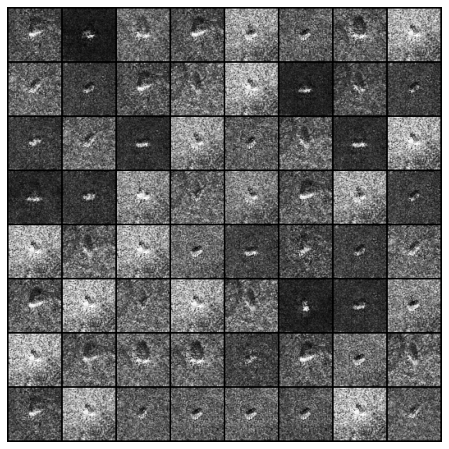

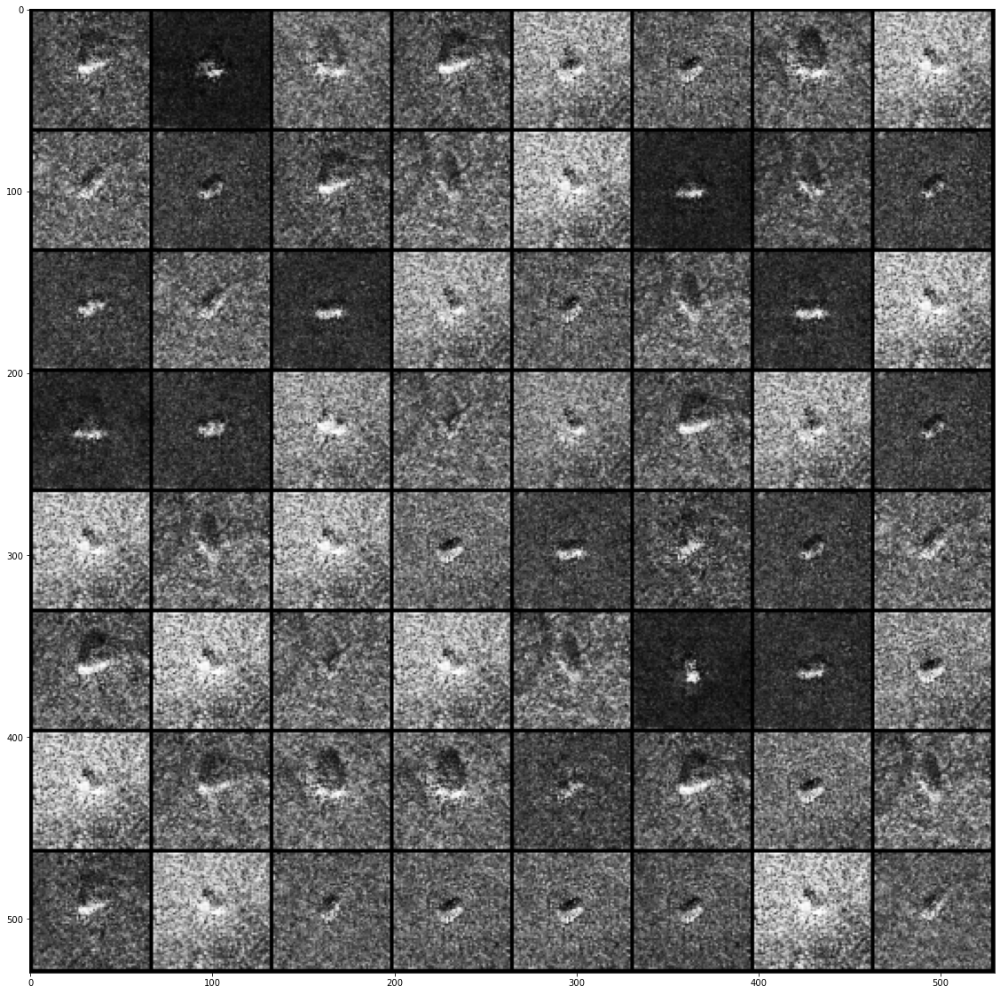

In [94]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)]
         for i in fake_img4_cpu]
ani4 = animation.ArtistAnimation(fig, ims, interval=1000,
                                       repeat_delay=1000, blit=True)

plt.figure(figsize=(20,20))
plt.imshow(np.transpose(fake_img4_cpu[-1],(1,2,0)), animated=True)
plt.savefig('./model_gan'+str(n_per_class)+'/Final_GAN_epoch'+str(n_epochs)+'_BRDM_2.png',
              format="png")

f = r"./model_gan"+str(n_per_class)+"/JCS_Final_GAN_BRDM_2_learn.mp4" 
writermp4 = animation.FFMpegWriter(fps=5,extra_args=['-acodec', 'libfaac',
                                         '-vcodec', 'mpeg4']) 
ani4.save(f, writer=writermp4)

In [84]:
# DCGAN Model Save
torch.save(netG_fit0.state_dict(),
             './model_gan'+str(n_per_class)+'/netG_label_0_'+str(n_per_class)+'.pkl')
torch.save(netG_fit1.state_dict(),
             './model_gan'+str(n_per_class)+'/netG_label_1_'+str(n_per_class)+'.pkl')
torch.save(netG_fit2.state_dict(),
             './model_gan'+str(n_per_class)+'/netG_label_2_'+str(n_per_class)+'.pkl')
torch.save(netG_fit3.state_dict(),
             './model_gan'+str(n_per_class)+'/netG_label_3_'+str(n_per_class)+'.pkl')
torch.save(netG_fit4.state_dict(),
             './model_gan'+str(n_per_class)+'/netG_label_4_'+str(n_per_class)+'.pkl')

In [85]:
# Generate fake samples
num_nz = 512 #생성기의 입력 난수의 차원
num_sz = 512
num_node = 64
out_col = 1

#label==0
num_fake = 7*n_per_class
latent_z = torch.randn((num_fake,num_sz,1,1))

netG_lbl_0 = Generator(num_nz, out_col, num_node).to('cpu')
netG_lbl_0.load_state_dict(torch.load('./model_gan'+str(n_per_class)+'/netG_label_0_'+str(n_per_class)+'.pkl'))
netG_lbl_0.eval()
fake_image_0 = netG_lbl_0(latent_z).detach() #noise z를 넣어 G로 생성된 이미지
fake_lbl_0 = torch.zeros(num_fake, dtype=torch.int64)

#label==1
netG_lbl_1 = Generator(num_nz, out_col, num_node).to('cpu')
netG_lbl_1.load_state_dict(
       torch.load('./model_gan'+str(n_per_class)+'/netG_label_1_'+str(n_per_class)+'.pkl'))
netG_lbl_1.eval()
fake_image_1 = netG_lbl_1(latent_z).detach()
fake_lbl_1 = torch.ones(num_fake, dtype=torch.int64)

#label==2
netG_lbl_2 = Generator(num_nz, out_col, num_node).to('cpu')
netG_lbl_2.load_state_dict(torch.load('./model_gan'+str(n_per_class)+'/netG_label_2_'+str(n_per_class)+'.pkl'))
netG_lbl_2.eval()
fake_image_2 = netG_lbl_2(latent_z).detach()
fake_lbl_2 = torch.ones(num_fake, dtype=torch.int64)*2

#label==3
netG_lbl_3 = Generator(num_nz, out_col, num_node).to('cpu')
netG_lbl_3.load_state_dict(torch.load('./model_gan'+str(n_per_class)+'/netG_label_3_'+str(n_per_class)+'.pkl'))
netG_lbl_3.eval()
fake_image_3 = netG_lbl_3(latent_z).detach()
fake_lbl_3 = torch.ones(num_fake, dtype=torch.int64)*3

#label==4
netG_lbl_4 = Generator(num_nz, out_col, num_node).to('cpu')
netG_lbl_4.load_state_dict(torch.load('./model_gan'+str(n_per_class)+'/netG_label_4_'+str(n_per_class)+'.pkl'))
netG_lbl_4.eval()
fake_image_4 = netG_lbl_4(latent_z).detach()
fake_lbl_4 = torch.ones(num_fake, dtype=torch.int64)*4

only_gan_dat = torch.cat([fake_image_0,fake_image_1, fake_image_2,
                                   fake_image_3,fake_image_4])
only_gan_lbl = torch.cat([fake_lbl_0, fake_lbl_1, fake_lbl_2,
                                   fake_lbl_3, fake_lbl_4])

tr_gan_dat = torch.cat([tr_data300, only_gan_dat]) #기존 이미지 + gan 이미지
tr_gan_lbl = torch.cat([tr_lbl300, only_gan_lbl])

In [89]:
gan_img_save_path = os.path.join('./img_out'+str(n_per_class), 'img_out_gan'+str(n_per_class)+'/')
os.makedirs(gan_img_save_path) #img_out300/img_out_gan300

export_images(gan_img_save_path,'mstar_gan',
                (only_gan_dat*0.5)+0.5, only_gan_lbl, class_label)

In [86]:
print('train300: GAN 증강 후 데이터 개수\n')
for i in range(5):
    print(class_label[i],': ',(tr_gan_lbl==i).sum().item())
print('\n합계: ', tr_gan_dat.shape[0])

train300: GAN 증강 후 데이터 개수

SLICY :  2400
ZSU_23_4 :  2400
T62 :  2400
2S1 :  2400
BRDM_2 :  2400

합계:  12000


In [87]:
# Classification with the augmented data by DCGAN
set_seed = 1234
random.seed(set_seed)
np.random.seed(set_seed)
torch.manual_seed(set_seed)
model_gan_fit, ep_loss_gan_fit, ep_acc_gan_fit, ep_prd_list_gan_fit, ep_y_list_gan_fit, ep_loss_hist_gan_fit = train_model(tr_gan_dat, tr_gan_lbl,
                                                          batch_size=48, n_epoch=5,
                                                          lr_rate=0.0002,
                                                          momentum=0.9, shuffle=False)

torch.save(model_gan_fit.state_dict(),
             './model_gan'+str(n_per_class)+'/clf_gan_augmnt_ratio'+str(n_per_class)+'.pkl')

model_gan_test = cnn_clf_net(sz,1,5)
model_gan_test.load_state_dict(torch.load('./model_gan'+str(n_per_class)+'/clf_gan_augmnt_ratio'+str(n_per_class)+'.pkl'))
model_gan_test.to('cuda')
pred_gan_test, y_gan_test, loss_gan_test, acc_gan_test = test_model(model_gan_test, ts_data, ts_lbl, batch_size=48)

confusion_matrix(pred_gan_test, y_gan_test)

Epoch 1
-------------------------------
loss: 1.610118  [    0/12000]
loss: 1.512826  [ 2400/12000]
loss: 1.334845  [ 4800/12000]
loss: 1.174176  [ 7200/12000]
loss: 1.054425  [ 9600/12000]
 Training Error: 
 Accuracy: 56.2%, Avg loss: 1.249808 

Epoch 2
-------------------------------
loss: 0.756868  [    0/12000]
loss: 0.857903  [ 2400/12000]
loss: 0.726897  [ 4800/12000]
loss: 0.668894  [ 7200/12000]
loss: 0.681948  [ 9600/12000]
 Training Error: 
 Accuracy: 73.0%, Avg loss: 0.693584 

Epoch 3
-------------------------------
loss: 0.612055  [    0/12000]
loss: 0.385133  [ 2400/12000]
loss: 0.579769  [ 4800/12000]
loss: 0.597383  [ 7200/12000]
loss: 0.528019  [ 9600/12000]
 Training Error: 
 Accuracy: 75.5%, Avg loss: 0.512825 

Epoch 4
-------------------------------
loss: 0.543753  [    0/12000]
loss: 0.696449  [ 2400/12000]
loss: 0.386050  [ 4800/12000]
loss: 0.438973  [ 7200/12000]
loss: 0.394516  [ 9600/12000]
 Training Error: 
 Accuracy: 76.6%, Avg loss: 0.464069 

Epoch 5
----

,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,758,0,0,0,0
ZSU_23_4,98,198,0,76,60
T62,20,76,0,69,9
2S1,5,11,0,178,153
BRDM_2,12,14,0,42,348


### 4. 이미지 조작 & DCGAN 증강

In [96]:
# Classification with the augmented data by geometric procedure and DCGAN
tr_aug_gan_dat = torch.cat([tr_data300, only_aug_dat, only_gan_dat]) #기존 + 조작 이미지 + dcgan 이미지
tr_aug_gan_lbl = torch.cat([tr_lbl300, only_aug_lbl, only_gan_lbl])

In [97]:
print('train300: 이미지 조작 & GAN 증강 후 데이터 개수\n')
for i in range(5):
    print(class_label[i],': ',(tr_aug_gan_lbl==i).sum().item())
print('\n합계: ', tr_aug_gan_dat.shape[0]) #기존 데이터까지 합쳐진 개수

train300: 이미지 조작 & GAN 증강 후 데이터 개수

SLICY :  4500
ZSU_23_4 :  4500
T62 :  4500
2S1 :  4500
BRDM_2 :  4500

합계:  22500


In [98]:
set_seed = 1234
random.seed(set_seed)
np.random.seed(set_seed)
torch.manual_seed(set_seed)

model_aug_gan_fit, ep_loss_aug_gan_fit, ep_acc_aug_gan_fit, ep_prd_list_aug_gan_fit, ep_y_list_aug_gan_fit, ep_loss_hist_aug_gan_fit = train_model(tr_aug_gan_dat, tr_aug_gan_lbl, batch_size=48, 
                n_epoch=5, lr_rate=0.0002, momentum=0.9, shuffle=False)

torch.save(model_aug_gan_fit.state_dict(),
             './model_save'+str(n_per_class)+'/mid_clf_aug_gan_augmnt_'+str(n_per_class)+'.pkl')

model_aug_gan_test = cnn_clf_net(sz,1,5)
model_aug_gan_test.load_state_dict(torch.load('./model_save'+str(n_per_class)+'/mid_clf_aug_gan_augmnt_'+str(n_per_class)+'.pkl'))
model_aug_gan_test.to('cuda')

pred_aug_gan_test, y_aug_gan_test, loss_aug_gan_test, acc_aug_gan_test = test_model(model_aug_gan_test, ts_data, ts_lbl, batch_size=48)

confusion_matrix(pred_aug_gan_test, y_aug_gan_test)

Epoch 1
-------------------------------
loss: 1.602929  [    0/22500]
loss: 1.562955  [ 2400/22500]
loss: 1.383773  [ 4800/22500]
loss: 1.351455  [ 7200/22500]
loss: 1.257023  [ 9600/22500]
loss: 1.397942  [12000/22500]
loss: 1.073977  [14400/22500]
loss: 0.947040  [16800/22500]
loss: 0.883061  [19200/22500]
loss: 1.013372  [21600/22500]
 Training Error: 
 Accuracy: 50.7%, Avg loss: 1.246971 

Epoch 2
-------------------------------
loss: 0.907890  [    0/22500]
loss: 1.078037  [ 2400/22500]
loss: 0.946248  [ 4800/22500]
loss: 0.888820  [ 7200/22500]
loss: 0.798847  [ 9600/22500]
loss: 0.809142  [12000/22500]
loss: 0.821511  [14400/22500]
loss: 0.688679  [16800/22500]
loss: 0.804775  [19200/22500]
loss: 0.672635  [21600/22500]
 Training Error: 
 Accuracy: 67.2%, Avg loss: 0.823458 

Epoch 3
-------------------------------
loss: 0.689734  [    0/22500]
loss: 0.629067  [ 2400/22500]
loss: 0.750876  [ 4800/22500]
loss: 0.735546  [ 7200/22500]
loss: 0.747552  [ 9600/22500]
loss: 0.684361  

,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,741,13,0,0,4
ZSU_23_4,0,432,0,0,0
T62,8,158,0,8,0
2S1,0,55,0,292,0
BRDM_2,1,93,0,39,283


### 4. wavelet 필터
#### wave, levels, method, thresh_mode에 대해서 반복문을 통해 원하는 결과를 주는 조합 찾기 

In [99]:
wave_levels_list = [] #wave 종류에 따라 가능한 decomposition levels 조합들을 저장한 list
for wave in pywt.wavelist(kind='discrete'):
    max_level = pywt.dwtn_max_level((64,64), wave)
    for i in range(max_level):
        wave_levels_list.append((wave,i+1))
        
wave_levels_list[:10] #bior1.1 은 level 1~6가능. bior1.3은 level 1~3가능.

[('bior1.1', 1),
 ('bior1.1', 2),
 ('bior1.1', 3),
 ('bior1.1', 4),
 ('bior1.1', 5),
 ('bior1.1', 6),
 ('bior1.3', 1),
 ('bior1.3', 2),
 ('bior1.3', 3),
 ('bior1.5', 1)]

In [111]:
wt_param_acc_hist300 = dict() #모든 parameter 조합에 대한 acc를 저장.
wt_param_mat_hist300 = dict()

wt_better_param_acc_hist300 = dict() #wavelet filtering 했을 때 acc가 더 좋은 parameter 조합에 대한 acc만 저장.
wt_better_param_mat_hist300 = dict()

In [114]:
# model_wt_param300 폴더에 저장 후 해당 parameter 조합이 조건을 만족하면 model_save300 폴더에 저장.
import shutil

i=1
for wave, levels in wave_levels_list:
    for method in ['VisuShrink','BayesShrink','Fuzzy','new_Visu']:
        for thresh_mode in ['hard','soft','garrote','greater','less']:
            if i==1:
                os.makedirs('model_wt_save300') #성능 향상된 wt조합 저장될 폴더
                os.makedirs('./model_wt_param'+str(n_per_class))
            if i>1: # 디스크 제한 사용량으로 인해 중간 중간 model save 폴더 삭제.
                shutil.rmtree('./model_wt_param'+str(n_per_class))
                os.makedirs('./model_wt_param'+str(n_per_class))
            
            # data filtering
            print(f'---------------{i}th: {wave}, {levels}, {thresh_mode}, {method}---------------')
            tr_wt_data, tr_wt_lbl = filtering_data(tr_data300, tr_lbl300, wave=wave, ext_mode='symmetric', 
                                                         method = method, thresh_mode=thresh_mode,
                                                         levels=levels, axes=(-2,-1))
            # 증강 전 + wavelet 필터
            set_seed = 1234
            random.seed(set_seed)
            np.random.seed(set_seed)
            torch.manual_seed(set_seed)
            model_wt_fit, ep_loss_wt_fit, ep_acc_wt_fit, ep_prd_list_wt_fit, ep_y_list_wt_fit, ep_loss_hist_wt_fit = train_model(tr_wt_data, tr_wt_lbl,
                                                  batch_size=48, n_epoch=5,
                                                  lr_rate=0.0002, momentum=0.9,
                                                  shuffle=False)

            torch.save(model_wt_fit.state_dict(), f'./model_wt_param{n_per_class}/clf_wt_300_param_{wave}_{levels}_{method}_{thresh_mode}.pkl')
            model_wt_test = cnn_clf_net(sz, 1, 5)
            model_wt_test.load_state_dict(torch.load(f'./model_wt_param{n_per_class}/clf_wt_300_param_{wave}_{levels}_{method}_{thresh_mode}.pkl'))
            model_wt_test.to('cuda')
            pred_wt_test, y_wt_test, loss_wt_test, acc_wt_test = test_model(model_wt_test, ts_data, ts_lbl, batch_size=48)
            
            wt_param_acc_hist300[(wave,levels,method,thresh_mode)] = [acc_wt_test]
            wt_param_mat_hist300[(wave,levels,method,thresh_mode)] = [confusion_matrix(pred_wt_test, y_wt_test)]
            
            if acc_wt_test > acc_test_nag:
                # wavelet 필터 + Geometric Augmentation
                tr_wt_temp_data = tr_wt_data.clone()
                tr_wt_temp_lbl = tr_wt_lbl.clone()

                only_wt_aug_dat, only_wt_aug_lbl = geom_aug(tr_wt_temp_data, tr_wt_temp_lbl)

                tr_wt_aug_dat = torch.cat([tr_wt_data, only_wt_aug_dat]).type(torch.float32)
                tr_wt_aug_lbl = torch.cat([tr_wt_lbl, only_wt_aug_lbl]).type(torch.int64)
    
                random.seed(set_seed)
                np.random.seed(set_seed)
                torch.manual_seed(set_seed)
                model_wt_aug_fit, ep_loss_wt_aug_fit, ep_acc_wt_aug_fit, ep_prd_list_wt_aug_fit, ep_y_list_wt_aug_fit, ep_loss_hist_wt_aug_fit = train_model(tr_wt_aug_dat, tr_wt_aug_lbl,
                                                                                                  batch_size=48, n_epoch=5,
                                                                                                  lr_rate=0.0002, momentum=0.9,
                                                                                                  shuffle=False)

                torch.save(model_wt_aug_fit.state_dict(),
                    f'./model_wt_param{n_per_class}/clf_wt_300_geom_augmnt_param_{wave}_{levels}_{method}_{thresh_mode}.pkl')
                model_wt_geom_test = cnn_clf_net(sz, 1, 5)
                model_wt_geom_test.load_state_dict(torch.load(
                    f'./model_wt_param{n_per_class}/clf_wt_300_geom_augmnt_param_{wave}_{levels}_{method}_{thresh_mode}.pkl'))
                model_wt_geom_test.to('cuda')
                pred_wt_aug_test, y_wt_aug_test, loss_wt_aug_test, acc_wt_aug_test = test_model(model_wt_geom_test, ts_data, ts_lbl, batch_size=48)
            
                wt_param_acc_hist300[(wave,levels,method,thresh_mode)].append(acc_wt_aug_test)
                wt_param_mat_hist300[(wave,levels,method,thresh_mode)].append(confusion_matrix(pred_wt_aug_test, y_wt_aug_test))
                
                if acc_wt_aug_test > acc_aug_test:
                    only_gan_wt_data, only_gan_wt_lbl = filtering_data(only_gan_dat, only_gan_lbl, wave=wave, ext_mode='symmetric', 
                                                         method = method, thresh_mode=thresh_mode,
                                                         levels=levels, axes=(-2,-1))   

                    tr_gan_wt_data = torch.cat([tr_data300, only_gan_wt_data])
                    tr_gan_wt_lbl = torch.cat([tr_lbl300, only_gan_wt_lbl])
                    
                    # DCGAN + wavelet 필터
                    set_seed = 1234
                    random.seed(set_seed)
                    np.random.seed(set_seed)
                    torch.manual_seed(set_seed)
                    model_gan_wt_fit, ep_loss_gan_wt_fit, ep_acc_gan_wt_fit, ep_prd_list_gan_wt_fit, ep_y_list_gan_wt__fit, ep_loss_hist_gan_wt_fit = train_model(tr_gan_wt_data, tr_gan_wt_lbl,
                                                                                                  batch_size=48, n_epoch=5,
                                                                                                  lr_rate=0.0002,
                                                                                                  momentum=0.9, shuffle=False)
                    torch.save(model_gan_wt_fit.state_dict(),
                        f'./model_wt_param{n_per_class}/clf_wt_300_gan_param_{wave}_{levels}_{method}_{thresh_mode}.pkl')

                    model_gan_wt_test = cnn_clf_net(sz,1,5)
                    model_gan_wt_test.load_state_dict(torch.load(f'./model_wt_param{n_per_class}/clf_wt_300_gan_param_{wave}_{levels}_{method}_{thresh_mode}.pkl'))
                    model_gan_wt_test.to('cuda')
                    pred_gan_wt_test, y_gan_wt_test, loss_gan_wt_test, acc_gan_wt_test = test_model(model_gan_wt_test, ts_data, ts_lbl, batch_size=48)
                    
                    wt_param_acc_hist300[(wave,levels,method,thresh_mode)].append(acc_gan_wt_test)
                    wt_param_mat_hist300[(wave,levels,method,thresh_mode)].append(confusion_matrix(pred_gan_wt_test, y_gan_wt_test))
                    
                    if acc_gan_wt_test > acc_gan_test:
                        # wavelet 필터 + Geometric Augmentation + DCGAN
                        tr_wt_aug_gan_dat = torch.cat([tr_wt_data, only_wt_aug_dat, only_gan_wt_data])
                        tr_wt_aug_gan_lbl = torch.cat([tr_wt_lbl, only_wt_aug_lbl, only_gan_wt_lbl])

                        set_seed = 1234
                        random.seed(set_seed)
                        np.random.seed(set_seed)
                        torch.manual_seed(set_seed)

                        model_wt_aug_gan_fit, ep_loss_wt_aug_gan_fit, ep_acc_wt_aug_gan_fit, ep_prd_list_wt_aug_gan_fit, ep_y_list_wt_aug_gan_fit, ep_loss_hist_wt_aug_gan_fit = train_model(tr_wt_aug_gan_dat, tr_wt_aug_gan_lbl, 
                                                                                                            batch_size=48,n_epoch=5, 
                                                                                                            lr_rate=0.0002, momentum=0.9, shuffle=False)
                        torch.save(model_wt_aug_gan_fit.state_dict(),
                            f'./model_wt_param{n_per_class}/clf_wt_300_aug_gan_param_{wave}_{levels}_{method}_{thresh_mode}.pkl')
                        
                        model_wt_aug_gan_test = cnn_clf_net(sz,1,5)
                        model_wt_aug_gan_test.load_state_dict(torch.load(f'./model_wt_param{n_per_class}/clf_wt_300_aug_gan_param_{wave}_{levels}_{method}_{thresh_mode}.pkl'))
                        model_wt_aug_gan_test.to('cuda')

                        pred_wt_aug_gan_test, y_wt_aug_gan_test, loss_wt_aug_gan_test, acc_wt_aug_gan_test = test_model(model_wt_aug_gan_test, ts_data, ts_lbl, batch_size=48)
                        
                        wt_param_acc_hist300[(wave,levels,method,thresh_mode)].append(acc_wt_aug_gan_test)
                        wt_param_mat_hist300[(wave,levels,method,thresh_mode)].append(confusion_matrix(pred_wt_aug_gan_test, y_wt_aug_gan_test))
                        
                        if acc_wt_aug_gan_test > acc_aug_gan_test:
                            # wavelet 했을 때 성능 향상되는 parameter 조합과 acc, confusion matrix를 따로 저장.
                            wt_better_param_acc_hist300[(wave,levels,method,thresh_mode)] = [acc_wt_test, acc_wt_aug_test,
                                                                                         acc_gan_wt_test, acc_wt_aug_gan_test]
                            wt_better_param_mat_hist300[(wave,levels,method,thresh_mode)] = [confusion_matrix(pred_wt_test, y_wt_test),
                                                                                          confusion_matrix(pred_wt_aug_test, y_wt_aug_test),
                                                                                          confusion_matrix(pred_gan_wt_test, y_gan_wt_test),
                                                                                          confusion_matrix(pred_wt_aug_gan_test, y_wt_aug_gan_test)]
                            # 해당 model save 파일은 삭제되지 않도록 따로 옮겨놓기.
                            des_path = f'model_wt_save300/{wave}_{levels}_{method}_{thresh_mode}'
                            src_path = f'./model_wt_param{n_per_class}'
                            os.makedirs(des_path)
                            save_file_list = os.listdir(src_path)
                            for file in save_file_list:
                                shutil.move(os.path.join(src_path,file),des_path)
            if i>1 & i%10==0:
                print(wt_better_param_acc_hist300)
            i += 1

---------------1th: bior1.1, 1, hard, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.617133  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.600029 

Epoch 2
-------------------------------
loss: 1.578077  [    0/ 1500]
 Training Error: 
 Accuracy: 40.0%, Avg loss: 1.505485 

Epoch 3
-------------------------------
loss: 1.473378  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.396186 

Epoch 4
-------------------------------
loss: 1.273188  [    0/ 1500]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.278841 

Epoch 5
-------------------------------
loss: 1.177275  [    0/ 1500]
 Training Error: 
 Accuracy: 52.5%, Avg loss: 1.172730 

Done!
 Test Error: 
 Accuracy: 60.2%, Avg loss: 0.987576 

---------------2th: bior1.1, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.618845  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.600830 

Epoch 2
-------------------------------
loss: 1.579

 Test Error: 
 Accuracy: 59.6%, Avg loss: 1.000633 

---------------12th: bior1.1, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.619986  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.601749 

Epoch 2
-------------------------------
loss: 1.582302  [    0/ 1500]
 Training Error: 
 Accuracy: 38.8%, Avg loss: 1.510370 

Epoch 3
-------------------------------
loss: 1.479428  [    0/ 1500]
 Training Error: 
 Accuracy: 43.8%, Avg loss: 1.401572 

Epoch 4
-------------------------------
loss: 1.288738  [    0/ 1500]
 Training Error: 
 Accuracy: 46.5%, Avg loss: 1.298252 

Epoch 5
-------------------------------
loss: 1.202560  [    0/ 1500]
 Training Error: 
 Accuracy: 51.3%, Avg loss: 1.193525 

Done!
 Test Error: 
 Accuracy: 55.4%, Avg loss: 1.010270 

{}
---------------13th: bior1.1, 1, garrote, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.618790  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.601376 



 Test Error: 
 Accuracy: 43.7%, Avg loss: 1.227504 

{}
---------------23th: bior1.1, 2, garrote, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.607141  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.594433 

Epoch 2
-------------------------------
loss: 1.578914  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.496211 

Epoch 3
-------------------------------
loss: 1.457045  [    0/ 1500]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.367461 

Epoch 4
-------------------------------
loss: 1.226959  [    0/ 1500]
 Training Error: 
 Accuracy: 50.6%, Avg loss: 1.223983 

Epoch 5
-------------------------------
loss: 1.140395  [    0/ 1500]
 Training Error: 
 Accuracy: 54.4%, Avg loss: 1.114735 

Done!
 Test Error: 
 Accuracy: 47.5%, Avg loss: 1.146712 

---------------24th: bior1.1, 2, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.609688  [    0/ 1500]
 Training Error: 
 Accuracy: 27.3%, Avg loss

 Test Error: 
 Accuracy: 49.3%, Avg loss: 1.092685 

---------------34th: bior1.1, 2, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.608126  [    0/ 1500]
 Training Error: 
 Accuracy: 26.3%, Avg loss: 1.595336 

Epoch 2
-------------------------------
loss: 1.571033  [    0/ 1500]
 Training Error: 
 Accuracy: 41.2%, Avg loss: 1.499169 

Epoch 3
-------------------------------
loss: 1.470019  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.378284 

Epoch 4
-------------------------------
loss: 1.253929  [    0/ 1500]
 Training Error: 
 Accuracy: 50.1%, Avg loss: 1.249135 

Epoch 5
-------------------------------
loss: 1.180760  [    0/ 1500]
 Training Error: 
 Accuracy: 53.7%, Avg loss: 1.150116 

Done!
 Test Error: 
 Accuracy: 50.8%, Avg loss: 1.068383 

{}
---------------35th: bior1.1, 2, less, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.620479  [    0/ 1500]
 Training Error: 
 Accuracy: 23.9%, Avg loss: 1.605509 



 Training Error: 
 Accuracy: 50.9%, Avg loss: 1.214942 

Done!
 Test Error: 
 Accuracy: 50.5%, Avg loss: 1.114057 

{}
---------------45th: bior1.1, 3, less, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.620904  [    0/ 1500]
 Training Error: 
 Accuracy: 24.6%, Avg loss: 1.603233 

Epoch 2
-------------------------------
loss: 1.582715  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.512980 

Epoch 3
-------------------------------
loss: 1.489554  [    0/ 1500]
 Training Error: 
 Accuracy: 42.1%, Avg loss: 1.412972 

Epoch 4
-------------------------------
loss: 1.317230  [    0/ 1500]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.336500 

Epoch 5
-------------------------------
loss: 1.254902  [    0/ 1500]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.284654 

Done!
 Test Error: 
 Accuracy: 63.8%, Avg loss: 1.051304 

---------------46th: bior1.1, 3, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618885  

 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.334844 

Epoch 5
-------------------------------
loss: 1.245891  [    0/ 1500]
 Training Error: 
 Accuracy: 47.4%, Avg loss: 1.279575 

Done!
 Test Error: 
 Accuracy: 63.9%, Avg loss: 1.038800 

---------------56th: bior1.1, 3, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.613055  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.599191 

Epoch 2
-------------------------------
loss: 1.579510  [    0/ 1500]
 Training Error: 
 Accuracy: 40.2%, Avg loss: 1.503828 

Epoch 3
-------------------------------
loss: 1.469269  [    0/ 1500]
 Training Error: 
 Accuracy: 46.4%, Avg loss: 1.384628 

Epoch 4
-------------------------------
loss: 1.250038  [    0/ 1500]
 Training Error: 
 Accuracy: 51.8%, Avg loss: 1.252157 

Epoch 5
-------------------------------
loss: 1.153958  [    0/ 1500]
 Training Error: 
 Accuracy: 54.5%, Avg loss: 1.145795 

Done!
 Test Error: 
 Accuracy: 60.1%, Avg loss: 0.982394 



 Training Error: 
 Accuracy: 43.1%, Avg loss: 1.404894 

Epoch 4
-------------------------------
loss: 1.294023  [    0/ 1500]
 Training Error: 
 Accuracy: 46.3%, Avg loss: 1.324620 

Epoch 5
-------------------------------
loss: 1.242245  [    0/ 1500]
 Training Error: 
 Accuracy: 48.6%, Avg loss: 1.262767 

Done!
 Test Error: 
 Accuracy: 67.7%, Avg loss: 1.026809 

{}
---------------67th: bior1.1, 4, soft, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.614283  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.599641 

Epoch 2
-------------------------------
loss: 1.578787  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.502249 

Epoch 3
-------------------------------
loss: 1.478151  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.388361 

Epoch 4
-------------------------------
loss: 1.265978  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.294187 

Epoch 5
-------------------------------
loss: 1.20558

 Training Error: 
 Accuracy: 38.6%, Avg loss: 1.482119 

Epoch 3
-------------------------------
loss: 1.435463  [    0/ 1500]
 Training Error: 
 Accuracy: 46.5%, Avg loss: 1.332787 

Epoch 4
-------------------------------
loss: 1.190033  [    0/ 1500]
 Training Error: 
 Accuracy: 51.9%, Avg loss: 1.190377 

Epoch 5
-------------------------------
loss: 1.114748  [    0/ 1500]
 Training Error: 
 Accuracy: 54.4%, Avg loss: 1.089679 

Done!
 Test Error: 
 Accuracy: 38.3%, Avg loss: 1.379542 

---------------78th: bior1.1, 4, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.609796  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.594478 

Epoch 2
-------------------------------
loss: 1.574920  [    0/ 1500]
 Training Error: 
 Accuracy: 40.0%, Avg loss: 1.495474 

Epoch 3
-------------------------------
loss: 1.453760  [    0/ 1500]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.357487 

Epoch 4
-------------------------------
loss: 1.208520  

loss: 1.581803  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.508750 

Epoch 3
-------------------------------
loss: 1.488819  [    0/ 1500]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.400585 

Epoch 4
-------------------------------
loss: 1.286599  [    0/ 1500]
 Training Error: 
 Accuracy: 47.6%, Avg loss: 1.315239 

Epoch 5
-------------------------------
loss: 1.231641  [    0/ 1500]
 Training Error: 
 Accuracy: 49.7%, Avg loss: 1.253189 

Done!
 Test Error: 
 Accuracy: 65.4%, Avg loss: 1.011734 

{}
---------------89th: bior1.1, 5, greater, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.616397  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.598507 

Epoch 2
-------------------------------
loss: 1.570522  [    0/ 1500]
 Training Error: 
 Accuracy: 39.2%, Avg loss: 1.507934 

Epoch 3
-------------------------------
loss: 1.481416  [    0/ 1500]
 Training Error: 
 Accuracy: 42.2%, Avg loss: 1.400823 

Epoch 4
------------

loss: 1.571906  [    0/ 1500]
 Training Error: 
 Accuracy: 39.7%, Avg loss: 1.495139 

Epoch 3
-------------------------------
loss: 1.458970  [    0/ 1500]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.378399 

Epoch 4
-------------------------------
loss: 1.266611  [    0/ 1500]
 Training Error: 
 Accuracy: 46.8%, Avg loss: 1.283055 

Epoch 5
-------------------------------
loss: 1.236610  [    0/ 1500]
 Training Error: 
 Accuracy: 50.5%, Avg loss: 1.229610 

Done!
 Test Error: 
 Accuracy: 54.9%, Avg loss: 1.068868 

---------------100th: bior1.1, 5, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.623204  [    0/ 1500]
 Training Error: 
 Accuracy: 24.0%, Avg loss: 1.604729 

Epoch 2
-------------------------------
loss: 1.584042  [    0/ 1500]
 Training Error: 
 Accuracy: 36.8%, Avg loss: 1.517780 

Epoch 3
-------------------------------
loss: 1.502310  [    0/ 1500]
 Training Error: 
 Accuracy: 41.7%, Avg loss: 1.424898 

Epoch 4
--------------------

Epoch 1
-------------------------------
loss: 1.618910  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.602940 

Epoch 2
-------------------------------
loss: 1.584343  [    0/ 1500]
 Training Error: 
 Accuracy: 36.9%, Avg loss: 1.517277 

Epoch 3
-------------------------------
loss: 1.502062  [    0/ 1500]
 Training Error: 
 Accuracy: 42.1%, Avg loss: 1.420435 

Epoch 4
-------------------------------
loss: 1.313637  [    0/ 1500]
 Training Error: 
 Accuracy: 43.1%, Avg loss: 1.344105 

Epoch 5
-------------------------------
loss: 1.265051  [    0/ 1500]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.278292 

Done!
 Test Error: 
 Accuracy: 60.3%, Avg loss: 1.097410 

{}
---------------111th: bior1.1, 6, hard, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.606337  [    0/ 1500]
 Training Error: 
 Accuracy: 23.3%, Avg loss: 1.588157 

Epoch 2
-------------------------------
loss: 1.579972  [    0/ 1500]
 Training Error: 
 Accuracy: 35.3%, Avg loss:

 Test Error: 
 Accuracy: 62.5%, Avg loss: 1.118049 

{}
---------------121th: bior1.3, 1, hard, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.618206  [    0/ 1500]
 Training Error: 
 Accuracy: 25.8%, Avg loss: 1.600320 

Epoch 2
-------------------------------
loss: 1.579662  [    0/ 1500]
 Training Error: 
 Accuracy: 40.8%, Avg loss: 1.507611 

Epoch 3
-------------------------------
loss: 1.475437  [    0/ 1500]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.403733 

Epoch 4
-------------------------------
loss: 1.288860  [    0/ 1500]
 Training Error: 
 Accuracy: 47.6%, Avg loss: 1.313982 

Epoch 5
-------------------------------
loss: 1.222014  [    0/ 1500]
 Training Error: 
 Accuracy: 50.2%, Avg loss: 1.214009 

Done!
 Test Error: 
 Accuracy: 63.1%, Avg loss: 1.020203 

---------------122th: bior1.3, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.619918  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.

loss: 0.586039  [ 4800/12000]
loss: 0.731261  [ 7200/12000]
loss: 0.479676  [ 9600/12000]
 Training Error: 
 Accuracy: 77.1%, Avg loss: 0.584642 

Done!
 Test Error: 
 Accuracy: 71.5%, Avg loss: 0.681216 

{}
---------------141th: bior1.3, 2, hard, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.612200  [    0/ 1500]
 Training Error: 
 Accuracy: 26.0%, Avg loss: 1.600368 

Epoch 2
-------------------------------
loss: 1.582401  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.513192 

Epoch 3
-------------------------------
loss: 1.480555  [    0/ 1500]
 Training Error: 
 Accuracy: 47.6%, Avg loss: 1.400537 

Epoch 4
-------------------------------
loss: 1.281042  [    0/ 1500]
 Training Error: 
 Accuracy: 49.4%, Avg loss: 1.292069 

Epoch 5
-------------------------------
loss: 1.189146  [    0/ 1500]
 Training Error: 
 Accuracy: 52.5%, Avg loss: 1.175442 

Done!
 Test Error: 
 Accuracy: 59.1%, Avg loss: 1.011384 

---------------142th: bior1.3, 

Epoch 1
-------------------------------
loss: 1.617907  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.601596 

Epoch 2
-------------------------------
loss: 1.579888  [    0/ 1500]
 Training Error: 
 Accuracy: 39.4%, Avg loss: 1.506222 

Epoch 3
-------------------------------
loss: 1.486261  [    0/ 1500]
 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.401509 

Epoch 4
-------------------------------
loss: 1.286637  [    0/ 1500]
 Training Error: 
 Accuracy: 46.8%, Avg loss: 1.319027 

Epoch 5
-------------------------------
loss: 1.237821  [    0/ 1500]
 Training Error: 
 Accuracy: 49.4%, Avg loss: 1.259131 

Done!
 Test Error: 
 Accuracy: 66.4%, Avg loss: 1.021602 

{}
---------------149th: bior1.3, 2, greater, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.617480  [    0/ 1500]
 Training Error: 
 Accuracy: 26.5%, Avg loss: 1.599013 

Epoch 2
-------------------------------
loss: 1.586745  [    0/ 1500]
 Training Error: 
 Accuracy: 41.7%, 

 Test Error: 
 Accuracy: 53.3%, Avg loss: 1.020462 

{}
---------------159th: bior1.3, 2, greater, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.615732  [    0/ 1500]
 Training Error: 
 Accuracy: 26.9%, Avg loss: 1.597661 

Epoch 2
-------------------------------
loss: 1.582759  [    0/ 1500]
 Training Error: 
 Accuracy: 42.9%, Avg loss: 1.509044 

Epoch 3
-------------------------------
loss: 1.485278  [    0/ 1500]
 Training Error: 
 Accuracy: 46.5%, Avg loss: 1.397668 

Epoch 4
-------------------------------
loss: 1.274111  [    0/ 1500]
 Training Error: 
 Accuracy: 48.9%, Avg loss: 1.271757 

Epoch 5
-------------------------------
loss: 1.182387  [    0/ 1500]
 Training Error: 
 Accuracy: 52.7%, Avg loss: 1.161092 

Done!
 Test Error: 
 Accuracy: 56.2%, Avg loss: 1.025408 

---------------160th: bior1.3, 2, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.626160  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.6

loss: 0.716609  [ 2400/12000]
loss: 0.379405  [ 4800/12000]
loss: 0.512950  [ 7200/12000]
loss: 0.380704  [ 9600/12000]
 Training Error: 
 Accuracy: 76.6%, Avg loss: 0.464752 

Epoch 5
-------------------------------
loss: 0.382282  [    0/12000]
loss: 0.509146  [ 2400/12000]
loss: 0.526913  [ 4800/12000]
loss: 0.568651  [ 7200/12000]
loss: 0.482235  [ 9600/12000]
 Training Error: 
 Accuracy: 77.3%, Avg loss: 0.435963 

Done!
 Test Error: 
 Accuracy: 65.1%, Avg loss: 0.836196 

{}
---------------167th: bior1.3, 3, soft, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.615817  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.600239 

Epoch 2
-------------------------------
loss: 1.578765  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.502375 

Epoch 3
-------------------------------
loss: 1.480097  [    0/ 1500]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.391204 

Epoch 4
-------------------------------
loss: 1.266741  [    0/ 15

loss: 1.579659  [    0/ 1500]
 Training Error: 
 Accuracy: 40.2%, Avg loss: 1.502060 

Epoch 3
-------------------------------
loss: 1.462687  [    0/ 1500]
 Training Error: 
 Accuracy: 46.5%, Avg loss: 1.363382 

Epoch 4
-------------------------------
loss: 1.212298  [    0/ 1500]
 Training Error: 
 Accuracy: 52.1%, Avg loss: 1.213150 

Epoch 5
-------------------------------
loss: 1.130569  [    0/ 1500]
 Training Error: 
 Accuracy: 55.3%, Avg loss: 1.101960 

Done!
 Test Error: 
 Accuracy: 46.6%, Avg loss: 1.173442 

---------------178th: bior1.3, 3, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.610733  [    0/ 1500]
 Training Error: 
 Accuracy: 24.2%, Avg loss: 1.598587 

Epoch 2
-------------------------------
loss: 1.583372  [    0/ 1500]
 Training Error: 
 Accuracy: 39.7%, Avg loss: 1.506182 

Epoch 3
-------------------------------
loss: 1.464439  [    0/ 1500]
 Training Error: 
 Accuracy: 46.6%, Avg loss: 1.381697 

Epoch 4
-----------------

loss: 0.885121  [ 2400/12000]
loss: 0.778991  [ 4800/12000]
loss: 0.699012  [ 7200/12000]
loss: 0.680761  [ 9600/12000]
 Training Error: 
 Accuracy: 72.8%, Avg loss: 0.713397 

Epoch 3
-------------------------------
loss: 0.609531  [    0/12000]
loss: 0.394035  [ 2400/12000]
loss: 0.558909  [ 4800/12000]
loss: 0.591497  [ 7200/12000]
loss: 0.537883  [ 9600/12000]
 Training Error: 
 Accuracy: 75.1%, Avg loss: 0.522528 

Epoch 4
-------------------------------
loss: 0.525392  [    0/12000]
loss: 0.715740  [ 2400/12000]
loss: 0.390514  [ 4800/12000]
loss: 0.480582  [ 7200/12000]
loss: 0.395167  [ 9600/12000]
 Training Error: 
 Accuracy: 76.3%, Avg loss: 0.470471 

Epoch 5
-------------------------------
loss: 0.402742  [    0/12000]
loss: 0.490802  [ 2400/12000]
loss: 0.513398  [ 4800/12000]
loss: 0.570520  [ 7200/12000]
loss: 0.462121  [ 9600/12000]
 Training Error: 
 Accuracy: 77.3%, Avg loss: 0.438553 

Done!
 Test Error: 
 Accuracy: 73.9%, Avg loss: 0.783289 

Epoch 1
---------------

 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.405453 

Epoch 4
-------------------------------
loss: 1.293379  [    0/ 1500]
 Training Error: 
 Accuracy: 46.8%, Avg loss: 1.294471 

Epoch 5
-------------------------------
loss: 1.194592  [    0/ 1500]
 Training Error: 
 Accuracy: 53.0%, Avg loss: 1.187939 

Done!
 Test Error: 
 Accuracy: 60.6%, Avg loss: 1.005939 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982]}
---------------193th: bior1.5, 1, garrote, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.618961  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.601304 

Epoch 2
-------------------------------
loss: 1.581422  [    0/ 1500]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.512105 

Epoch 3
-------------------------------
loss: 1.480861  [    0/ 1500]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.405228 

Epoch 4
-------------------------------
loss: 1.294584  [    0/ 15

Epoch 1
-------------------------------
loss: 1.613230  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.600722 

Epoch 2
-------------------------------
loss: 1.580717  [    0/ 1500]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.510979 

Epoch 3
-------------------------------
loss: 1.482628  [    0/ 1500]
 Training Error: 
 Accuracy: 46.9%, Avg loss: 1.401396 

Epoch 4
-------------------------------
loss: 1.281689  [    0/ 1500]
 Training Error: 
 Accuracy: 49.8%, Avg loss: 1.297788 

Epoch 5
-------------------------------
loss: 1.199922  [    0/ 1500]
 Training Error: 
 Accuracy: 52.4%, Avg loss: 1.183801 

Done!
 Test Error: 
 Accuracy: 60.2%, Avg loss: 1.011891 

---------------202th: bior1.5, 2, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.609703  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.596778 

Epoch 2
-------------------------------
loss: 1.582273  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg los

loss: 0.740025  [ 4800/22500]
loss: 0.704607  [ 7200/22500]
loss: 0.752585  [ 9600/22500]
loss: 0.683252  [12000/22500]
loss: 0.586775  [14400/22500]
loss: 0.874447  [16800/22500]
loss: 0.513680  [19200/22500]
loss: 0.534388  [21600/22500]
 Training Error: 
 Accuracy: 71.5%, Avg loss: 0.669550 

Epoch 4
-------------------------------
loss: 0.820265  [    0/22500]
loss: 0.527598  [ 2400/22500]
loss: 0.485924  [ 4800/22500]
loss: 0.524705  [ 7200/22500]
loss: 0.580654  [ 9600/22500]
loss: 0.732662  [12000/22500]
loss: 0.502740  [14400/22500]
loss: 0.441294  [16800/22500]
loss: 0.783919  [19200/22500]
loss: 0.422388  [21600/22500]
 Training Error: 
 Accuracy: 74.3%, Avg loss: 0.579534 

Epoch 5
-------------------------------
loss: 0.566838  [    0/22500]
loss: 0.601987  [ 2400/22500]
loss: 0.431247  [ 4800/22500]
loss: 0.463830  [ 7200/22500]
loss: 0.487202  [ 9600/22500]
loss: 0.575365  [12000/22500]
loss: 0.472618  [14400/22500]
loss: 0.574816  [16800/22500]
loss: 0.464378  [19200/225

Epoch 1
-------------------------------
loss: 1.619530  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.605721 

Epoch 2
-------------------------------
loss: 1.589002  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.518380 

Epoch 3
-------------------------------
loss: 1.492727  [    0/ 1500]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.413241 

Epoch 4
-------------------------------
loss: 1.314534  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.333584 

Epoch 5
-------------------------------
loss: 1.258430  [    0/ 1500]
 Training Error: 
 Accuracy: 47.6%, Avg loss: 1.277009 

Done!
 Test Error: 
 Accuracy: 69.2%, Avg loss: 1.052695 

---------------216th: bior1.5, 2, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.615740  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.600519 

Epoch 2
-------------------------------
loss: 1.582176  [    0/ 1500]
 Training Error: 
 Accuracy: 40.9%, Avg loss:

loss: 1.230959  [    0/ 1500]
 Training Error: 
 Accuracy: 50.3%, Avg loss: 1.249953 

Done!
 Test Error: 
 Accuracy: 59.3%, Avg loss: 1.009945 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814]}
---------------225th: bior2.2, 1, less, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.617914  [    0/ 1500]
 Training Error: 
 Accuracy: 25.8%, Avg loss: 1.602871 

Epoch 2
-------------------------------
loss: 1.584985  [    0/ 1500]
 Training Error: 
 Accuracy: 37.5%, Avg loss: 1.509253 

Epoch 3
-------------------------------
loss: 1.485582  [    0/ 1500]
 Training Error: 
 Accuracy: 42.7%, Avg loss: 1.409726 

Epoch 4
-------------------------------
loss: 1.305239  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.334642 

Epoch 5
-------------------------------


loss: 1.246090  [    0/ 1500]
 Training Error: 
 Accuracy: 49.4%, Avg loss: 1.267812 

Done!
 Test Error: 
 Accuracy: 68.9%, Avg loss: 1.029186 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054]}
---------------229th: bior2.2, 1, greater, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618910  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.602106 

Epoch 2
-------------------------------
loss: 1.580893  [    0/ 1500]
 Training Error: 
 Accuracy: 37.8%, Avg loss: 1.508457 

Epoch 3
-------------------------------
loss: 1.483647  [    0/ 1500]
 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.403899 

Epoch 4
-------------------------------
los

loss: 1.584999  [    0/ 1500]
 Training Error: 
 Accuracy: 38.1%, Avg loss: 1.505334 

Epoch 3
-------------------------------
loss: 1.478536  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.388431 

Epoch 4
-------------------------------
loss: 1.259270  [    0/ 1500]
 Training Error: 
 Accuracy: 48.7%, Avg loss: 1.276215 

Epoch 5
-------------------------------
loss: 1.175427  [    0/ 1500]
 Training Error: 
 Accuracy: 53.2%, Avg loss: 1.163672 

Done!
 Test Error: 
 Accuracy: 58.1%, Avg loss: 0.987039 

---------------238th: bior2.2, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.616120  [    0/ 1500]
 Training Error: 
 Accuracy: 24.2%, Avg loss: 1.600934 

Epoch 2
-------------------------------
loss: 1.583076  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.506189 

Epoch 3
-------------------------------
loss: 1.478574  [    0/ 1500]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.390526 

Epoch 4
-----------------

loss: 1.582476  [    0/ 1500]
 Training Error: 
 Accuracy: 39.7%, Avg loss: 1.511423 

Epoch 3
-------------------------------
loss: 1.493361  [    0/ 1500]
 Training Error: 
 Accuracy: 43.3%, Avg loss: 1.408261 

Epoch 4
-------------------------------
loss: 1.305553  [    0/ 1500]
 Training Error: 
 Accuracy: 46.0%, Avg loss: 1.328044 

Epoch 5
-------------------------------
loss: 1.249062  [    0/ 1500]
 Training Error: 
 Accuracy: 49.1%, Avg loss: 1.262783 

Done!
 Test Error: 
 Accuracy: 68.8%, Avg loss: 1.032356 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054]}
---------------247th: bior2.2, 2, soft, BayesShrink---------------
Epoch 1
-------------------------------
loss: 

Epoch 1
-------------------------------
loss: 1.622081  [    0/ 1500]
 Training Error: 
 Accuracy: 24.6%, Avg loss: 1.605072 

Epoch 2
-------------------------------
loss: 1.586501  [    0/ 1500]
 Training Error: 
 Accuracy: 38.2%, Avg loss: 1.518309 

Epoch 3
-------------------------------
loss: 1.504693  [    0/ 1500]
 Training Error: 
 Accuracy: 42.0%, Avg loss: 1.420341 

Epoch 4
-------------------------------
loss: 1.328741  [    0/ 1500]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.348418 

Epoch 5
-------------------------------
loss: 1.269426  [    0/ 1500]
 Training Error: 
 Accuracy: 47.6%, Avg loss: 1.293828 

Done!
 Test Error: 
 Accuracy: 68.1%, Avg loss: 1.059372 

---------------256th: bior2.2, 2, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.614149  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.601785 

Epoch 2
-------------------------------
loss: 1.582683  [    0/ 1500]
 Training Error: 
 Accuracy: 39.6%, Avg loss:

Epoch 1
-------------------------------
loss: 1.613186  [    0/ 1500]
 Training Error: 
 Accuracy: 26.7%, Avg loss: 1.599016 

Epoch 2
-------------------------------
loss: 1.589778  [    0/ 1500]
 Training Error: 
 Accuracy: 37.8%, Avg loss: 1.506255 

Epoch 3
-------------------------------
loss: 1.484382  [    0/ 1500]
 Training Error: 
 Accuracy: 42.5%, Avg loss: 1.403799 

Epoch 4
-------------------------------
loss: 1.307077  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.324584 

Epoch 5
-------------------------------
loss: 1.257028  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.270748 

Done!
 Test Error: 
 Accuracy: 53.2%, Avg loss: 1.062831 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.85660

Epoch 1
-------------------------------
loss: 1.606549  [    0/ 1500]
 Training Error: 
 Accuracy: 25.8%, Avg loss: 1.585092 

Epoch 2
-------------------------------
loss: 1.560594  [    0/ 1500]
 Training Error: 
 Accuracy: 36.5%, Avg loss: 1.473635 

Epoch 3
-------------------------------
loss: 1.453039  [    0/ 1500]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.361863 

Epoch 4
-------------------------------
loss: 1.231084  [    0/ 1500]
 Training Error: 
 Accuracy: 46.4%, Avg loss: 1.278304 

Epoch 5
-------------------------------
loss: 1.220579  [    0/ 1500]
 Training Error: 
 Accuracy: 49.9%, Avg loss: 1.201669 

Done!
 Test Error: 
 Accuracy: 37.4%, Avg loss: 1.562376 

---------------274th: bior2.2, 3, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.607623  [    0/ 1500]
 Training Error: 
 Accuracy: 26.5%, Avg loss: 1.593596 

Epoch 2
-------------------------------
loss: 1.572612  [    0/ 1500]
 Training Error: 
 Accuracy: 36.7%, Avg loss:

Epoch 1
-------------------------------
loss: 1.615551  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.600252 

Epoch 2
-------------------------------
loss: 1.583246  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.505024 

Epoch 3
-------------------------------
loss: 1.476744  [    0/ 1500]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.389749 

Epoch 4
-------------------------------
loss: 1.264862  [    0/ 1500]
 Training Error: 
 Accuracy: 48.2%, Avg loss: 1.291725 

Epoch 5
-------------------------------
loss: 1.203239  [    0/ 1500]
 Training Error: 
 Accuracy: 51.1%, Avg loss: 1.202948 

Done!
 Test Error: 
 Accuracy: 60.9%, Avg loss: 0.995536 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.85660

loss: 0.527022  [ 2400/22500]
loss: 0.479546  [ 4800/22500]
loss: 0.511141  [ 7200/22500]
loss: 0.602195  [ 9600/22500]
loss: 0.726809  [12000/22500]
loss: 0.494541  [14400/22500]
loss: 0.437944  [16800/22500]
loss: 0.779838  [19200/22500]
loss: 0.484218  [21600/22500]
 Training Error: 
 Accuracy: 74.2%, Avg loss: 0.581790 

Epoch 5
-------------------------------
loss: 0.556618  [    0/22500]
loss: 0.607938  [ 2400/22500]
loss: 0.443841  [ 4800/22500]
loss: 0.477937  [ 7200/22500]
loss: 0.489634  [ 9600/22500]
loss: 0.581570  [12000/22500]
loss: 0.482348  [14400/22500]
loss: 0.591729  [16800/22500]
loss: 0.515732  [19200/22500]
loss: 0.381693  [21600/22500]
 Training Error: 
 Accuracy: 76.0%, Avg loss: 0.518732 

Done!
 Test Error: 
 Accuracy: 84.7%, Avg loss: 0.401391 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902

Epoch 1
-------------------------------
loss: 1.615914  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.600180 

Epoch 2
-------------------------------
loss: 1.583818  [    0/ 1500]
 Training Error: 
 Accuracy: 37.9%, Avg loss: 1.503524 

Epoch 3
-------------------------------
loss: 1.472147  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.388753 

Epoch 4
-------------------------------
loss: 1.266348  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.293775 

Epoch 5
-------------------------------
loss: 1.211088  [    0/ 1500]
 Training Error: 
 Accuracy: 50.1%, Avg loss: 1.228427 

Done!
 Test Error: 
 Accuracy: 58.6%, Avg loss: 0.999689 

---------------294th: bior2.4, 1, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.615775  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.601360 

Epoch 2
-------------------------------
loss: 1.585722  [    0/ 1500]
 Training Error: 
 Accuracy: 37.9%, Avg loss:

 Training Error: 
 Accuracy: 46.3%, Avg loss: 1.397715 

Epoch 4
-------------------------------
loss: 1.285065  [    0/ 1500]
 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.308150 

Epoch 5
-------------------------------
loss: 1.227593  [    0/ 1500]
 Training Error: 
 Accuracy: 51.8%, Avg loss: 1.243309 

Done!
 Test Error: 
 Accuracy: 64.1%, Avg loss: 1.007662 

---------------302th: bior2.4, 2, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.611817  [    0/ 1500]
 Training Error: 
 Accuracy: 24.2%, Avg loss: 1.596470 

Epoch 2
-------------------------------
loss: 1.578974  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.491622 

Epoch 3
-------------------------------
loss: 1.451646  [    0/ 1500]
 Training Error: 
 Accuracy: 47.2%, Avg loss: 1.347430 

Epoch 4
-------------------------------
loss: 1.195388  [    0/ 1500]
 Training Error: 
 Accuracy: 53.3%, Avg loss: 1.191484 

Epoch 5
-------------------------------
loss: 1.093979  

loss: 0.952529  [ 4800/22500]
loss: 0.871361  [ 7200/22500]
loss: 0.819584  [ 9600/22500]
loss: 0.878123  [12000/22500]
loss: 0.837488  [14400/22500]
loss: 0.698060  [16800/22500]
loss: 0.793485  [19200/22500]
loss: 0.681674  [21600/22500]
 Training Error: 
 Accuracy: 67.0%, Avg loss: 0.830407 

Epoch 3
-------------------------------
loss: 0.710066  [    0/22500]
loss: 0.623804  [ 2400/22500]
loss: 0.745667  [ 4800/22500]
loss: 0.697211  [ 7200/22500]
loss: 0.749621  [ 9600/22500]
loss: 0.703067  [12000/22500]
loss: 0.590696  [14400/22500]
loss: 0.849712  [16800/22500]
loss: 0.500967  [19200/22500]
loss: 0.574148  [21600/22500]
 Training Error: 
 Accuracy: 71.6%, Avg loss: 0.668381 

Epoch 4
-------------------------------
loss: 0.849030  [    0/22500]
loss: 0.520364  [ 2400/22500]
loss: 0.478996  [ 4800/22500]
loss: 0.515330  [ 7200/22500]
loss: 0.609060  [ 9600/22500]
loss: 0.721585  [12000/22500]
loss: 0.497464  [14400/22500]
loss: 0.447349  [16800/22500]
loss: 0.762903  [19200/225

Epoch 1
-------------------------------
loss: 1.612204  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.593014 

Epoch 2
-------------------------------
loss: 1.577486  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.488652 

Epoch 3
-------------------------------
loss: 1.454759  [    0/ 1500]
 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.359231 

Epoch 4
-------------------------------
loss: 1.216587  [    0/ 1500]
 Training Error: 
 Accuracy: 50.9%, Avg loss: 1.229498 

Epoch 5
-------------------------------
loss: 1.165407  [    0/ 1500]
 Training Error: 
 Accuracy: 52.9%, Avg loss: 1.137859 

Done!
 Test Error: 
 Accuracy: 42.1%, Avg loss: 1.275437 

---------------314th: bior2.4, 2, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.615065  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.596278 

Epoch 2
-------------------------------
loss: 1.587176  [    0/ 1500]
 Training Error: 
 Accuracy: 37.6%, Avg loss:

Epoch 1
-------------------------------
loss: 1.617203  [    0/ 1500]
 Training Error: 
 Accuracy: 25.8%, Avg loss: 1.600702 

Epoch 2
-------------------------------
loss: 1.580335  [    0/ 1500]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.505166 

Epoch 3
-------------------------------
loss: 1.489498  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.400138 

Epoch 4
-------------------------------
loss: 1.287170  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.313103 

Epoch 5
-------------------------------
loss: 1.232096  [    0/ 1500]
 Training Error: 
 Accuracy: 50.9%, Avg loss: 1.250833 

Done!
 Test Error: 
 Accuracy: 65.0%, Avg loss: 1.010800 

---------------322th: bior2.6, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.615417  [    0/ 1500]
 Training Error: 
 Accuracy: 24.1%, Avg loss: 1.600904 

Epoch 2
-------------------------------
loss: 1.586007  [    0/ 1500]
 Training Error: 
 Accuracy: 38.0%, Avg los

Epoch 1
-------------------------------
loss: 1.600495  [    0/22500]
loss: 1.563476  [ 2400/22500]
loss: 1.376579  [ 4800/22500]
loss: 1.342689  [ 7200/22500]
loss: 1.253564  [ 9600/22500]
loss: 1.408952  [12000/22500]
loss: 1.071638  [14400/22500]
loss: 0.948963  [16800/22500]
loss: 0.885507  [19200/22500]
loss: 1.017383  [21600/22500]
 Training Error: 
 Accuracy: 51.3%, Avg loss: 1.247815 

Epoch 2
-------------------------------
loss: 0.905844  [    0/22500]
loss: 1.091465  [ 2400/22500]
loss: 0.957729  [ 4800/22500]
loss: 0.890417  [ 7200/22500]
loss: 0.802724  [ 9600/22500]
loss: 0.868244  [12000/22500]
loss: 0.797152  [14400/22500]
loss: 0.679231  [16800/22500]
loss: 0.788152  [19200/22500]
loss: 0.667026  [21600/22500]
 Training Error: 
 Accuracy: 67.3%, Avg loss: 0.826026 

Epoch 3
-------------------------------
loss: 0.706692  [    0/22500]
loss: 0.622343  [ 2400/22500]
loss: 0.727641  [ 4800/22500]
loss: 0.749839  [ 7200/22500]
loss: 0.736558  [ 9600/22500]
loss: 0.700216  

loss: 0.511219  [ 7200/22500]
loss: 0.594357  [ 9600/22500]
loss: 0.722622  [12000/22500]
loss: 0.502463  [14400/22500]
loss: 0.427007  [16800/22500]
loss: 0.789514  [19200/22500]
loss: 0.479106  [21600/22500]
 Training Error: 
 Accuracy: 74.2%, Avg loss: 0.579109 

Epoch 5
-------------------------------
loss: 0.575540  [    0/22500]
loss: 0.624095  [ 2400/22500]
loss: 0.434379  [ 4800/22500]
loss: 0.468889  [ 7200/22500]
loss: 0.487697  [ 9600/22500]
loss: 0.578011  [12000/22500]
loss: 0.476757  [14400/22500]
loss: 0.591491  [16800/22500]
loss: 0.494898  [19200/22500]
loss: 0.385510  [21600/22500]
 Training Error: 
 Accuracy: 75.9%, Avg loss: 0.517517 

Done!
 Test Error: 
 Accuracy: 86.8%, Avg loss: 0.349079 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard')

Epoch 1
-------------------------------
loss: 1.621009  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.604202 

Epoch 2
-------------------------------
loss: 1.585023  [    0/ 1500]
 Training Error: 
 Accuracy: 38.4%, Avg loss: 1.513722 

Epoch 3
-------------------------------
loss: 1.492795  [    0/ 1500]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.411002 

Epoch 4
-------------------------------
loss: 1.305610  [    0/ 1500]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.334540 

Epoch 5
-------------------------------
loss: 1.255080  [    0/ 1500]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.278505 

Done!
 Test Error: 
 Accuracy: 68.7%, Avg loss: 1.043624 

---------------336th: bior2.6, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.617203  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.600660 

Epoch 2
-------------------------------
loss: 1.580281  [    0/ 1500]
 Training Error: 
 Accuracy: 40.4%, Avg loss:

loss: 1.093533  [    0/ 1500]
 Training Error: 
 Accuracy: 56.7%, Avg loss: 1.079849 

Done!
 Test Error: 
 Accuracy: 49.6%, Avg loss: 1.200638 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2.6', 1, 'BayesShrink', 'garrote'): [0.6944052656323461, 0.8730606488011283, 0.7188528443817583, 0.8683591913493183]}
----------

Epoch 1
-------------------------------
loss: 1.616760  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.602206 

Epoch 2
-------------------------------
loss: 1.580243  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.507861 

Epoch 3
-------------------------------
loss: 1.488281  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.403263 

Epoch 4
-------------------------------
loss: 1.296411  [    0/ 1500]
 Training Error: 
 Accuracy: 46.7%, Avg loss: 1.320979 

Epoch 5
-------------------------------
loss: 1.239075  [    0/ 1500]
 Training Error: 
 Accuracy: 50.1%, Avg loss: 1.260351 

Done!
 Test Error: 
 Accuracy: 67.1%, Avg loss: 1.020195 

---------------348th: bior2.6, 2, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618014  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.603251 

Epoch 2
-------------------------------
loss: 1.583054  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg

loss: 1.578349  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.489811 

Epoch 3
-------------------------------
loss: 1.449301  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.359430 

Epoch 4
-------------------------------
loss: 1.223977  [    0/ 1500]
 Training Error: 
 Accuracy: 50.4%, Avg loss: 1.228118 

Epoch 5
-------------------------------
loss: 1.152340  [    0/ 1500]
 Training Error: 
 Accuracy: 52.9%, Avg loss: 1.133470 

Done!
 Test Error: 
 Accuracy: 43.9%, Avg loss: 1.290642 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.84720263281

Epoch 1
-------------------------------
loss: 1.613085  [    0/ 1500]
 Training Error: 
 Accuracy: 26.4%, Avg loss: 1.601414 

Epoch 2
-------------------------------
loss: 1.585669  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.509791 

Epoch 3
-------------------------------
loss: 1.481884  [    0/ 1500]
 Training Error: 
 Accuracy: 44.2%, Avg loss: 1.403655 

Epoch 4
-------------------------------
loss: 1.283235  [    0/ 1500]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.293036 

Epoch 5
-------------------------------
loss: 1.197372  [    0/ 1500]
 Training Error: 
 Accuracy: 52.6%, Avg loss: 1.192952 

Done!
 Test Error: 
 Accuracy: 54.1%, Avg loss: 1.017332 

---------------360th: bior2.6, 2, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.621630  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.603408 

Epoch 2
-------------------------------
loss: 1.588342  [    0/ 1500]
 Training Error: 
 Accuracy: 39.0%, Avg loss:

 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.327597 

Epoch 5
-------------------------------
loss: 1.245581  [    0/ 1500]
 Training Error: 
 Accuracy: 49.5%, Avg loss: 1.270514 

Done!
 Test Error: 
 Accuracy: 69.8%, Avg loss: 1.035589 

Epoch 1
-------------------------------
loss: 1.628855  [    0/12000]
loss: 1.547093  [ 2400/12000]
loss: 1.620052  [ 4800/12000]
loss: 1.206719  [ 7200/12000]
loss: 1.337032  [ 9600/12000]
 Training Error: 
 Accuracy: 41.8%, Avg loss: 1.380659 

Epoch 2
-------------------------------
loss: 1.119779  [    0/12000]
loss: 1.059813  [ 2400/12000]
loss: 1.089391  [ 4800/12000]
loss: 0.942433  [ 7200/12000]
loss: 0.953977  [ 9600/12000]
 Training Error: 
 Accuracy: 59.4%, Avg loss: 1.027506 

Epoch 3
-------------------------------
loss: 0.723215  [    0/12000]
loss: 0.771776  [ 2400/12000]
loss: 0.803514  [ 4800/12000]
loss: 0.688794  [ 7200/12000]
loss: 0.684381  [ 9600/12000]
 Training Error: 
 Accuracy: 68.4%, Avg loss: 0.761741 

Epoch 4
--------

Epoch 1
-------------------------------
loss: 1.620001  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.601734 

Epoch 2
-------------------------------
loss: 1.582052  [    0/ 1500]
 Training Error: 
 Accuracy: 38.1%, Avg loss: 1.507607 

Epoch 3
-------------------------------
loss: 1.482389  [    0/ 1500]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.404536 

Epoch 4
-------------------------------
loss: 1.294476  [    0/ 1500]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.323052 

Epoch 5
-------------------------------
loss: 1.245384  [    0/ 1500]
 Training Error: 
 Accuracy: 49.0%, Avg loss: 1.264421 

Done!
 Test Error: 
 Accuracy: 65.7%, Avg loss: 1.020241 

---------------370th: bior2.8, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.619575  [    0/ 1500]
 Training Error: 
 Accuracy: 26.5%, Avg loss: 1.600927 

Epoch 2
-------------------------------
loss: 1.582262  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg lo

loss: 1.235673  [    0/ 1500]
 Training Error: 
 Accuracy: 50.9%, Avg loss: 1.251394 

Done!
 Test Error: 
 Accuracy: 65.2%, Avg loss: 1.010304 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2.6', 1, 'BayesShrink', 'garrote'): [0.6944052656323461, 0.8730606488011283, 0.7188528443817583, 0.8683591913493183]}
----------

loss: 1.583682  [    0/ 1500]
 Training Error: 
 Accuracy: 39.7%, Avg loss: 1.508239 

Epoch 3
-------------------------------
loss: 1.481915  [    0/ 1500]
 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.400427 

Epoch 4
-------------------------------
loss: 1.283659  [    0/ 1500]
 Training Error: 
 Accuracy: 47.8%, Avg loss: 1.303262 

Epoch 5
-------------------------------
loss: 1.202840  [    0/ 1500]
 Training Error: 
 Accuracy: 51.7%, Avg loss: 1.198610 

Done!
 Test Error: 
 Accuracy: 62.1%, Avg loss: 1.012051 

---------------384th: bior3.1, 1, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.618341  [    0/ 1500]
 Training Error: 
 Accuracy: 26.3%, Avg loss: 1.601149 

Epoch 2
-------------------------------
loss: 1.581302  [    0/ 1500]
 Training Error: 
 Accuracy: 39.7%, Avg loss: 1.507584 

Epoch 3
-------------------------------
loss: 1.488308  [    0/ 1500]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.408245 

Epoch 4
---------------

 Test Error: 
 Accuracy: 84.8%, Avg loss: 0.391103 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2.6', 1, 'BayesShrink', 'garrote'): [0.6944052656323461, 0.8730606488011283, 0.7188528443817583, 0.8683591913493183], ('bior3.1', 1, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8631875881523272, 0.6981664315937941, 0.8

Epoch 1
-------------------------------
loss: 1.621803  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.602843 

Epoch 2
-------------------------------
loss: 1.584259  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.510400 

Epoch 3
-------------------------------
loss: 1.494420  [    0/ 1500]
 Training Error: 
 Accuracy: 43.2%, Avg loss: 1.409660 

Epoch 4
-------------------------------
loss: 1.301853  [    0/ 1500]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.331171 

Epoch 5
-------------------------------
loss: 1.247166  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.264986 

Done!
 Test Error: 
 Accuracy: 65.6%, Avg loss: 1.029170 

---------------390th: bior3.1, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.621357  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.603544 

Epoch 2
-------------------------------
loss: 1.586658  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg lo

 Training Error: 
 Accuracy: 39.7%, Avg loss: 1.510643 

Epoch 3
-------------------------------
loss: 1.488188  [    0/ 1500]
 Training Error: 
 Accuracy: 43.6%, Avg loss: 1.409081 

Epoch 4
-------------------------------
loss: 1.300987  [    0/ 1500]
 Training Error: 
 Accuracy: 46.9%, Avg loss: 1.324818 

Epoch 5
-------------------------------
loss: 1.235211  [    0/ 1500]
 Training Error: 
 Accuracy: 49.2%, Avg loss: 1.233761 

Done!
 Test Error: 
 Accuracy: 67.7%, Avg loss: 1.048485 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesSh

Epoch 1
-------------------------------
loss: 1.615055  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.602363 

Epoch 2
-------------------------------
loss: 1.583545  [    0/ 1500]
 Training Error: 
 Accuracy: 41.1%, Avg loss: 1.509936 

Epoch 3
-------------------------------
loss: 1.484503  [    0/ 1500]
 Training Error: 
 Accuracy: 44.6%, Avg loss: 1.399669 

Epoch 4
-------------------------------
loss: 1.287518  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.305255 

Epoch 5
-------------------------------
loss: 1.214786  [    0/ 1500]
 Training Error: 
 Accuracy: 50.7%, Avg loss: 1.218391 

Done!
 Test Error: 
 Accuracy: 64.0%, Avg loss: 1.007394 

---------------404th: bior3.1, 2, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.621554  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.604480 

Epoch 2
-------------------------------
loss: 1.589191  [    0/ 1500]
 Training Error: 
 Accuracy: 37.2%, Avg 

loss: 0.441169  [ 4800/22500]
loss: 0.457894  [ 7200/22500]
loss: 0.480457  [ 9600/22500]
loss: 0.590916  [12000/22500]
loss: 0.477436  [14400/22500]
loss: 0.595392  [16800/22500]
loss: 0.491210  [19200/22500]
loss: 0.383290  [21600/22500]
 Training Error: 
 Accuracy: 76.1%, Avg loss: 0.515391 

Done!
 Test Error: 
 Accuracy: 83.7%, Avg loss: 0.412713 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.696

Epoch 1
-------------------------------
loss: 1.604352  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.595220 

Epoch 2
-------------------------------
loss: 1.581552  [    0/ 1500]
 Training Error: 
 Accuracy: 37.3%, Avg loss: 1.498832 

Epoch 3
-------------------------------
loss: 1.462766  [    0/ 1500]
 Training Error: 
 Accuracy: 43.1%, Avg loss: 1.382474 

Epoch 4
-------------------------------
loss: 1.241843  [    0/ 1500]
 Training Error: 
 Accuracy: 48.4%, Avg loss: 1.257884 

Epoch 5
-------------------------------
loss: 1.172177  [    0/ 1500]
 Training Error: 
 Accuracy: 52.7%, Avg loss: 1.165612 

Done!
 Test Error: 
 Accuracy: 51.9%, Avg loss: 1.036706 

---------------412th: bior3.1, 2, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.610097  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.594809 

Epoch 2
-------------------------------
loss: 1.579059  [    0/ 1500]
 Training Error: 
 Accuracy: 35.9%, Avg loss: 1.

loss: 1.259070  [    0/ 1500]
 Training Error: 
 Accuracy: 48.7%, Avg loss: 1.262832 

Epoch 5
-------------------------------
loss: 1.158800  [    0/ 1500]
 Training Error: 
 Accuracy: 53.5%, Avg loss: 1.150120 

Done!
 Test Error: 
 Accuracy: 58.3%, Avg loss: 0.988010 

---------------418th: bior3.1, 2, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.615991  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.602626 

Epoch 2
-------------------------------
loss: 1.583666  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.510374 

Epoch 3
-------------------------------
loss: 1.483413  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.400869 

Epoch 4
-------------------------------
loss: 1.284105  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.304791 

Epoch 5
-------------------------------
loss: 1.205964  [    0/ 1500]
 Training Error: 
 Accuracy: 51.0%, Avg loss: 1.201239 

Done!
 Test Error: 
 Accu

loss: 1.578976  [    0/ 1500]
 Training Error: 
 Accuracy: 37.3%, Avg loss: 1.510904 

Epoch 3
-------------------------------
loss: 1.494293  [    0/ 1500]
 Training Error: 
 Accuracy: 42.4%, Avg loss: 1.424254 

Epoch 4
-------------------------------
loss: 1.331500  [    0/ 1500]
 Training Error: 
 Accuracy: 43.1%, Avg loss: 1.357519 

Epoch 5
-------------------------------
loss: 1.266825  [    0/ 1500]
 Training Error: 
 Accuracy: 46.5%, Avg loss: 1.313588 

Done!
 Test Error: 
 Accuracy: 57.3%, Avg loss: 1.085722 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.84720263281

 Training Error: 
 Accuracy: 77.4%, Avg loss: 0.433547 

Done!
 Test Error: 
 Accuracy: 71.3%, Avg loss: 0.804256 

Epoch 1
-------------------------------
loss: 1.603891  [    0/22500]
loss: 1.564522  [ 2400/22500]
loss: 1.379204  [ 4800/22500]
loss: 1.351937  [ 7200/22500]
loss: 1.267308  [ 9600/22500]
loss: 1.420198  [12000/22500]
loss: 1.085353  [14400/22500]
loss: 0.965897  [16800/22500]
loss: 0.897111  [19200/22500]
loss: 1.021767  [21600/22500]
 Training Error: 
 Accuracy: 50.7%, Avg loss: 1.254324 

Epoch 2
-------------------------------
loss: 0.932214  [    0/22500]
loss: 1.067396  [ 2400/22500]
loss: 0.946871  [ 4800/22500]
loss: 0.882758  [ 7200/22500]
loss: 0.803236  [ 9600/22500]
loss: 0.821209  [12000/22500]
loss: 0.846483  [14400/22500]
loss: 0.704732  [16800/22500]
loss: 0.826139  [19200/22500]
loss: 0.668278  [21600/22500]
 Training Error: 
 Accuracy: 67.0%, Avg loss: 0.830005 

Epoch 3
-------------------------------
loss: 0.705417  [    0/22500]
loss: 0.626974  [ 24

Epoch 1
-------------------------------
loss: 1.606417  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.592620 

Epoch 2
-------------------------------
loss: 1.572407  [    0/ 1500]
 Training Error: 
 Accuracy: 36.2%, Avg loss: 1.490770 

Epoch 3
-------------------------------
loss: 1.477717  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.380618 

Epoch 4
-------------------------------
loss: 1.259526  [    0/ 1500]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.297851 

Epoch 5
-------------------------------
loss: 1.203936  [    0/ 1500]
 Training Error: 
 Accuracy: 47.5%, Avg loss: 1.247043 

Done!
 Test Error: 
 Accuracy: 40.7%, Avg loss: 1.326734 

---------------434th: bior3.1, 3, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.613569  [    0/ 1500]
 Training Error: 
 Accuracy: 26.2%, Avg loss: 1.598472 

Epoch 2
-------------------------------
loss: 1.582449  [    0/ 1500]
 Training Error: 
 Accuracy: 37.0%, Avg loss:

 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.502043 

Epoch 3
-------------------------------
loss: 1.473956  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.382020 

Epoch 4
-------------------------------
loss: 1.252721  [    0/ 1500]
 Training Error: 
 Accuracy: 49.8%, Avg loss: 1.250990 

Epoch 5
-------------------------------
loss: 1.148052  [    0/ 1500]
 Training Error: 
 Accuracy: 54.6%, Avg loss: 1.138924 

Done!
 Test Error: 
 Accuracy: 57.1%, Avg loss: 0.983925 

---------------438th: bior3.1, 3, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.615885  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.602695 

Epoch 2
-------------------------------
loss: 1.584410  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.510404 

Epoch 3
-------------------------------
loss: 1.482783  [    0/ 1500]
 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.400561 

Epoch 4
-------------------------------
loss: 1.284093 

 Training Error: 
 Accuracy: 44.6%, Avg loss: 1.399770 

Epoch 4
-------------------------------
loss: 1.287202  [    0/ 1500]
 Training Error: 
 Accuracy: 48.0%, Avg loss: 1.305391 

Epoch 5
-------------------------------
loss: 1.215086  [    0/ 1500]
 Training Error: 
 Accuracy: 50.5%, Avg loss: 1.224880 

Done!
 Test Error: 
 Accuracy: 62.6%, Avg loss: 1.007085 

---------------444th: bior3.1, 4, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.620935  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.606158 

Epoch 2
-------------------------------
loss: 1.595308  [    0/ 1500]
 Training Error: 
 Accuracy: 31.3%, Avg loss: 1.545841 

Epoch 3
-------------------------------
loss: 1.523653  [    0/ 1500]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.470853 

Epoch 4
-------------------------------
loss: 1.397811  [    0/ 1500]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.410859 

Epoch 5
-------------------------------
loss: 1.34455

loss: 0.482615  [ 9600/22500]
loss: 0.588315  [12000/22500]
loss: 0.484119  [14400/22500]
loss: 0.590307  [16800/22500]
loss: 0.500025  [19200/22500]
loss: 0.382992  [21600/22500]
 Training Error: 
 Accuracy: 76.1%, Avg loss: 0.514639 

Done!
 Test Error: 
 Accuracy: 84.0%, Avg loss: 0.412092 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.836

loss: 1.582049  [    0/ 1500]
 Training Error: 
 Accuracy: 36.7%, Avg loss: 1.518853 

Epoch 3
-------------------------------
loss: 1.505334  [    0/ 1500]
 Training Error: 
 Accuracy: 39.6%, Avg loss: 1.419127 

Epoch 4
-------------------------------
loss: 1.291274  [    0/ 1500]
 Training Error: 
 Accuracy: 42.7%, Avg loss: 1.335077 

Epoch 5
-------------------------------
loss: 1.275722  [    0/ 1500]
 Training Error: 
 Accuracy: 44.6%, Avg loss: 1.287395 

Done!
 Test Error: 
 Accuracy: 44.0%, Avg loss: 1.450266 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.84720263281

 Test Error: 
 Accuracy: 56.8%, Avg loss: 0.985124 

---------------458th: bior3.1, 4, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.615897  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.602723 

Epoch 2
-------------------------------
loss: 1.584475  [    0/ 1500]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.510536 

Epoch 3
-------------------------------
loss: 1.483286  [    0/ 1500]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.400778 

Epoch 4
-------------------------------
loss: 1.285137  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.295603 

Epoch 5
-------------------------------
loss: 1.193686  [    0/ 1500]
 Training Error: 
 Accuracy: 51.9%, Avg loss: 1.189287 

Done!
 Test Error: 
 Accuracy: 62.8%, Avg loss: 0.999409 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.86506

loss: 1.274568  [    0/ 1500]
 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.279300 

Epoch 5
-------------------------------
loss: 1.177946  [    0/ 1500]
 Training Error: 
 Accuracy: 54.0%, Avg loss: 1.170508 

Done!
 Test Error: 
 Accuracy: 62.3%, Avg loss: 0.988346 

---------------464th: bior3.3, 1, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.619599  [    0/ 1500]
 Training Error: 
 Accuracy: 26.1%, Avg loss: 1.600988 

Epoch 2
-------------------------------
loss: 1.581815  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.506824 

Epoch 3
-------------------------------
loss: 1.490108  [    0/ 1500]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.405499 

Epoch 4
-------------------------------
loss: 1.291353  [    0/ 1500]
 Training Error: 
 Accuracy: 46.5%, Avg loss: 1.322802 

Epoch 5
-------------------------------
loss: 1.238595  [    0/ 1500]
 Training Error: 
 Accuracy: 49.1%, Avg loss: 1.254426 

Done!
 Test Error: 
 Ac

loss: 0.492260  [ 9600/22500]
loss: 0.609191  [12000/22500]
loss: 0.481221  [14400/22500]
loss: 0.572101  [16800/22500]
loss: 0.492053  [19200/22500]
loss: 0.380613  [21600/22500]
 Training Error: 
 Accuracy: 76.1%, Avg loss: 0.515317 

Done!
 Test Error: 
 Accuracy: 83.6%, Avg loss: 0.423475 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.836

Epoch 1
-------------------------------
loss: 1.621552  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.602950 

Epoch 2
-------------------------------
loss: 1.584318  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.511114 

Epoch 3
-------------------------------
loss: 1.493101  [    0/ 1500]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.408268 

Epoch 4
-------------------------------
loss: 1.294121  [    0/ 1500]
 Training Error: 
 Accuracy: 46.9%, Avg loss: 1.325564 

Epoch 5
-------------------------------
loss: 1.244361  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.261073 

Done!
 Test Error: 
 Accuracy: 65.2%, Avg loss: 1.013842 

---------------470th: bior3.3, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.620071  [    0/ 1500]
 Training Error: 
 Accuracy: 25.8%, Avg loss: 1.603114 

Epoch 2
-------------------------------
loss: 1.585857  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg lo

Epoch 1
-------------------------------
loss: 1.621143  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.605549 

Epoch 2
-------------------------------
loss: 1.584988  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.518796 

Epoch 3
-------------------------------
loss: 1.500066  [    0/ 1500]
 Training Error: 
 Accuracy: 43.3%, Avg loss: 1.416870 

Epoch 4
-------------------------------
loss: 1.313554  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.339277 

Epoch 5
-------------------------------
loss: 1.262749  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.281644 

Done!
 Test Error: 
 Accuracy: 68.9%, Avg loss: 1.047852 

---------------476th: bior3.3, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.621918  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.601819 

Epoch 2
-------------------------------
loss: 1.581395  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss:

Epoch 1
-------------------------------
loss: 1.621328  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.602133 

Epoch 2
-------------------------------
loss: 1.581887  [    0/ 1500]
 Training Error: 
 Accuracy: 40.0%, Avg loss: 1.507101 

Epoch 3
-------------------------------
loss: 1.488912  [    0/ 1500]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.404865 

Epoch 4
-------------------------------
loss: 1.298466  [    0/ 1500]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.322155 

Epoch 5
-------------------------------
loss: 1.239384  [    0/ 1500]
 Training Error: 
 Accuracy: 49.7%, Avg loss: 1.247969 

Done!
 Test Error: 
 Accuracy: 67.9%, Avg loss: 1.035172 

---------------482th: bior3.3, 2, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.614431  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.598549 

Epoch 2
-------------------------------
loss: 1.580985  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg los

loss: 0.757798  [ 2400/12000]
loss: 0.799263  [ 4800/12000]
loss: 0.668091  [ 7200/12000]
loss: 0.686836  [ 9600/12000]
 Training Error: 
 Accuracy: 68.6%, Avg loss: 0.752515 

Epoch 4
-------------------------------
loss: 0.683174  [    0/12000]
loss: 0.764309  [ 2400/12000]
loss: 0.690655  [ 4800/12000]
loss: 0.635609  [ 7200/12000]
loss: 0.575553  [ 9600/12000]
 Training Error: 
 Accuracy: 74.6%, Avg loss: 0.627516 

Epoch 5
-------------------------------
loss: 0.483442  [    0/12000]
loss: 0.561926  [ 2400/12000]
loss: 0.508987  [ 4800/12000]
loss: 0.680879  [ 7200/12000]
loss: 0.443357  [ 9600/12000]
 Training Error: 
 Accuracy: 79.6%, Avg loss: 0.533010 

Done!
 Test Error: 
 Accuracy: 83.1%, Avg loss: 0.414922 

Epoch 1
-------------------------------
loss: 1.609432  [    0/12000]
loss: 1.519126  [ 2400/12000]
loss: 1.350939  [ 4800/12000]
loss: 1.177198  [ 7200/12000]
loss: 1.062458  [ 9600/12000]
 Training Error: 
 Accuracy: 55.4%, Avg loss: 1.258778 

Epoch 2
---------------

 Training Error: 
 Accuracy: 74.8%, Avg loss: 0.630830 

Epoch 5
-------------------------------
loss: 0.484956  [    0/12000]
loss: 0.576939  [ 2400/12000]
loss: 0.515878  [ 4800/12000]
loss: 0.667733  [ 7200/12000]
loss: 0.452278  [ 9600/12000]
 Training Error: 
 Accuracy: 79.8%, Avg loss: 0.533912 

Done!
 Test Error: 
 Accuracy: 85.8%, Avg loss: 0.359962 

Epoch 1
-------------------------------
loss: 1.610661  [    0/12000]
loss: 1.518334  [ 2400/12000]
loss: 1.351963  [ 4800/12000]
loss: 1.180111  [ 7200/12000]
loss: 1.058139  [ 9600/12000]
 Training Error: 
 Accuracy: 55.7%, Avg loss: 1.259075 

Epoch 2
-------------------------------
loss: 0.783025  [    0/12000]
loss: 0.869807  [ 2400/12000]
loss: 0.741638  [ 4800/12000]
loss: 0.707348  [ 7200/12000]
loss: 0.694941  [ 9600/12000]
 Training Error: 
 Accuracy: 73.1%, Avg loss: 0.702744 

Epoch 3
-------------------------------
loss: 0.604390  [    0/12000]
loss: 0.397481  [ 2400/12000]
loss: 0.559341  [ 4800/12000]
loss: 0.59634

Epoch 1
-------------------------------
loss: 1.616681  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.591949 

Epoch 2
-------------------------------
loss: 1.570513  [    0/ 1500]
 Training Error: 
 Accuracy: 38.8%, Avg loss: 1.489537 

Epoch 3
-------------------------------
loss: 1.449310  [    0/ 1500]
 Training Error: 
 Accuracy: 43.2%, Avg loss: 1.361232 

Epoch 4
-------------------------------
loss: 1.224172  [    0/ 1500]
 Training Error: 
 Accuracy: 49.7%, Avg loss: 1.229086 

Epoch 5
-------------------------------
loss: 1.159538  [    0/ 1500]
 Training Error: 
 Accuracy: 51.1%, Avg loss: 1.138672 

Done!
 Test Error: 
 Accuracy: 45.6%, Avg loss: 1.138220 

---------------492th: bior3.3, 2, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.617164  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.593533 

Epoch 2
-------------------------------
loss: 1.576872  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.

Epoch 1
-------------------------------
loss: 1.615687  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.598880 

Epoch 2
-------------------------------
loss: 1.581609  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.498188 

Epoch 3
-------------------------------
loss: 1.467173  [    0/ 1500]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.371788 

Epoch 4
-------------------------------
loss: 1.238089  [    0/ 1500]
 Training Error: 
 Accuracy: 52.1%, Avg loss: 1.232190 

Epoch 5
-------------------------------
loss: 1.129223  [    0/ 1500]
 Training Error: 
 Accuracy: 55.9%, Avg loss: 1.116900 

Done!
 Test Error: 
 Accuracy: 56.7%, Avg loss: 0.984735 

---------------498th: bior3.3, 2, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.617876  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.601651 

Epoch 2
-------------------------------
loss: 1.583507  [    0/ 1500]
 Training Error: 
 Accuracy: 40.0%, Avg lo

Epoch 1
-------------------------------
loss: 1.615419  [    0/ 1500]
 Training Error: 
 Accuracy: 24.6%, Avg loss: 1.601328 

Epoch 2
-------------------------------
loss: 1.584511  [    0/ 1500]
 Training Error: 
 Accuracy: 40.6%, Avg loss: 1.506650 

Epoch 3
-------------------------------
loss: 1.480085  [    0/ 1500]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.393225 

Epoch 4
-------------------------------
loss: 1.273684  [    0/ 1500]
 Training Error: 
 Accuracy: 48.6%, Avg loss: 1.281847 

Epoch 5
-------------------------------
loss: 1.174988  [    0/ 1500]
 Training Error: 
 Accuracy: 54.1%, Avg loss: 1.166373 

Done!
 Test Error: 
 Accuracy: 61.1%, Avg loss: 0.993556 

---------------504th: bior3.3, 3, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.613122  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.603370 

Epoch 2
-------------------------------
loss: 1.584754  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg 

loss: 0.629347  [ 2400/22500]
loss: 0.742658  [ 4800/22500]
loss: 0.718028  [ 7200/22500]
loss: 0.742064  [ 9600/22500]
loss: 0.700924  [12000/22500]
loss: 0.581270  [14400/22500]
loss: 0.868429  [16800/22500]
loss: 0.489417  [19200/22500]
loss: 0.568061  [21600/22500]
 Training Error: 
 Accuracy: 71.7%, Avg loss: 0.664800 

Epoch 4
-------------------------------
loss: 0.817131  [    0/22500]
loss: 0.531198  [ 2400/22500]
loss: 0.489097  [ 4800/22500]
loss: 0.498609  [ 7200/22500]
loss: 0.584768  [ 9600/22500]
loss: 0.735013  [12000/22500]
loss: 0.491283  [14400/22500]
loss: 0.427136  [16800/22500]
loss: 0.764446  [19200/22500]
loss: 0.451164  [21600/22500]
 Training Error: 
 Accuracy: 74.4%, Avg loss: 0.577275 

Epoch 5
-------------------------------
loss: 0.543733  [    0/22500]
loss: 0.595988  [ 2400/22500]
loss: 0.432124  [ 4800/22500]
loss: 0.442857  [ 7200/22500]
loss: 0.479946  [ 9600/22500]
loss: 0.602701  [12000/22500]
loss: 0.482856  [14400/22500]
loss: 0.572075  [16800/225

Epoch 1
-------------------------------
loss: 1.616404  [    0/ 1500]
 Training Error: 
 Accuracy: 26.8%, Avg loss: 1.601974 

Epoch 2
-------------------------------
loss: 1.583890  [    0/ 1500]
 Training Error: 
 Accuracy: 40.0%, Avg loss: 1.513341 

Epoch 3
-------------------------------
loss: 1.492097  [    0/ 1500]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.418101 

Epoch 4
-------------------------------
loss: 1.323945  [    0/ 1500]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.346573 

Epoch 5
-------------------------------
loss: 1.270096  [    0/ 1500]
 Training Error: 
 Accuracy: 48.0%, Avg loss: 1.295858 

Done!
 Test Error: 
 Accuracy: 58.4%, Avg loss: 1.041182 

---------------510th: bior3.3, 3, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.614034  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.601523 

Epoch 2
-------------------------------
loss: 1.578050  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg lo

loss: 1.204571  [    0/ 1500]
 Training Error: 
 Accuracy: 51.1%, Avg loss: 1.181709 

Done!
 Test Error: 
 Accuracy: 40.3%, Avg loss: 1.314082 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2.6', 1, 'BayesShrink', 'garrote'): [0.6944052656323461, 0.8730606488011283, 0.7188528443817583, 0.8683591913493183], ('bior3.1'

Epoch 1
-------------------------------
loss: 1.613024  [    0/ 1500]
 Training Error: 
 Accuracy: 26.1%, Avg loss: 1.603132 

Epoch 2
-------------------------------
loss: 1.585122  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.518195 

Epoch 3
-------------------------------
loss: 1.496542  [    0/ 1500]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.422913 

Epoch 4
-------------------------------
loss: 1.324950  [    0/ 1500]
 Training Error: 
 Accuracy: 45.8%, Avg loss: 1.348835 

Epoch 5
-------------------------------
loss: 1.269593  [    0/ 1500]
 Training Error: 
 Accuracy: 47.5%, Avg loss: 1.298003 

Done!
 Test Error: 
 Accuracy: 56.2%, Avg loss: 1.046791 

---------------520th: bior3.3, 3, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.614771  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.603643 

Epoch 2
-------------------------------
loss: 1.581106  [    0/ 1500]
 Training Error: 
 Accuracy: 38.4%, Avg loss:

 Training Error: 
 Accuracy: 49.5%, Avg loss: 1.252776 

Done!
 Test Error: 
 Accuracy: 62.7%, Avg loss: 1.016601 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2.6', 1, 'BayesShrink', 'garrote'): [0.6944052656323461, 0.8730606488011283, 0.7188528443817583, 0.8683591913493183], ('bior3.1', 1, 'BayesShrink', 'hard'): [

 Test Error: 
 Accuracy: 69.5%, Avg loss: 1.045872 

Epoch 1
-------------------------------
loss: 1.627288  [    0/12000]
loss: 1.546349  [ 2400/12000]
loss: 1.618322  [ 4800/12000]
loss: 1.207963  [ 7200/12000]
loss: 1.338448  [ 9600/12000]
 Training Error: 
 Accuracy: 41.7%, Avg loss: 1.380660 

Epoch 2
-------------------------------
loss: 1.119513  [    0/12000]
loss: 1.059867  [ 2400/12000]
loss: 1.106587  [ 4800/12000]
loss: 0.905718  [ 7200/12000]
loss: 0.888158  [ 9600/12000]
 Training Error: 
 Accuracy: 60.4%, Avg loss: 0.988010 

Epoch 3
-------------------------------
loss: 0.705715  [    0/12000]
loss: 0.755937  [ 2400/12000]
loss: 0.796165  [ 4800/12000]
loss: 0.667271  [ 7200/12000]
loss: 0.679414  [ 9600/12000]
 Training Error: 
 Accuracy: 68.7%, Avg loss: 0.750360 

Epoch 4
-------------------------------
loss: 0.690142  [    0/12000]
loss: 0.756791  [ 2400/12000]
loss: 0.698956  [ 4800/12000]
loss: 0.634776  [ 7200/12000]
loss: 0.574857  [ 9600/12000]
 Training Error:

 Test Error: 
 Accuracy: 66.5%, Avg loss: 1.034141 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2.6', 1, 'BayesShrink', 'garrote'): [0.6944052656323461, 0.8730606488011283, 0.7188528443817583, 0.8683591913493183], ('bior3.1', 1, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8631875881523272, 0.6981664315937941, 0.8

Epoch 1
-------------------------------
loss: 1.621369  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.605623 

Epoch 2
-------------------------------
loss: 1.585607  [    0/ 1500]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.519621 

Epoch 3
-------------------------------
loss: 1.500950  [    0/ 1500]
 Training Error: 
 Accuracy: 43.1%, Avg loss: 1.417028 

Epoch 4
-------------------------------
loss: 1.313540  [    0/ 1500]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.338806 

Epoch 5
-------------------------------
loss: 1.261745  [    0/ 1500]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.282392 

Done!
 Test Error: 
 Accuracy: 68.9%, Avg loss: 1.050418 

---------------536th: bior3.5, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.620257  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.601982 

Epoch 2
-------------------------------
loss: 1.581126  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss:

 Training Error: 
 Accuracy: 43.1%, Avg loss: 1.412193 

Epoch 4
-------------------------------
loss: 1.302372  [    0/ 1500]
 Training Error: 
 Accuracy: 46.4%, Avg loss: 1.333320 

Epoch 5
-------------------------------
loss: 1.254969  [    0/ 1500]
 Training Error: 
 Accuracy: 48.2%, Avg loss: 1.278370 

Done!
 Test Error: 
 Accuracy: 68.2%, Avg loss: 1.036239 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', '

Epoch 1
-------------------------------
loss: 1.616629  [    0/ 1500]
 Training Error: 
 Accuracy: 26.5%, Avg loss: 1.602419 

Epoch 2
-------------------------------
loss: 1.582788  [    0/ 1500]
 Training Error: 
 Accuracy: 37.3%, Avg loss: 1.511403 

Epoch 3
-------------------------------
loss: 1.491870  [    0/ 1500]
 Training Error: 
 Accuracy: 42.0%, Avg loss: 1.413557 

Epoch 4
-------------------------------
loss: 1.309321  [    0/ 1500]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.342061 

Epoch 5
-------------------------------
loss: 1.268971  [    0/ 1500]
 Training Error: 
 Accuracy: 46.8%, Avg loss: 1.289784 

Done!
 Test Error: 
 Accuracy: 65.5%, Avg loss: 1.039115 

---------------546th: bior3.5, 2, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618723  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.603066 

Epoch 2
-------------------------------
loss: 1.583057  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg lo

loss: 0.564012  [ 4800/12000]
loss: 0.602028  [ 7200/12000]
loss: 0.534960  [ 9600/12000]
 Training Error: 
 Accuracy: 75.1%, Avg loss: 0.519737 

Epoch 4
-------------------------------
loss: 0.523751  [    0/12000]
loss: 0.706421  [ 2400/12000]
loss: 0.389949  [ 4800/12000]
loss: 0.471995  [ 7200/12000]
loss: 0.388985  [ 9600/12000]
 Training Error: 
 Accuracy: 76.5%, Avg loss: 0.466097 

Epoch 5
-------------------------------
loss: 0.404180  [    0/12000]
loss: 0.500955  [ 2400/12000]
loss: 0.525009  [ 4800/12000]
loss: 0.560785  [ 7200/12000]
loss: 0.476706  [ 9600/12000]
 Training Error: 
 Accuracy: 77.3%, Avg loss: 0.434735 

Done!
 Test Error: 
 Accuracy: 73.1%, Avg loss: 0.782483 

Epoch 1
-------------------------------
loss: 1.603265  [    0/22500]
loss: 1.566234  [ 2400/22500]
loss: 1.372528  [ 4800/22500]
loss: 1.344364  [ 7200/22500]
loss: 1.260080  [ 9600/22500]
loss: 1.417073  [12000/22500]
loss: 1.080117  [14400/22500]
loss: 0.954289  [16800/22500]
loss: 0.881173  [192

Epoch 1
-------------------------------
loss: 1.605176  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.592439 

Epoch 2
-------------------------------
loss: 1.573780  [    0/ 1500]
 Training Error: 
 Accuracy: 37.5%, Avg loss: 1.489784 

Epoch 3
-------------------------------
loss: 1.447483  [    0/ 1500]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.368468 

Epoch 4
-------------------------------
loss: 1.232073  [    0/ 1500]
 Training Error: 
 Accuracy: 49.0%, Avg loss: 1.240813 

Epoch 5
-------------------------------
loss: 1.161740  [    0/ 1500]
 Training Error: 
 Accuracy: 52.3%, Avg loss: 1.142072 

Done!
 Test Error: 
 Accuracy: 42.1%, Avg loss: 1.177348 

---------------552th: bior3.5, 2, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.607867  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.592257 

Epoch 2
-------------------------------
loss: 1.575755  [    0/ 1500]
 Training Error: 
 Accuracy: 37.7%, Avg loss: 1.

 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.405602 

Epoch 4
-------------------------------
loss: 1.293605  [    0/ 1500]
 Training Error: 
 Accuracy: 46.8%, Avg loss: 1.320118 

Epoch 5
-------------------------------
loss: 1.230238  [    0/ 1500]
 Training Error: 
 Accuracy: 49.5%, Avg loss: 1.228252 

Done!
 Test Error: 
 Accuracy: 67.7%, Avg loss: 1.037689 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', '

Epoch 1
-------------------------------
loss: 1.618994  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.600627 

Epoch 2
-------------------------------
loss: 1.577273  [    0/ 1500]
 Training Error: 
 Accuracy: 40.2%, Avg loss: 1.502931 

Epoch 3
-------------------------------
loss: 1.481484  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.398843 

Epoch 4
-------------------------------
loss: 1.286811  [    0/ 1500]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.291759 

Epoch 5
-------------------------------
loss: 1.194349  [    0/ 1500]
 Training Error: 
 Accuracy: 52.3%, Avg loss: 1.196332 

Done!
 Test Error: 
 Accuracy: 66.8%, Avg loss: 1.010153 

---------------562th: bior3.7, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.615283  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.600229 

Epoch 2
-------------------------------
loss: 1.577931  [    0/ 1500]
 Training Error: 
 Accuracy: 39.7%, Avg los

 Training Error: 
 Accuracy: 43.2%, Avg loss: 1.405440 

Epoch 4
-------------------------------
loss: 1.299136  [    0/ 1500]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.327590 

Epoch 5
-------------------------------
loss: 1.247702  [    0/ 1500]
 Training Error: 
 Accuracy: 48.6%, Avg loss: 1.262002 

Done!
 Test Error: 
 Accuracy: 69.4%, Avg loss: 1.041262 

Epoch 1
-------------------------------
loss: 1.628177  [    0/12000]
loss: 1.546984  [ 2400/12000]
loss: 1.624510  [ 4800/12000]
loss: 1.210183  [ 7200/12000]
loss: 1.341278  [ 9600/12000]
 Training Error: 
 Accuracy: 41.7%, Avg loss: 1.379840 

Epoch 2
-------------------------------
loss: 1.126667  [    0/12000]
loss: 1.061590  [ 2400/12000]
loss: 1.106268  [ 4800/12000]
loss: 0.947152  [ 7200/12000]
loss: 0.943414  [ 9600/12000]
 Training Error: 
 Accuracy: 59.7%, Avg loss: 1.025533 

Epoch 3
-------------------------------
loss: 0.721497  [    0/12000]
loss: 0.774274  [ 2400/12000]
loss: 0.784970  [ 4800/12000]
loss: 

 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.408387 

Epoch 4
-------------------------------
loss: 1.306702  [    0/ 1500]
 Training Error: 
 Accuracy: 47.0%, Avg loss: 1.328821 

Epoch 5
-------------------------------
loss: 1.247476  [    0/ 1500]
 Training Error: 
 Accuracy: 48.4%, Avg loss: 1.265748 

Done!
 Test Error: 
 Accuracy: 69.0%, Avg loss: 1.037714 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', '

Epoch 1
-------------------------------
loss: 1.612599  [    0/ 1500]
 Training Error: 
 Accuracy: 24.6%, Avg loss: 1.601719 

Epoch 2
-------------------------------
loss: 1.584116  [    0/ 1500]
 Training Error: 
 Accuracy: 39.2%, Avg loss: 1.508964 

Epoch 3
-------------------------------
loss: 1.480109  [    0/ 1500]
 Training Error: 
 Accuracy: 43.8%, Avg loss: 1.391491 

Epoch 4
-------------------------------
loss: 1.263229  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.266749 

Epoch 5
-------------------------------
loss: 1.164285  [    0/ 1500]
 Training Error: 
 Accuracy: 53.8%, Avg loss: 1.157471 

Done!
 Test Error: 
 Accuracy: 56.4%, Avg loss: 0.992212 

---------------574th: bior3.7, 1, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.616331  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.602358 

Epoch 2
-------------------------------
loss: 1.586163  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss:

 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.505158 

Epoch 3
-------------------------------
loss: 1.477163  [    0/ 1500]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.389999 

Epoch 4
-------------------------------
loss: 1.263778  [    0/ 1500]
 Training Error: 
 Accuracy: 51.2%, Avg loss: 1.264361 

Epoch 5
-------------------------------
loss: 1.161851  [    0/ 1500]
 Training Error: 
 Accuracy: 55.0%, Avg loss: 1.157828 

Done!
 Test Error: 
 Accuracy: 62.9%, Avg loss: 0.977801 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesSh

Epoch 1
-------------------------------
loss: 1.617057  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.600937 

Epoch 2
-------------------------------
loss: 1.582468  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.505600 

Epoch 3
-------------------------------
loss: 1.477565  [    0/ 1500]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.389684 

Epoch 4
-------------------------------
loss: 1.263935  [    0/ 1500]
 Training Error: 
 Accuracy: 50.3%, Avg loss: 1.261644 

Epoch 5
-------------------------------
loss: 1.158368  [    0/ 1500]
 Training Error: 
 Accuracy: 55.5%, Avg loss: 1.148511 

Done!
 Test Error: 
 Accuracy: 60.7%, Avg loss: 0.981702 

---------------584th: bior3.7, 2, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.618282  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.602695 

Epoch 2
-------------------------------
loss: 1.585860  [    0/ 1500]
 Training Error: 
 Accuracy: 37.9%, Avg 

loss: 1.078051  [ 2400/22500]
loss: 0.953894  [ 4800/22500]
loss: 0.891125  [ 7200/22500]
loss: 0.814041  [ 9600/22500]
loss: 0.877474  [12000/22500]
loss: 0.831153  [14400/22500]
loss: 0.681346  [16800/22500]
loss: 0.811680  [19200/22500]
loss: 0.672131  [21600/22500]
 Training Error: 
 Accuracy: 67.1%, Avg loss: 0.828534 

Epoch 3
-------------------------------
loss: 0.710454  [    0/22500]
loss: 0.620033  [ 2400/22500]
loss: 0.730156  [ 4800/22500]
loss: 0.720088  [ 7200/22500]
loss: 0.739536  [ 9600/22500]
loss: 0.708017  [12000/22500]
loss: 0.572829  [14400/22500]
loss: 0.880610  [16800/22500]
loss: 0.496108  [19200/22500]
loss: 0.567769  [21600/22500]
 Training Error: 
 Accuracy: 71.7%, Avg loss: 0.666507 

Epoch 4
-------------------------------
loss: 0.823317  [    0/22500]
loss: 0.528259  [ 2400/22500]
loss: 0.485853  [ 4800/22500]
loss: 0.508595  [ 7200/22500]
loss: 0.592343  [ 9600/22500]
loss: 0.715001  [12000/22500]
loss: 0.483841  [14400/22500]
loss: 0.439210  [16800/225

Epoch 1
-------------------------------
loss: 1.619190  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.602431 

Epoch 2
-------------------------------
loss: 1.586963  [    0/ 1500]
 Training Error: 
 Accuracy: 37.4%, Avg loss: 1.510770 

Epoch 3
-------------------------------
loss: 1.491594  [    0/ 1500]
 Training Error: 
 Accuracy: 42.5%, Avg loss: 1.410080 

Epoch 4
-------------------------------
loss: 1.310783  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.332457 

Epoch 5
-------------------------------
loss: 1.254375  [    0/ 1500]
 Training Error: 
 Accuracy: 48.0%, Avg loss: 1.279077 

Done!
 Test Error: 
 Accuracy: 60.2%, Avg loss: 1.021593 

---------------590th: bior3.7, 2, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.619406  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.602751 

Epoch 2
-------------------------------
loss: 1.581205  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg lo

loss: 1.157896  [    0/ 1500]
 Training Error: 
 Accuracy: 55.0%, Avg loss: 1.151248 

Done!
 Test Error: 
 Accuracy: 62.3%, Avg loss: 0.973937 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2.6', 1, 'BayesShrink', 'garrote'): [0.6944052656323461, 0.8730606488011283, 0.7188528443817583, 0.8683591913493183], ('bior3.1'

Epoch 1
-------------------------------
loss: 1.616689  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.600637 

Epoch 2
-------------------------------
loss: 1.577933  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.504636 

Epoch 3
-------------------------------
loss: 1.475699  [    0/ 1500]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.388897 

Epoch 4
-------------------------------
loss: 1.261847  [    0/ 1500]
 Training Error: 
 Accuracy: 50.8%, Avg loss: 1.262804 

Epoch 5
-------------------------------
loss: 1.163168  [    0/ 1500]
 Training Error: 
 Accuracy: 54.9%, Avg loss: 1.156538 

Done!
 Test Error: 
 Accuracy: 62.9%, Avg loss: 0.976804 

---------------604th: bior3.9, 1, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.618389  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.602668 

Epoch 2
-------------------------------
loss: 1.584342  [    0/ 1500]
 Training Error: 
 Accuracy: 40.6%, Avg 

 Test Error: 
 Accuracy: 68.3%, Avg loss: 1.035885 

---------------608th: bior3.9, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.619213  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.602240 

Epoch 2
-------------------------------
loss: 1.583914  [    0/ 1500]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.509169 

Epoch 3
-------------------------------
loss: 1.492200  [    0/ 1500]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.407263 

Epoch 4
-------------------------------
loss: 1.304237  [    0/ 1500]
 Training Error: 
 Accuracy: 46.5%, Avg loss: 1.328298 

Epoch 5
-------------------------------
loss: 1.249357  [    0/ 1500]
 Training Error: 
 Accuracy: 48.4%, Avg loss: 1.266076 

Done!
 Test Error: 
 Accuracy: 68.7%, Avg loss: 1.036234 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.86

 Training Error: 
 Accuracy: 54.1%, Avg loss: 1.159620 

Done!
 Test Error: 
 Accuracy: 57.2%, Avg loss: 0.986329 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2.6', 1, 'BayesShrink', 'garrote'): [0.6944052656323461, 0.8730606488011283, 0.7188528443817583, 0.8683591913493183], ('bior3.1', 1, 'BayesShrink', 'hard'): [

Epoch 1
-------------------------------
loss: 1.615239  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.600441 

Epoch 2
-------------------------------
loss: 1.577659  [    0/ 1500]
 Training Error: 
 Accuracy: 40.0%, Avg loss: 1.503007 

Epoch 3
-------------------------------
loss: 1.472481  [    0/ 1500]
 Training Error: 
 Accuracy: 44.6%, Avg loss: 1.384139 

Epoch 4
-------------------------------
loss: 1.253360  [    0/ 1500]
 Training Error: 
 Accuracy: 50.7%, Avg loss: 1.253957 

Epoch 5
-------------------------------
loss: 1.154342  [    0/ 1500]
 Training Error: 
 Accuracy: 54.5%, Avg loss: 1.145422 

Done!
 Test Error: 
 Accuracy: 61.4%, Avg loss: 0.969873 

---------------618th: bior3.9, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.616689  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.600657 

Epoch 2
-------------------------------
loss: 1.577538  [    0/ 1500]
 Training Error: 
 Accuracy: 39.4%, Avg lo

 Training Error: 
 Accuracy: 52.1%, Avg loss: 1.198492 

Done!
 Test Error: 
 Accuracy: 63.6%, Avg loss: 1.000501 

---------------622th: bior4.4, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.614291  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.599660 

Epoch 2
-------------------------------
loss: 1.581406  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.502918 

Epoch 3
-------------------------------
loss: 1.471420  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.385382 

Epoch 4
-------------------------------
loss: 1.257209  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.286269 

Epoch 5
-------------------------------
loss: 1.201805  [    0/ 1500]
 Training Error: 
 Accuracy: 51.3%, Avg loss: 1.215170 

Done!
 Test Error: 
 Accuracy: 58.6%, Avg loss: 0.991341 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bio

loss: 1.250913  [    0/ 1500]
 Training Error: 
 Accuracy: 49.0%, Avg loss: 1.272273 

Done!
 Test Error: 
 Accuracy: 69.0%, Avg loss: 1.035164 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2.6', 1, 'BayesShrink', 'garrote'): [0.6944052656323461, 0.8730606488011283, 0.7188528443817583, 0.8683591913493183], ('bior3.1'

Epoch 1
-------------------------------
loss: 1.615638  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.599971 

Epoch 2
-------------------------------
loss: 1.584526  [    0/ 1500]
 Training Error: 
 Accuracy: 38.4%, Avg loss: 1.507307 

Epoch 3
-------------------------------
loss: 1.476142  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.394541 

Epoch 4
-------------------------------
loss: 1.272253  [    0/ 1500]
 Training Error: 
 Accuracy: 47.8%, Avg loss: 1.298815 

Epoch 5
-------------------------------
loss: 1.217948  [    0/ 1500]
 Training Error: 
 Accuracy: 50.9%, Avg loss: 1.206053 

Done!
 Test Error: 
 Accuracy: 61.4%, Avg loss: 1.006716 

---------------632th: bior4.4, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.615003  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.599999 

Epoch 2
-------------------------------
loss: 1.582660  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.

 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.279068 

Done!
 Test Error: 
 Accuracy: 68.9%, Avg loss: 1.043387 

---------------636th: bior4.4, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.617286  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.601556 

Epoch 2
-------------------------------
loss: 1.580205  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.508827 

Epoch 3
-------------------------------
loss: 1.485088  [    0/ 1500]
 Training Error: 
 Accuracy: 46.0%, Avg loss: 1.397171 

Epoch 4
-------------------------------
loss: 1.278818  [    0/ 1500]
 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.298691 

Epoch 5
-------------------------------
loss: 1.206704  [    0/ 1500]
 Training Error: 
 Accuracy: 51.7%, Avg loss: 1.195692 

Done!
 Test Error: 
 Accuracy: 62.9%, Avg loss: 1.002013 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1

loss: 1.258673  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.280607 

Done!
 Test Error: 
 Accuracy: 68.5%, Avg loss: 1.044556 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2.6', 1, 'BayesShrink', 'garrote'): [0.6944052656323461, 0.8730606488011283, 0.7188528443817583, 0.8683591913493183], ('bior3.1'

Epoch 1
-------------------------------
loss: 1.621853  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.602368 

Epoch 2
-------------------------------
loss: 1.584573  [    0/ 1500]
 Training Error: 
 Accuracy: 38.6%, Avg loss: 1.508787 

Epoch 3
-------------------------------
loss: 1.486851  [    0/ 1500]
 Training Error: 
 Accuracy: 42.5%, Avg loss: 1.412787 

Epoch 4
-------------------------------
loss: 1.310902  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.343923 

Epoch 5
-------------------------------
loss: 1.276798  [    0/ 1500]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.295212 

Done!
 Test Error: 
 Accuracy: 66.4%, Avg loss: 1.051630 

---------------646th: bior4.4, 2, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.617567  [    0/ 1500]
 Training Error: 
 Accuracy: 24.4%, Avg loss: 1.604286 

Epoch 2
-------------------------------
loss: 1.585387  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg lo

Epoch 1
-------------------------------
loss: 1.613903  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.602014 

Epoch 2
-------------------------------
loss: 1.580431  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.507504 

Epoch 3
-------------------------------
loss: 1.484043  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.397872 

Epoch 4
-------------------------------
loss: 1.283482  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.306181 

Epoch 5
-------------------------------
loss: 1.216624  [    0/ 1500]
 Training Error: 
 Accuracy: 50.9%, Avg loss: 1.227122 

Done!
 Test Error: 
 Accuracy: 64.1%, Avg loss: 1.001770 

---------------648th: bior4.4, 2, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.616012  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.602729 

Epoch 2
-------------------------------
loss: 1.579831  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg

 Training Error: 
 Accuracy: 43.2%, Avg loss: 1.372904 

Epoch 4
-------------------------------
loss: 1.231045  [    0/ 1500]
 Training Error: 
 Accuracy: 49.2%, Avg loss: 1.238930 

Epoch 5
-------------------------------
loss: 1.168807  [    0/ 1500]
 Training Error: 
 Accuracy: 52.5%, Avg loss: 1.142493 

Done!
 Test Error: 
 Accuracy: 42.6%, Avg loss: 1.171049 

---------------652th: bior4.4, 2, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.616063  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.595019 

Epoch 2
-------------------------------
loss: 1.580277  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.494622 

Epoch 3
-------------------------------
loss: 1.469457  [    0/ 1500]
 Training Error: 
 Accuracy: 43.3%, Avg loss: 1.372885 

Epoch 4
-------------------------------
loss: 1.239103  [    0/ 1500]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.260938 

Epoch 5
-------------------------------
loss: 1.188420  [    

---------------656th: bior4.4, 2, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.616053  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.600345 

Epoch 2
-------------------------------
loss: 1.579667  [    0/ 1500]
 Training Error: 
 Accuracy: 40.8%, Avg loss: 1.505613 

Epoch 3
-------------------------------
loss: 1.484265  [    0/ 1500]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.394509 

Epoch 4
-------------------------------
loss: 1.271656  [    0/ 1500]
 Training Error: 
 Accuracy: 49.0%, Avg loss: 1.292128 

Epoch 5
-------------------------------
loss: 1.197881  [    0/ 1500]
 Training Error: 
 Accuracy: 52.5%, Avg loss: 1.185846 

Done!
 Test Error: 
 Accuracy: 61.7%, Avg loss: 1.003681 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('

 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.342372 

Epoch 5
-------------------------------
loss: 1.271964  [    0/ 1500]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.292164 

Done!
 Test Error: 
 Accuracy: 66.1%, Avg loss: 1.044586 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2.6', 1, 'BayesShrink', 'garrot

Epoch 1
-------------------------------
loss: 1.621282  [    0/ 1500]
 Training Error: 
 Accuracy: 24.1%, Avg loss: 1.604215 

Epoch 2
-------------------------------
loss: 1.583162  [    0/ 1500]
 Training Error: 
 Accuracy: 37.9%, Avg loss: 1.516195 

Epoch 3
-------------------------------
loss: 1.497476  [    0/ 1500]
 Training Error: 
 Accuracy: 42.3%, Avg loss: 1.415098 

Epoch 4
-------------------------------
loss: 1.312386  [    0/ 1500]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.338374 

Epoch 5
-------------------------------
loss: 1.261599  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.283401 

Done!
 Test Error: 
 Accuracy: 68.6%, Avg loss: 1.053864 

---------------666th: bior5.5, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.619824  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.603810 

Epoch 2
-------------------------------
loss: 1.583519  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg lo

 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.405080 

Epoch 4
-------------------------------
loss: 1.296681  [    0/ 1500]
 Training Error: 
 Accuracy: 47.5%, Avg loss: 1.322198 

Epoch 5
-------------------------------
loss: 1.235372  [    0/ 1500]
 Training Error: 
 Accuracy: 49.3%, Avg loss: 1.261375 

Done!
 Test Error: 
 Accuracy: 65.1%, Avg loss: 1.013420 

---------------670th: bior5.5, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.623310  [    0/ 1500]
 Training Error: 
 Accuracy: 26.4%, Avg loss: 1.602265 

Epoch 2
-------------------------------
loss: 1.587444  [    0/ 1500]
 Training Error: 
 Accuracy: 38.8%, Avg loss: 1.511444 

Epoch 3
-------------------------------
loss: 1.485074  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.409500 

Epoch 4
-------------------------------
loss: 1.295985  [    0/ 1500]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.329763 

Epoch 5
-------------------------------
loss: 1.249520 

Epoch 1
-------------------------------
loss: 1.619879  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.602096 

Epoch 2
-------------------------------
loss: 1.583120  [    0/ 1500]
 Training Error: 
 Accuracy: 39.2%, Avg loss: 1.513731 

Epoch 3
-------------------------------
loss: 1.489685  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.402437 

Epoch 4
-------------------------------
loss: 1.288761  [    0/ 1500]
 Training Error: 
 Accuracy: 46.9%, Avg loss: 1.300971 

Epoch 5
-------------------------------
loss: 1.192494  [    0/ 1500]
 Training Error: 
 Accuracy: 52.1%, Avg loss: 1.193417 

Done!
 Test Error: 
 Accuracy: 59.3%, Avg loss: 1.004313 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.85660

loss: 1.269579  [    0/ 1500]
 Training Error: 
 Accuracy: 48.4%, Avg loss: 1.276948 

Epoch 5
-------------------------------
loss: 1.168426  [    0/ 1500]
 Training Error: 
 Accuracy: 52.3%, Avg loss: 1.164048 

Done!
 Test Error: 
 Accuracy: 58.2%, Avg loss: 1.002027 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2

Epoch 1
-------------------------------
loss: 1.609961  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.586573 

Epoch 2
-------------------------------
loss: 1.560455  [    0/ 1500]
 Training Error: 
 Accuracy: 39.7%, Avg loss: 1.463421 

Epoch 3
-------------------------------
loss: 1.410587  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.309597 

Epoch 4
-------------------------------
loss: 1.177173  [    0/ 1500]
 Training Error: 
 Accuracy: 51.2%, Avg loss: 1.164616 

Epoch 5
-------------------------------
loss: 1.085307  [    0/ 1500]
 Training Error: 
 Accuracy: 54.9%, Avg loss: 1.066041 

Done!
 Test Error: 
 Accuracy: 36.6%, Avg loss: 1.518131 

---------------684th: bior5.5, 2, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.614260  [    0/ 1500]
 Training Error: 
 Accuracy: 26.2%, Avg loss: 1.595113 

Epoch 2
-------------------------------
loss: 1.576471  [    0/ 1500]
 Training Error: 
 Accuracy: 40.2%, Avg 

Epoch 1
-------------------------------
loss: 1.614451  [    0/ 1500]
 Training Error: 
 Accuracy: 26.1%, Avg loss: 1.596502 

Epoch 2
-------------------------------
loss: 1.570634  [    0/ 1500]
 Training Error: 
 Accuracy: 41.8%, Avg loss: 1.489838 

Epoch 3
-------------------------------
loss: 1.468306  [    0/ 1500]
 Training Error: 
 Accuracy: 47.6%, Avg loss: 1.366615 

Epoch 4
-------------------------------
loss: 1.235944  [    0/ 1500]
 Training Error: 
 Accuracy: 52.0%, Avg loss: 1.244197 

Epoch 5
-------------------------------
loss: 1.131234  [    0/ 1500]
 Training Error: 
 Accuracy: 57.3%, Avg loss: 1.117715 

Done!
 Test Error: 
 Accuracy: 57.6%, Avg loss: 1.038329 

---------------688th: bior5.5, 2, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.617310  [    0/ 1500]
 Training Error: 
 Accuracy: 26.0%, Avg loss: 1.599465 

Epoch 2
-------------------------------
loss: 1.571932  [    0/ 1500]
 Training Error: 
 Accuracy: 42.3%, Avg

loss: 1.227784  [    0/ 1500]
 Training Error: 
 Accuracy: 49.7%, Avg loss: 1.229515 

Epoch 5
-------------------------------
loss: 1.153785  [    0/ 1500]
 Training Error: 
 Accuracy: 53.0%, Avg loss: 1.135250 

Done!
 Test Error: 
 Accuracy: 44.2%, Avg loss: 1.149505 

---------------692th: bior5.5, 2, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.618957  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.594562 

Epoch 2
-------------------------------
loss: 1.574026  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.491155 

Epoch 3
-------------------------------
loss: 1.452660  [    0/ 1500]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.356998 

Epoch 4
-------------------------------
loss: 1.223684  [    0/ 1500]
 Training Error: 
 Accuracy: 50.9%, Avg loss: 1.226463 

Epoch 5
-------------------------------
loss: 1.158422  [    0/ 1500]
 Training Error: 
 Accuracy: 52.1%, Avg loss: 1.135681 

Done!
 Test Error: 
 Accuracy: 

Epoch 1
-------------------------------
loss: 1.610716  [    0/ 1500]
 Training Error: 
 Accuracy: 26.4%, Avg loss: 1.595694 

Epoch 2
-------------------------------
loss: 1.575270  [    0/ 1500]
 Training Error: 
 Accuracy: 41.5%, Avg loss: 1.493617 

Epoch 3
-------------------------------
loss: 1.468114  [    0/ 1500]
 Training Error: 
 Accuracy: 47.2%, Avg loss: 1.372812 

Epoch 4
-------------------------------
loss: 1.240366  [    0/ 1500]
 Training Error: 
 Accuracy: 51.3%, Avg loss: 1.244478 

Epoch 5
-------------------------------
loss: 1.137080  [    0/ 1500]
 Training Error: 
 Accuracy: 55.6%, Avg loss: 1.123343 

Done!
 Test Error: 
 Accuracy: 56.8%, Avg loss: 1.019770 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.85660

loss: 1.316924  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.343815 

Epoch 5
-------------------------------
loss: 1.273314  [    0/ 1500]
 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.292928 

Done!
 Test Error: 
 Accuracy: 66.0%, Avg loss: 1.054615 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2

Epoch 1
-------------------------------
loss: 1.619506  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.603164 

Epoch 2
-------------------------------
loss: 1.583678  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.511759 

Epoch 3
-------------------------------
loss: 1.490568  [    0/ 1500]
 Training Error: 
 Accuracy: 43.0%, Avg loss: 1.411084 

Epoch 4
-------------------------------
loss: 1.311051  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.335334 

Epoch 5
-------------------------------
loss: 1.256771  [    0/ 1500]
 Training Error: 
 Accuracy: 47.5%, Avg loss: 1.279068 

Done!
 Test Error: 
 Accuracy: 68.9%, Avg loss: 1.044716 

---------------706th: bior6.8, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.617617  [    0/ 1500]
 Training Error: 
 Accuracy: 24.1%, Avg loss: 1.604809 

Epoch 2
-------------------------------
loss: 1.585674  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg lo

Epoch 1
-------------------------------
loss: 1.620347  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.602605 

Epoch 2
-------------------------------
loss: 1.584274  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.510816 

Epoch 3
-------------------------------
loss: 1.488994  [    0/ 1500]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.407093 

Epoch 4
-------------------------------
loss: 1.295195  [    0/ 1500]
 Training Error: 
 Accuracy: 46.9%, Avg loss: 1.323249 

Epoch 5
-------------------------------
loss: 1.243165  [    0/ 1500]
 Training Error: 
 Accuracy: 49.3%, Avg loss: 1.263514 

Done!
 Test Error: 
 Accuracy: 64.7%, Avg loss: 1.016956 

---------------710th: bior6.8, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618437  [    0/ 1500]
 Training Error: 
 Accuracy: 26.5%, Avg loss: 1.601290 

Epoch 2
-------------------------------
loss: 1.583473  [    0/ 1500]
 Training Error: 
 Accuracy: 38.6%, Avg lo

loss: 1.195779  [    0/ 1500]
 Training Error: 
 Accuracy: 51.7%, Avg loss: 1.182254 

Done!
 Test Error: 
 Accuracy: 57.8%, Avg loss: 0.999991 

---------------714th: bior6.8, 1, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.616487  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.600007 

Epoch 2
-------------------------------
loss: 1.581014  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.506651 

Epoch 3
-------------------------------
loss: 1.478229  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.395410 

Epoch 4
-------------------------------
loss: 1.272616  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.295305 

Epoch 5
-------------------------------
loss: 1.201341  [    0/ 1500]
 Training Error: 
 Accuracy: 51.8%, Avg loss: 1.187268 

Done!
 Test Error: 
 Accuracy: 58.3%, Avg loss: 1.001753 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416

 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.504180 

Epoch 3
-------------------------------
loss: 1.473067  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.389075 

Epoch 4
-------------------------------
loss: 1.262660  [    0/ 1500]
 Training Error: 
 Accuracy: 48.8%, Avg loss: 1.286014 

Epoch 5
-------------------------------
loss: 1.189595  [    0/ 1500]
 Training Error: 
 Accuracy: 51.5%, Avg loss: 1.173343 

Done!
 Test Error: 
 Accuracy: 57.9%, Avg loss: 0.999009 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesSh

Epoch 1
-------------------------------
loss: 1.616954  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.600287 

Epoch 2
-------------------------------
loss: 1.582532  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.504931 

Epoch 3
-------------------------------
loss: 1.478802  [    0/ 1500]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.392990 

Epoch 4
-------------------------------
loss: 1.271904  [    0/ 1500]
 Training Error: 
 Accuracy: 48.7%, Avg loss: 1.298788 

Epoch 5
-------------------------------
loss: 1.211747  [    0/ 1500]
 Training Error: 
 Accuracy: 51.5%, Avg loss: 1.222266 

Done!
 Test Error: 
 Accuracy: 62.5%, Avg loss: 0.993823 

---------------722th: coif1, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.614418  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.600531 

Epoch 2
-------------------------------
loss: 1.585944  [    0/ 1500]
 Training Error: 
 Accuracy: 37.9%, Avg loss:

 Training Error: 
 Accuracy: 43.1%, Avg loss: 1.409222 

Epoch 4
-------------------------------
loss: 1.307965  [    0/ 1500]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.335491 

Epoch 5
-------------------------------
loss: 1.257389  [    0/ 1500]
 Training Error: 
 Accuracy: 48.0%, Avg loss: 1.282548 

Done!
 Test Error: 
 Accuracy: 68.8%, Avg loss: 1.048511 

---------------726th: coif1, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.617658  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.601417 

Epoch 2
-------------------------------
loss: 1.579893  [    0/ 1500]
 Training Error: 
 Accuracy: 39.7%, Avg loss: 1.506247 

Epoch 3
-------------------------------
loss: 1.489297  [    0/ 1500]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.403872 

Epoch 4
-------------------------------
loss: 1.296930  [    0/ 1500]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.325379 

Epoch 5
-------------------------------
loss: 1.243390  [

Epoch 1
-------------------------------
loss: 1.616934  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.601754 

Epoch 2
-------------------------------
loss: 1.582187  [    0/ 1500]
 Training Error: 
 Accuracy: 39.2%, Avg loss: 1.508780 

Epoch 3
-------------------------------
loss: 1.483697  [    0/ 1500]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.404787 

Epoch 4
-------------------------------
loss: 1.291108  [    0/ 1500]
 Training Error: 
 Accuracy: 46.5%, Avg loss: 1.322260 

Epoch 5
-------------------------------
loss: 1.240446  [    0/ 1500]
 Training Error: 
 Accuracy: 49.3%, Avg loss: 1.262912 

Done!
 Test Error: 
 Accuracy: 64.8%, Avg loss: 1.015557 

---------------730th: coif1, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.619883  [    0/ 1500]
 Training Error: 
 Accuracy: 26.4%, Avg loss: 1.599603 

Epoch 2
-------------------------------
loss: 1.579615  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss

loss: 1.216602  [    0/ 1500]
 Training Error: 
 Accuracy: 50.5%, Avg loss: 1.213944 

Done!
 Test Error: 
 Accuracy: 60.2%, Avg loss: 1.004468 

---------------734th: coif1, 1, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.614332  [    0/ 1500]
 Training Error: 
 Accuracy: 26.3%, Avg loss: 1.601180 

Epoch 2
-------------------------------
loss: 1.586163  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.510689 

Epoch 3
-------------------------------
loss: 1.479207  [    0/ 1500]
 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.398195 

Epoch 4
-------------------------------
loss: 1.281402  [    0/ 1500]
 Training Error: 
 Accuracy: 47.5%, Avg loss: 1.305351 

Epoch 5
-------------------------------
loss: 1.223876  [    0/ 1500]
 Training Error: 
 Accuracy: 50.3%, Avg loss: 1.239985 

Done!
 Test Error: 
 Accuracy: 58.7%, Avg loss: 1.009801 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 

loss: 1.586238  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.508340 

Epoch 3
-------------------------------
loss: 1.475734  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.391168 

Epoch 4
-------------------------------
loss: 1.265176  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.289642 

Epoch 5
-------------------------------
loss: 1.201456  [    0/ 1500]
 Training Error: 
 Accuracy: 51.5%, Avg loss: 1.188898 

Done!
 Test Error: 
 Accuracy: 60.7%, Avg loss: 0.995954 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.84720263281

Epoch 1
-------------------------------
loss: 1.616742  [    0/ 1500]
 Training Error: 
 Accuracy: 27.1%, Avg loss: 1.596809 

Epoch 2
-------------------------------
loss: 1.572294  [    0/ 1500]
 Training Error: 
 Accuracy: 41.0%, Avg loss: 1.497066 

Epoch 3
-------------------------------
loss: 1.473494  [    0/ 1500]
 Training Error: 
 Accuracy: 47.5%, Avg loss: 1.382458 

Epoch 4
-------------------------------
loss: 1.251807  [    0/ 1500]
 Training Error: 
 Accuracy: 51.1%, Avg loss: 1.273243 

Epoch 5
-------------------------------
loss: 1.166483  [    0/ 1500]
 Training Error: 
 Accuracy: 54.3%, Avg loss: 1.157343 

Done!
 Test Error: 
 Accuracy: 60.7%, Avg loss: 1.006170 

---------------742th: coif1, 2, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.610874  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.590154 

Epoch 2
-------------------------------
loss: 1.561602  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss:

 Training Error: 
 Accuracy: 42.1%, Avg loss: 1.413222 

Epoch 4
-------------------------------
loss: 1.319229  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.344125 

Epoch 5
-------------------------------
loss: 1.269684  [    0/ 1500]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.295762 

Done!
 Test Error: 
 Accuracy: 66.2%, Avg loss: 1.058560 

---------------746th: coif1, 2, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.617865  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.601499 

Epoch 2
-------------------------------
loss: 1.580676  [    0/ 1500]
 Training Error: 
 Accuracy: 39.2%, Avg loss: 1.506226 

Epoch 3
-------------------------------
loss: 1.488180  [    0/ 1500]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.403894 

Epoch 4
-------------------------------
loss: 1.296610  [    0/ 1500]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.325079 

Epoch 5
-------------------------------
loss: 1.243371  [

Epoch 1
-------------------------------
loss: 1.613023  [    0/ 1500]
 Training Error: 
 Accuracy: 26.4%, Avg loss: 1.603036 

Epoch 2
-------------------------------
loss: 1.579366  [    0/ 1500]
 Training Error: 
 Accuracy: 39.6%, Avg loss: 1.512130 

Epoch 3
-------------------------------
loss: 1.484671  [    0/ 1500]
 Training Error: 
 Accuracy: 43.1%, Avg loss: 1.407105 

Epoch 4
-------------------------------
loss: 1.297971  [    0/ 1500]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.325927 

Epoch 5
-------------------------------
loss: 1.244053  [    0/ 1500]
 Training Error: 
 Accuracy: 49.4%, Avg loss: 1.262185 

Done!
 Test Error: 
 Accuracy: 58.5%, Avg loss: 1.013943 

---------------750th: coif1, 2, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.621802  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.601291 

Epoch 2
-------------------------------
loss: 1.584151  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss

loss: 1.220938  [    0/ 1500]
 Training Error: 
 Accuracy: 51.3%, Avg loss: 1.226379 

Epoch 5
-------------------------------
loss: 1.157989  [    0/ 1500]
 Training Error: 
 Accuracy: 53.4%, Avg loss: 1.134159 

Done!
 Test Error: 
 Accuracy: 45.6%, Avg loss: 1.181705 

---------------754th: coif1, 2, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.609583  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.596040 

Epoch 2
-------------------------------
loss: 1.577316  [    0/ 1500]
 Training Error: 
 Accuracy: 37.8%, Avg loss: 1.496315 

Epoch 3
-------------------------------
loss: 1.455787  [    0/ 1500]
 Training Error: 
 Accuracy: 43.8%, Avg loss: 1.367874 

Epoch 4
-------------------------------
loss: 1.230544  [    0/ 1500]
 Training Error: 
 Accuracy: 49.5%, Avg loss: 1.236795 

Epoch 5
-------------------------------
loss: 1.158898  [    0/ 1500]
 Training Error: 
 Accuracy: 52.5%, Avg loss: 1.139589 

Done!
 Test Error: 
 Accuracy:

Epoch 1
-------------------------------
loss: 1.610780  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.596290 

Epoch 2
-------------------------------
loss: 1.572701  [    0/ 1500]
 Training Error: 
 Accuracy: 40.4%, Avg loss: 1.494884 

Epoch 3
-------------------------------
loss: 1.458565  [    0/ 1500]
 Training Error: 
 Accuracy: 46.7%, Avg loss: 1.367326 

Epoch 4
-------------------------------
loss: 1.225788  [    0/ 1500]
 Training Error: 
 Accuracy: 50.3%, Avg loss: 1.239955 

Epoch 5
-------------------------------
loss: 1.136254  [    0/ 1500]
 Training Error: 
 Accuracy: 55.3%, Avg loss: 1.117429 

Done!
 Test Error: 
 Accuracy: 51.4%, Avg loss: 1.078566 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.85660

loss: 1.180036  [    0/ 1500]
 Training Error: 
 Accuracy: 50.3%, Avg loss: 1.185210 

Epoch 5
-------------------------------
loss: 1.095869  [    0/ 1500]
 Training Error: 
 Accuracy: 55.0%, Avg loss: 1.081474 

Done!
 Test Error: 
 Accuracy: 35.7%, Avg loss: 1.854475 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2

loss: 1.545006  [ 2400/12000]
loss: 1.619362  [ 4800/12000]
loss: 1.206868  [ 7200/12000]
loss: 1.336274  [ 9600/12000]
 Training Error: 
 Accuracy: 41.8%, Avg loss: 1.379124 

Epoch 2
-------------------------------
loss: 1.116614  [    0/12000]
loss: 1.054781  [ 2400/12000]
loss: 1.089418  [ 4800/12000]
loss: 0.912019  [ 7200/12000]
loss: 0.874423  [ 9600/12000]
 Training Error: 
 Accuracy: 60.2%, Avg loss: 0.999770 

Epoch 3
-------------------------------
loss: 0.707692  [    0/12000]
loss: 0.763152  [ 2400/12000]
loss: 0.798632  [ 4800/12000]
loss: 0.685236  [ 7200/12000]
loss: 0.689486  [ 9600/12000]
 Training Error: 
 Accuracy: 68.5%, Avg loss: 0.754451 

Epoch 4
-------------------------------
loss: 0.690157  [    0/12000]
loss: 0.763086  [ 2400/12000]
loss: 0.707780  [ 4800/12000]
loss: 0.627045  [ 7200/12000]
loss: 0.574191  [ 9600/12000]
 Training Error: 
 Accuracy: 74.4%, Avg loss: 0.630907 

Epoch 5
-------------------------------
loss: 0.496318  [    0/12000]
loss: 0.5702

Epoch 1
-------------------------------
loss: 1.611822  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.601262 

Epoch 2
-------------------------------
loss: 1.590559  [    0/ 1500]
 Training Error: 
 Accuracy: 37.7%, Avg loss: 1.509813 

Epoch 3
-------------------------------
loss: 1.488804  [    0/ 1500]
 Training Error: 
 Accuracy: 41.9%, Avg loss: 1.408757 

Epoch 4
-------------------------------
loss: 1.316972  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.330587 

Epoch 5
-------------------------------
loss: 1.262962  [    0/ 1500]
 Training Error: 
 Accuracy: 47.8%, Avg loss: 1.276563 

Done!
 Test Error: 
 Accuracy: 55.8%, Avg loss: 1.031481 

---------------770th: coif1, 3, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.623154  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.601195 

Epoch 2
-------------------------------
loss: 1.583847  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss

loss: 1.194312  [    0/ 1500]
 Training Error: 
 Accuracy: 51.5%, Avg loss: 1.164288 

Done!
 Test Error: 
 Accuracy: 40.5%, Avg loss: 1.310453 

---------------774th: coif1, 3, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.604758  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.591446 

Epoch 2
-------------------------------
loss: 1.573316  [    0/ 1500]
 Training Error: 
 Accuracy: 37.1%, Avg loss: 1.492115 

Epoch 3
-------------------------------
loss: 1.468760  [    0/ 1500]
 Training Error: 
 Accuracy: 41.7%, Avg loss: 1.381760 

Epoch 4
-------------------------------
loss: 1.271519  [    0/ 1500]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.269724 

Epoch 5
-------------------------------
loss: 1.185838  [    0/ 1500]
 Training Error: 
 Accuracy: 52.7%, Avg loss: 1.170719 

Done!
 Test Error: 
 Accuracy: 38.9%, Avg loss: 1.439740 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 

 Training Error: 
 Accuracy: 40.0%, Avg loss: 1.489607 

Epoch 3
-------------------------------
loss: 1.453674  [    0/ 1500]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.358667 

Epoch 4
-------------------------------
loss: 1.215748  [    0/ 1500]
 Training Error: 
 Accuracy: 50.7%, Avg loss: 1.223771 

Epoch 5
-------------------------------
loss: 1.125485  [    0/ 1500]
 Training Error: 
 Accuracy: 55.2%, Avg loss: 1.104980 

Done!
 Test Error: 
 Accuracy: 51.1%, Avg loss: 1.079634 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesSh

loss: 1.198487  [    0/ 1500]
 Training Error: 
 Accuracy: 51.7%, Avg loss: 1.190223 

Done!
 Test Error: 
 Accuracy: 58.7%, Avg loss: 0.998899 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2.6', 1, 'BayesShrink', 'garrote'): [0.6944052656323461, 0.8730606488011283, 0.7188528443817583, 0.8683591913493183], ('bior3.1'

 Training Error: 
 Accuracy: 42.0%, Avg loss: 1.376761 

Epoch 2
-------------------------------
loss: 1.116929  [    0/12000]
loss: 1.057827  [ 2400/12000]
loss: 1.078562  [ 4800/12000]
loss: 0.945105  [ 7200/12000]
loss: 0.977770  [ 9600/12000]
 Training Error: 
 Accuracy: 59.4%, Avg loss: 1.029902 

Epoch 3
-------------------------------
loss: 0.738730  [    0/12000]
loss: 0.766455  [ 2400/12000]
loss: 0.797505  [ 4800/12000]
loss: 0.703897  [ 7200/12000]
loss: 0.695236  [ 9600/12000]
 Training Error: 
 Accuracy: 68.3%, Avg loss: 0.761321 

Epoch 4
-------------------------------
loss: 0.691752  [    0/12000]
loss: 0.787194  [ 2400/12000]
loss: 0.704276  [ 4800/12000]
loss: 0.632686  [ 7200/12000]
loss: 0.578911  [ 9600/12000]
 Training Error: 
 Accuracy: 74.2%, Avg loss: 0.636596 

Epoch 5
-------------------------------
loss: 0.512723  [    0/12000]
loss: 0.575795  [ 2400/12000]
loss: 0.520487  [ 4800/12000]
loss: 0.674232  [ 7200/12000]
loss: 0.455517  [ 9600/12000]
 Training Er

Epoch 1
-------------------------------
loss: 1.620845  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.602197 

Epoch 2
-------------------------------
loss: 1.581963  [    0/ 1500]
 Training Error: 
 Accuracy: 38.2%, Avg loss: 1.509082 

Epoch 3
-------------------------------
loss: 1.486858  [    0/ 1500]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.405658 

Epoch 4
-------------------------------
loss: 1.293988  [    0/ 1500]
 Training Error: 
 Accuracy: 47.3%, Avg loss: 1.322814 

Epoch 5
-------------------------------
loss: 1.241941  [    0/ 1500]
 Training Error: 
 Accuracy: 49.4%, Avg loss: 1.263444 

Done!
 Test Error: 
 Accuracy: 65.2%, Avg loss: 1.019972 

---------------790th: coif2, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618234  [    0/ 1500]
 Training Error: 
 Accuracy: 26.4%, Avg loss: 1.599501 

Epoch 2
-------------------------------
loss: 1.581627  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss

loss: 1.268711  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.295148 

Epoch 5
-------------------------------
loss: 1.212529  [    0/ 1500]
 Training Error: 
 Accuracy: 50.4%, Avg loss: 1.210512 

Done!
 Test Error: 
 Accuracy: 58.9%, Avg loss: 1.002447 

---------------794th: coif2, 1, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.616603  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.600606 

Epoch 2
-------------------------------
loss: 1.584517  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.510544 

Epoch 3
-------------------------------
loss: 1.478086  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.398810 

Epoch 4
-------------------------------
loss: 1.280540  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.304013 

Epoch 5
-------------------------------
loss: 1.219589  [    0/ 1500]
 Training Error: 
 Accuracy: 50.9%, Avg loss: 1.207558 

Done!
 Test Error: 
 Accuracy:

Epoch 1
-------------------------------
loss: 1.614705  [    0/ 1500]
 Training Error: 
 Accuracy: 24.4%, Avg loss: 1.599745 

Epoch 2
-------------------------------
loss: 1.582816  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.504837 

Epoch 3
-------------------------------
loss: 1.473901  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.388461 

Epoch 4
-------------------------------
loss: 1.263285  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.288343 

Epoch 5
-------------------------------
loss: 1.202164  [    0/ 1500]
 Training Error: 
 Accuracy: 51.1%, Avg loss: 1.199441 

Done!
 Test Error: 
 Accuracy: 58.9%, Avg loss: 0.997187 

---------------798th: coif2, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.614711  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.599944 

Epoch 2
-------------------------------
loss: 1.583363  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss

 Training Error: 
 Accuracy: 46.7%, Avg loss: 1.375959 

Epoch 4
-------------------------------
loss: 1.229004  [    0/ 1500]
 Training Error: 
 Accuracy: 52.9%, Avg loss: 1.233937 

Epoch 5
-------------------------------
loss: 1.125923  [    0/ 1500]
 Training Error: 
 Accuracy: 56.6%, Avg loss: 1.116656 

Done!
 Test Error: 
 Accuracy: 60.5%, Avg loss: 0.989667 

---------------802th: coif2, 2, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.609840  [    0/ 1500]
 Training Error: 
 Accuracy: 26.2%, Avg loss: 1.588076 

Epoch 2
-------------------------------
loss: 1.559563  [    0/ 1500]
 Training Error: 
 Accuracy: 39.4%, Avg loss: 1.463795 

Epoch 3
-------------------------------
loss: 1.416597  [    0/ 1500]
 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.315269 

Epoch 4
-------------------------------
loss: 1.172828  [    0/ 1500]
 Training Error: 
 Accuracy: 52.3%, Avg loss: 1.170416 

Epoch 5
-------------------------------
loss: 1.079152  [ 

 Test Error: 
 Accuracy: 66.2%, Avg loss: 1.056307 

---------------806th: coif2, 2, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618227  [    0/ 1500]
 Training Error: 
 Accuracy: 24.4%, Avg loss: 1.603931 

Epoch 2
-------------------------------
loss: 1.583118  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.514394 

Epoch 3
-------------------------------
loss: 1.490956  [    0/ 1500]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.410351 

Epoch 4
-------------------------------
loss: 1.304159  [    0/ 1500]
 Training Error: 
 Accuracy: 46.3%, Avg loss: 1.328825 

Epoch 5
-------------------------------
loss: 1.242750  [    0/ 1500]
 Training Error: 
 Accuracy: 48.7%, Avg loss: 1.258067 

Done!
 Test Error: 
 Accuracy: 69.8%, Avg loss: 1.040052 

Epoch 1
-------------------------------
loss: 1.628298  [    0/12000]
loss: 1.542943  [ 2400/12000]
loss: 1.617437  [ 4800/12000]
loss: 1.200151  [ 7200/12000]
loss: 1.338623  [ 9600/12000

loss: 1.577909  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.504896 

Epoch 3
-------------------------------
loss: 1.484232  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.394093 

Epoch 4
-------------------------------
loss: 1.278573  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.300313 

Epoch 5
-------------------------------
loss: 1.212605  [    0/ 1500]
 Training Error: 
 Accuracy: 51.4%, Avg loss: 1.232599 

Done!
 Test Error: 
 Accuracy: 64.0%, Avg loss: 0.993657 

---------------808th: coif2, 2, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.616533  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.602113 

Epoch 2
-------------------------------
loss: 1.577879  [    0/ 1500]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.507974 

Epoch 3
-------------------------------
loss: 1.487122  [    0/ 1500]
 Training Error: 
 Accuracy: 44.6%, Avg loss: 1.403072 

Epoch 4
----------------

 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.359609 

Epoch 4
-------------------------------
loss: 1.221099  [    0/ 1500]
 Training Error: 
 Accuracy: 50.7%, Avg loss: 1.226780 

Epoch 5
-------------------------------
loss: 1.163292  [    0/ 1500]
 Training Error: 
 Accuracy: 52.7%, Avg loss: 1.133387 

Done!
 Test Error: 
 Accuracy: 43.7%, Avg loss: 1.144360 

---------------812th: coif2, 2, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.612624  [    0/ 1500]
 Training Error: 
 Accuracy: 26.2%, Avg loss: 1.593990 

Epoch 2
-------------------------------
loss: 1.578951  [    0/ 1500]
 Training Error: 
 Accuracy: 37.5%, Avg loss: 1.492031 

Epoch 3
-------------------------------
loss: 1.461611  [    0/ 1500]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.369602 

Epoch 4
-------------------------------
loss: 1.237826  [    0/ 1500]
 Training Error: 
 Accuracy: 49.3%, Avg loss: 1.244664 

Epoch 5
-------------------------------
loss: 1.172840  [    0/

 Training Error: 
 Accuracy: 47.3%, Avg loss: 1.290412 

Done!
 Test Error: 
 Accuracy: 68.6%, Avg loss: 1.051544 

---------------816th: coif2, 2, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.612885  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.599815 

Epoch 2
-------------------------------
loss: 1.577960  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.504427 

Epoch 3
-------------------------------
loss: 1.476600  [    0/ 1500]
 Training Error: 
 Accuracy: 46.4%, Avg loss: 1.392258 

Epoch 4
-------------------------------
loss: 1.266808  [    0/ 1500]
 Training Error: 
 Accuracy: 50.1%, Avg loss: 1.282672 

Epoch 5
-------------------------------
loss: 1.178534  [    0/ 1500]
 Training Error: 
 Accuracy: 54.1%, Avg loss: 1.167221 

Done!
 Test Error: 
 Accuracy: 61.5%, Avg loss: 0.996585 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5

Epoch 1
-------------------------------
loss: 1.624488  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.603500 

Epoch 2
-------------------------------
loss: 1.588054  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.514196 

Epoch 3
-------------------------------
loss: 1.494226  [    0/ 1500]
 Training Error: 
 Accuracy: 41.7%, Avg loss: 1.417643 

Epoch 4
-------------------------------
loss: 1.322959  [    0/ 1500]
 Training Error: 
 Accuracy: 43.8%, Avg loss: 1.345690 

Epoch 5
-------------------------------
loss: 1.275678  [    0/ 1500]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.295681 

Done!
 Test Error: 
 Accuracy: 65.0%, Avg loss: 1.049135 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.85660

loss: 1.583048  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.508977 

Epoch 3
-------------------------------
loss: 1.482864  [    0/ 1500]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.399968 

Epoch 4
-------------------------------
loss: 1.277890  [    0/ 1500]
 Training Error: 
 Accuracy: 47.8%, Avg loss: 1.307938 

Epoch 5
-------------------------------
loss: 1.221282  [    0/ 1500]
 Training Error: 
 Accuracy: 50.7%, Avg loss: 1.222700 

Done!
 Test Error: 
 Accuracy: 60.4%, Avg loss: 1.010475 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.84720263281

---------------827th: coif3, 1, soft, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.615373  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.601897 

Epoch 2
-------------------------------
loss: 1.580221  [    0/ 1500]
 Training Error: 
 Accuracy: 39.7%, Avg loss: 1.506274 

Epoch 3
-------------------------------
loss: 1.486568  [    0/ 1500]
 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.400170 

Epoch 4
-------------------------------
loss: 1.290160  [    0/ 1500]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.313650 

Epoch 5
-------------------------------
loss: 1.228437  [    0/ 1500]
 Training Error: 
 Accuracy: 50.3%, Avg loss: 1.250741 

Done!
 Test Error: 
 Accuracy: 65.2%, Avg loss: 1.010036 

---------------828th: coif3, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.615302  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.602298 

Epoch 2
-------------------------------
loss: 

loss: 1.585482  [    0/ 1500]
 Training Error: 
 Accuracy: 39.2%, Avg loss: 1.507569 

Epoch 3
-------------------------------
loss: 1.477276  [    0/ 1500]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.395236 

Epoch 4
-------------------------------
loss: 1.271720  [    0/ 1500]
 Training Error: 
 Accuracy: 47.8%, Avg loss: 1.287495 

Epoch 5
-------------------------------
loss: 1.193902  [    0/ 1500]
 Training Error: 
 Accuracy: 52.2%, Avg loss: 1.179023 

Done!
 Test Error: 
 Accuracy: 59.5%, Avg loss: 0.997505 

---------------832th: coif3, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.615036  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.600282 

Epoch 2
-------------------------------
loss: 1.583656  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.507775 

Epoch 3
-------------------------------
loss: 1.481353  [    0/ 1500]
 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.394488 

Epoch 4
-------------------------

 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.334407 

Epoch 5
-------------------------------
loss: 1.254952  [    0/ 1500]
 Training Error: 
 Accuracy: 48.0%, Avg loss: 1.277057 

Done!
 Test Error: 
 Accuracy: 68.8%, Avg loss: 1.042246 

---------------836th: coif3, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.615961  [    0/ 1500]
 Training Error: 
 Accuracy: 24.4%, Avg loss: 1.600724 

Epoch 2
-------------------------------
loss: 1.583524  [    0/ 1500]
 Training Error: 
 Accuracy: 40.7%, Avg loss: 1.506841 

Epoch 3
-------------------------------
loss: 1.481883  [    0/ 1500]
 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.397789 

Epoch 4
-------------------------------
loss: 1.274562  [    0/ 1500]
 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.294172 

Epoch 5
-------------------------------
loss: 1.189908  [    0/ 1500]
 Training Error: 
 Accuracy: 52.5%, Avg loss: 1.185031 

Done!
 Test Error: 
 Accuracy: 62.0%, Avg loss: 0.999729 

{

 Training Error: 
 Accuracy: 50.7%, Avg loss: 1.238384 

Done!
 Test Error: 
 Accuracy: 58.8%, Avg loss: 1.007534 

---------------840th: coif3, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.619569  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.604233 

Epoch 2
-------------------------------
loss: 1.584274  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.514791 

Epoch 3
-------------------------------
loss: 1.492453  [    0/ 1500]
 Training Error: 
 Accuracy: 43.1%, Avg loss: 1.413272 

Epoch 4
-------------------------------
loss: 1.310840  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.336626 

Epoch 5
-------------------------------
loss: 1.258580  [    0/ 1500]
 Training Error: 
 Accuracy: 47.3%, Avg loss: 1.280476 

Done!
 Test Error: 
 Accuracy: 69.2%, Avg loss: 1.044214 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5

Epoch 1
-------------------------------
loss: 1.615233  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.600406 

Epoch 2
-------------------------------
loss: 1.583839  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.508694 

Epoch 3
-------------------------------
loss: 1.484408  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.399707 

Epoch 4
-------------------------------
loss: 1.277790  [    0/ 1500]
 Training Error: 
 Accuracy: 48.0%, Avg loss: 1.308243 

Epoch 5
-------------------------------
loss: 1.221841  [    0/ 1500]
 Training Error: 
 Accuracy: 50.5%, Avg loss: 1.239827 

Done!
 Test Error: 
 Accuracy: 58.8%, Avg loss: 1.007571 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.85660

Epoch 1
-------------------------------
loss: 1.615110  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.602212 

Epoch 2
-------------------------------
loss: 1.580014  [    0/ 1500]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.507187 

Epoch 3
-------------------------------
loss: 1.485666  [    0/ 1500]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.400753 

Epoch 4
-------------------------------
loss: 1.290205  [    0/ 1500]
 Training Error: 
 Accuracy: 47.3%, Avg loss: 1.313108 

Epoch 5
-------------------------------
loss: 1.224906  [    0/ 1500]
 Training Error: 
 Accuracy: 50.4%, Avg loss: 1.238441 

Done!
 Test Error: 
 Accuracy: 64.8%, Avg loss: 1.012213 

---------------848th: coif4, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.615232  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.602589 

Epoch 2
-------------------------------
loss: 1.579305  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg l

loss: 1.583914  [    0/ 1500]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.505221 

Epoch 3
-------------------------------
loss: 1.475875  [    0/ 1500]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.393057 

Epoch 4
-------------------------------
loss: 1.269836  [    0/ 1500]
 Training Error: 
 Accuracy: 48.0%, Avg loss: 1.288844 

Epoch 5
-------------------------------
loss: 1.192316  [    0/ 1500]
 Training Error: 
 Accuracy: 51.9%, Avg loss: 1.179000 

Done!
 Test Error: 
 Accuracy: 59.2%, Avg loss: 0.998560 

---------------852th: coif4, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.614638  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.599748 

Epoch 2
-------------------------------
loss: 1.581800  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.506110 

Epoch 3
-------------------------------
loss: 1.478614  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.392341 

Epoch 4
-------------------------

loss: 1.307809  [    0/ 1500]
 Training Error: 
 Accuracy: 46.3%, Avg loss: 1.334342 

Epoch 5
-------------------------------
loss: 1.253318  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.277727 

Done!
 Test Error: 
 Accuracy: 68.9%, Avg loss: 1.043172 

---------------856th: coif4, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.614539  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.601096 

Epoch 2
-------------------------------
loss: 1.581554  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.508897 

Epoch 3
-------------------------------
loss: 1.487423  [    0/ 1500]
 Training Error: 
 Accuracy: 44.6%, Avg loss: 1.398941 

Epoch 4
-------------------------------
loss: 1.276257  [    0/ 1500]
 Training Error: 
 Accuracy: 48.9%, Avg loss: 1.290888 

Epoch 5
-------------------------------
loss: 1.184117  [    0/ 1500]
 Training Error: 
 Accuracy: 52.1%, Avg loss: 1.182502 

Done!
 Test Error: 
 Accuracy:

 Training Error: 
 Accuracy: 50.3%, Avg loss: 1.235496 

Done!
 Test Error: 
 Accuracy: 58.4%, Avg loss: 1.008447 

---------------860th: coif4, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.619990  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.603797 

Epoch 2
-------------------------------
loss: 1.584526  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.514515 

Epoch 3
-------------------------------
loss: 1.492600  [    0/ 1500]
 Training Error: 
 Accuracy: 43.3%, Avg loss: 1.412966 

Epoch 4
-------------------------------
loss: 1.311550  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.336444 

Epoch 5
-------------------------------
loss: 1.256616  [    0/ 1500]
 Training Error: 
 Accuracy: 47.4%, Avg loss: 1.280423 

Done!
 Test Error: 
 Accuracy: 69.2%, Avg loss: 1.041493 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5

Epoch 1
-------------------------------
loss: 1.615453  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.600909 

Epoch 2
-------------------------------
loss: 1.583162  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.510007 

Epoch 3
-------------------------------
loss: 1.485881  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.400863 

Epoch 4
-------------------------------
loss: 1.277320  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.308036 

Epoch 5
-------------------------------
loss: 1.221649  [    0/ 1500]
 Training Error: 
 Accuracy: 50.5%, Avg loss: 1.232888 

Done!
 Test Error: 
 Accuracy: 59.3%, Avg loss: 1.007652 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.85660

loss: 0.500194  [ 7200/12000]
loss: 0.387424  [ 9600/12000]
 Training Error: 
 Accuracy: 76.5%, Avg loss: 0.468733 

Epoch 5
-------------------------------
loss: 0.382631  [    0/12000]
loss: 0.516209  [ 2400/12000]
loss: 0.531805  [ 4800/12000]
loss: 0.560914  [ 7200/12000]
loss: 0.468996  [ 9600/12000]
 Training Error: 
 Accuracy: 77.3%, Avg loss: 0.436798 

Done!
 Test Error: 
 Accuracy: 64.5%, Avg loss: 0.844035 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092,

loss: 1.298951  [    0/ 1500]
 Training Error: 
 Accuracy: 47.0%, Avg loss: 1.321584 

Epoch 5
-------------------------------
loss: 1.238871  [    0/ 1500]
 Training Error: 
 Accuracy: 49.2%, Avg loss: 1.261407 

Done!
 Test Error: 
 Accuracy: 67.5%, Avg loss: 1.015779 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2

loss: 1.190398  [    0/ 1500]
 Training Error: 
 Accuracy: 53.3%, Avg loss: 1.174489 

Done!
 Test Error: 
 Accuracy: 58.1%, Avg loss: 0.994422 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2.6', 1, 'BayesShrink', 'garrote'): [0.6944052656323461, 0.8730606488011283, 0.7188528443817583, 0.8683591913493183], ('bior3.1'

 Test Error: 
 Accuracy: 58.6%, Avg loss: 0.989591 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2.6', 1, 'BayesShrink', 'garrote'): [0.6944052656323461, 0.8730606488011283, 0.7188528443817583, 0.8683591913493183], ('bior3.1', 1, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8631875881523272, 0.6981664315937941, 0.8

Epoch 1
-------------------------------
loss: 1.617890  [    0/ 1500]
 Training Error: 
 Accuracy: 24.4%, Avg loss: 1.601207 

Epoch 2
-------------------------------
loss: 1.581830  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.510019 

Epoch 3
-------------------------------
loss: 1.473961  [    0/ 1500]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.399595 

Epoch 4
-------------------------------
loss: 1.282407  [    0/ 1500]
 Training Error: 
 Accuracy: 46.6%, Avg loss: 1.301670 

Epoch 5
-------------------------------
loss: 1.214039  [    0/ 1500]
 Training Error: 
 Accuracy: 49.9%, Avg loss: 1.198159 

Done!
 Test Error: 
 Accuracy: 56.6%, Avg loss: 1.015429 

---------------884th: db1, 1, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.620538  [    0/ 1500]
 Training Error: 
 Accuracy: 26.0%, Avg loss: 1.601685 

Epoch 2
-------------------------------
loss: 1.582345  [    0/ 1500]
 Training Error: 
 Accuracy: 39.4%, Avg loss

loss: 1.582945  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.508943 

Epoch 3
-------------------------------
loss: 1.485978  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.398274 

Epoch 4
-------------------------------
loss: 1.282648  [    0/ 1500]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.307841 

Epoch 5
-------------------------------
loss: 1.221075  [    0/ 1500]
 Training Error: 
 Accuracy: 50.3%, Avg loss: 1.240403 

Done!
 Test Error: 
 Accuracy: 64.4%, Avg loss: 0.999527 

---------------888th: db1, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.617408  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.602642 

Epoch 2
-------------------------------
loss: 1.584532  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.512328 

Epoch 3
-------------------------------
loss: 1.490352  [    0/ 1500]
 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.404653 

Epoch 4
------------------

 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.403566 

Epoch 4
-------------------------------
loss: 1.283552  [    0/ 1500]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.289506 

Epoch 5
-------------------------------
loss: 1.193248  [    0/ 1500]
 Training Error: 
 Accuracy: 52.1%, Avg loss: 1.184854 

Done!
 Test Error: 
 Accuracy: 59.5%, Avg loss: 1.002506 

---------------892th: db1, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.619986  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.601761 

Epoch 2
-------------------------------
loss: 1.582530  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.510143 

Epoch 3
-------------------------------
loss: 1.479014  [    0/ 1500]
 Training Error: 
 Accuracy: 43.8%, Avg loss: 1.401783 

Epoch 4
-------------------------------
loss: 1.289337  [    0/ 1500]
 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.301247 

Epoch 5
-------------------------------
loss: 1.205060  [    0/ 1

loss: 1.259781  [    0/ 1500]
 Training Error: 
 Accuracy: 48.2%, Avg loss: 1.279723 

Done!
 Test Error: 
 Accuracy: 68.5%, Avg loss: 1.043301 

---------------896th: db1, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.617133  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.600065 

Epoch 2
-------------------------------
loss: 1.578247  [    0/ 1500]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.505284 

Epoch 3
-------------------------------
loss: 1.473063  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.395024 

Epoch 4
-------------------------------
loss: 1.267238  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.274741 

Epoch 5
-------------------------------
loss: 1.174522  [    0/ 1500]
 Training Error: 
 Accuracy: 52.7%, Avg loss: 1.169872 

Done!
 Test Error: 
 Accuracy: 61.4%, Avg loss: 0.983983 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.

---------------900th: db1, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.621083  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.605684 

Epoch 2
-------------------------------
loss: 1.587144  [    0/ 1500]
 Training Error: 
 Accuracy: 37.7%, Avg loss: 1.519589 

Epoch 3
-------------------------------
loss: 1.498574  [    0/ 1500]
 Training Error: 
 Accuracy: 42.9%, Avg loss: 1.418052 

Epoch 4
-------------------------------
loss: 1.320967  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.340981 

Epoch 5
-------------------------------
loss: 1.264956  [    0/ 1500]
 Training Error: 
 Accuracy: 46.9%, Avg loss: 1.285055 

Done!
 Test Error: 
 Accuracy: 68.4%, Avg loss: 1.051995 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior

loss: 1.570573  [    0/ 1500]
 Training Error: 
 Accuracy: 42.9%, Avg loss: 1.503475 

Epoch 3
-------------------------------
loss: 1.469455  [    0/ 1500]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.386257 

Epoch 4
-------------------------------
loss: 1.269932  [    0/ 1500]
 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.262647 

Epoch 5
-------------------------------
loss: 1.169953  [    0/ 1500]
 Training Error: 
 Accuracy: 53.9%, Avg loss: 1.149286 

Done!
 Test Error: 
 Accuracy: 52.2%, Avg loss: 1.045133 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.84720263281

 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.399822 

Epoch 4
-------------------------------
loss: 1.286894  [    0/ 1500]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.314838 

Epoch 5
-------------------------------
loss: 1.233322  [    0/ 1500]
 Training Error: 
 Accuracy: 50.6%, Avg loss: 1.252926 

Done!
 Test Error: 
 Accuracy: 66.0%, Avg loss: 1.012963 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', '

 Training Error: 
 Accuracy: 52.9%, Avg loss: 1.148416 

Done!
 Test Error: 
 Accuracy: 48.6%, Avg loss: 1.130597 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2.6', 1, 'BayesShrink', 'garrote'): [0.6944052656323461, 0.8730606488011283, 0.7188528443817583, 0.8683591913493183], ('bior3.1', 1, 'BayesShrink', 'hard'): [

Epoch 1
-------------------------------
loss: 1.608675  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.593732 

Epoch 2
-------------------------------
loss: 1.577302  [    0/ 1500]
 Training Error: 
 Accuracy: 38.8%, Avg loss: 1.489513 

Epoch 3
-------------------------------
loss: 1.449822  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.360177 

Epoch 4
-------------------------------
loss: 1.220617  [    0/ 1500]
 Training Error: 
 Accuracy: 49.7%, Avg loss: 1.223454 

Epoch 5
-------------------------------
loss: 1.138585  [    0/ 1500]
 Training Error: 
 Accuracy: 54.3%, Avg loss: 1.116727 

Done!
 Test Error: 
 Accuracy: 47.2%, Avg loss: 1.176492 

---------------918th: db1, 2, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.609579  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.595969 

Epoch 2
-------------------------------
loss: 1.580187  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 

 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.507213 

Epoch 3
-------------------------------
loss: 1.467538  [    0/ 1500]
 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.375652 

Epoch 4
-------------------------------
loss: 1.241658  [    0/ 1500]
 Training Error: 
 Accuracy: 52.8%, Avg loss: 1.230480 

Epoch 5
-------------------------------
loss: 1.137183  [    0/ 1500]
 Training Error: 
 Accuracy: 55.8%, Avg loss: 1.117032 

Done!
 Test Error: 
 Accuracy: 56.3%, Avg loss: 1.004140 

---------------922th: db1, 3, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.606754  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.587131 

Epoch 2
-------------------------------
loss: 1.567059  [    0/ 1500]
 Training Error: 
 Accuracy: 38.1%, Avg loss: 1.478472 

Epoch 3
-------------------------------
loss: 1.437802  [    0/ 1500]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.343421 

Epoch 4
-------------------------------
loss: 1.199671  [   

loss: 1.317841  [    0/ 1500]
 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.336683 

Epoch 5
-------------------------------
loss: 1.255425  [    0/ 1500]
 Training Error: 
 Accuracy: 46.4%, Avg loss: 1.284640 

Done!
 Test Error: 
 Accuracy: 63.2%, Avg loss: 1.052850 

---------------926th: db1, 3, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618885  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.601475 

Epoch 2
-------------------------------
loss: 1.581566  [    0/ 1500]
 Training Error: 
 Accuracy: 39.0%, Avg loss: 1.508421 

Epoch 3
-------------------------------
loss: 1.491085  [    0/ 1500]
 Training Error: 
 Accuracy: 43.3%, Avg loss: 1.404623 

Epoch 4
-------------------------------
loss: 1.293391  [    0/ 1500]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.324252 

Epoch 5
-------------------------------
loss: 1.242484  [    0/ 1500]
 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.264498 

Done!
 Test Error: 
 Accuracy

loss: 1.266903  [    0/ 1500]
 Training Error: 
 Accuracy: 47.5%, Avg loss: 1.272793 

Done!
 Test Error: 
 Accuracy: 58.1%, Avg loss: 1.035393 

---------------930th: db1, 3, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.617239  [    0/ 1500]
 Training Error: 
 Accuracy: 26.1%, Avg loss: 1.599795 

Epoch 2
-------------------------------
loss: 1.578001  [    0/ 1500]
 Training Error: 
 Accuracy: 37.9%, Avg loss: 1.503939 

Epoch 3
-------------------------------
loss: 1.474551  [    0/ 1500]
 Training Error: 
 Accuracy: 42.5%, Avg loss: 1.402738 

Epoch 4
-------------------------------
loss: 1.292172  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.319471 

Epoch 5
-------------------------------
loss: 1.245896  [    0/ 1500]
 Training Error: 
 Accuracy: 46.3%, Avg loss: 1.265614 

Done!
 Test Error: 
 Accuracy: 58.2%, Avg loss: 1.020008 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416,

---------------934th: db1, 3, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.610817  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.595013 

Epoch 2
-------------------------------
loss: 1.577024  [    0/ 1500]
 Training Error: 
 Accuracy: 37.7%, Avg loss: 1.504276 

Epoch 3
-------------------------------
loss: 1.477638  [    0/ 1500]
 Training Error: 
 Accuracy: 43.6%, Avg loss: 1.394868 

Epoch 4
-------------------------------
loss: 1.289511  [    0/ 1500]
 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.287545 

Epoch 5
-------------------------------
loss: 1.219777  [    0/ 1500]
 Training Error: 
 Accuracy: 53.0%, Avg loss: 1.181093 

Done!
 Test Error: 
 Accuracy: 42.8%, Avg loss: 1.188089 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior

 Training Error: 
 Accuracy: 40.4%, Avg loss: 1.493446 

Epoch 3
-------------------------------
loss: 1.449883  [    0/ 1500]
 Training Error: 
 Accuracy: 46.0%, Avg loss: 1.355609 

Epoch 4
-------------------------------
loss: 1.207187  [    0/ 1500]
 Training Error: 
 Accuracy: 52.9%, Avg loss: 1.208387 

Epoch 5
-------------------------------
loss: 1.124951  [    0/ 1500]
 Training Error: 
 Accuracy: 55.2%, Avg loss: 1.100659 

Done!
 Test Error: 
 Accuracy: 50.3%, Avg loss: 1.094505 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesSh

loss: 1.178621  [    0/ 1500]
 Training Error: 
 Accuracy: 52.1%, Avg loss: 1.182939 

Epoch 5
-------------------------------
loss: 1.115582  [    0/ 1500]
 Training Error: 
 Accuracy: 54.0%, Avg loss: 1.088123 

Done!
 Test Error: 
 Accuracy: 35.8%, Avg loss: 1.679447 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2

loss: 1.242233  [    0/ 1500]
 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.266068 

Done!
 Test Error: 
 Accuracy: 68.1%, Avg loss: 1.025593 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2.6', 1, 'BayesShrink', 'garrote'): [0.6944052656323461, 0.8730606488011283, 0.7188528443817583, 0.8683591913493183], ('bior3.1'

 Test Error: 
 Accuracy: 57.5%, Avg loss: 1.067512 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2.6', 1, 'BayesShrink', 'garrote'): [0.6944052656323461, 0.8730606488011283, 0.7188528443817583, 0.8683591913493183], ('bior3.1', 1, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8631875881523272, 0.6981664315937941, 0.8

Epoch 1
-------------------------------
loss: 1.622916  [    0/ 1500]
 Training Error: 
 Accuracy: 24.4%, Avg loss: 1.606405 

Epoch 2
-------------------------------
loss: 1.583788  [    0/ 1500]
 Training Error: 
 Accuracy: 35.9%, Avg loss: 1.525085 

Epoch 3
-------------------------------
loss: 1.518584  [    0/ 1500]
 Training Error: 
 Accuracy: 42.3%, Avg loss: 1.433459 

Epoch 4
-------------------------------
loss: 1.352856  [    0/ 1500]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.366559 

Epoch 5
-------------------------------
loss: 1.285377  [    0/ 1500]
 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.317088 

Done!
 Test Error: 
 Accuracy: 63.9%, Avg loss: 1.105647 

---------------956th: db1, 4, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.613066  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.599876 

Epoch 2
-------------------------------
loss: 1.579979  [    0/ 1500]
 Training Error: 
 Accuracy: 40.6%, Avg loss: 1.5

 Training Error: 
 Accuracy: 40.4%, Avg loss: 1.506588 

Epoch 3
-------------------------------
loss: 1.468895  [    0/ 1500]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.392903 

Epoch 4
-------------------------------
loss: 1.290863  [    0/ 1500]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.297993 

Epoch 5
-------------------------------
loss: 1.245857  [    0/ 1500]
 Training Error: 
 Accuracy: 50.1%, Avg loss: 1.236831 

Done!
 Test Error: 
 Accuracy: 52.8%, Avg loss: 1.071900 

---------------960th: db1, 4, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.623696  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.605372 

Epoch 2
-------------------------------
loss: 1.586145  [    0/ 1500]
 Training Error: 
 Accuracy: 35.8%, Avg loss: 1.524911 

Epoch 3
-------------------------------
loss: 1.506980  [    0/ 1500]
 Training Error: 
 Accuracy: 41.2%, Avg loss: 1.435530 

Epoch 4
-------------------------------
loss: 1.348329  [    0

 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.335462 

Epoch 4
-------------------------------
loss: 1.188931  [    0/ 1500]
 Training Error: 
 Accuracy: 52.9%, Avg loss: 1.187161 

Epoch 5
-------------------------------
loss: 1.116814  [    0/ 1500]
 Training Error: 
 Accuracy: 54.8%, Avg loss: 1.083993 

Done!
 Test Error: 
 Accuracy: 37.3%, Avg loss: 1.399104 

---------------964th: db1, 5, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.607329  [    0/ 1500]
 Training Error: 
 Accuracy: 26.8%, Avg loss: 1.593035 

Epoch 2
-------------------------------
loss: 1.573416  [    0/ 1500]
 Training Error: 
 Accuracy: 38.1%, Avg loss: 1.500091 

Epoch 3
-------------------------------
loss: 1.466175  [    0/ 1500]
 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.375805 

Epoch 4
-------------------------------
loss: 1.259717  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.274549 

Epoch 5
-------------------------------
loss: 1.227239  [

 Training Error: 
 Accuracy: 51.1%, Avg loss: 1.218687 

Done!
 Test Error: 
 Accuracy: 63.4%, Avg loss: 0.988068 

---------------968th: db1, 5, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.617035  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.601890 

Epoch 2
-------------------------------
loss: 1.582123  [    0/ 1500]
 Training Error: 
 Accuracy: 38.6%, Avg loss: 1.509422 

Epoch 3
-------------------------------
loss: 1.488820  [    0/ 1500]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.401692 

Epoch 4
-------------------------------
loss: 1.288520  [    0/ 1500]
 Training Error: 
 Accuracy: 47.5%, Avg loss: 1.316453 

Epoch 5
-------------------------------
loss: 1.232217  [    0/ 1500]
 Training Error: 
 Accuracy: 49.9%, Avg loss: 1.250356 

Done!
 Test Error: 
 Accuracy: 65.4%, Avg loss: 1.011138 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bio

Epoch 1
-------------------------------
loss: 1.610175  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.587982 

Epoch 2
-------------------------------
loss: 1.557360  [    0/ 1500]
 Training Error: 
 Accuracy: 36.1%, Avg loss: 1.485583 

Epoch 3
-------------------------------
loss: 1.475280  [    0/ 1500]
 Training Error: 
 Accuracy: 41.0%, Avg loss: 1.385026 

Epoch 4
-------------------------------
loss: 1.248258  [    0/ 1500]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.317669 

Epoch 5
-------------------------------
loss: 1.310750  [    0/ 1500]
 Training Error: 
 Accuracy: 47.5%, Avg loss: 1.277161 

Done!
 Test Error: 
 Accuracy: 37.5%, Avg loss: 1.578192 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.85660

loss: 1.580286  [    0/ 1500]
 Training Error: 
 Accuracy: 40.7%, Avg loss: 1.505944 

Epoch 3
-------------------------------
loss: 1.473233  [    0/ 1500]
 Training Error: 
 Accuracy: 46.0%, Avg loss: 1.392528 

Epoch 4
-------------------------------
loss: 1.261669  [    0/ 1500]
 Training Error: 
 Accuracy: 49.4%, Avg loss: 1.267878 

Epoch 5
-------------------------------
loss: 1.162877  [    0/ 1500]
 Training Error: 
 Accuracy: 53.7%, Avg loss: 1.157178 

Done!
 Test Error: 
 Accuracy: 58.7%, Avg loss: 0.991826 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.84720263281

loss: 1.329038  [    0/ 1500]
 Training Error: 
 Accuracy: 42.9%, Avg loss: 1.357806 

Epoch 5
-------------------------------
loss: 1.285721  [    0/ 1500]
 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.314005 

Done!
 Test Error: 
 Accuracy: 63.1%, Avg loss: 1.108958 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2

 Training Error: 
 Accuracy: 49.9%, Avg loss: 1.219033 

Done!
 Test Error: 
 Accuracy: 51.0%, Avg loss: 1.109699 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2.6', 1, 'BayesShrink', 'garrote'): [0.6944052656323461, 0.8730606488011283, 0.7188528443817583, 0.8683591913493183], ('bior3.1', 1, 'BayesShrink', 'hard'): [

Epoch 1
-------------------------------
loss: 1.618416  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.599455 

Epoch 2
-------------------------------
loss: 1.571832  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.509785 

Epoch 3
-------------------------------
loss: 1.483796  [    0/ 1500]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.403847 

Epoch 4
-------------------------------
loss: 1.301992  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.322028 

Epoch 5
-------------------------------
loss: 1.270951  [    0/ 1500]
 Training Error: 
 Accuracy: 47.8%, Avg loss: 1.268838 

Done!
 Test Error: 
 Accuracy: 60.3%, Avg loss: 1.054303 

---------------990th: db1, 6, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618910  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.602978 

Epoch 2
-------------------------------
loss: 1.584360  [    0/ 1500]
 Training Error: 
 Accuracy: 37.0%, Avg loss: 

loss: 1.558792  [    0/ 1500]
 Training Error: 
 Accuracy: 36.6%, Avg loss: 1.477264 

Epoch 3
-------------------------------
loss: 1.459426  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.362173 

Epoch 4
-------------------------------
loss: 1.203023  [    0/ 1500]
 Training Error: 
 Accuracy: 49.5%, Avg loss: 1.245732 

Epoch 5
-------------------------------
loss: 1.214708  [    0/ 1500]
 Training Error: 
 Accuracy: 52.4%, Avg loss: 1.167889 

Done!
 Test Error: 
 Accuracy: 40.6%, Avg loss: 1.339751 

---------------994th: db1, 6, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.603303  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.588195 

Epoch 2
-------------------------------
loss: 1.563867  [    0/ 1500]
 Training Error: 
 Accuracy: 36.5%, Avg loss: 1.487630 

Epoch 3
-------------------------------
loss: 1.451135  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.371586 

Epoch 4
------------------------

 Training Error: 
 Accuracy: 46.5%, Avg loss: 1.328212 

Epoch 4
-------------------------------
loss: 1.187715  [    0/ 1500]
 Training Error: 
 Accuracy: 52.0%, Avg loss: 1.186617 

Epoch 5
-------------------------------
loss: 1.115850  [    0/ 1500]
 Training Error: 
 Accuracy: 55.2%, Avg loss: 1.087242 

Done!
 Test Error: 
 Accuracy: 38.3%, Avg loss: 1.378219 

---------------998th: db1, 6, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.609799  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.594396 

Epoch 2
-------------------------------
loss: 1.574523  [    0/ 1500]
 Training Error: 
 Accuracy: 40.2%, Avg loss: 1.495591 

Epoch 3
-------------------------------
loss: 1.454091  [    0/ 1500]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.358227 

Epoch 4
-------------------------------
loss: 1.207093  [    0/ 1500]
 Training Error: 
 Accuracy: 52.5%, Avg loss: 1.210292 

Epoch 5
-------------------------------
loss: 1.123828  [  

 Training Error: 
 Accuracy: 48.8%, Avg loss: 1.296619 

Epoch 5
-------------------------------
loss: 1.204004  [    0/ 1500]
 Training Error: 
 Accuracy: 51.9%, Avg loss: 1.209661 

Done!
 Test Error: 
 Accuracy: 63.5%, Avg loss: 1.004159 

---------------1002th: db2, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.617447  [    0/ 1500]
 Training Error: 
 Accuracy: 24.4%, Avg loss: 1.598629 

Epoch 2
-------------------------------
loss: 1.580315  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.502411 

Epoch 3
-------------------------------
loss: 1.479829  [    0/ 1500]
 Training Error: 
 Accuracy: 44.2%, Avg loss: 1.385613 

Epoch 4
-------------------------------
loss: 1.261974  [    0/ 1500]
 Training Error: 
 Accuracy: 47.8%, Avg loss: 1.285568 

Epoch 5
-------------------------------
loss: 1.191150  [    0/ 1500]
 Training Error: 
 Accuracy: 51.1%, Avg loss: 1.200416 

Done!
 Test Error: 
 Accuracy: 58.0%, Avg loss: 0.998390 



 Test Error: 
 Accuracy: 68.3%, Avg loss: 1.049994 

---------------1006th: db2, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.619384  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.603011 

Epoch 2
-------------------------------
loss: 1.585934  [    0/ 1500]
 Training Error: 
 Accuracy: 39.7%, Avg loss: 1.512161 

Epoch 3
-------------------------------
loss: 1.489726  [    0/ 1500]
 Training Error: 
 Accuracy: 43.6%, Avg loss: 1.409024 

Epoch 4
-------------------------------
loss: 1.302393  [    0/ 1500]
 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.327488 

Epoch 5
-------------------------------
loss: 1.245917  [    0/ 1500]
 Training Error: 
 Accuracy: 48.7%, Avg loss: 1.267164 

Done!
 Test Error: 
 Accuracy: 69.2%, Avg loss: 1.031594 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.86506817

Epoch 1
-------------------------------
loss: 1.621904  [    0/ 1500]
 Training Error: 
 Accuracy: 26.4%, Avg loss: 1.602038 

Epoch 2
-------------------------------
loss: 1.584987  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.511095 

Epoch 3
-------------------------------
loss: 1.489473  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.408408 

Epoch 4
-------------------------------
loss: 1.297610  [    0/ 1500]
 Training Error: 
 Accuracy: 46.5%, Avg loss: 1.325797 

Epoch 5
-------------------------------
loss: 1.243704  [    0/ 1500]
 Training Error: 
 Accuracy: 48.9%, Avg loss: 1.268236 

Done!
 Test Error: 
 Accuracy: 67.0%, Avg loss: 1.022993 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.85660

 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.509349 

Epoch 3
-------------------------------
loss: 1.489931  [    0/ 1500]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.400483 

Epoch 4
-------------------------------
loss: 1.281125  [    0/ 1500]
 Training Error: 
 Accuracy: 46.9%, Avg loss: 1.305704 

Epoch 5
-------------------------------
loss: 1.203955  [    0/ 1500]
 Training Error: 
 Accuracy: 49.8%, Avg loss: 1.202172 

Done!
 Test Error: 
 Accuracy: 59.2%, Avg loss: 1.006038 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesSh

loss: 1.261459  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.284185 

Epoch 5
-------------------------------
loss: 1.186021  [    0/ 1500]
 Training Error: 
 Accuracy: 52.0%, Avg loss: 1.189650 

Done!
 Test Error: 
 Accuracy: 61.4%, Avg loss: 0.996642 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2

 Test Error: 
 Accuracy: 37.1%, Avg loss: 1.486861 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2.6', 1, 'BayesShrink', 'garrote'): [0.6944052656323461, 0.8730606488011283, 0.7188528443817583, 0.8683591913493183], ('bior3.1', 1, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8631875881523272, 0.6981664315937941, 0.8

loss: 1.544039  [ 2400/12000]
loss: 1.619312  [ 4800/12000]
loss: 1.201457  [ 7200/12000]
loss: 1.335239  [ 9600/12000]
 Training Error: 
 Accuracy: 41.9%, Avg loss: 1.378728 

Epoch 2
-------------------------------
loss: 1.098780  [    0/12000]
loss: 1.050534  [ 2400/12000]
loss: 0.955000  [ 4800/12000]
loss: 0.868209  [ 7200/12000]
loss: 0.871080  [ 9600/12000]
 Training Error: 
 Accuracy: 61.8%, Avg loss: 0.932686 

Epoch 3
-------------------------------
loss: 0.689140  [    0/12000]
loss: 0.749139  [ 2400/12000]
loss: 0.781032  [ 4800/12000]
loss: 0.668698  [ 7200/12000]
loss: 0.679003  [ 9600/12000]
 Training Error: 
 Accuracy: 69.3%, Avg loss: 0.738465 

Epoch 4
-------------------------------
loss: 0.668235  [    0/12000]
loss: 0.737991  [ 2400/12000]
loss: 0.706098  [ 4800/12000]
loss: 0.625247  [ 7200/12000]
loss: 0.552516  [ 9600/12000]
 Training Error: 
 Accuracy: 75.2%, Avg loss: 0.619508 

Epoch 5
-------------------------------
loss: 0.488289  [    0/12000]
loss: 0.5457

Epoch 1
-------------------------------
loss: 1.618348  [    0/ 1500]
 Training Error: 
 Accuracy: 26.6%, Avg loss: 1.599992 

Epoch 2
-------------------------------
loss: 1.592303  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.510959 

Epoch 3
-------------------------------
loss: 1.486533  [    0/ 1500]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.407259 

Epoch 4
-------------------------------
loss: 1.296789  [    0/ 1500]
 Training Error: 
 Accuracy: 46.4%, Avg loss: 1.326434 

Epoch 5
-------------------------------
loss: 1.246896  [    0/ 1500]
 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.254803 

Done!
 Test Error: 
 Accuracy: 60.5%, Avg loss: 1.013189 

---------------1030th: db2, 2, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.619573  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.600319 

Epoch 2
-------------------------------
loss: 1.586947  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss:

loss: 1.577588  [    0/ 1500]
 Training Error: 
 Accuracy: 39.0%, Avg loss: 1.495238 

Epoch 3
-------------------------------
loss: 1.459424  [    0/ 1500]
 Training Error: 
 Accuracy: 43.3%, Avg loss: 1.364805 

Epoch 4
-------------------------------
loss: 1.229812  [    0/ 1500]
 Training Error: 
 Accuracy: 50.6%, Avg loss: 1.237077 

Epoch 5
-------------------------------
loss: 1.160599  [    0/ 1500]
 Training Error: 
 Accuracy: 52.2%, Avg loss: 1.146734 

Done!
 Test Error: 
 Accuracy: 47.8%, Avg loss: 1.134653 

---------------1034th: db2, 2, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.615076  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.596536 

Epoch 2
-------------------------------
loss: 1.583760  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.506723 

Epoch 3
-------------------------------
loss: 1.460384  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.375164 

Epoch 4
-----------------------

 Training Error: 
 Accuracy: 46.4%, Avg loss: 1.330811 

Epoch 4
-------------------------------
loss: 1.183161  [    0/ 1500]
 Training Error: 
 Accuracy: 53.5%, Avg loss: 1.179791 

Epoch 5
-------------------------------
loss: 1.089674  [    0/ 1500]
 Training Error: 
 Accuracy: 56.1%, Avg loss: 1.075172 

Done!
 Test Error: 
 Accuracy: 44.1%, Avg loss: 1.243032 

---------------1038th: db2, 2, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.611445  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.593961 

Epoch 2
-------------------------------
loss: 1.576641  [    0/ 1500]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.490991 

Epoch 3
-------------------------------
loss: 1.454879  [    0/ 1500]
 Training Error: 
 Accuracy: 46.6%, Avg loss: 1.350296 

Epoch 4
-------------------------------
loss: 1.201453  [    0/ 1500]
 Training Error: 
 Accuracy: 52.9%, Avg loss: 1.198634 

Epoch 5
-------------------------------
loss: 1.097510  [ 

loss: 1.118003  [    0/ 1500]
 Training Error: 
 Accuracy: 55.3%, Avg loss: 1.114011 

Done!
 Test Error: 
 Accuracy: 58.8%, Avg loss: 0.988596 

---------------1042th: db2, 3, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.604591  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.582434 

Epoch 2
-------------------------------
loss: 1.558669  [    0/ 1500]
 Training Error: 
 Accuracy: 38.1%, Avg loss: 1.454055 

Epoch 3
-------------------------------
loss: 1.407723  [    0/ 1500]
 Training Error: 
 Accuracy: 46.5%, Avg loss: 1.294221 

Epoch 4
-------------------------------
loss: 1.151196  [    0/ 1500]
 Training Error: 
 Accuracy: 53.6%, Avg loss: 1.150525 

Epoch 5
-------------------------------
loss: 1.081987  [    0/ 1500]
 Training Error: 
 Accuracy: 56.5%, Avg loss: 1.055917 

Done!
 Test Error: 
 Accuracy: 35.6%, Avg loss: 1.971118 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416,

 Test Error: 
 Accuracy: 63.4%, Avg loss: 1.068347 

---------------1046th: db2, 3, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.619429  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.603623 

Epoch 2
-------------------------------
loss: 1.585784  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.514024 

Epoch 3
-------------------------------
loss: 1.489998  [    0/ 1500]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.410088 

Epoch 4
-------------------------------
loss: 1.303558  [    0/ 1500]
 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.328106 

Epoch 5
-------------------------------
loss: 1.246794  [    0/ 1500]
 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.269550 

Done!
 Test Error: 
 Accuracy: 69.2%, Avg loss: 1.030661 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.86506817

Epoch 1
-------------------------------
loss: 1.616864  [    0/ 1500]
 Training Error: 
 Accuracy: 27.4%, Avg loss: 1.597767 

Epoch 2
-------------------------------
loss: 1.580327  [    0/ 1500]
 Training Error: 
 Accuracy: 40.4%, Avg loss: 1.504828 

Epoch 3
-------------------------------
loss: 1.488316  [    0/ 1500]
 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.405037 

Epoch 4
-------------------------------
loss: 1.301738  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.324402 

Epoch 5
-------------------------------
loss: 1.253252  [    0/ 1500]
 Training Error: 
 Accuracy: 48.7%, Avg loss: 1.271336 

Done!
 Test Error: 
 Accuracy: 58.0%, Avg loss: 1.016871 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.85660

loss: 1.571700  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.497628 

Epoch 3
-------------------------------
loss: 1.450568  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.368441 

Epoch 4
-------------------------------
loss: 1.230155  [    0/ 1500]
 Training Error: 
 Accuracy: 51.3%, Avg loss: 1.244713 

Epoch 5
-------------------------------
loss: 1.184713  [    0/ 1500]
 Training Error: 
 Accuracy: 52.9%, Avg loss: 1.154708 

Done!
 Test Error: 
 Accuracy: 45.0%, Avg loss: 1.147139 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.84720263281

loss: 1.196344  [    0/ 1500]
 Training Error: 
 Accuracy: 53.9%, Avg loss: 1.191928 

Epoch 5
-------------------------------
loss: 1.097814  [    0/ 1500]
 Training Error: 
 Accuracy: 56.5%, Avg loss: 1.080172 

Done!
 Test Error: 
 Accuracy: 50.0%, Avg loss: 1.107189 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2

 Training Error: 
 Accuracy: 56.1%, Avg loss: 1.058352 

Done!
 Test Error: 
 Accuracy: 35.6%, Avg loss: 1.972989 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2.6', 1, 'BayesShrink', 'garrote'): [0.6944052656323461, 0.8730606488011283, 0.7188528443817583, 0.8683591913493183], ('bior3.1', 1, 'BayesShrink', 'hard'): [

Epoch 1
-------------------------------
loss: 1.616614  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.600009 

Epoch 2
-------------------------------
loss: 1.579522  [    0/ 1500]
 Training Error: 
 Accuracy: 41.2%, Avg loss: 1.502233 

Epoch 3
-------------------------------
loss: 1.481070  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.390298 

Epoch 4
-------------------------------
loss: 1.273860  [    0/ 1500]
 Training Error: 
 Accuracy: 48.7%, Avg loss: 1.289423 

Epoch 5
-------------------------------
loss: 1.178363  [    0/ 1500]
 Training Error: 
 Accuracy: 52.5%, Avg loss: 1.179085 

Done!
 Test Error: 
 Accuracy: 63.4%, Avg loss: 0.992626 

---------------1068th: db2, 4, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618417  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.602542 

Epoch 2
-------------------------------
loss: 1.581853  [    0/ 1500]
 Training Error: 
 Accuracy: 41.1%, Avg lo

loss: 1.579895  [    0/ 1500]
 Training Error: 
 Accuracy: 37.5%, Avg loss: 1.499697 

Epoch 3
-------------------------------
loss: 1.449883  [    0/ 1500]
 Training Error: 
 Accuracy: 44.2%, Avg loss: 1.373305 

Epoch 4
-------------------------------
loss: 1.237474  [    0/ 1500]
 Training Error: 
 Accuracy: 50.3%, Avg loss: 1.247265 

Epoch 5
-------------------------------
loss: 1.194279  [    0/ 1500]
 Training Error: 
 Accuracy: 52.3%, Avg loss: 1.156498 

Done!
 Test Error: 
 Accuracy: 47.2%, Avg loss: 1.100321 

---------------1072th: db2, 4, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.606798  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.589253 

Epoch 2
-------------------------------
loss: 1.565112  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.484910 

Epoch 3
-------------------------------
loss: 1.454495  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.378437 

Epoch 4
--------------------------

 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.420436 

Epoch 4
-------------------------------
loss: 1.327267  [    0/ 1500]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.351613 

Epoch 5
-------------------------------
loss: 1.274951  [    0/ 1500]
 Training Error: 
 Accuracy: 46.4%, Avg loss: 1.304003 

Done!
 Test Error: 
 Accuracy: 65.0%, Avg loss: 1.069255 

---------------1076th: db2, 4, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.615109  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.597405 

Epoch 2
-------------------------------
loss: 1.578359  [    0/ 1500]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.501160 

Epoch 3
-------------------------------
loss: 1.480720  [    0/ 1500]
 Training Error: 
 Accuracy: 46.0%, Avg loss: 1.388286 

Epoch 4
-------------------------------
loss: 1.262346  [    0/ 1500]
 Training Error: 
 Accuracy: 49.3%, Avg loss: 1.286975 

Epoch 5
-------------------------------
loss: 1.192377  [    

loss: 1.210971  [    0/ 1500]
 Training Error: 
 Accuracy: 51.2%, Avg loss: 1.216782 

Done!
 Test Error: 
 Accuracy: 51.8%, Avg loss: 1.061247 

---------------1080th: db2, 4, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.614195  [    0/ 1500]
 Training Error: 
 Accuracy: 26.2%, Avg loss: 1.598053 

Epoch 2
-------------------------------
loss: 1.583521  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.504029 

Epoch 3
-------------------------------
loss: 1.487946  [    0/ 1500]
 Training Error: 
 Accuracy: 40.7%, Avg loss: 1.413954 

Epoch 4
-------------------------------
loss: 1.327560  [    0/ 1500]
 Training Error: 
 Accuracy: 42.4%, Avg loss: 1.351551 

Epoch 5
-------------------------------
loss: 1.276904  [    0/ 1500]
 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.310462 

Done!
 Test Error: 
 Accuracy: 59.8%, Avg loss: 1.077768 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0

 Test Error: 
 Accuracy: 59.9%, Avg loss: 0.973784 

---------------1084th: db3, 1, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.617729  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.601442 

Epoch 2
-------------------------------
loss: 1.583092  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.509476 

Epoch 3
-------------------------------
loss: 1.493221  [    0/ 1500]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.401643 

Epoch 4
-------------------------------
loss: 1.288242  [    0/ 1500]
 Training Error: 
 Accuracy: 47.2%, Avg loss: 1.304701 

Epoch 5
-------------------------------
loss: 1.204245  [    0/ 1500]
 Training Error: 
 Accuracy: 51.5%, Avg loss: 1.199298 

Done!
 Test Error: 
 Accuracy: 60.7%, Avg loss: 1.002504 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.865068

Epoch 1
-------------------------------
loss: 1.619110  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.602908 

Epoch 2
-------------------------------
loss: 1.583061  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.511697 

Epoch 3
-------------------------------
loss: 1.490252  [    0/ 1500]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.406257 

Epoch 4
-------------------------------
loss: 1.299645  [    0/ 1500]
 Training Error: 
 Accuracy: 47.3%, Avg loss: 1.321807 

Epoch 5
-------------------------------
loss: 1.237896  [    0/ 1500]
 Training Error: 
 Accuracy: 49.8%, Avg loss: 1.239916 

Done!
 Test Error: 
 Accuracy: 69.2%, Avg loss: 1.034553 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.85660

loss: 1.587171  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.515225 

Epoch 3
-------------------------------
loss: 1.490705  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.394731 

Epoch 4
-------------------------------
loss: 1.268662  [    0/ 1500]
 Training Error: 
 Accuracy: 50.2%, Avg loss: 1.265841 

Epoch 5
-------------------------------
loss: 1.164405  [    0/ 1500]
 Training Error: 
 Accuracy: 53.0%, Avg loss: 1.162065 

Done!
 Test Error: 
 Accuracy: 56.7%, Avg loss: 0.986540 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.84720263281

loss: 1.282744  [    0/ 1500]
 Training Error: 
 Accuracy: 48.0%, Avg loss: 1.286019 

Epoch 5
-------------------------------
loss: 1.183963  [    0/ 1500]
 Training Error: 
 Accuracy: 53.9%, Avg loss: 1.173850 

Done!
 Test Error: 
 Accuracy: 62.1%, Avg loss: 0.993951 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2

loss: 1.258733  [    0/ 1500]
 Training Error: 
 Accuracy: 47.5%, Avg loss: 1.281772 

Done!
 Test Error: 
 Accuracy: 69.0%, Avg loss: 1.046919 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2.6', 1, 'BayesShrink', 'garrote'): [0.6944052656323461, 0.8730606488011283, 0.7188528443817583, 0.8683591913493183], ('bior3.1'

 Test Error: 
 Accuracy: 53.0%, Avg loss: 1.045216 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2.6', 1, 'BayesShrink', 'garrote'): [0.6944052656323461, 0.8730606488011283, 0.7188528443817583, 0.8683591913493183], ('bior3.1', 1, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8631875881523272, 0.6981664315937941, 0.8

Epoch 1
-------------------------------
loss: 1.619988  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.602899 

Epoch 2
-------------------------------
loss: 1.586073  [    0/ 1500]
 Training Error: 
 Accuracy: 38.6%, Avg loss: 1.513507 

Epoch 3
-------------------------------
loss: 1.484340  [    0/ 1500]
 Training Error: 
 Accuracy: 43.2%, Avg loss: 1.410766 

Epoch 4
-------------------------------
loss: 1.304672  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.330087 

Epoch 5
-------------------------------
loss: 1.254863  [    0/ 1500]
 Training Error: 
 Accuracy: 48.6%, Avg loss: 1.271087 

Done!
 Test Error: 
 Accuracy: 59.6%, Avg loss: 1.014754 

---------------1110th: db3, 2, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618322  [    0/ 1500]
 Training Error: 
 Accuracy: 23.8%, Avg loss: 1.605055 

Epoch 2
-------------------------------
loss: 1.589172  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss:

loss: 1.580259  [    0/ 1500]
 Training Error: 
 Accuracy: 37.9%, Avg loss: 1.495350 

Epoch 3
-------------------------------
loss: 1.462141  [    0/ 1500]
 Training Error: 
 Accuracy: 43.0%, Avg loss: 1.371807 

Epoch 4
-------------------------------
loss: 1.231924  [    0/ 1500]
 Training Error: 
 Accuracy: 49.7%, Avg loss: 1.245296 

Epoch 5
-------------------------------
loss: 1.179215  [    0/ 1500]
 Training Error: 
 Accuracy: 51.9%, Avg loss: 1.152244 

Done!
 Test Error: 
 Accuracy: 44.3%, Avg loss: 1.190759 

---------------1114th: db3, 2, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.613103  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.598862 

Epoch 2
-------------------------------
loss: 1.584284  [    0/ 1500]
 Training Error: 
 Accuracy: 37.3%, Avg loss: 1.507192 

Epoch 3
-------------------------------
loss: 1.470873  [    0/ 1500]
 Training Error: 
 Accuracy: 42.4%, Avg loss: 1.394208 

Epoch 4
-----------------------

loss: 1.180074  [    0/ 1500]
 Training Error: 
 Accuracy: 53.3%, Avg loss: 1.174792 

Epoch 5
-------------------------------
loss: 1.085256  [    0/ 1500]
 Training Error: 
 Accuracy: 55.8%, Avg loss: 1.068783 

Done!
 Test Error: 
 Accuracy: 41.6%, Avg loss: 1.312703 

---------------1118th: db3, 2, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.613578  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.595829 

Epoch 2
-------------------------------
loss: 1.572806  [    0/ 1500]
 Training Error: 
 Accuracy: 41.5%, Avg loss: 1.489137 

Epoch 3
-------------------------------
loss: 1.448310  [    0/ 1500]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.350887 

Epoch 4
-------------------------------
loss: 1.203695  [    0/ 1500]
 Training Error: 
 Accuracy: 52.7%, Avg loss: 1.195878 

Epoch 5
-------------------------------
loss: 1.099823  [    0/ 1500]
 Training Error: 
 Accuracy: 56.5%, Avg loss: 1.080813 

Done!
 Test Error: 
 Accurac

loss: 1.170713  [    0/ 1500]
 Training Error: 
 Accuracy: 54.1%, Avg loss: 1.153465 

Done!
 Test Error: 
 Accuracy: 59.3%, Avg loss: 1.011807 

---------------1122th: db3, 3, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.606239  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.584107 

Epoch 2
-------------------------------
loss: 1.559672  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.456483 

Epoch 3
-------------------------------
loss: 1.405243  [    0/ 1500]
 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.304117 

Epoch 4
-------------------------------
loss: 1.153777  [    0/ 1500]
 Training Error: 
 Accuracy: 52.0%, Avg loss: 1.162228 

Epoch 5
-------------------------------
loss: 1.084952  [    0/ 1500]
 Training Error: 
 Accuracy: 56.2%, Avg loss: 1.066276 

Done!
 Test Error: 
 Accuracy: 35.7%, Avg loss: 1.842545 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416,

 Test Error: 
 Accuracy: 62.2%, Avg loss: 1.059829 

---------------1126th: db3, 3, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.620468  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.601589 

Epoch 2
-------------------------------
loss: 1.580352  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.506221 

Epoch 3
-------------------------------
loss: 1.488856  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.404796 

Epoch 4
-------------------------------
loss: 1.303132  [    0/ 1500]
 Training Error: 
 Accuracy: 46.5%, Avg loss: 1.327244 

Epoch 5
-------------------------------
loss: 1.246029  [    0/ 1500]
 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.270221 

Done!
 Test Error: 
 Accuracy: 69.3%, Avg loss: 1.035279 

Epoch 1
-------------------------------
loss: 1.628173  [    0/12000]
loss: 1.544129  [ 2400/12000]
loss: 1.620328  [ 4800/12000]
loss: 1.203962  [ 7200/12000]
loss: 1.337307  [ 9600/12000]

loss: 1.578114  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.503697 

Epoch 3
-------------------------------
loss: 1.484573  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.392757 

Epoch 4
-------------------------------
loss: 1.278186  [    0/ 1500]
 Training Error: 
 Accuracy: 48.9%, Avg loss: 1.297006 

Epoch 5
-------------------------------
loss: 1.200223  [    0/ 1500]
 Training Error: 
 Accuracy: 51.4%, Avg loss: 1.192636 

Done!
 Test Error: 
 Accuracy: 64.5%, Avg loss: 0.995859 

---------------1128th: db3, 3, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.619100  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.602671 

Epoch 2
-------------------------------
loss: 1.582030  [    0/ 1500]
 Training Error: 
 Accuracy: 40.6%, Avg loss: 1.511012 

Epoch 3
-------------------------------
loss: 1.491378  [    0/ 1500]
 Training Error: 
 Accuracy: 44.6%, Avg loss: 1.405810 

Epoch 4
-----------------

loss: 1.570185  [    0/ 1500]
 Training Error: 
 Accuracy: 37.6%, Avg loss: 1.489960 

Epoch 3
-------------------------------
loss: 1.446451  [    0/ 1500]
 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.361807 

Epoch 4
-------------------------------
loss: 1.224275  [    0/ 1500]
 Training Error: 
 Accuracy: 49.2%, Avg loss: 1.238259 

Epoch 5
-------------------------------
loss: 1.177378  [    0/ 1500]
 Training Error: 
 Accuracy: 52.3%, Avg loss: 1.150709 

Done!
 Test Error: 
 Accuracy: 43.7%, Avg loss: 1.163593 

---------------1132th: db3, 3, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.606266  [    0/ 1500]
 Training Error: 
 Accuracy: 27.1%, Avg loss: 1.589014 

Epoch 2
-------------------------------
loss: 1.565123  [    0/ 1500]
 Training Error: 
 Accuracy: 37.8%, Avg loss: 1.481075 

Epoch 3
-------------------------------
loss: 1.448991  [    0/ 1500]
 Training Error: 
 Accuracy: 42.1%, Avg loss: 1.370902 

Epoch 4
--------------------------

loss: 1.587503  [    0/ 1500]
 Training Error: 
 Accuracy: 39.0%, Avg loss: 1.513702 

Epoch 3
-------------------------------
loss: 1.510949  [    0/ 1500]
 Training Error: 
 Accuracy: 41.4%, Avg loss: 1.416876 

Epoch 4
-------------------------------
loss: 1.334040  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.345629 

Epoch 5
-------------------------------
loss: 1.276558  [    0/ 1500]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.295125 

Done!
 Test Error: 
 Accuracy: 65.9%, Avg loss: 1.053005 

---------------1136th: db3, 3, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.616264  [    0/ 1500]
 Training Error: 
 Accuracy: 26.3%, Avg loss: 1.599679 

Epoch 2
-------------------------------
loss: 1.578705  [    0/ 1500]
 Training Error: 
 Accuracy: 41.8%, Avg loss: 1.505162 

Epoch 3
-------------------------------
loss: 1.474688  [    0/ 1500]
 Training Error: 
 Accuracy: 46.6%, Avg loss: 1.389031 

Epoch 4
-----------------------

 Training Error: 
 Accuracy: 36.6%, Avg loss: 1.511686 

Epoch 3
-------------------------------
loss: 1.491257  [    0/ 1500]
 Training Error: 
 Accuracy: 42.0%, Avg loss: 1.403612 

Epoch 4
-------------------------------
loss: 1.288103  [    0/ 1500]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.311466 

Epoch 5
-------------------------------
loss: 1.226462  [    0/ 1500]
 Training Error: 
 Accuracy: 49.2%, Avg loss: 1.249908 

Done!
 Test Error: 
 Accuracy: 53.7%, Avg loss: 1.032960 

---------------1140th: db3, 3, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.617540  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.602979 

Epoch 2
-------------------------------
loss: 1.580909  [    0/ 1500]
 Training Error: 
 Accuracy: 39.2%, Avg loss: 1.513021 

Epoch 3
-------------------------------
loss: 1.494332  [    0/ 1500]
 Training Error: 
 Accuracy: 40.8%, Avg loss: 1.416493 

Epoch 4
-------------------------------
loss: 1.326227  [    

loss: 1.582308  [    0/ 1500]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.506964 

Epoch 3
-------------------------------
loss: 1.473919  [    0/ 1500]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.386771 

Epoch 4
-------------------------------
loss: 1.255421  [    0/ 1500]
 Training Error: 
 Accuracy: 50.5%, Avg loss: 1.252341 

Epoch 5
-------------------------------
loss: 1.151609  [    0/ 1500]
 Training Error: 
 Accuracy: 54.4%, Avg loss: 1.141059 

Done!
 Test Error: 
 Accuracy: 59.2%, Avg loss: 0.980275 

---------------1144th: db4, 1, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.616050  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.602989 

Epoch 2
-------------------------------
loss: 1.582364  [    0/ 1500]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.512962 

Epoch 3
-------------------------------
loss: 1.491896  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.404006 

Epoch 4
------------------

Epoch 1
-------------------------------
loss: 1.619205  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.602385 

Epoch 2
-------------------------------
loss: 1.581151  [    0/ 1500]
 Training Error: 
 Accuracy: 39.7%, Avg loss: 1.507979 

Epoch 3
-------------------------------
loss: 1.486137  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.401666 

Epoch 4
-------------------------------
loss: 1.296083  [    0/ 1500]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.307444 

Epoch 5
-------------------------------
loss: 1.206235  [    0/ 1500]
 Training Error: 
 Accuracy: 51.7%, Avg loss: 1.204900 

Done!
 Test Error: 
 Accuracy: 66.0%, Avg loss: 1.014080 

---------------1148th: db4, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.619787  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.602649 

Epoch 2
-------------------------------
loss: 1.582639  [    0/ 1500]
 Training Error: 
 Accuracy: 39.2%, Avg lo

Epoch 1
-------------------------------
loss: 1.614052  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.601942 

Epoch 2
-------------------------------
loss: 1.584363  [    0/ 1500]
 Training Error: 
 Accuracy: 40.7%, Avg loss: 1.510116 

Epoch 3
-------------------------------
loss: 1.480612  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.396159 

Epoch 4
-------------------------------
loss: 1.267364  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.272200 

Epoch 5
-------------------------------
loss: 1.174568  [    0/ 1500]
 Training Error: 
 Accuracy: 53.0%, Avg loss: 1.164750 

Done!
 Test Error: 
 Accuracy: 60.5%, Avg loss: 0.990028 

---------------1152th: db4, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.613689  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.602637 

Epoch 2
-------------------------------
loss: 1.586937  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.513

Epoch 1
-------------------------------
loss: 1.620538  [    0/ 1500]
 Training Error: 
 Accuracy: 24.6%, Avg loss: 1.603739 

Epoch 2
-------------------------------
loss: 1.582260  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.512960 

Epoch 3
-------------------------------
loss: 1.493205  [    0/ 1500]
 Training Error: 
 Accuracy: 43.4%, Avg loss: 1.412072 

Epoch 4
-------------------------------
loss: 1.310937  [    0/ 1500]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.335307 

Epoch 5
-------------------------------
loss: 1.258991  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.279909 

Done!
 Test Error: 
 Accuracy: 68.4%, Avg loss: 1.048652 

---------------1156th: db4, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.616264  [    0/ 1500]
 Training Error: 
 Accuracy: 26.1%, Avg loss: 1.600068 

Epoch 2
-------------------------------
loss: 1.581733  [    0/ 1500]
 Training Error: 
 Accuracy: 41.6%, Avg loss: 1.

Epoch 1
-------------------------------
loss: 1.616050  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.603052 

Epoch 2
-------------------------------
loss: 1.582572  [    0/ 1500]
 Training Error: 
 Accuracy: 40.0%, Avg loss: 1.513403 

Epoch 3
-------------------------------
loss: 1.492831  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.404564 

Epoch 4
-------------------------------
loss: 1.288817  [    0/ 1500]
 Training Error: 
 Accuracy: 47.6%, Avg loss: 1.311213 

Epoch 5
-------------------------------
loss: 1.225167  [    0/ 1500]
 Training Error: 
 Accuracy: 50.6%, Avg loss: 1.230640 

Done!
 Test Error: 
 Accuracy: 60.2%, Avg loss: 1.003835 

---------------1160th: db4, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.619943  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.603280 

Epoch 2
-------------------------------
loss: 1.584703  [    0/ 1500]
 Training Error: 
 Accuracy: 37.7%, Avg loss: 1.

Epoch 1
-------------------------------
loss: 1.611167  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.595026 

Epoch 2
-------------------------------
loss: 1.573071  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.487698 

Epoch 3
-------------------------------
loss: 1.441545  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.335577 

Epoch 4
-------------------------------
loss: 1.186754  [    0/ 1500]
 Training Error: 
 Accuracy: 55.1%, Avg loss: 1.175240 

Epoch 5
-------------------------------
loss: 1.083421  [    0/ 1500]
 Training Error: 
 Accuracy: 58.2%, Avg loss: 1.062987 

Done!
 Test Error: 
 Accuracy: 46.8%, Avg loss: 1.288625 

---------------1164th: db4, 2, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.613665  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.601770 

Epoch 2
-------------------------------
loss: 1.587343  [    0/ 1500]
 Training Error: 
 Accuracy: 39.0%, Avg los

loss: 1.565821  [ 2400/22500]
loss: 1.379757  [ 4800/22500]
loss: 1.347300  [ 7200/22500]
loss: 1.258646  [ 9600/22500]
loss: 1.407037  [12000/22500]
loss: 1.072068  [14400/22500]
loss: 0.956075  [16800/22500]
loss: 0.888387  [19200/22500]
loss: 0.999200  [21600/22500]
 Training Error: 
 Accuracy: 51.3%, Avg loss: 1.247055 

Epoch 2
-------------------------------
loss: 0.915192  [    0/22500]
loss: 1.067800  [ 2400/22500]
loss: 0.954857  [ 4800/22500]
loss: 0.911571  [ 7200/22500]
loss: 0.798900  [ 9600/22500]
loss: 0.844429  [12000/22500]
loss: 0.842652  [14400/22500]
loss: 0.689022  [16800/22500]
loss: 0.807183  [19200/22500]
loss: 0.675240  [21600/22500]
 Training Error: 
 Accuracy: 67.2%, Avg loss: 0.825287 

Epoch 3
-------------------------------
loss: 0.691301  [    0/22500]
loss: 0.614670  [ 2400/22500]
loss: 0.744526  [ 4800/22500]
loss: 0.712241  [ 7200/22500]
loss: 0.751031  [ 9600/22500]
loss: 0.677993  [12000/22500]
loss: 0.590680  [14400/22500]
loss: 0.858245  [16800/225

Epoch 1
-------------------------------
loss: 1.622024  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.603301 

Epoch 2
-------------------------------
loss: 1.583736  [    0/ 1500]
 Training Error: 
 Accuracy: 38.8%, Avg loss: 1.511806 

Epoch 3
-------------------------------
loss: 1.491662  [    0/ 1500]
 Training Error: 
 Accuracy: 43.4%, Avg loss: 1.409626 

Epoch 4
-------------------------------
loss: 1.303152  [    0/ 1500]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.327191 

Epoch 5
-------------------------------
loss: 1.252087  [    0/ 1500]
 Training Error: 
 Accuracy: 48.2%, Avg loss: 1.263039 

Done!
 Test Error: 
 Accuracy: 59.3%, Avg loss: 1.009164 

---------------1170th: db4, 2, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.617310  [    0/ 1500]
 Training Error: 
 Accuracy: 26.5%, Avg loss: 1.598979 

Epoch 2
-------------------------------
loss: 1.583879  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss:

Epoch 1
-------------------------------
loss: 1.610969  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.592924 

Epoch 2
-------------------------------
loss: 1.577165  [    0/ 1500]
 Training Error: 
 Accuracy: 37.1%, Avg loss: 1.491062 

Epoch 3
-------------------------------
loss: 1.461197  [    0/ 1500]
 Training Error: 
 Accuracy: 43.3%, Avg loss: 1.361196 

Epoch 4
-------------------------------
loss: 1.229075  [    0/ 1500]
 Training Error: 
 Accuracy: 50.8%, Avg loss: 1.229914 

Epoch 5
-------------------------------
loss: 1.162891  [    0/ 1500]
 Training Error: 
 Accuracy: 52.3%, Avg loss: 1.138166 

Done!
 Test Error: 
 Accuracy: 40.7%, Avg loss: 1.249036 

---------------1174th: db4, 2, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.609251  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.595844 

Epoch 2
-------------------------------
loss: 1.580465  [    0/ 1500]
 Training Error: 
 Accuracy: 37.1%, Avg loss: 1.

Epoch 1
-------------------------------
loss: 1.609948  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.594578 

Epoch 2
-------------------------------
loss: 1.572355  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.483219 

Epoch 3
-------------------------------
loss: 1.437059  [    0/ 1500]
 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.339855 

Epoch 4
-------------------------------
loss: 1.199200  [    0/ 1500]
 Training Error: 
 Accuracy: 51.6%, Avg loss: 1.190035 

Epoch 5
-------------------------------
loss: 1.089812  [    0/ 1500]
 Training Error: 
 Accuracy: 56.8%, Avg loss: 1.075738 

Done!
 Test Error: 
 Accuracy: 42.5%, Avg loss: 1.388433 

---------------1178th: db4, 2, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.611936  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.597711 

Epoch 2
-------------------------------
loss: 1.578588  [    0/ 1500]
 Training Error: 
 Accuracy: 40.7%, Avg loss:

Epoch 1
-------------------------------
loss: 1.614508  [    0/ 1500]
 Training Error: 
 Accuracy: 26.1%, Avg loss: 1.599080 

Epoch 2
-------------------------------
loss: 1.577940  [    0/ 1500]
 Training Error: 
 Accuracy: 41.9%, Avg loss: 1.500354 

Epoch 3
-------------------------------
loss: 1.474256  [    0/ 1500]
 Training Error: 
 Accuracy: 47.3%, Avg loss: 1.382099 

Epoch 4
-------------------------------
loss: 1.255818  [    0/ 1500]
 Training Error: 
 Accuracy: 50.5%, Avg loss: 1.265085 

Epoch 5
-------------------------------
loss: 1.158160  [    0/ 1500]
 Training Error: 
 Accuracy: 55.9%, Avg loss: 1.142389 

Done!
 Test Error: 
 Accuracy: 60.5%, Avg loss: 1.000169 

---------------1182th: db4, 3, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.604794  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.584948 

Epoch 2
-------------------------------
loss: 1.557627  [    0/ 1500]
 Training Error: 
 Accuracy: 38.0%, Avg loss: 

Epoch 1
-------------------------------
loss: 1.619291  [    0/ 1500]
 Training Error: 
 Accuracy: 26.7%, Avg loss: 1.599907 

Epoch 2
-------------------------------
loss: 1.582829  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.506301 

Epoch 3
-------------------------------
loss: 1.478403  [    0/ 1500]
 Training Error: 
 Accuracy: 42.3%, Avg loss: 1.406723 

Epoch 4
-------------------------------
loss: 1.317430  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.337951 

Epoch 5
-------------------------------
loss: 1.267134  [    0/ 1500]
 Training Error: 
 Accuracy: 47.5%, Avg loss: 1.288578 

Done!
 Test Error: 
 Accuracy: 63.7%, Avg loss: 1.044138 

---------------1186th: db4, 3, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.619226  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.602832 

Epoch 2
-------------------------------
loss: 1.581340  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss:

Epoch 1
-------------------------------
loss: 1.618849  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.601677 

Epoch 2
-------------------------------
loss: 1.580709  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.506074 

Epoch 3
-------------------------------
loss: 1.487257  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.396886 

Epoch 4
-------------------------------
loss: 1.286112  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.294818 

Epoch 5
-------------------------------
loss: 1.188834  [    0/ 1500]
 Training Error: 
 Accuracy: 52.2%, Avg loss: 1.187389 

Done!
 Test Error: 
 Accuracy: 64.8%, Avg loss: 0.995668 

---------------1188th: db4, 3, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.619824  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.602817 

Epoch 2
-------------------------------
loss: 1.583284  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg lo

Epoch 1
-------------------------------
loss: 1.606818  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.591652 

Epoch 2
-------------------------------
loss: 1.575961  [    0/ 1500]
 Training Error: 
 Accuracy: 36.2%, Avg loss: 1.494160 

Epoch 3
-------------------------------
loss: 1.455468  [    0/ 1500]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.377596 

Epoch 4
-------------------------------
loss: 1.247760  [    0/ 1500]
 Training Error: 
 Accuracy: 47.8%, Avg loss: 1.253871 

Epoch 5
-------------------------------
loss: 1.176633  [    0/ 1500]
 Training Error: 
 Accuracy: 51.2%, Avg loss: 1.160313 

Done!
 Test Error: 
 Accuracy: 45.1%, Avg loss: 1.145490 

---------------1192th: db4, 3, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.606755  [    0/ 1500]
 Training Error: 
 Accuracy: 26.1%, Avg loss: 1.589833 

Epoch 2
-------------------------------
loss: 1.570656  [    0/ 1500]
 Training Error: 
 Accuracy: 37.5%, Avg loss: 1.484

Epoch 1
-------------------------------
loss: 1.618196  [    0/ 1500]
 Training Error: 
 Accuracy: 26.0%, Avg loss: 1.602644 

Epoch 2
-------------------------------
loss: 1.582524  [    0/ 1500]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.511769 

Epoch 3
-------------------------------
loss: 1.492558  [    0/ 1500]
 Training Error: 
 Accuracy: 42.8%, Avg loss: 1.411808 

Epoch 4
-------------------------------
loss: 1.320978  [    0/ 1500]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.339933 

Epoch 5
-------------------------------
loss: 1.261910  [    0/ 1500]
 Training Error: 
 Accuracy: 47.8%, Avg loss: 1.286706 

Done!
 Test Error: 
 Accuracy: 66.9%, Avg loss: 1.046022 

---------------1196th: db4, 3, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.616225  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.600033 

Epoch 2
-------------------------------
loss: 1.580392  [    0/ 1500]
 Training Error: 
 Accuracy: 41.0%, Avg loss: 1.

Epoch 1
-------------------------------
loss: 1.616063  [    0/ 1500]
 Training Error: 
 Accuracy: 26.7%, Avg loss: 1.596632 

Epoch 2
-------------------------------
loss: 1.578051  [    0/ 1500]
 Training Error: 
 Accuracy: 40.0%, Avg loss: 1.500264 

Epoch 3
-------------------------------
loss: 1.476300  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.395458 

Epoch 4
-------------------------------
loss: 1.291823  [    0/ 1500]
 Training Error: 
 Accuracy: 48.0%, Avg loss: 1.302660 

Epoch 5
-------------------------------
loss: 1.226015  [    0/ 1500]
 Training Error: 
 Accuracy: 51.1%, Avg loss: 1.240362 

Done!
 Test Error: 
 Accuracy: 53.3%, Avg loss: 1.061699 

---------------1200th: db4, 3, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.616552  [    0/ 1500]
 Training Error: 
 Accuracy: 27.3%, Avg loss: 1.599436 

Epoch 2
-------------------------------
loss: 1.579616  [    0/ 1500]
 Training Error: 
 Accuracy: 39.0%, Avg loss: 1.

Epoch 1
-------------------------------
loss: 1.614998  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.601482 

Epoch 2
-------------------------------
loss: 1.582230  [    0/ 1500]
 Training Error: 
 Accuracy: 39.0%, Avg loss: 1.507755 

Epoch 3
-------------------------------
loss: 1.472233  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.391521 

Epoch 4
-------------------------------
loss: 1.268051  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.280637 

Epoch 5
-------------------------------
loss: 1.177891  [    0/ 1500]
 Training Error: 
 Accuracy: 53.1%, Avg loss: 1.163699 

Done!
 Test Error: 
 Accuracy: 58.1%, Avg loss: 0.997584 

---------------1204th: db5, 1, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.615638  [    0/ 1500]
 Training Error: 
 Accuracy: 26.1%, Avg loss: 1.601782 

Epoch 2
-------------------------------
loss: 1.591053  [    0/ 1500]
 Training Error: 
 Accuracy: 40.7%, Avg los

loss: 0.504075  [ 2400/12000]
loss: 0.532696  [ 4800/12000]
loss: 0.564921  [ 7200/12000]
loss: 0.472057  [ 9600/12000]
 Training Error: 
 Accuracy: 77.2%, Avg loss: 0.438282 

Done!
 Test Error: 
 Accuracy: 63.9%, Avg loss: 0.855724 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2.6', 1, 'BayesShrink', 'garrote'): [0

---------------1210th: db5, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618834  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.600976 

Epoch 2
-------------------------------
loss: 1.582418  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.506124 

Epoch 3
-------------------------------
loss: 1.481600  [    0/ 1500]
 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.404081 

Epoch 4
-------------------------------
loss: 1.294038  [    0/ 1500]
 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.322739 

Epoch 5
-------------------------------
loss: 1.244303  [    0/ 1500]
 Training Error: 
 Accuracy: 48.8%, Avg loss: 1.255831 

Done!
 Test Error: 
 Accuracy: 66.7%, Avg loss: 1.021764 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('

 Training Error: 
 Accuracy: 37.9%, Avg loss: 1.512619 

Epoch 3
-------------------------------
loss: 1.483396  [    0/ 1500]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.399330 

Epoch 4
-------------------------------
loss: 1.274552  [    0/ 1500]
 Training Error: 
 Accuracy: 47.6%, Avg loss: 1.298873 

Epoch 5
-------------------------------
loss: 1.197445  [    0/ 1500]
 Training Error: 
 Accuracy: 50.6%, Avg loss: 1.192524 

Done!
 Test Error: 
 Accuracy: 56.4%, Avg loss: 1.010745 

---------------1214th: db5, 1, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.617589  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.603230 

Epoch 2
-------------------------------
loss: 1.589377  [    0/ 1500]
 Training Error: 
 Accuracy: 38.8%, Avg loss: 1.514170 

Epoch 3
-------------------------------
loss: 1.484099  [    0/ 1500]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.403366 

Epoch 4
-------------------------------
loss: 1.281270  [    

Epoch 1
-------------------------------
loss: 1.614346  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.601442 

Epoch 2
-------------------------------
loss: 1.584234  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.508017 

Epoch 3
-------------------------------
loss: 1.475368  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.391994 

Epoch 4
-------------------------------
loss: 1.267187  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.287236 

Epoch 5
-------------------------------
loss: 1.187016  [    0/ 1500]
 Training Error: 
 Accuracy: 51.8%, Avg loss: 1.174907 

Done!
 Test Error: 
 Accuracy: 56.5%, Avg loss: 1.004687 

---------------1218th: db5, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.614998  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.601496 

Epoch 2
-------------------------------
loss: 1.582415  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss:

Epoch 1
-------------------------------
loss: 1.617457  [    0/ 1500]
 Training Error: 
 Accuracy: 26.5%, Avg loss: 1.599122 

Epoch 2
-------------------------------
loss: 1.575980  [    0/ 1500]
 Training Error: 
 Accuracy: 41.7%, Avg loss: 1.502177 

Epoch 3
-------------------------------
loss: 1.476367  [    0/ 1500]
 Training Error: 
 Accuracy: 46.9%, Avg loss: 1.383984 

Epoch 4
-------------------------------
loss: 1.258179  [    0/ 1500]
 Training Error: 
 Accuracy: 50.7%, Avg loss: 1.279772 

Epoch 5
-------------------------------
loss: 1.185642  [    0/ 1500]
 Training Error: 
 Accuracy: 53.1%, Avg loss: 1.193323 

Done!
 Test Error: 
 Accuracy: 60.2%, Avg loss: 0.999502 

---------------1222th: db5, 2, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.612931  [    0/ 1500]
 Training Error: 
 Accuracy: 26.1%, Avg loss: 1.589949 

Epoch 2
-------------------------------
loss: 1.562322  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 

Epoch 1
-------------------------------
loss: 1.623407  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.602220 

Epoch 2
-------------------------------
loss: 1.580941  [    0/ 1500]
 Training Error: 
 Accuracy: 38.1%, Avg loss: 1.510916 

Epoch 3
-------------------------------
loss: 1.495180  [    0/ 1500]
 Training Error: 
 Accuracy: 41.9%, Avg loss: 1.413566 

Epoch 4
-------------------------------
loss: 1.312085  [    0/ 1500]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.339355 

Epoch 5
-------------------------------
loss: 1.282687  [    0/ 1500]
 Training Error: 
 Accuracy: 46.3%, Avg loss: 1.289952 

Done!
 Test Error: 
 Accuracy: 66.6%, Avg loss: 1.046564 

---------------1226th: db5, 2, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.619618  [    0/ 1500]
 Training Error: 
 Accuracy: 24.4%, Avg loss: 1.603406 

Epoch 2
-------------------------------
loss: 1.583797  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss:

Epoch 1
-------------------------------
loss: 1.618376  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.601283 

Epoch 2
-------------------------------
loss: 1.585567  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.513610 

Epoch 3
-------------------------------
loss: 1.495333  [    0/ 1500]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.406818 

Epoch 4
-------------------------------
loss: 1.302784  [    0/ 1500]
 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.323336 

Epoch 5
-------------------------------
loss: 1.245355  [    0/ 1500]
 Training Error: 
 Accuracy: 49.3%, Avg loss: 1.265816 

Done!
 Test Error: 
 Accuracy: 60.2%, Avg loss: 1.000909 

---------------1230th: db5, 2, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.621431  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.601874 

Epoch 2
-------------------------------
loss: 1.583322  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss:

Epoch 1
-------------------------------
loss: 1.618345  [    0/ 1500]
 Training Error: 
 Accuracy: 26.1%, Avg loss: 1.593644 

Epoch 2
-------------------------------
loss: 1.574753  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.487689 

Epoch 3
-------------------------------
loss: 1.438649  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.347115 

Epoch 4
-------------------------------
loss: 1.213925  [    0/ 1500]
 Training Error: 
 Accuracy: 51.7%, Avg loss: 1.215580 

Epoch 5
-------------------------------
loss: 1.149594  [    0/ 1500]
 Training Error: 
 Accuracy: 52.5%, Avg loss: 1.126109 

Done!
 Test Error: 
 Accuracy: 39.1%, Avg loss: 1.326665 

---------------1234th: db5, 2, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.617470  [    0/ 1500]
 Training Error: 
 Accuracy: 26.9%, Avg loss: 1.595054 

Epoch 2
-------------------------------
loss: 1.574743  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.

Epoch 1
-------------------------------
loss: 1.611900  [    0/ 1500]
 Training Error: 
 Accuracy: 25.8%, Avg loss: 1.592895 

Epoch 2
-------------------------------
loss: 1.568092  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.478908 

Epoch 3
-------------------------------
loss: 1.433002  [    0/ 1500]
 Training Error: 
 Accuracy: 47.0%, Avg loss: 1.320388 

Epoch 4
-------------------------------
loss: 1.168327  [    0/ 1500]
 Training Error: 
 Accuracy: 54.1%, Avg loss: 1.164309 

Epoch 5
-------------------------------
loss: 1.072155  [    0/ 1500]
 Training Error: 
 Accuracy: 57.1%, Avg loss: 1.057688 

Done!
 Test Error: 
 Accuracy: 45.5%, Avg loss: 1.307465 

---------------1238th: db5, 2, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.612591  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.595002 

Epoch 2
-------------------------------
loss: 1.571702  [    0/ 1500]
 Training Error: 
 Accuracy: 41.7%, Avg loss:

Epoch 1
-------------------------------
loss: 1.616088  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.598970 

Epoch 2
-------------------------------
loss: 1.581092  [    0/ 1500]
 Training Error: 
 Accuracy: 40.7%, Avg loss: 1.502597 

Epoch 3
-------------------------------
loss: 1.476521  [    0/ 1500]
 Training Error: 
 Accuracy: 45.8%, Avg loss: 1.389927 

Epoch 4
-------------------------------
loss: 1.263970  [    0/ 1500]
 Training Error: 
 Accuracy: 49.6%, Avg loss: 1.268988 

Epoch 5
-------------------------------
loss: 1.170479  [    0/ 1500]
 Training Error: 
 Accuracy: 53.3%, Avg loss: 1.163348 

Done!
 Test Error: 
 Accuracy: 62.6%, Avg loss: 0.980295 

---------------1242th: db6, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.614436  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.599318 

Epoch 2
-------------------------------
loss: 1.582641  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 

Epoch 1
-------------------------------
loss: 1.621181  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.604528 

Epoch 2
-------------------------------
loss: 1.585912  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.516180 

Epoch 3
-------------------------------
loss: 1.495719  [    0/ 1500]
 Training Error: 
 Accuracy: 43.0%, Avg loss: 1.414401 

Epoch 4
-------------------------------
loss: 1.311980  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.336160 

Epoch 5
-------------------------------
loss: 1.258495  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.280254 

Done!
 Test Error: 
 Accuracy: 69.3%, Avg loss: 1.047502 

Epoch 1
-------------------------------
loss: 1.626793  [    0/12000]
loss: 1.546974  [ 2400/12000]
loss: 1.620177  [ 4800/12000]
loss: 1.215051  [ 7200/12000]
loss: 1.345117  [ 9600/12000]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.384791 

Epoch 2
-------------------------------
loss: 1.146197  [  

---------------1247th: db6, 1, soft, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.617476  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.602928 

Epoch 2
-------------------------------
loss: 1.583148  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.511180 

Epoch 3
-------------------------------
loss: 1.488419  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.404180 

Epoch 4
-------------------------------
loss: 1.292562  [    0/ 1500]
 Training Error: 
 Accuracy: 47.3%, Avg loss: 1.316150 

Epoch 5
-------------------------------
loss: 1.233159  [    0/ 1500]
 Training Error: 
 Accuracy: 50.2%, Avg loss: 1.243448 

Done!
 Test Error: 
 Accuracy: 65.6%, Avg loss: 1.014105 

---------------1248th: db6, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618233  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.602859 

Epoch 2
-------------------------------
loss: 1.

Epoch 1
-------------------------------
loss: 1.614556  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.598979 

Epoch 2
-------------------------------
loss: 1.582919  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.503653 

Epoch 3
-------------------------------
loss: 1.472523  [    0/ 1500]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.391594 

Epoch 4
-------------------------------
loss: 1.271928  [    0/ 1500]
 Training Error: 
 Accuracy: 48.2%, Avg loss: 1.295326 

Epoch 5
-------------------------------
loss: 1.203059  [    0/ 1500]
 Training Error: 
 Accuracy: 51.3%, Avg loss: 1.191045 

Done!
 Test Error: 
 Accuracy: 59.3%, Avg loss: 1.006285 

---------------1252th: db6, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.614724  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.599446 

Epoch 2
-------------------------------
loss: 1.582224  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.504

Epoch 1
-------------------------------
loss: 1.620632  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.604137 

Epoch 2
-------------------------------
loss: 1.583727  [    0/ 1500]
 Training Error: 
 Accuracy: 38.6%, Avg loss: 1.513178 

Epoch 3
-------------------------------
loss: 1.491073  [    0/ 1500]
 Training Error: 
 Accuracy: 43.2%, Avg loss: 1.411339 

Epoch 4
-------------------------------
loss: 1.309625  [    0/ 1500]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.334370 

Epoch 5
-------------------------------
loss: 1.254768  [    0/ 1500]
 Training Error: 
 Accuracy: 47.8%, Avg loss: 1.278201 

Done!
 Test Error: 
 Accuracy: 68.5%, Avg loss: 1.043950 

---------------1256th: db6, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.616088  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.599027 

Epoch 2
-------------------------------
loss: 1.581264  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.

Epoch 1
-------------------------------
loss: 1.615329  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.600263 

Epoch 2
-------------------------------
loss: 1.586487  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.508405 

Epoch 3
-------------------------------
loss: 1.481873  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.400144 

Epoch 4
-------------------------------
loss: 1.281270  [    0/ 1500]
 Training Error: 
 Accuracy: 47.6%, Avg loss: 1.310134 

Epoch 5
-------------------------------
loss: 1.227475  [    0/ 1500]
 Training Error: 
 Accuracy: 49.9%, Avg loss: 1.234585 

Done!
 Test Error: 
 Accuracy: 57.9%, Avg loss: 1.010471 

---------------1260th: db6, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.621181  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.604459 

Epoch 2
-------------------------------
loss: 1.585801  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.

Epoch 1
-------------------------------
loss: 1.608162  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.592505 

Epoch 2
-------------------------------
loss: 1.570996  [    0/ 1500]
 Training Error: 
 Accuracy: 39.4%, Avg loss: 1.480643 

Epoch 3
-------------------------------
loss: 1.439503  [    0/ 1500]
 Training Error: 
 Accuracy: 46.5%, Avg loss: 1.337274 

Epoch 4
-------------------------------
loss: 1.190513  [    0/ 1500]
 Training Error: 
 Accuracy: 52.5%, Avg loss: 1.193125 

Epoch 5
-------------------------------
loss: 1.093738  [    0/ 1500]
 Training Error: 
 Accuracy: 55.9%, Avg loss: 1.078615 

Done!
 Test Error: 
 Accuracy: 40.9%, Avg loss: 1.338179 

---------------1264th: db6, 2, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.612095  [    0/ 1500]
 Training Error: 
 Accuracy: 26.6%, Avg loss: 1.597247 

Epoch 2
-------------------------------
loss: 1.583444  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg los

loss: 0.528132  [ 2400/12000]
loss: 0.528726  [ 4800/12000]
loss: 0.573215  [ 7200/12000]
loss: 0.478326  [ 9600/12000]
 Training Error: 
 Accuracy: 77.2%, Avg loss: 0.436544 

Done!
 Test Error: 
 Accuracy: 69.8%, Avg loss: 0.834833 

Epoch 1
-------------------------------
loss: 1.603258  [    0/22500]
loss: 1.567161  [ 2400/22500]
loss: 1.381004  [ 4800/22500]
loss: 1.342483  [ 7200/22500]
loss: 1.261131  [ 9600/22500]
loss: 1.411911  [12000/22500]
loss: 1.080601  [14400/22500]
loss: 0.947637  [16800/22500]
loss: 0.888045  [19200/22500]
loss: 1.038411  [21600/22500]
 Training Error: 
 Accuracy: 51.0%, Avg loss: 1.249799 

Epoch 2
-------------------------------
loss: 0.908281  [    0/22500]
loss: 1.070867  [ 2400/22500]
loss: 0.943139  [ 4800/22500]
loss: 0.882196  [ 7200/22500]
loss: 0.824042  [ 9600/22500]
loss: 0.875692  [12000/22500]
loss: 0.828802  [14400/22500]
loss: 0.712970  [16800/22500]
loss: 0.800062  [19200/22500]
loss: 0.678303  [21600/22500]
 Training Error: 
 Accuracy

Epoch 1
-------------------------------
loss: 1.615336  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.602927 

Epoch 2
-------------------------------
loss: 1.582702  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.511644 

Epoch 3
-------------------------------
loss: 1.482662  [    0/ 1500]
 Training Error: 
 Accuracy: 43.2%, Avg loss: 1.407583 

Epoch 4
-------------------------------
loss: 1.298928  [    0/ 1500]
 Training Error: 
 Accuracy: 46.7%, Avg loss: 1.321427 

Epoch 5
-------------------------------
loss: 1.245493  [    0/ 1500]
 Training Error: 
 Accuracy: 49.3%, Avg loss: 1.244427 

Done!
 Test Error: 
 Accuracy: 60.0%, Avg loss: 1.010666 

---------------1270th: db6, 2, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.615795  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.600486 

Epoch 2
-------------------------------
loss: 1.582991  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss:

Epoch 1
-------------------------------
loss: 1.612488  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.594652 

Epoch 2
-------------------------------
loss: 1.580565  [    0/ 1500]
 Training Error: 
 Accuracy: 37.5%, Avg loss: 1.494293 

Epoch 3
-------------------------------
loss: 1.470887  [    0/ 1500]
 Training Error: 
 Accuracy: 42.5%, Avg loss: 1.366320 

Epoch 4
-------------------------------
loss: 1.223832  [    0/ 1500]
 Training Error: 
 Accuracy: 49.5%, Avg loss: 1.236498 

Epoch 5
-------------------------------
loss: 1.162121  [    0/ 1500]
 Training Error: 
 Accuracy: 52.1%, Avg loss: 1.146104 

Done!
 Test Error: 
 Accuracy: 39.9%, Avg loss: 1.273500 

---------------1274th: db6, 2, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.611034  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.597453 

Epoch 2
-------------------------------
loss: 1.587762  [    0/ 1500]
 Training Error: 
 Accuracy: 37.7%, Avg loss: 1.

Epoch 1
-------------------------------
loss: 1.609349  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.592941 

Epoch 2
-------------------------------
loss: 1.573038  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.481973 

Epoch 3
-------------------------------
loss: 1.441247  [    0/ 1500]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.326532 

Epoch 4
-------------------------------
loss: 1.173882  [    0/ 1500]
 Training Error: 
 Accuracy: 54.7%, Avg loss: 1.170125 

Epoch 5
-------------------------------
loss: 1.071796  [    0/ 1500]
 Training Error: 
 Accuracy: 56.5%, Avg loss: 1.063911 

Done!
 Test Error: 
 Accuracy: 40.5%, Avg loss: 1.378187 

---------------1278th: db6, 2, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.612331  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.595241 

Epoch 2
-------------------------------
loss: 1.574581  [    0/ 1500]
 Training Error: 
 Accuracy: 40.7%, Avg loss:

Epoch 1
-------------------------------
loss: 1.615880  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.600310 

Epoch 2
-------------------------------
loss: 1.584009  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.505670 

Epoch 3
-------------------------------
loss: 1.480710  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.396685 

Epoch 4
-------------------------------
loss: 1.275847  [    0/ 1500]
 Training Error: 
 Accuracy: 48.6%, Avg loss: 1.285082 

Epoch 5
-------------------------------
loss: 1.184772  [    0/ 1500]
 Training Error: 
 Accuracy: 52.8%, Avg loss: 1.177042 

Done!
 Test Error: 
 Accuracy: 61.9%, Avg loss: 0.993558 

---------------1282th: db7, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.614529  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.600235 

Epoch 2
-------------------------------
loss: 1.583781  [    0/ 1500]
 Training Error: 
 Accuracy: 39.2%, Avg loss: 

Epoch 1
-------------------------------
loss: 1.620486  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.603219 

Epoch 2
-------------------------------
loss: 1.583555  [    0/ 1500]
 Training Error: 
 Accuracy: 37.9%, Avg loss: 1.511677 

Epoch 3
-------------------------------
loss: 1.489033  [    0/ 1500]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.411152 

Epoch 4
-------------------------------
loss: 1.307277  [    0/ 1500]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.335260 

Epoch 5
-------------------------------
loss: 1.257430  [    0/ 1500]
 Training Error: 
 Accuracy: 47.3%, Avg loss: 1.280023 

Done!
 Test Error: 
 Accuracy: 68.9%, Avg loss: 1.045107 

---------------1286th: db7, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.620865  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.602955 

Epoch 2
-------------------------------
loss: 1.580394  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss:

 Training Error: 
 Accuracy: 46.9%, Avg loss: 1.321687 

Epoch 5
-------------------------------
loss: 1.243272  [    0/ 1500]
 Training Error: 
 Accuracy: 49.7%, Avg loss: 1.260879 

Done!
 Test Error: 
 Accuracy: 67.9%, Avg loss: 1.020847 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2.6', 1, 'BayesShrink', 'garrot

loss: 1.259635  [    0/ 1500]
 Training Error: 
 Accuracy: 50.8%, Avg loss: 1.263334 

Epoch 5
-------------------------------
loss: 1.172668  [    0/ 1500]
 Training Error: 
 Accuracy: 53.4%, Avg loss: 1.159112 

Done!
 Test Error: 
 Accuracy: 58.6%, Avg loss: 0.989187 

---------------1292th: db7, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.614360  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.601212 

Epoch 2
-------------------------------
loss: 1.584037  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.510631 

Epoch 3
-------------------------------
loss: 1.479435  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.398789 

Epoch 4
-------------------------------
loss: 1.280162  [    0/ 1500]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.298103 

Epoch 5
-------------------------------
loss: 1.201206  [    0/ 1500]
 Training Error: 
 Accuracy: 51.6%, Avg loss: 1.189727 

Done!
 Test Error: 
 Accuracy: 56.

Epoch 1
-------------------------------
loss: 1.621536  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.603687 

Epoch 2
-------------------------------
loss: 1.584062  [    0/ 1500]
 Training Error: 
 Accuracy: 38.6%, Avg loss: 1.513745 

Epoch 3
-------------------------------
loss: 1.492116  [    0/ 1500]
 Training Error: 
 Accuracy: 43.1%, Avg loss: 1.411735 

Epoch 4
-------------------------------
loss: 1.310047  [    0/ 1500]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.334969 

Epoch 5
-------------------------------
loss: 1.255646  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.279208 

Done!
 Test Error: 
 Accuracy: 68.7%, Avg loss: 1.044864 

---------------1296th: db7, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.615880  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.600268 

Epoch 2
-------------------------------
loss: 1.583696  [    0/ 1500]
 Training Error: 
 Accuracy: 40.7%, Avg loss: 1.

Epoch 1
-------------------------------
loss: 1.617415  [    0/ 1500]
 Training Error: 
 Accuracy: 26.1%, Avg loss: 1.599847 

Epoch 2
-------------------------------
loss: 1.582990  [    0/ 1500]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.505979 

Epoch 3
-------------------------------
loss: 1.480480  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.396692 

Epoch 4
-------------------------------
loss: 1.278383  [    0/ 1500]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.298460 

Epoch 5
-------------------------------
loss: 1.197766  [    0/ 1500]
 Training Error: 
 Accuracy: 51.5%, Avg loss: 1.189594 

Done!
 Test Error: 
 Accuracy: 59.4%, Avg loss: 1.004642 

---------------1300th: db7, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.620486  [    0/ 1500]
 Training Error: 
 Accuracy: 24.2%, Avg loss: 1.603306 

Epoch 2
-------------------------------
loss: 1.583960  [    0/ 1500]
 Training Error: 
 Accuracy: 37.9%, Avg loss: 1.

Epoch 1
-------------------------------
loss: 1.608721  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.591681 

Epoch 2
-------------------------------
loss: 1.570961  [    0/ 1500]
 Training Error: 
 Accuracy: 38.2%, Avg loss: 1.478681 

Epoch 3
-------------------------------
loss: 1.429365  [    0/ 1500]
 Training Error: 
 Accuracy: 47.2%, Avg loss: 1.323311 

Epoch 4
-------------------------------
loss: 1.174067  [    0/ 1500]
 Training Error: 
 Accuracy: 53.7%, Avg loss: 1.168555 

Epoch 5
-------------------------------
loss: 1.075865  [    0/ 1500]
 Training Error: 
 Accuracy: 56.3%, Avg loss: 1.065555 

Done!
 Test Error: 
 Accuracy: 42.9%, Avg loss: 1.297893 

---------------1304th: db7, 2, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.614158  [    0/ 1500]
 Training Error: 
 Accuracy: 26.3%, Avg loss: 1.596844 

Epoch 2
-------------------------------
loss: 1.576511  [    0/ 1500]
 Training Error: 
 Accuracy: 40.3%, Avg los

 Training Error: 
 Accuracy: 76.8%, Avg loss: 0.462492 

Epoch 5
-------------------------------
loss: 0.380329  [    0/12000]
loss: 0.504309  [ 2400/12000]
loss: 0.532355  [ 4800/12000]
loss: 0.564839  [ 7200/12000]
loss: 0.466363  [ 9600/12000]
 Training Error: 
 Accuracy: 77.3%, Avg loss: 0.435588 

Done!
 Test Error: 
 Accuracy: 71.4%, Avg loss: 0.839527 

Epoch 1
-------------------------------
loss: 1.602759  [    0/22500]
loss: 1.568134  [ 2400/22500]
loss: 1.381822  [ 4800/22500]
loss: 1.340465  [ 7200/22500]
loss: 1.251553  [ 9600/22500]
loss: 1.406568  [12000/22500]
loss: 1.075471  [14400/22500]
loss: 0.955758  [16800/22500]
loss: 0.889810  [19200/22500]
loss: 1.018602  [21600/22500]
 Training Error: 
 Accuracy: 51.1%, Avg loss: 1.249056 

Epoch 2
-------------------------------
loss: 0.916842  [    0/22500]
loss: 1.076471  [ 2400/22500]
loss: 0.954449  [ 4800/22500]
loss: 0.873085  [ 7200/22500]
loss: 0.818014  [ 9600/22500]
loss: 0.881980  [12000/22500]
loss: 0.809979  [144

Epoch 1
-------------------------------
loss: 1.616898  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.601273 

Epoch 2
-------------------------------
loss: 1.581044  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.508864 

Epoch 3
-------------------------------
loss: 1.476129  [    0/ 1500]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.405161 

Epoch 4
-------------------------------
loss: 1.297070  [    0/ 1500]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.325596 

Epoch 5
-------------------------------
loss: 1.250912  [    0/ 1500]
 Training Error: 
 Accuracy: 48.0%, Avg loss: 1.269668 

Done!
 Test Error: 
 Accuracy: 59.5%, Avg loss: 1.014774 

---------------1310th: db7, 2, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.616647  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.601438 

Epoch 2
-------------------------------
loss: 1.584880  [    0/ 1500]
 Training Error: 
 Accuracy: 38.6%, Avg loss:

Epoch 1
-------------------------------
loss: 1.609041  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.592400 

Epoch 2
-------------------------------
loss: 1.574207  [    0/ 1500]
 Training Error: 
 Accuracy: 37.7%, Avg loss: 1.487561 

Epoch 3
-------------------------------
loss: 1.456299  [    0/ 1500]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.364729 

Epoch 4
-------------------------------
loss: 1.229079  [    0/ 1500]
 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.243685 

Epoch 5
-------------------------------
loss: 1.174095  [    0/ 1500]
 Training Error: 
 Accuracy: 51.5%, Avg loss: 1.149697 

Done!
 Test Error: 
 Accuracy: 41.9%, Avg loss: 1.247500 

---------------1314th: db7, 2, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.606986  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.594606 

Epoch 2
-------------------------------
loss: 1.580169  [    0/ 1500]
 Training Error: 
 Accuracy: 37.7%, Avg loss: 1.

Epoch 1
-------------------------------
loss: 1.611085  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.591736 

Epoch 2
-------------------------------
loss: 1.570228  [    0/ 1500]
 Training Error: 
 Accuracy: 38.0%, Avg loss: 1.476425 

Epoch 3
-------------------------------
loss: 1.431848  [    0/ 1500]
 Training Error: 
 Accuracy: 46.4%, Avg loss: 1.320954 

Epoch 4
-------------------------------
loss: 1.170368  [    0/ 1500]
 Training Error: 
 Accuracy: 53.3%, Avg loss: 1.166638 

Epoch 5
-------------------------------
loss: 1.077712  [    0/ 1500]
 Training Error: 
 Accuracy: 55.9%, Avg loss: 1.063733 

Done!
 Test Error: 
 Accuracy: 40.3%, Avg loss: 1.399591 

---------------1318th: db7, 2, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.610797  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.595407 

Epoch 2
-------------------------------
loss: 1.575428  [    0/ 1500]
 Training Error: 
 Accuracy: 39.7%, Avg loss:

Epoch 1
-------------------------------
loss: 1.615459  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.600164 

Epoch 2
-------------------------------
loss: 1.580298  [    0/ 1500]
 Training Error: 
 Accuracy: 40.9%, Avg loss: 1.505562 

Epoch 3
-------------------------------
loss: 1.480876  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.395163 

Epoch 4
-------------------------------
loss: 1.277879  [    0/ 1500]
 Training Error: 
 Accuracy: 48.6%, Avg loss: 1.291231 

Epoch 5
-------------------------------
loss: 1.183892  [    0/ 1500]
 Training Error: 
 Accuracy: 52.7%, Avg loss: 1.178629 

Done!
 Test Error: 
 Accuracy: 62.3%, Avg loss: 0.999121 

---------------1322th: db8, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.614034  [    0/ 1500]
 Training Error: 
 Accuracy: 24.1%, Avg loss: 1.600241 

Epoch 2
-------------------------------
loss: 1.585366  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 

Epoch 1
-------------------------------
loss: 1.622581  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.603956 

Epoch 2
-------------------------------
loss: 1.584924  [    0/ 1500]
 Training Error: 
 Accuracy: 38.8%, Avg loss: 1.514065 

Epoch 3
-------------------------------
loss: 1.490407  [    0/ 1500]
 Training Error: 
 Accuracy: 42.7%, Avg loss: 1.413262 

Epoch 4
-------------------------------
loss: 1.310056  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.337509 

Epoch 5
-------------------------------
loss: 1.258098  [    0/ 1500]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.282861 

Done!
 Test Error: 
 Accuracy: 68.4%, Avg loss: 1.050397 

---------------1326th: db8, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.619079  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.602571 

Epoch 2
-------------------------------
loss: 1.580566  [    0/ 1500]
 Training Error: 
 Accuracy: 39.4%, Avg loss:

 Training Error: 
 Accuracy: 47.4%, Avg loss: 1.320077 

Epoch 5
-------------------------------
loss: 1.237626  [    0/ 1500]
 Training Error: 
 Accuracy: 50.0%, Avg loss: 1.257630 

Done!
 Test Error: 
 Accuracy: 66.8%, Avg loss: 1.018039 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2.6', 1, 'BayesShrink', 'garrot

 Training Error: 
 Accuracy: 39.7%, Avg loss: 1.512315 

Epoch 3
-------------------------------
loss: 1.480936  [    0/ 1500]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.397192 

Epoch 4
-------------------------------
loss: 1.275399  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.285223 

Epoch 5
-------------------------------
loss: 1.186191  [    0/ 1500]
 Training Error: 
 Accuracy: 52.5%, Avg loss: 1.174669 

Done!
 Test Error: 
 Accuracy: 59.0%, Avg loss: 0.999509 

---------------1332th: db8, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.615437  [    0/ 1500]
 Training Error: 
 Accuracy: 23.9%, Avg loss: 1.602290 

Epoch 2
-------------------------------
loss: 1.586539  [    0/ 1500]
 Training Error: 
 Accuracy: 38.2%, Avg loss: 1.515480 

Epoch 3
-------------------------------
loss: 1.484360  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.401369 

Epoch 4
-------------------------------
loss: 1.282613  [    0/ 

Epoch 1
-------------------------------
loss: 1.622319  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.602643 

Epoch 2
-------------------------------
loss: 1.580693  [    0/ 1500]
 Training Error: 
 Accuracy: 39.4%, Avg loss: 1.509246 

Epoch 3
-------------------------------
loss: 1.490081  [    0/ 1500]
 Training Error: 
 Accuracy: 43.8%, Avg loss: 1.408324 

Epoch 4
-------------------------------
loss: 1.305626  [    0/ 1500]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.332597 

Epoch 5
-------------------------------
loss: 1.252931  [    0/ 1500]
 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.277817 

Done!
 Test Error: 
 Accuracy: 68.2%, Avg loss: 1.043336 

---------------1336th: db8, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.615459  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.600125 

Epoch 2
-------------------------------
loss: 1.580669  [    0/ 1500]
 Training Error: 
 Accuracy: 41.1%, Avg loss: 1.

Epoch 1
-------------------------------
loss: 1.617675  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.599723 

Epoch 2
-------------------------------
loss: 1.582992  [    0/ 1500]
 Training Error: 
 Accuracy: 39.7%, Avg loss: 1.505603 

Epoch 3
-------------------------------
loss: 1.484876  [    0/ 1500]
 Training Error: 
 Accuracy: 44.6%, Avg loss: 1.397303 

Epoch 4
-------------------------------
loss: 1.279067  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.303068 

Epoch 5
-------------------------------
loss: 1.205474  [    0/ 1500]
 Training Error: 
 Accuracy: 50.8%, Avg loss: 1.212306 

Done!
 Test Error: 
 Accuracy: 62.5%, Avg loss: 1.005918 

---------------1340th: db8, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.622581  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.603946 

Epoch 2
-------------------------------
loss: 1.584721  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.

Epoch 1
-------------------------------
loss: 1.611287  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.591951 

Epoch 2
-------------------------------
loss: 1.569560  [    0/ 1500]
 Training Error: 
 Accuracy: 39.6%, Avg loss: 1.476277 

Epoch 3
-------------------------------
loss: 1.434488  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.323759 

Epoch 4
-------------------------------
loss: 1.176256  [    0/ 1500]
 Training Error: 
 Accuracy: 54.4%, Avg loss: 1.169190 

Epoch 5
-------------------------------
loss: 1.081172  [    0/ 1500]
 Training Error: 
 Accuracy: 56.3%, Avg loss: 1.063835 

Done!
 Test Error: 
 Accuracy: 42.6%, Avg loss: 1.312099 

---------------1344th: db8, 2, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.618145  [    0/ 1500]
 Training Error: 
 Accuracy: 26.5%, Avg loss: 1.596946 

Epoch 2
-------------------------------
loss: 1.575680  [    0/ 1500]
 Training Error: 
 Accuracy: 40.4%, Avg los

loss: 0.683905  [ 2400/12000]
loss: 0.386457  [ 4800/12000]
loss: 0.513682  [ 7200/12000]
loss: 0.389306  [ 9600/12000]
 Training Error: 
 Accuracy: 76.8%, Avg loss: 0.464324 

Epoch 5
-------------------------------
loss: 0.384362  [    0/12000]
loss: 0.505807  [ 2400/12000]
loss: 0.530610  [ 4800/12000]
loss: 0.562358  [ 7200/12000]
loss: 0.475217  [ 9600/12000]
 Training Error: 
 Accuracy: 77.3%, Avg loss: 0.435922 

Done!
 Test Error: 
 Accuracy: 65.3%, Avg loss: 0.846515 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard')

Epoch 1
-------------------------------
loss: 1.621310  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.601069 

Epoch 2
-------------------------------
loss: 1.580127  [    0/ 1500]
 Training Error: 
 Accuracy: 39.0%, Avg loss: 1.510132 

Epoch 3
-------------------------------
loss: 1.493977  [    0/ 1500]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.405943 

Epoch 4
-------------------------------
loss: 1.305603  [    0/ 1500]
 Training Error: 
 Accuracy: 46.0%, Avg loss: 1.320957 

Epoch 5
-------------------------------
loss: 1.242797  [    0/ 1500]
 Training Error: 
 Accuracy: 48.9%, Avg loss: 1.232637 

Done!
 Test Error: 
 Accuracy: 60.5%, Avg loss: 1.018070 

---------------1350th: db8, 2, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.620630  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.601176 

Epoch 2
-------------------------------
loss: 1.587101  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss:

Epoch 1
-------------------------------
loss: 1.617573  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.594462 

Epoch 2
-------------------------------
loss: 1.575126  [    0/ 1500]
 Training Error: 
 Accuracy: 37.9%, Avg loss: 1.490371 

Epoch 3
-------------------------------
loss: 1.445270  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.350411 

Epoch 4
-------------------------------
loss: 1.220581  [    0/ 1500]
 Training Error: 
 Accuracy: 51.3%, Avg loss: 1.219888 

Epoch 5
-------------------------------
loss: 1.151589  [    0/ 1500]
 Training Error: 
 Accuracy: 53.1%, Avg loss: 1.129170 

Done!
 Test Error: 
 Accuracy: 41.5%, Avg loss: 1.294214 

---------------1354th: db8, 2, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.616164  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.595293 

Epoch 2
-------------------------------
loss: 1.575988  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.

Epoch 1
-------------------------------
loss: 1.610555  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.592392 

Epoch 2
-------------------------------
loss: 1.571422  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.477357 

Epoch 3
-------------------------------
loss: 1.441862  [    0/ 1500]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.326432 

Epoch 4
-------------------------------
loss: 1.177742  [    0/ 1500]
 Training Error: 
 Accuracy: 53.2%, Avg loss: 1.173188 

Epoch 5
-------------------------------
loss: 1.083024  [    0/ 1500]
 Training Error: 
 Accuracy: 55.9%, Avg loss: 1.067548 

Done!
 Test Error: 
 Accuracy: 39.5%, Avg loss: 1.395521 

---------------1358th: db8, 2, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.611550  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.595412 

Epoch 2
-------------------------------
loss: 1.577597  [    0/ 1500]
 Training Error: 
 Accuracy: 39.6%, Avg loss:

Epoch 1
-------------------------------
loss: 1.616561  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.599304 

Epoch 2
-------------------------------
loss: 1.579695  [    0/ 1500]
 Training Error: 
 Accuracy: 41.5%, Avg loss: 1.503811 

Epoch 3
-------------------------------
loss: 1.475238  [    0/ 1500]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.389580 

Epoch 4
-------------------------------
loss: 1.265563  [    0/ 1500]
 Training Error: 
 Accuracy: 51.5%, Avg loss: 1.263690 

Epoch 5
-------------------------------
loss: 1.164753  [    0/ 1500]
 Training Error: 
 Accuracy: 54.8%, Avg loss: 1.157121 

Done!
 Test Error: 
 Accuracy: 61.2%, Avg loss: 0.982603 

---------------1362th: db9, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.616456  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.600097 

Epoch 2
-------------------------------
loss: 1.582012  [    0/ 1500]
 Training Error: 
 Accuracy: 40.6%, Avg loss: 

Epoch 1
-------------------------------
loss: 1.621889  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.603359 

Epoch 2
-------------------------------
loss: 1.581241  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.510443 

Epoch 3
-------------------------------
loss: 1.490455  [    0/ 1500]
 Training Error: 
 Accuracy: 42.7%, Avg loss: 1.410017 

Epoch 4
-------------------------------
loss: 1.304565  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.334401 

Epoch 5
-------------------------------
loss: 1.256161  [    0/ 1500]
 Training Error: 
 Accuracy: 47.5%, Avg loss: 1.281024 

Done!
 Test Error: 
 Accuracy: 68.1%, Avg loss: 1.043957 

---------------1366th: db9, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.620103  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.601848 

Epoch 2
-------------------------------
loss: 1.578823  [    0/ 1500]
 Training Error: 
 Accuracy: 40.4%, Avg loss:

Epoch 1
-------------------------------
loss: 1.616818  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.601339 

Epoch 2
-------------------------------
loss: 1.579833  [    0/ 1500]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.507484 

Epoch 3
-------------------------------
loss: 1.484659  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.399766 

Epoch 4
-------------------------------
loss: 1.292888  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.310370 

Epoch 5
-------------------------------
loss: 1.221030  [    0/ 1500]
 Training Error: 
 Accuracy: 50.3%, Avg loss: 1.244336 

Done!
 Test Error: 
 Accuracy: 65.0%, Avg loss: 1.007294 

---------------1368th: db9, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.617602  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.601088 

Epoch 2
-------------------------------
loss: 1.576796  [    0/ 1500]
 Training Error: 
 Accuracy: 40.9%, Avg lo

Epoch 1
-------------------------------
loss: 1.616694  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.600451 

Epoch 2
-------------------------------
loss: 1.581950  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.507040 

Epoch 3
-------------------------------
loss: 1.475136  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.389663 

Epoch 4
-------------------------------
loss: 1.261457  [    0/ 1500]
 Training Error: 
 Accuracy: 49.2%, Avg loss: 1.262822 

Epoch 5
-------------------------------
loss: 1.169551  [    0/ 1500]
 Training Error: 
 Accuracy: 53.2%, Avg loss: 1.156324 

Done!
 Test Error: 
 Accuracy: 61.5%, Avg loss: 0.980210 

---------------1372th: db9, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.617234  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.600923 

Epoch 2
-------------------------------
loss: 1.581908  [    0/ 1500]
 Training Error: 
 Accuracy: 39.4%, Avg loss: 1.507

Epoch 1
-------------------------------
loss: 1.621718  [    0/ 1500]
 Training Error: 
 Accuracy: 25.8%, Avg loss: 1.603059 

Epoch 2
-------------------------------
loss: 1.579421  [    0/ 1500]
 Training Error: 
 Accuracy: 39.2%, Avg loss: 1.510777 

Epoch 3
-------------------------------
loss: 1.489646  [    0/ 1500]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.410573 

Epoch 4
-------------------------------
loss: 1.307952  [    0/ 1500]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.334861 

Epoch 5
-------------------------------
loss: 1.252485  [    0/ 1500]
 Training Error: 
 Accuracy: 48.4%, Avg loss: 1.279894 

Done!
 Test Error: 
 Accuracy: 68.8%, Avg loss: 1.047759 

---------------1376th: db9, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.616561  [    0/ 1500]
 Training Error: 
 Accuracy: 26.0%, Avg loss: 1.599289 

Epoch 2
-------------------------------
loss: 1.579701  [    0/ 1500]
 Training Error: 
 Accuracy: 41.7%, Avg loss: 1.

Epoch 1
-------------------------------
loss: 1.618137  [    0/ 1500]
 Training Error: 
 Accuracy: 25.8%, Avg loss: 1.601440 

Epoch 2
-------------------------------
loss: 1.582481  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.511750 

Epoch 3
-------------------------------
loss: 1.483345  [    0/ 1500]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.395309 

Epoch 4
-------------------------------
loss: 1.270637  [    0/ 1500]
 Training Error: 
 Accuracy: 50.7%, Avg loss: 1.269977 

Epoch 5
-------------------------------
loss: 1.169684  [    0/ 1500]
 Training Error: 
 Accuracy: 54.3%, Avg loss: 1.164424 

Done!
 Test Error: 
 Accuracy: 59.7%, Avg loss: 0.988244 

---------------1380th: db9, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.621889  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.603360 

Epoch 2
-------------------------------
loss: 1.581313  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.

Epoch 1
-------------------------------
loss: 1.616171  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.601369 

Epoch 2
-------------------------------
loss: 1.583402  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.507735 

Epoch 3
-------------------------------
loss: 1.473067  [    0/ 1500]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.383419 

Epoch 4
-------------------------------
loss: 1.256979  [    0/ 1500]
 Training Error: 
 Accuracy: 51.7%, Avg loss: 1.248285 

Epoch 5
-------------------------------
loss: 1.149094  [    0/ 1500]
 Training Error: 
 Accuracy: 54.6%, Avg loss: 1.138045 

Done!
 Test Error: 
 Accuracy: 57.4%, Avg loss: 0.986278 

---------------1384th: db10, 1, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.618698  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.601146 

Epoch 2
-------------------------------
loss: 1.580061  [    0/ 1500]
 Training Error: 
 Accuracy: 40.2%, Avg lo

loss: 0.704970  [ 2400/12000]
loss: 0.393338  [ 4800/12000]
loss: 0.479471  [ 7200/12000]
loss: 0.388703  [ 9600/12000]
 Training Error: 
 Accuracy: 76.6%, Avg loss: 0.468204 

Epoch 5
-------------------------------
loss: 0.408579  [    0/12000]
loss: 0.502264  [ 2400/12000]
loss: 0.522827  [ 4800/12000]
loss: 0.558229  [ 7200/12000]
loss: 0.478825  [ 9600/12000]
 Training Error: 
 Accuracy: 77.4%, Avg loss: 0.436426 

Done!
 Test Error: 
 Accuracy: 75.6%, Avg loss: 0.758631 

Epoch 1
-------------------------------
loss: 1.604053  [    0/22500]
loss: 1.569711  [ 2400/22500]
loss: 1.384453  [ 4800/22500]
loss: 1.344628  [ 7200/22500]
loss: 1.257804  [ 9600/22500]
loss: 1.425070  [12000/22500]
loss: 1.081116  [14400/22500]
loss: 0.952988  [16800/22500]
loss: 0.886669  [19200/22500]
loss: 1.020977  [21600/22500]
 Training Error: 
 Accuracy: 51.4%, Avg loss: 1.248623 

Epoch 2
-------------------------------
loss: 0.906769  [    0/22500]
loss: 1.053224  [ 2400/22500]
loss: 0.956897  [ 48

Epoch 1
-------------------------------
loss: 1.621451  [    0/ 1500]
 Training Error: 
 Accuracy: 23.9%, Avg loss: 1.603299 

Epoch 2
-------------------------------
loss: 1.584614  [    0/ 1500]
 Training Error: 
 Accuracy: 37.9%, Avg loss: 1.513914 

Epoch 3
-------------------------------
loss: 1.492508  [    0/ 1500]
 Training Error: 
 Accuracy: 43.3%, Avg loss: 1.409279 

Epoch 4
-------------------------------
loss: 1.300268  [    0/ 1500]
 Training Error: 
 Accuracy: 46.9%, Avg loss: 1.323711 

Epoch 5
-------------------------------
loss: 1.241070  [    0/ 1500]
 Training Error: 
 Accuracy: 49.1%, Avg loss: 1.250130 

Done!
 Test Error: 
 Accuracy: 65.2%, Avg loss: 1.013035 

---------------1390th: db10, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.621047  [    0/ 1500]
 Training Error: 
 Accuracy: 26.3%, Avg loss: 1.601144 

Epoch 2
-------------------------------
loss: 1.587750  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss

Epoch 1
-------------------------------
loss: 1.617220  [    0/ 1500]
 Training Error: 
 Accuracy: 24.0%, Avg loss: 1.601616 

Epoch 2
-------------------------------
loss: 1.584111  [    0/ 1500]
 Training Error: 
 Accuracy: 39.6%, Avg loss: 1.507462 

Epoch 3
-------------------------------
loss: 1.477667  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.390299 

Epoch 4
-------------------------------
loss: 1.265729  [    0/ 1500]
 Training Error: 
 Accuracy: 49.4%, Avg loss: 1.262267 

Epoch 5
-------------------------------
loss: 1.163498  [    0/ 1500]
 Training Error: 
 Accuracy: 53.6%, Avg loss: 1.154620 

Done!
 Test Error: 
 Accuracy: 58.0%, Avg loss: 0.983781 

---------------1394th: db10, 1, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.617787  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.602427 

Epoch 2
-------------------------------
loss: 1.585957  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.615725  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.601366 

Epoch 2
-------------------------------
loss: 1.583017  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.507608 

Epoch 3
-------------------------------
loss: 1.472161  [    0/ 1500]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.382773 

Epoch 4
-------------------------------
loss: 1.257782  [    0/ 1500]
 Training Error: 
 Accuracy: 51.2%, Avg loss: 1.248053 

Epoch 5
-------------------------------
loss: 1.146530  [    0/ 1500]
 Training Error: 
 Accuracy: 54.5%, Avg loss: 1.137812 

Done!
 Test Error: 
 Accuracy: 56.8%, Avg loss: 0.984799 

---------------1398th: db10, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.616171  [    0/ 1500]
 Training Error: 
 Accuracy: 24.2%, Avg loss: 1.601388 

Epoch 2
-------------------------------
loss: 1.583101  [    0/ 1500]
 Training Error: 
 Accuracy: 39.7%, Avg loss

Epoch 1
-------------------------------
loss: 1.617134  [    0/ 1500]
 Training Error: 
 Accuracy: 24.6%, Avg loss: 1.602205 

Epoch 2
-------------------------------
loss: 1.581081  [    0/ 1500]
 Training Error: 
 Accuracy: 40.7%, Avg loss: 1.510846 

Epoch 3
-------------------------------
loss: 1.483008  [    0/ 1500]
 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.399164 

Epoch 4
-------------------------------
loss: 1.279757  [    0/ 1500]
 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.280415 

Epoch 5
-------------------------------
loss: 1.177583  [    0/ 1500]
 Training Error: 
 Accuracy: 54.1%, Avg loss: 1.168513 

Done!
 Test Error: 
 Accuracy: 62.0%, Avg loss: 0.990110 

---------------1402th: db11, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.614066  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.601357 

Epoch 2
-------------------------------
loss: 1.582490  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg loss:

Epoch 1
-------------------------------
loss: 1.619499  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.603209 

Epoch 2
-------------------------------
loss: 1.584195  [    0/ 1500]
 Training Error: 
 Accuracy: 37.9%, Avg loss: 1.512867 

Epoch 3
-------------------------------
loss: 1.496405  [    0/ 1500]
 Training Error: 
 Accuracy: 41.2%, Avg loss: 1.413323 

Epoch 4
-------------------------------
loss: 1.311767  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.338874 

Epoch 5
-------------------------------
loss: 1.259580  [    0/ 1500]
 Training Error: 
 Accuracy: 47.2%, Avg loss: 1.284828 

Done!
 Test Error: 
 Accuracy: 68.8%, Avg loss: 1.055004 

---------------1406th: db11, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.619431  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.602732 

Epoch 2
-------------------------------
loss: 1.583512  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss

Epoch 1
-------------------------------
loss: 1.617925  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.601461 

Epoch 2
-------------------------------
loss: 1.581379  [    0/ 1500]
 Training Error: 
 Accuracy: 40.8%, Avg loss: 1.505700 

Epoch 3
-------------------------------
loss: 1.488361  [    0/ 1500]
 Training Error: 
 Accuracy: 44.6%, Avg loss: 1.401423 

Epoch 4
-------------------------------
loss: 1.294969  [    0/ 1500]
 Training Error: 
 Accuracy: 47.8%, Avg loss: 1.319112 

Epoch 5
-------------------------------
loss: 1.239323  [    0/ 1500]
 Training Error: 
 Accuracy: 49.8%, Avg loss: 1.255918 

Done!
 Test Error: 
 Accuracy: 68.7%, Avg loss: 1.018780 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.85660

Epoch 1
-------------------------------
loss: 1.615086  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.601653 

Epoch 2
-------------------------------
loss: 1.582205  [    0/ 1500]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.508777 

Epoch 3
-------------------------------
loss: 1.478456  [    0/ 1500]
 Training Error: 
 Accuracy: 44.2%, Avg loss: 1.394815 

Epoch 4
-------------------------------
loss: 1.276144  [    0/ 1500]
 Training Error: 
 Accuracy: 48.0%, Avg loss: 1.283571 

Epoch 5
-------------------------------
loss: 1.184480  [    0/ 1500]
 Training Error: 
 Accuracy: 53.1%, Avg loss: 1.172033 

Done!
 Test Error: 
 Accuracy: 59.2%, Avg loss: 0.996903 

---------------1412th: db11, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.615373  [    0/ 1500]
 Training Error: 
 Accuracy: 24.4%, Avg loss: 1.602128 

Epoch 2
-------------------------------
loss: 1.583159  [    0/ 1500]
 Training Error: 
 Accuracy: 39.4%, Avg loss: 1.51

Epoch 1
-------------------------------
loss: 1.621739  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.603307 

Epoch 2
-------------------------------
loss: 1.581044  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.511018 

Epoch 3
-------------------------------
loss: 1.494946  [    0/ 1500]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.410888 

Epoch 4
-------------------------------
loss: 1.310951  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.336258 

Epoch 5
-------------------------------
loss: 1.257697  [    0/ 1500]
 Training Error: 
 Accuracy: 48.2%, Avg loss: 1.282243 

Done!
 Test Error: 
 Accuracy: 68.5%, Avg loss: 1.052384 

---------------1416th: db11, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.617134  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.602250 

Epoch 2
-------------------------------
loss: 1.581323  [    0/ 1500]
 Training Error: 
 Accuracy: 40.4%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.616634  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.602421 

Epoch 2
-------------------------------
loss: 1.583960  [    0/ 1500]
 Training Error: 
 Accuracy: 39.0%, Avg loss: 1.513249 

Epoch 3
-------------------------------
loss: 1.491494  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.403096 

Epoch 4
-------------------------------
loss: 1.285916  [    0/ 1500]
 Training Error: 
 Accuracy: 47.8%, Avg loss: 1.306350 

Epoch 5
-------------------------------
loss: 1.209919  [    0/ 1500]
 Training Error: 
 Accuracy: 51.7%, Avg loss: 1.199019 

Done!
 Test Error: 
 Accuracy: 59.5%, Avg loss: 1.009060 

---------------1420th: db11, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.619499  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.603013 

Epoch 2
-------------------------------
loss: 1.583626  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.613912  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.601303 

Epoch 2
-------------------------------
loss: 1.582329  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.510339 

Epoch 3
-------------------------------
loss: 1.473837  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.388051 

Epoch 4
-------------------------------
loss: 1.256018  [    0/ 1500]
 Training Error: 
 Accuracy: 50.5%, Avg loss: 1.256030 

Epoch 5
-------------------------------
loss: 1.156893  [    0/ 1500]
 Training Error: 
 Accuracy: 54.1%, Avg loss: 1.144144 

Done!
 Test Error: 
 Accuracy: 58.8%, Avg loss: 0.979537 

---------------1424th: db12, 1, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.615174  [    0/ 1500]
 Training Error: 
 Accuracy: 26.1%, Avg loss: 1.601866 

Epoch 2
-------------------------------
loss: 1.584561  [    0/ 1500]
 Training Error: 
 Accuracy: 40.3%, Avg lo

loss: 0.588620  [ 4800/12000]
loss: 0.605472  [ 7200/12000]
loss: 0.564601  [ 9600/12000]
 Training Error: 
 Accuracy: 74.9%, Avg loss: 0.531807 

Epoch 4
-------------------------------
loss: 0.523014  [    0/12000]
loss: 0.697400  [ 2400/12000]
loss: 0.407170  [ 4800/12000]
loss: 0.482910  [ 7200/12000]
loss: 0.384270  [ 9600/12000]
 Training Error: 
 Accuracy: 76.0%, Avg loss: 0.475931 

Epoch 5
-------------------------------
loss: 0.402455  [    0/12000]
loss: 0.505978  [ 2400/12000]
loss: 0.526637  [ 4800/12000]
loss: 0.565661  [ 7200/12000]
loss: 0.482269  [ 9600/12000]
 Training Error: 
 Accuracy: 77.3%, Avg loss: 0.441165 

Done!
 Test Error: 
 Accuracy: 69.1%, Avg loss: 0.823620 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0

Epoch 1
-------------------------------
loss: 1.617607  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.602997 

Epoch 2
-------------------------------
loss: 1.583938  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.512090 

Epoch 3
-------------------------------
loss: 1.490273  [    0/ 1500]
 Training Error: 
 Accuracy: 44.2%, Avg loss: 1.408178 

Epoch 4
-------------------------------
loss: 1.297124  [    0/ 1500]
 Training Error: 
 Accuracy: 46.3%, Avg loss: 1.324315 

Epoch 5
-------------------------------
loss: 1.250847  [    0/ 1500]
 Training Error: 
 Accuracy: 48.9%, Avg loss: 1.262656 

Done!
 Test Error: 
 Accuracy: 65.2%, Avg loss: 1.015499 

---------------1430th: db12, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.620714  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.603234 

Epoch 2
-------------------------------
loss: 1.585482  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss

Epoch 1
-------------------------------
loss: 1.614474  [    0/ 1500]
 Training Error: 
 Accuracy: 24.2%, Avg loss: 1.601713 

Epoch 2
-------------------------------
loss: 1.585126  [    0/ 1500]
 Training Error: 
 Accuracy: 39.6%, Avg loss: 1.510420 

Epoch 3
-------------------------------
loss: 1.479940  [    0/ 1500]
 Training Error: 
 Accuracy: 43.1%, Avg loss: 1.392343 

Epoch 4
-------------------------------
loss: 1.266974  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.268472 

Epoch 5
-------------------------------
loss: 1.166484  [    0/ 1500]
 Training Error: 
 Accuracy: 53.3%, Avg loss: 1.160761 

Done!
 Test Error: 
 Accuracy: 57.2%, Avg loss: 0.987597 

---------------1434th: db12, 1, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.616751  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.602256 

Epoch 2
-------------------------------
loss: 1.585122  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.614604  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.600812 

Epoch 2
-------------------------------
loss: 1.581662  [    0/ 1500]
 Training Error: 
 Accuracy: 39.6%, Avg loss: 1.506690 

Epoch 3
-------------------------------
loss: 1.472435  [    0/ 1500]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.387416 

Epoch 4
-------------------------------
loss: 1.258945  [    0/ 1500]
 Training Error: 
 Accuracy: 48.6%, Avg loss: 1.259862 

Epoch 5
-------------------------------
loss: 1.162342  [    0/ 1500]
 Training Error: 
 Accuracy: 53.7%, Avg loss: 1.148823 

Done!
 Test Error: 
 Accuracy: 57.6%, Avg loss: 0.982037 

---------------1438th: db12, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.613912  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.601268 

Epoch 2
-------------------------------
loss: 1.582415  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss

Epoch 1
-------------------------------
loss: 1.615563  [    0/ 1500]
 Training Error: 
 Accuracy: 26.7%, Avg loss: 1.598235 

Epoch 2
-------------------------------
loss: 1.578173  [    0/ 1500]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.498867 

Epoch 3
-------------------------------
loss: 1.471926  [    0/ 1500]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.389507 

Epoch 4
-------------------------------
loss: 1.274986  [    0/ 1500]
 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.293071 

Epoch 5
-------------------------------
loss: 1.191342  [    0/ 1500]
 Training Error: 
 Accuracy: 52.6%, Avg loss: 1.186274 

Done!
 Test Error: 
 Accuracy: 63.6%, Avg loss: 1.000379 

---------------1442th: db13, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.613153  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.599720 

Epoch 2
-------------------------------
loss: 1.581475  [    0/ 1500]
 Training Error: 
 Accuracy: 39.7%, Avg loss:

Epoch 1
-------------------------------
loss: 1.620140  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.604878 

Epoch 2
-------------------------------
loss: 1.584415  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.516827 

Epoch 3
-------------------------------
loss: 1.494514  [    0/ 1500]
 Training Error: 
 Accuracy: 43.1%, Avg loss: 1.415460 

Epoch 4
-------------------------------
loss: 1.314248  [    0/ 1500]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.337822 

Epoch 5
-------------------------------
loss: 1.259434  [    0/ 1500]
 Training Error: 
 Accuracy: 47.8%, Avg loss: 1.281336 

Done!
 Test Error: 
 Accuracy: 69.1%, Avg loss: 1.048819 

---------------1446th: db13, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.617512  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.603187 

Epoch 2
-------------------------------
loss: 1.582554  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss

Epoch 1
-------------------------------
loss: 1.618278  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.602190 

Epoch 2
-------------------------------
loss: 1.581083  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.509772 

Epoch 3
-------------------------------
loss: 1.492943  [    0/ 1500]
 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.405538 

Epoch 4
-------------------------------
loss: 1.301044  [    0/ 1500]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.322362 

Epoch 5
-------------------------------
loss: 1.236774  [    0/ 1500]
 Training Error: 
 Accuracy: 49.5%, Avg loss: 1.247157 

Done!
 Test Error: 
 Accuracy: 68.4%, Avg loss: 1.033216 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.85660

Epoch 1
-------------------------------
loss: 1.611700  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.598397 

Epoch 2
-------------------------------
loss: 1.581042  [    0/ 1500]
 Training Error: 
 Accuracy: 41.2%, Avg loss: 1.499753 

Epoch 3
-------------------------------
loss: 1.470855  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.388588 

Epoch 4
-------------------------------
loss: 1.267611  [    0/ 1500]
 Training Error: 
 Accuracy: 48.0%, Avg loss: 1.292969 

Epoch 5
-------------------------------
loss: 1.204273  [    0/ 1500]
 Training Error: 
 Accuracy: 51.0%, Avg loss: 1.196486 

Done!
 Test Error: 
 Accuracy: 60.5%, Avg loss: 1.002664 

---------------1452th: db13, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.613114  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.599805 

Epoch 2
-------------------------------
loss: 1.582439  [    0/ 1500]
 Training Error: 
 Accuracy: 39.2%, Avg loss: 1.50

Epoch 1
-------------------------------
loss: 1.621116  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.603902 

Epoch 2
-------------------------------
loss: 1.582680  [    0/ 1500]
 Training Error: 
 Accuracy: 37.9%, Avg loss: 1.511839 

Epoch 3
-------------------------------
loss: 1.491070  [    0/ 1500]
 Training Error: 
 Accuracy: 42.7%, Avg loss: 1.411103 

Epoch 4
-------------------------------
loss: 1.311685  [    0/ 1500]
 Training Error: 
 Accuracy: 46.0%, Avg loss: 1.334397 

Epoch 5
-------------------------------
loss: 1.254541  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.277807 

Done!
 Test Error: 
 Accuracy: 68.2%, Avg loss: 1.045539 

---------------1456th: db13, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.615563  [    0/ 1500]
 Training Error: 
 Accuracy: 26.7%, Avg loss: 1.598230 

Epoch 2
-------------------------------
loss: 1.578086  [    0/ 1500]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.616294  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.599985 

Epoch 2
-------------------------------
loss: 1.583309  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.506750 

Epoch 3
-------------------------------
loss: 1.482388  [    0/ 1500]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.398298 

Epoch 4
-------------------------------
loss: 1.279323  [    0/ 1500]
 Training Error: 
 Accuracy: 47.6%, Avg loss: 1.302505 

Epoch 5
-------------------------------
loss: 1.205655  [    0/ 1500]
 Training Error: 
 Accuracy: 51.2%, Avg loss: 1.196224 

Done!
 Test Error: 
 Accuracy: 58.3%, Avg loss: 1.009538 

---------------1460th: db13, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.620140  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.604863 

Epoch 2
-------------------------------
loss: 1.584545  [    0/ 1500]
 Training Error: 
 Accuracy: 38.0%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.613020  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.599277 

Epoch 2
-------------------------------
loss: 1.581563  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.503014 

Epoch 3
-------------------------------
loss: 1.470716  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.384539 

Epoch 4
-------------------------------
loss: 1.256763  [    0/ 1500]
 Training Error: 
 Accuracy: 49.7%, Avg loss: 1.259108 

Epoch 5
-------------------------------
loss: 1.160283  [    0/ 1500]
 Training Error: 
 Accuracy: 53.7%, Avg loss: 1.150772 

Done!
 Test Error: 
 Accuracy: 58.8%, Avg loss: 0.981815 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.85660

Epoch 1
-------------------------------
loss: 1.620574  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.602525 

Epoch 2
-------------------------------
loss: 1.582161  [    0/ 1500]
 Training Error: 
 Accuracy: 37.7%, Avg loss: 1.510494 

Epoch 3
-------------------------------
loss: 1.492502  [    0/ 1500]
 Training Error: 
 Accuracy: 43.3%, Avg loss: 1.411165 

Epoch 4
-------------------------------
loss: 1.313152  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.335862 

Epoch 5
-------------------------------
loss: 1.260281  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.280487 

Done!
 Test Error: 
 Accuracy: 68.9%, Avg loss: 1.046414 

---------------1466th: db14, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618952  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.603264 

Epoch 2
-------------------------------
loss: 1.583112  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss

Epoch 1
-------------------------------
loss: 1.619287  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.602096 

Epoch 2
-------------------------------
loss: 1.586300  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.509069 

Epoch 3
-------------------------------
loss: 1.484564  [    0/ 1500]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.404925 

Epoch 4
-------------------------------
loss: 1.292615  [    0/ 1500]
 Training Error: 
 Accuracy: 47.0%, Avg loss: 1.321676 

Epoch 5
-------------------------------
loss: 1.240346  [    0/ 1500]
 Training Error: 
 Accuracy: 49.5%, Avg loss: 1.261484 

Done!
 Test Error: 
 Accuracy: 65.4%, Avg loss: 1.015569 

---------------1470th: db14, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.620138  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.602438 

Epoch 2
-------------------------------
loss: 1.588865  [    0/ 1500]
 Training Error: 
 Accuracy: 39.4%, Avg loss

Epoch 1
-------------------------------
loss: 1.612641  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.599711 

Epoch 2
-------------------------------
loss: 1.581047  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.504819 

Epoch 3
-------------------------------
loss: 1.476273  [    0/ 1500]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.389214 

Epoch 4
-------------------------------
loss: 1.266899  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.275757 

Epoch 5
-------------------------------
loss: 1.180563  [    0/ 1500]
 Training Error: 
 Accuracy: 52.8%, Avg loss: 1.167751 

Done!
 Test Error: 
 Accuracy: 58.2%, Avg loss: 0.991420 

---------------1474th: db14, 1, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.615043  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.600259 

Epoch 2
-------------------------------
loss: 1.582787  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.613020  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.599333 

Epoch 2
-------------------------------
loss: 1.581756  [    0/ 1500]
 Training Error: 
 Accuracy: 39.2%, Avg loss: 1.503093 

Epoch 3
-------------------------------
loss: 1.470290  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.384479 

Epoch 4
-------------------------------
loss: 1.256712  [    0/ 1500]
 Training Error: 
 Accuracy: 49.8%, Avg loss: 1.258792 

Epoch 5
-------------------------------
loss: 1.159324  [    0/ 1500]
 Training Error: 
 Accuracy: 53.5%, Avg loss: 1.150428 

Done!
 Test Error: 
 Accuracy: 58.4%, Avg loss: 0.983165 

---------------1478th: db14, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.612891  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.599104 

Epoch 2
-------------------------------
loss: 1.582581  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss

Epoch 1
-------------------------------
loss: 1.610537  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.599581 

Epoch 2
-------------------------------
loss: 1.583169  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.504404 

Epoch 3
-------------------------------
loss: 1.478014  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.391006 

Epoch 4
-------------------------------
loss: 1.268094  [    0/ 1500]
 Training Error: 
 Accuracy: 49.7%, Avg loss: 1.268571 

Epoch 5
-------------------------------
loss: 1.163080  [    0/ 1500]
 Training Error: 
 Accuracy: 54.0%, Avg loss: 1.162246 

Done!
 Test Error: 
 Accuracy: 62.5%, Avg loss: 0.983338 

---------------1482th: db15, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.612668  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.600579 

Epoch 2
-------------------------------
loss: 1.584302  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss:

Epoch 1
-------------------------------
loss: 1.620729  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.604358 

Epoch 2
-------------------------------
loss: 1.584361  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.516583 

Epoch 3
-------------------------------
loss: 1.494560  [    0/ 1500]
 Training Error: 
 Accuracy: 43.0%, Avg loss: 1.416043 

Epoch 4
-------------------------------
loss: 1.313987  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.339041 

Epoch 5
-------------------------------
loss: 1.261869  [    0/ 1500]
 Training Error: 
 Accuracy: 47.2%, Avg loss: 1.283118 

Done!
 Test Error: 
 Accuracy: 69.1%, Avg loss: 1.047771 

---------------1486th: db15, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618626  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.602172 

Epoch 2
-------------------------------
loss: 1.579371  [    0/ 1500]
 Training Error: 
 Accuracy: 39.7%, Avg loss

Epoch 1
-------------------------------
loss: 1.618190  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.601954 

Epoch 2
-------------------------------
loss: 1.583795  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.508426 

Epoch 3
-------------------------------
loss: 1.483520  [    0/ 1500]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.404102 

Epoch 4
-------------------------------
loss: 1.298088  [    0/ 1500]
 Training Error: 
 Accuracy: 47.0%, Avg loss: 1.321787 

Epoch 5
-------------------------------
loss: 1.237411  [    0/ 1500]
 Training Error: 
 Accuracy: 49.4%, Avg loss: 1.260805 

Done!
 Test Error: 
 Accuracy: 64.9%, Avg loss: 1.013615 

---------------1490th: db15, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.621177  [    0/ 1500]
 Training Error: 
 Accuracy: 26.3%, Avg loss: 1.601155 

Epoch 2
-------------------------------
loss: 1.584184  [    0/ 1500]
 Training Error: 
 Accuracy: 40.3%, Avg loss

Epoch 1
-------------------------------
loss: 1.612908  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.600977 

Epoch 2
-------------------------------
loss: 1.583627  [    0/ 1500]
 Training Error: 
 Accuracy: 38.6%, Avg loss: 1.506532 

Epoch 3
-------------------------------
loss: 1.478965  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.389081 

Epoch 4
-------------------------------
loss: 1.266072  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.268831 

Epoch 5
-------------------------------
loss: 1.167248  [    0/ 1500]
 Training Error: 
 Accuracy: 53.5%, Avg loss: 1.162171 

Done!
 Test Error: 
 Accuracy: 58.1%, Avg loss: 0.987519 

---------------1494th: db15, 1, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.614250  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.600761 

Epoch 2
-------------------------------
loss: 1.584541  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.612668  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.600557 

Epoch 2
-------------------------------
loss: 1.584393  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.505673 

Epoch 3
-------------------------------
loss: 1.473922  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.387267 

Epoch 4
-------------------------------
loss: 1.266404  [    0/ 1500]
 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.270730 

Epoch 5
-------------------------------
loss: 1.163939  [    0/ 1500]
 Training Error: 
 Accuracy: 53.3%, Avg loss: 1.157829 

Done!
 Test Error: 
 Accuracy: 57.4%, Avg loss: 0.992842 

---------------1498th: db15, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.612725  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.599865 

Epoch 2
-------------------------------
loss: 1.582509  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss

Epoch 1
-------------------------------
loss: 1.615129  [    0/ 1500]
 Training Error: 
 Accuracy: 25.8%, Avg loss: 1.599701 

Epoch 2
-------------------------------
loss: 1.582979  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.504141 

Epoch 3
-------------------------------
loss: 1.480227  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.392031 

Epoch 4
-------------------------------
loss: 1.274502  [    0/ 1500]
 Training Error: 
 Accuracy: 49.2%, Avg loss: 1.274056 

Epoch 5
-------------------------------
loss: 1.176368  [    0/ 1500]
 Training Error: 
 Accuracy: 54.4%, Avg loss: 1.163179 

Done!
 Test Error: 
 Accuracy: 62.2%, Avg loss: 0.987739 

---------------1502th: db16, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.614534  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.600251 

Epoch 2
-------------------------------
loss: 1.584484  [    0/ 1500]
 Training Error: 
 Accuracy: 39.7%, Avg loss:

Epoch 1
-------------------------------
loss: 1.620672  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.603695 

Epoch 2
-------------------------------
loss: 1.581880  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.516100 

Epoch 3
-------------------------------
loss: 1.492185  [    0/ 1500]
 Training Error: 
 Accuracy: 43.0%, Avg loss: 1.414094 

Epoch 4
-------------------------------
loss: 1.307586  [    0/ 1500]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.336920 

Epoch 5
-------------------------------
loss: 1.255934  [    0/ 1500]
 Training Error: 
 Accuracy: 47.5%, Avg loss: 1.281293 

Done!
 Test Error: 
 Accuracy: 68.9%, Avg loss: 1.043838 

---------------1506th: db16, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.621765  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.602772 

Epoch 2
-------------------------------
loss: 1.579034  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss

Epoch 1
-------------------------------
loss: 1.619027  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.602566 

Epoch 2
-------------------------------
loss: 1.582907  [    0/ 1500]
 Training Error: 
 Accuracy: 38.6%, Avg loss: 1.511280 

Epoch 3
-------------------------------
loss: 1.488732  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.406011 

Epoch 4
-------------------------------
loss: 1.296493  [    0/ 1500]
 Training Error: 
 Accuracy: 47.2%, Avg loss: 1.323124 

Epoch 5
-------------------------------
loss: 1.235160  [    0/ 1500]
 Training Error: 
 Accuracy: 49.1%, Avg loss: 1.261896 

Done!
 Test Error: 
 Accuracy: 64.5%, Avg loss: 1.016411 

---------------1510th: db16, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.617760  [    0/ 1500]
 Training Error: 
 Accuracy: 26.1%, Avg loss: 1.600609 

Epoch 2
-------------------------------
loss: 1.582085  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss

Epoch 1
-------------------------------
loss: 1.614982  [    0/ 1500]
 Training Error: 
 Accuracy: 24.1%, Avg loss: 1.601116 

Epoch 2
-------------------------------
loss: 1.586098  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.512089 

Epoch 3
-------------------------------
loss: 1.483896  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.396368 

Epoch 4
-------------------------------
loss: 1.277313  [    0/ 1500]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.288802 

Epoch 5
-------------------------------
loss: 1.186494  [    0/ 1500]
 Training Error: 
 Accuracy: 52.2%, Avg loss: 1.176753 

Done!
 Test Error: 
 Accuracy: 57.2%, Avg loss: 0.999213 

---------------1514th: db16, 1, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.616083  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.601894 

Epoch 2
-------------------------------
loss: 1.589452  [    0/ 1500]
 Training Error: 
 Accuracy: 38.1%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.614534  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.600565 

Epoch 2
-------------------------------
loss: 1.585512  [    0/ 1500]
 Training Error: 
 Accuracy: 39.0%, Avg loss: 1.510122 

Epoch 3
-------------------------------
loss: 1.480171  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.392254 

Epoch 4
-------------------------------
loss: 1.272181  [    0/ 1500]
 Training Error: 
 Accuracy: 48.4%, Avg loss: 1.275385 

Epoch 5
-------------------------------
loss: 1.172190  [    0/ 1500]
 Training Error: 
 Accuracy: 52.9%, Avg loss: 1.161801 

Done!
 Test Error: 
 Accuracy: 57.7%, Avg loss: 0.995076 

---------------1518th: db16, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.614771  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.600168 

Epoch 2
-------------------------------
loss: 1.584683  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg loss

Epoch 1
-------------------------------
loss: 1.617133  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.600031 

Epoch 2
-------------------------------
loss: 1.577908  [    0/ 1500]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.505026 

Epoch 3
-------------------------------
loss: 1.473277  [    0/ 1500]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.395402 

Epoch 4
-------------------------------
loss: 1.271146  [    0/ 1500]
 Training Error: 
 Accuracy: 47.5%, Avg loss: 1.276955 

Epoch 5
-------------------------------
loss: 1.175742  [    0/ 1500]
 Training Error: 
 Accuracy: 52.7%, Avg loss: 1.171887 

Done!
 Test Error: 
 Accuracy: 60.7%, Avg loss: 0.986385 

---------------1522th: haar, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.618845  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.600991 

Epoch 2
-------------------------------
loss: 1.579801  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss:

Epoch 1
-------------------------------
loss: 1.621083  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.605705 

Epoch 2
-------------------------------
loss: 1.587316  [    0/ 1500]
 Training Error: 
 Accuracy: 37.9%, Avg loss: 1.519582 

Epoch 3
-------------------------------
loss: 1.498377  [    0/ 1500]
 Training Error: 
 Accuracy: 42.7%, Avg loss: 1.418035 

Epoch 4
-------------------------------
loss: 1.320786  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.340981 

Epoch 5
-------------------------------
loss: 1.265067  [    0/ 1500]
 Training Error: 
 Accuracy: 46.9%, Avg loss: 1.285050 

Done!
 Test Error: 
 Accuracy: 68.5%, Avg loss: 1.051823 

---------------1526th: haar, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.619383  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.601548 

Epoch 2
-------------------------------
loss: 1.581769  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss

Epoch 1
-------------------------------
loss: 1.618271  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.603663 

Epoch 2
-------------------------------
loss: 1.591061  [    0/ 1500]
 Training Error: 
 Accuracy: 38.0%, Avg loss: 1.517349 

Epoch 3
-------------------------------
loss: 1.494100  [    0/ 1500]
 Training Error: 
 Accuracy: 43.4%, Avg loss: 1.411848 

Epoch 4
-------------------------------
loss: 1.308801  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.331985 

Epoch 5
-------------------------------
loss: 1.263376  [    0/ 1500]
 Training Error: 
 Accuracy: 48.2%, Avg loss: 1.273028 

Done!
 Test Error: 
 Accuracy: 64.6%, Avg loss: 1.034279 

---------------1530th: haar, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618357  [    0/ 1500]
 Training Error: 
 Accuracy: 25.8%, Avg loss: 1.602932 

Epoch 2
-------------------------------
loss: 1.585308  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss

Epoch 1
-------------------------------
loss: 1.618790  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.601419 

Epoch 2
-------------------------------
loss: 1.582245  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.509975 

Epoch 3
-------------------------------
loss: 1.477416  [    0/ 1500]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.399662 

Epoch 4
-------------------------------
loss: 1.281960  [    0/ 1500]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.286047 

Epoch 5
-------------------------------
loss: 1.192695  [    0/ 1500]
 Training Error: 
 Accuracy: 52.3%, Avg loss: 1.183803 

Done!
 Test Error: 
 Accuracy: 56.8%, Avg loss: 1.000367 

---------------1534th: haar, 1, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.621522  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.602556 

Epoch 2
-------------------------------
loss: 1.582221  [    0/ 1500]
 Training Error: 
 Accuracy: 38.6%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.618845  [    0/ 1500]
 Training Error: 
 Accuracy: 24.4%, Avg loss: 1.600826 

Epoch 2
-------------------------------
loss: 1.579753  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.507162 

Epoch 3
-------------------------------
loss: 1.473616  [    0/ 1500]
 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.395027 

Epoch 4
-------------------------------
loss: 1.276068  [    0/ 1500]
 Training Error: 
 Accuracy: 46.6%, Avg loss: 1.279141 

Epoch 5
-------------------------------
loss: 1.180209  [    0/ 1500]
 Training Error: 
 Accuracy: 52.8%, Avg loss: 1.174121 

Done!
 Test Error: 
 Accuracy: 56.9%, Avg loss: 0.992787 

---------------1538th: haar, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.617890  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.601277 

Epoch 2
-------------------------------
loss: 1.582101  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss

Epoch 1
-------------------------------
loss: 1.609189  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.598788 

Epoch 2
-------------------------------
loss: 1.580524  [    0/ 1500]
 Training Error: 
 Accuracy: 40.6%, Avg loss: 1.507809 

Epoch 3
-------------------------------
loss: 1.475471  [    0/ 1500]
 Training Error: 
 Accuracy: 46.5%, Avg loss: 1.392280 

Epoch 4
-------------------------------
loss: 1.264944  [    0/ 1500]
 Training Error: 
 Accuracy: 50.5%, Avg loss: 1.257722 

Epoch 5
-------------------------------
loss: 1.155083  [    0/ 1500]
 Training Error: 
 Accuracy: 55.5%, Avg loss: 1.140838 

Done!
 Test Error: 
 Accuracy: 55.1%, Avg loss: 1.016419 

---------------1542th: haar, 2, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.608187  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.592654 

Epoch 2
-------------------------------
loss: 1.575206  [    0/ 1500]
 Training Error: 
 Accuracy: 38.8%, Avg loss:

Epoch 1
-------------------------------
loss: 1.620270  [    0/ 1500]
 Training Error: 
 Accuracy: 23.9%, Avg loss: 1.603988 

Epoch 2
-------------------------------
loss: 1.585942  [    0/ 1500]
 Training Error: 
 Accuracy: 39.4%, Avg loss: 1.514102 

Epoch 3
-------------------------------
loss: 1.491884  [    0/ 1500]
 Training Error: 
 Accuracy: 41.5%, Avg loss: 1.416162 

Epoch 4
-------------------------------
loss: 1.329914  [    0/ 1500]
 Training Error: 
 Accuracy: 43.8%, Avg loss: 1.342257 

Epoch 5
-------------------------------
loss: 1.274444  [    0/ 1500]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.292929 

Done!
 Test Error: 
 Accuracy: 67.3%, Avg loss: 1.060454 

---------------1546th: haar, 2, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618812  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.601418 

Epoch 2
-------------------------------
loss: 1.581710  [    0/ 1500]
 Training Error: 
 Accuracy: 39.0%, Avg loss

Epoch 1
-------------------------------
loss: 1.616783  [    0/ 1500]
 Training Error: 
 Accuracy: 26.2%, Avg loss: 1.601451 

Epoch 2
-------------------------------
loss: 1.576839  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.512812 

Epoch 3
-------------------------------
loss: 1.490517  [    0/ 1500]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.407353 

Epoch 4
-------------------------------
loss: 1.307665  [    0/ 1500]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.320721 

Epoch 5
-------------------------------
loss: 1.250250  [    0/ 1500]
 Training Error: 
 Accuracy: 49.8%, Avg loss: 1.230593 

Done!
 Test Error: 
 Accuracy: 59.7%, Avg loss: 1.031681 

---------------1550th: haar, 2, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.617353  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.602336 

Epoch 2
-------------------------------
loss: 1.587690  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss

Epoch 1
-------------------------------
loss: 1.612209  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.594583 

Epoch 2
-------------------------------
loss: 1.574534  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.493824 

Epoch 3
-------------------------------
loss: 1.458880  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.363191 

Epoch 4
-------------------------------
loss: 1.235251  [    0/ 1500]
 Training Error: 
 Accuracy: 51.6%, Avg loss: 1.233501 

Epoch 5
-------------------------------
loss: 1.168451  [    0/ 1500]
 Training Error: 
 Accuracy: 53.3%, Avg loss: 1.139356 

Done!
 Test Error: 
 Accuracy: 49.1%, Avg loss: 1.098602 

---------------1554th: haar, 2, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.608126  [    0/ 1500]
 Training Error: 
 Accuracy: 26.6%, Avg loss: 1.595229 

Epoch 2
-------------------------------
loss: 1.570324  [    0/ 1500]
 Training Error: 
 Accuracy: 40.9%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.608675  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.593842 

Epoch 2
-------------------------------
loss: 1.578029  [    0/ 1500]
 Training Error: 
 Accuracy: 39.0%, Avg loss: 1.490167 

Epoch 3
-------------------------------
loss: 1.450756  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.360021 

Epoch 4
-------------------------------
loss: 1.218408  [    0/ 1500]
 Training Error: 
 Accuracy: 50.7%, Avg loss: 1.221762 

Epoch 5
-------------------------------
loss: 1.138287  [    0/ 1500]
 Training Error: 
 Accuracy: 54.3%, Avg loss: 1.115694 

Done!
 Test Error: 
 Accuracy: 47.1%, Avg loss: 1.184770 

---------------1558th: haar, 2, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.609579  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.596005 

Epoch 2
-------------------------------
loss: 1.579507  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss

Epoch 1
-------------------------------
loss: 1.610213  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.598771 

Epoch 2
-------------------------------
loss: 1.582007  [    0/ 1500]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.507279 

Epoch 3
-------------------------------
loss: 1.468390  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.376335 

Epoch 4
-------------------------------
loss: 1.243141  [    0/ 1500]
 Training Error: 
 Accuracy: 52.5%, Avg loss: 1.231204 

Epoch 5
-------------------------------
loss: 1.136219  [    0/ 1500]
 Training Error: 
 Accuracy: 55.9%, Avg loss: 1.116788 

Done!
 Test Error: 
 Accuracy: 55.9%, Avg loss: 1.004284 

---------------1562th: haar, 3, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.606754  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.586891 

Epoch 2
-------------------------------
loss: 1.565858  [    0/ 1500]
 Training Error: 
 Accuracy: 38.1%, Avg loss:

Epoch 1
-------------------------------
loss: 1.620904  [    0/ 1500]
 Training Error: 
 Accuracy: 24.6%, Avg loss: 1.603283 

Epoch 2
-------------------------------
loss: 1.582759  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.512924 

Epoch 3
-------------------------------
loss: 1.489058  [    0/ 1500]
 Training Error: 
 Accuracy: 42.2%, Avg loss: 1.413082 

Epoch 4
-------------------------------
loss: 1.318255  [    0/ 1500]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.337179 

Epoch 5
-------------------------------
loss: 1.255711  [    0/ 1500]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.285330 

Done!
 Test Error: 
 Accuracy: 63.4%, Avg loss: 1.054163 

---------------1566th: haar, 3, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618885  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.601448 

Epoch 2
-------------------------------
loss: 1.581676  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss

Epoch 1
-------------------------------
loss: 1.619565  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.601483 

Epoch 2
-------------------------------
loss: 1.576183  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.512653 

Epoch 3
-------------------------------
loss: 1.490650  [    0/ 1500]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.409359 

Epoch 4
-------------------------------
loss: 1.322317  [    0/ 1500]
 Training Error: 
 Accuracy: 44.2%, Avg loss: 1.328927 

Epoch 5
-------------------------------
loss: 1.266536  [    0/ 1500]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.272556 

Done!
 Test Error: 
 Accuracy: 58.6%, Avg loss: 1.036044 

---------------1570th: haar, 3, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.617239  [    0/ 1500]
 Training Error: 
 Accuracy: 26.1%, Avg loss: 1.599790 

Epoch 2
-------------------------------
loss: 1.577977  [    0/ 1500]
 Training Error: 
 Accuracy: 37.9%, Avg loss

Epoch 1
-------------------------------
loss: 1.608652  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.589434 

Epoch 2
-------------------------------
loss: 1.568690  [    0/ 1500]
 Training Error: 
 Accuracy: 37.3%, Avg loss: 1.487983 

Epoch 3
-------------------------------
loss: 1.458230  [    0/ 1500]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.370585 

Epoch 4
-------------------------------
loss: 1.227774  [    0/ 1500]
 Training Error: 
 Accuracy: 49.1%, Avg loss: 1.246945 

Epoch 5
-------------------------------
loss: 1.184670  [    0/ 1500]
 Training Error: 
 Accuracy: 54.3%, Avg loss: 1.159545 

Done!
 Test Error: 
 Accuracy: 42.6%, Avg loss: 1.195484 

---------------1574th: haar, 3, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.610817  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.595025 

Epoch 2
-------------------------------
loss: 1.576939  [    0/ 1500]
 Training Error: 
 Accuracy: 37.6%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.609215  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.591612 

Epoch 2
-------------------------------
loss: 1.573458  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.486611 

Epoch 3
-------------------------------
loss: 1.442305  [    0/ 1500]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.339591 

Epoch 4
-------------------------------
loss: 1.197246  [    0/ 1500]
 Training Error: 
 Accuracy: 52.3%, Avg loss: 1.196059 

Epoch 5
-------------------------------
loss: 1.119501  [    0/ 1500]
 Training Error: 
 Accuracy: 55.1%, Avg loss: 1.094206 

Done!
 Test Error: 
 Accuracy: 39.5%, Avg loss: 1.324076 

---------------1578th: haar, 3, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.609426  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.594340 

Epoch 2
-------------------------------
loss: 1.575800  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss

Epoch 1
-------------------------------
loss: 1.610788  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.598646 

Epoch 2
-------------------------------
loss: 1.580188  [    0/ 1500]
 Training Error: 
 Accuracy: 41.1%, Avg loss: 1.507576 

Epoch 3
-------------------------------
loss: 1.468243  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.378178 

Epoch 4
-------------------------------
loss: 1.245544  [    0/ 1500]
 Training Error: 
 Accuracy: 52.3%, Avg loss: 1.233214 

Epoch 5
-------------------------------
loss: 1.134343  [    0/ 1500]
 Training Error: 
 Accuracy: 55.6%, Avg loss: 1.118998 

Done!
 Test Error: 
 Accuracy: 56.1%, Avg loss: 1.003645 

---------------1582th: haar, 4, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.606440  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.583723 

Epoch 2
-------------------------------
loss: 1.566879  [    0/ 1500]
 Training Error: 
 Accuracy: 37.3%, Avg loss:

Epoch 1
-------------------------------
loss: 1.625816  [    0/ 1500]
 Training Error: 
 Accuracy: 24.0%, Avg loss: 1.605444 

Epoch 2
-------------------------------
loss: 1.581080  [    0/ 1500]
 Training Error: 
 Accuracy: 35.5%, Avg loss: 1.525440 

Epoch 3
-------------------------------
loss: 1.513634  [    0/ 1500]
 Training Error: 
 Accuracy: 42.1%, Avg loss: 1.437699 

Epoch 4
-------------------------------
loss: 1.354043  [    0/ 1500]
 Training Error: 
 Accuracy: 42.5%, Avg loss: 1.373186 

Epoch 5
-------------------------------
loss: 1.304104  [    0/ 1500]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.332133 

Done!
 Test Error: 
 Accuracy: 61.4%, Avg loss: 1.128311 

---------------1586th: haar, 4, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618895  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.601460 

Epoch 2
-------------------------------
loss: 1.581473  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss

Epoch 1
-------------------------------
loss: 1.618457  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.602225 

Epoch 2
-------------------------------
loss: 1.575352  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.517217 

Epoch 3
-------------------------------
loss: 1.489852  [    0/ 1500]
 Training Error: 
 Accuracy: 42.7%, Avg loss: 1.414741 

Epoch 4
-------------------------------
loss: 1.324799  [    0/ 1500]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.337169 

Epoch 5
-------------------------------
loss: 1.283265  [    0/ 1500]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.283694 

Done!
 Test Error: 
 Accuracy: 58.8%, Avg loss: 1.054421 

---------------1590th: haar, 4, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618647  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.603207 

Epoch 2
-------------------------------
loss: 1.581393  [    0/ 1500]
 Training Error: 
 Accuracy: 37.3%, Avg loss

Epoch 1
-------------------------------
loss: 1.609229  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.586297 

Epoch 2
-------------------------------
loss: 1.562130  [    0/ 1500]
 Training Error: 
 Accuracy: 36.7%, Avg loss: 1.481058 

Epoch 3
-------------------------------
loss: 1.452244  [    0/ 1500]
 Training Error: 
 Accuracy: 42.7%, Avg loss: 1.378395 

Epoch 4
-------------------------------
loss: 1.253544  [    0/ 1500]
 Training Error: 
 Accuracy: 46.4%, Avg loss: 1.300195 

Epoch 5
-------------------------------
loss: 1.256239  [    0/ 1500]
 Training Error: 
 Accuracy: 49.2%, Avg loss: 1.218266 

Done!
 Test Error: 
 Accuracy: 38.1%, Avg loss: 1.408684 

---------------1594th: haar, 4, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.603807  [    0/ 1500]
 Training Error: 
 Accuracy: 25.8%, Avg loss: 1.590752 

Epoch 2
-------------------------------
loss: 1.567602  [    0/ 1500]
 Training Error: 
 Accuracy: 36.5%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.608957  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.590086 

Epoch 2
-------------------------------
loss: 1.573673  [    0/ 1500]
 Training Error: 
 Accuracy: 38.4%, Avg loss: 1.482159 

Epoch 3
-------------------------------
loss: 1.436312  [    0/ 1500]
 Training Error: 
 Accuracy: 46.5%, Avg loss: 1.333171 

Epoch 4
-------------------------------
loss: 1.190371  [    0/ 1500]
 Training Error: 
 Accuracy: 52.2%, Avg loss: 1.190694 

Epoch 5
-------------------------------
loss: 1.115980  [    0/ 1500]
 Training Error: 
 Accuracy: 54.6%, Avg loss: 1.090016 

Done!
 Test Error: 
 Accuracy: 38.4%, Avg loss: 1.367945 

---------------1598th: haar, 4, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.609796  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.594555 

Epoch 2
-------------------------------
loss: 1.575265  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg loss

Epoch 1
-------------------------------
loss: 1.610985  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.598396 

Epoch 2
-------------------------------
loss: 1.580234  [    0/ 1500]
 Training Error: 
 Accuracy: 42.1%, Avg loss: 1.505541 

Epoch 3
-------------------------------
loss: 1.464952  [    0/ 1500]
 Training Error: 
 Accuracy: 48.6%, Avg loss: 1.373985 

Epoch 4
-------------------------------
loss: 1.240746  [    0/ 1500]
 Training Error: 
 Accuracy: 52.5%, Avg loss: 1.229311 

Epoch 5
-------------------------------
loss: 1.131525  [    0/ 1500]
 Training Error: 
 Accuracy: 55.6%, Avg loss: 1.115403 

Done!
 Test Error: 
 Accuracy: 56.3%, Avg loss: 1.005445 

---------------1602th: haar, 5, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.607422  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.583716 

Epoch 2
-------------------------------
loss: 1.565488  [    0/ 1500]
 Training Error: 
 Accuracy: 37.7%, Avg loss:

Epoch 1
-------------------------------
loss: 1.624277  [    0/ 1500]
 Training Error: 
 Accuracy: 22.9%, Avg loss: 1.605514 

Epoch 2
-------------------------------
loss: 1.581963  [    0/ 1500]
 Training Error: 
 Accuracy: 36.0%, Avg loss: 1.519706 

Epoch 3
-------------------------------
loss: 1.507660  [    0/ 1500]
 Training Error: 
 Accuracy: 41.7%, Avg loss: 1.428705 

Epoch 4
-------------------------------
loss: 1.335630  [    0/ 1500]
 Training Error: 
 Accuracy: 42.8%, Avg loss: 1.363382 

Epoch 5
-------------------------------
loss: 1.293230  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.321091 

Done!
 Test Error: 
 Accuracy: 62.4%, Avg loss: 1.124742 

---------------1606th: haar, 5, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618884  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.601455 

Epoch 2
-------------------------------
loss: 1.581416  [    0/ 1500]
 Training Error: 
 Accuracy: 38.8%, Avg loss

Epoch 1
-------------------------------
loss: 1.616397  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.598489 

Epoch 2
-------------------------------
loss: 1.570371  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.508298 

Epoch 3
-------------------------------
loss: 1.481482  [    0/ 1500]
 Training Error: 
 Accuracy: 42.2%, Avg loss: 1.401833 

Epoch 4
-------------------------------
loss: 1.299909  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.319679 

Epoch 5
-------------------------------
loss: 1.264197  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.267644 

Done!
 Test Error: 
 Accuracy: 60.5%, Avg loss: 1.053048 

---------------1610th: haar, 5, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618502  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.603508 

Epoch 2
-------------------------------
loss: 1.579557  [    0/ 1500]
 Training Error: 
 Accuracy: 37.5%, Avg loss

Epoch 1
-------------------------------
loss: 1.611868  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.584195 

Epoch 2
-------------------------------
loss: 1.558290  [    0/ 1500]
 Training Error: 
 Accuracy: 35.5%, Avg loss: 1.478532 

Epoch 3
-------------------------------
loss: 1.462100  [    0/ 1500]
 Training Error: 
 Accuracy: 43.0%, Avg loss: 1.363926 

Epoch 4
-------------------------------
loss: 1.210169  [    0/ 1500]
 Training Error: 
 Accuracy: 48.8%, Avg loss: 1.248869 

Epoch 5
-------------------------------
loss: 1.214173  [    0/ 1500]
 Training Error: 
 Accuracy: 52.2%, Avg loss: 1.171937 

Done!
 Test Error: 
 Accuracy: 39.8%, Avg loss: 1.325989 

---------------1614th: haar, 5, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.602484  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.588729 

Epoch 2
-------------------------------
loss: 1.567564  [    0/ 1500]
 Training Error: 
 Accuracy: 35.8%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.608957  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.588945 

Epoch 2
-------------------------------
loss: 1.573142  [    0/ 1500]
 Training Error: 
 Accuracy: 39.0%, Avg loss: 1.477640 

Epoch 3
-------------------------------
loss: 1.432478  [    0/ 1500]
 Training Error: 
 Accuracy: 46.5%, Avg loss: 1.329300 

Epoch 4
-------------------------------
loss: 1.186753  [    0/ 1500]
 Training Error: 
 Accuracy: 52.4%, Avg loss: 1.187759 

Epoch 5
-------------------------------
loss: 1.115779  [    0/ 1500]
 Training Error: 
 Accuracy: 54.9%, Avg loss: 1.088932 

Done!
 Test Error: 
 Accuracy: 38.8%, Avg loss: 1.329741 

---------------1618th: haar, 5, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.609775  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.594743 

Epoch 2
-------------------------------
loss: 1.575032  [    0/ 1500]
 Training Error: 
 Accuracy: 39.7%, Avg loss

Epoch 1
-------------------------------
loss: 1.610929  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.598386 

Epoch 2
-------------------------------
loss: 1.580517  [    0/ 1500]
 Training Error: 
 Accuracy: 41.8%, Avg loss: 1.505604 

Epoch 3
-------------------------------
loss: 1.467169  [    0/ 1500]
 Training Error: 
 Accuracy: 48.2%, Avg loss: 1.374728 

Epoch 4
-------------------------------
loss: 1.239508  [    0/ 1500]
 Training Error: 
 Accuracy: 52.8%, Avg loss: 1.229719 

Epoch 5
-------------------------------
loss: 1.132326  [    0/ 1500]
 Training Error: 
 Accuracy: 56.0%, Avg loss: 1.115917 

Done!
 Test Error: 
 Accuracy: 55.7%, Avg loss: 1.009257 

---------------1622th: haar, 6, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.606909  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.582980 

Epoch 2
-------------------------------
loss: 1.564152  [    0/ 1500]
 Training Error: 
 Accuracy: 37.9%, Avg loss:

Epoch 1
-------------------------------
loss: 1.623707  [    0/ 1500]
 Training Error: 
 Accuracy: 23.1%, Avg loss: 1.604552 

Epoch 2
-------------------------------
loss: 1.581908  [    0/ 1500]
 Training Error: 
 Accuracy: 35.6%, Avg loss: 1.518252 

Epoch 3
-------------------------------
loss: 1.507098  [    0/ 1500]
 Training Error: 
 Accuracy: 41.7%, Avg loss: 1.427817 

Epoch 4
-------------------------------
loss: 1.333336  [    0/ 1500]
 Training Error: 
 Accuracy: 42.9%, Avg loss: 1.362822 

Epoch 5
-------------------------------
loss: 1.291295  [    0/ 1500]
 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.320983 

Done!
 Test Error: 
 Accuracy: 62.2%, Avg loss: 1.127055 

---------------1626th: haar, 6, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618875  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.601427 

Epoch 2
-------------------------------
loss: 1.581553  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss

Epoch 1
-------------------------------
loss: 1.618416  [    0/ 1500]
 Training Error: 
 Accuracy: 26.0%, Avg loss: 1.599484 

Epoch 2
-------------------------------
loss: 1.571942  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.509739 

Epoch 3
-------------------------------
loss: 1.483909  [    0/ 1500]
 Training Error: 
 Accuracy: 41.4%, Avg loss: 1.403565 

Epoch 4
-------------------------------
loss: 1.302093  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.321512 

Epoch 5
-------------------------------
loss: 1.270035  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.268656 

Done!
 Test Error: 
 Accuracy: 60.7%, Avg loss: 1.051361 

---------------1630th: haar, 6, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618910  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.602876 

Epoch 2
-------------------------------
loss: 1.584210  [    0/ 1500]
 Training Error: 
 Accuracy: 36.9%, Avg loss

Epoch 1
-------------------------------
loss: 1.612510  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.583229 

Epoch 2
-------------------------------
loss: 1.558904  [    0/ 1500]
 Training Error: 
 Accuracy: 36.2%, Avg loss: 1.476972 

Epoch 3
-------------------------------
loss: 1.460470  [    0/ 1500]
 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.361322 

Epoch 4
-------------------------------
loss: 1.201067  [    0/ 1500]
 Training Error: 
 Accuracy: 49.8%, Avg loss: 1.244817 

Epoch 5
-------------------------------
loss: 1.215481  [    0/ 1500]
 Training Error: 
 Accuracy: 52.5%, Avg loss: 1.167547 

Done!
 Test Error: 
 Accuracy: 41.7%, Avg loss: 1.309645 

---------------1634th: haar, 6, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.603303  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.588171 

Epoch 2
-------------------------------
loss: 1.564043  [    0/ 1500]
 Training Error: 
 Accuracy: 36.6%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.608995  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.589018 

Epoch 2
-------------------------------
loss: 1.572945  [    0/ 1500]
 Training Error: 
 Accuracy: 39.0%, Avg loss: 1.477495 

Epoch 3
-------------------------------
loss: 1.432363  [    0/ 1500]
 Training Error: 
 Accuracy: 46.7%, Avg loss: 1.328758 

Epoch 4
-------------------------------
loss: 1.186824  [    0/ 1500]
 Training Error: 
 Accuracy: 52.0%, Avg loss: 1.186969 

Epoch 5
-------------------------------
loss: 1.115248  [    0/ 1500]
 Training Error: 
 Accuracy: 55.0%, Avg loss: 1.087678 

Done!
 Test Error: 
 Accuracy: 38.4%, Avg loss: 1.367837 

---------------1638th: haar, 6, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.609799  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.594390 

Epoch 2
-------------------------------
loss: 1.574767  [    0/ 1500]
 Training Error: 
 Accuracy: 40.3%, Avg loss

Epoch 1
-------------------------------
loss: 1.617133  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.600063 

Epoch 2
-------------------------------
loss: 1.578024  [    0/ 1500]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.505639 

Epoch 3
-------------------------------
loss: 1.473710  [    0/ 1500]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.395659 

Epoch 4
-------------------------------
loss: 1.270975  [    0/ 1500]
 Training Error: 
 Accuracy: 47.8%, Avg loss: 1.276638 

Epoch 5
-------------------------------
loss: 1.175066  [    0/ 1500]
 Training Error: 
 Accuracy: 52.2%, Avg loss: 1.171401 

Done!
 Test Error: 
 Accuracy: 61.2%, Avg loss: 0.985061 

---------------1642th: rbio1.1, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.618845  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.600811 

Epoch 2
-------------------------------
loss: 1.580051  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg lo

Epoch 1
-------------------------------
loss: 1.621083  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.605690 

Epoch 2
-------------------------------
loss: 1.587128  [    0/ 1500]
 Training Error: 
 Accuracy: 37.7%, Avg loss: 1.519541 

Epoch 3
-------------------------------
loss: 1.498080  [    0/ 1500]
 Training Error: 
 Accuracy: 42.7%, Avg loss: 1.417841 

Epoch 4
-------------------------------
loss: 1.320139  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.340874 

Epoch 5
-------------------------------
loss: 1.264747  [    0/ 1500]
 Training Error: 
 Accuracy: 47.0%, Avg loss: 1.285931 

Done!
 Test Error: 
 Accuracy: 68.5%, Avg loss: 1.053373 

---------------1646th: rbio1.1, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.619383  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.601537 

Epoch 2
-------------------------------
loss: 1.581663  [    0/ 1500]
 Training Error: 
 Accuracy: 38.8%, Avg l

Epoch 1
-------------------------------
loss: 1.618271  [    0/ 1500]
 Training Error: 
 Accuracy: 24.4%, Avg loss: 1.603599 

Epoch 2
-------------------------------
loss: 1.591182  [    0/ 1500]
 Training Error: 
 Accuracy: 37.9%, Avg loss: 1.516851 

Epoch 3
-------------------------------
loss: 1.493925  [    0/ 1500]
 Training Error: 
 Accuracy: 43.3%, Avg loss: 1.411077 

Epoch 4
-------------------------------
loss: 1.308433  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.331174 

Epoch 5
-------------------------------
loss: 1.261773  [    0/ 1500]
 Training Error: 
 Accuracy: 48.0%, Avg loss: 1.272026 

Done!
 Test Error: 
 Accuracy: 64.4%, Avg loss: 1.031956 

---------------1650th: rbio1.1, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618357  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.602960 

Epoch 2
-------------------------------
loss: 1.585671  [    0/ 1500]
 Training Error: 
 Accuracy: 39.0%, Avg l

Epoch 1
-------------------------------
loss: 1.618790  [    0/ 1500]
 Training Error: 
 Accuracy: 24.4%, Avg loss: 1.601417 

Epoch 2
-------------------------------
loss: 1.581889  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.509573 

Epoch 3
-------------------------------
loss: 1.477537  [    0/ 1500]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.399562 

Epoch 4
-------------------------------
loss: 1.282627  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.286713 

Epoch 5
-------------------------------
loss: 1.191155  [    0/ 1500]
 Training Error: 
 Accuracy: 51.9%, Avg loss: 1.184161 

Done!
 Test Error: 
 Accuracy: 57.1%, Avg loss: 1.000090 

---------------1654th: rbio1.1, 1, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.621522  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.602571 

Epoch 2
-------------------------------
loss: 1.582584  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss

Epoch 1
-------------------------------
loss: 1.618845  [    0/ 1500]
 Training Error: 
 Accuracy: 24.2%, Avg loss: 1.600960 

Epoch 2
-------------------------------
loss: 1.579944  [    0/ 1500]
 Training Error: 
 Accuracy: 38.8%, Avg loss: 1.507480 

Epoch 3
-------------------------------
loss: 1.473392  [    0/ 1500]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.395291 

Epoch 4
-------------------------------
loss: 1.276885  [    0/ 1500]
 Training Error: 
 Accuracy: 46.3%, Avg loss: 1.279349 

Epoch 5
-------------------------------
loss: 1.179512  [    0/ 1500]
 Training Error: 
 Accuracy: 52.7%, Avg loss: 1.174943 

Done!
 Test Error: 
 Accuracy: 56.8%, Avg loss: 0.993415 

---------------1658th: rbio1.1, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.617890  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.601306 

Epoch 2
-------------------------------
loss: 1.581913  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg l

Epoch 1
-------------------------------
loss: 1.609189  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.598811 

Epoch 2
-------------------------------
loss: 1.580469  [    0/ 1500]
 Training Error: 
 Accuracy: 40.6%, Avg loss: 1.508002 

Epoch 3
-------------------------------
loss: 1.475413  [    0/ 1500]
 Training Error: 
 Accuracy: 46.9%, Avg loss: 1.393529 

Epoch 4
-------------------------------
loss: 1.270963  [    0/ 1500]
 Training Error: 
 Accuracy: 49.8%, Avg loss: 1.264011 

Epoch 5
-------------------------------
loss: 1.161191  [    0/ 1500]
 Training Error: 
 Accuracy: 55.1%, Avg loss: 1.144502 

Done!
 Test Error: 
 Accuracy: 55.3%, Avg loss: 1.017449 

---------------1662th: rbio1.1, 2, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.608187  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.592673 

Epoch 2
-------------------------------
loss: 1.575358  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg lo

Epoch 1
-------------------------------
loss: 1.620270  [    0/ 1500]
 Training Error: 
 Accuracy: 24.1%, Avg loss: 1.604080 

Epoch 2
-------------------------------
loss: 1.586405  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.514961 

Epoch 3
-------------------------------
loss: 1.492447  [    0/ 1500]
 Training Error: 
 Accuracy: 41.7%, Avg loss: 1.416755 

Epoch 4
-------------------------------
loss: 1.330377  [    0/ 1500]
 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.342495 

Epoch 5
-------------------------------
loss: 1.273415  [    0/ 1500]
 Training Error: 
 Accuracy: 46.3%, Avg loss: 1.293429 

Done!
 Test Error: 
 Accuracy: 66.8%, Avg loss: 1.061017 

---------------1666th: rbio1.1, 2, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618812  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.601417 

Epoch 2
-------------------------------
loss: 1.581698  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg l

Epoch 1
-------------------------------
loss: 1.616783  [    0/ 1500]
 Training Error: 
 Accuracy: 26.2%, Avg loss: 1.601462 

Epoch 2
-------------------------------
loss: 1.577115  [    0/ 1500]
 Training Error: 
 Accuracy: 40.0%, Avg loss: 1.512632 

Epoch 3
-------------------------------
loss: 1.490916  [    0/ 1500]
 Training Error: 
 Accuracy: 44.2%, Avg loss: 1.407155 

Epoch 4
-------------------------------
loss: 1.306187  [    0/ 1500]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.320353 

Epoch 5
-------------------------------
loss: 1.249601  [    0/ 1500]
 Training Error: 
 Accuracy: 49.7%, Avg loss: 1.228997 

Done!
 Test Error: 
 Accuracy: 59.9%, Avg loss: 1.033009 

---------------1670th: rbio1.1, 2, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.617353  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.602315 

Epoch 2
-------------------------------
loss: 1.587588  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg l

Epoch 1
-------------------------------
loss: 1.612209  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.594666 

Epoch 2
-------------------------------
loss: 1.574583  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.493900 

Epoch 3
-------------------------------
loss: 1.458453  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.363059 

Epoch 4
-------------------------------
loss: 1.234845  [    0/ 1500]
 Training Error: 
 Accuracy: 51.5%, Avg loss: 1.233362 

Epoch 5
-------------------------------
loss: 1.168247  [    0/ 1500]
 Training Error: 
 Accuracy: 53.5%, Avg loss: 1.139142 

Done!
 Test Error: 
 Accuracy: 49.3%, Avg loss: 1.092301 

---------------1674th: rbio1.1, 2, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.608126  [    0/ 1500]
 Training Error: 
 Accuracy: 26.5%, Avg loss: 1.595247 

Epoch 2
-------------------------------
loss: 1.570298  [    0/ 1500]
 Training Error: 
 Accuracy: 41.3%, Avg loss

Epoch 1
-------------------------------
loss: 1.608675  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.593722 

Epoch 2
-------------------------------
loss: 1.577099  [    0/ 1500]
 Training Error: 
 Accuracy: 38.6%, Avg loss: 1.489524 

Epoch 3
-------------------------------
loss: 1.450632  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.360115 

Epoch 4
-------------------------------
loss: 1.219616  [    0/ 1500]
 Training Error: 
 Accuracy: 49.7%, Avg loss: 1.223333 

Epoch 5
-------------------------------
loss: 1.139421  [    0/ 1500]
 Training Error: 
 Accuracy: 54.3%, Avg loss: 1.117021 

Done!
 Test Error: 
 Accuracy: 47.3%, Avg loss: 1.175522 

---------------1678th: rbio1.1, 2, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.609579  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.596008 

Epoch 2
-------------------------------
loss: 1.579674  [    0/ 1500]
 Training Error: 
 Accuracy: 39.4%, Avg l

Epoch 1
-------------------------------
loss: 1.610213  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.598787 

Epoch 2
-------------------------------
loss: 1.581681  [    0/ 1500]
 Training Error: 
 Accuracy: 41.4%, Avg loss: 1.507348 

Epoch 3
-------------------------------
loss: 1.469052  [    0/ 1500]
 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.376323 

Epoch 4
-------------------------------
loss: 1.242797  [    0/ 1500]
 Training Error: 
 Accuracy: 52.2%, Avg loss: 1.231274 

Epoch 5
-------------------------------
loss: 1.136185  [    0/ 1500]
 Training Error: 
 Accuracy: 55.7%, Avg loss: 1.118013 

Done!
 Test Error: 
 Accuracy: 55.9%, Avg loss: 1.005537 

---------------1682th: rbio1.1, 3, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.606754  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.587082 

Epoch 2
-------------------------------
loss: 1.567070  [    0/ 1500]
 Training Error: 
 Accuracy: 37.9%, Avg lo

Epoch 1
-------------------------------
loss: 1.620904  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.603273 

Epoch 2
-------------------------------
loss: 1.582655  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.512818 

Epoch 3
-------------------------------
loss: 1.489116  [    0/ 1500]
 Training Error: 
 Accuracy: 42.1%, Avg loss: 1.412704 

Epoch 4
-------------------------------
loss: 1.317482  [    0/ 1500]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.336526 

Epoch 5
-------------------------------
loss: 1.255145  [    0/ 1500]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.284727 

Done!
 Test Error: 
 Accuracy: 63.6%, Avg loss: 1.052856 

---------------1686th: rbio1.1, 3, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618885  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.601525 

Epoch 2
-------------------------------
loss: 1.581707  [    0/ 1500]
 Training Error: 
 Accuracy: 39.0%, Avg l

Epoch 1
-------------------------------
loss: 1.619565  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.601481 

Epoch 2
-------------------------------
loss: 1.576268  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.512822 

Epoch 3
-------------------------------
loss: 1.491216  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.409327 

Epoch 4
-------------------------------
loss: 1.322688  [    0/ 1500]
 Training Error: 
 Accuracy: 43.8%, Avg loss: 1.329214 

Epoch 5
-------------------------------
loss: 1.267572  [    0/ 1500]
 Training Error: 
 Accuracy: 47.3%, Avg loss: 1.272840 

Done!
 Test Error: 
 Accuracy: 58.3%, Avg loss: 1.035587 

---------------1690th: rbio1.1, 3, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.617239  [    0/ 1500]
 Training Error: 
 Accuracy: 26.1%, Avg loss: 1.599821 

Epoch 2
-------------------------------
loss: 1.578033  [    0/ 1500]
 Training Error: 
 Accuracy: 37.7%, Avg l

Epoch 1
-------------------------------
loss: 1.608652  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.589480 

Epoch 2
-------------------------------
loss: 1.568780  [    0/ 1500]
 Training Error: 
 Accuracy: 37.1%, Avg loss: 1.488140 

Epoch 3
-------------------------------
loss: 1.457881  [    0/ 1500]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.370984 

Epoch 4
-------------------------------
loss: 1.228983  [    0/ 1500]
 Training Error: 
 Accuracy: 49.0%, Avg loss: 1.247257 

Epoch 5
-------------------------------
loss: 1.184819  [    0/ 1500]
 Training Error: 
 Accuracy: 54.0%, Avg loss: 1.159628 

Done!
 Test Error: 
 Accuracy: 42.6%, Avg loss: 1.201318 

---------------1694th: rbio1.1, 3, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.610817  [    0/ 1500]
 Training Error: 
 Accuracy: 24.4%, Avg loss: 1.595030 

Epoch 2
-------------------------------
loss: 1.577155  [    0/ 1500]
 Training Error: 
 Accuracy: 37.5%, Avg loss

Epoch 1
-------------------------------
loss: 1.609215  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.591593 

Epoch 2
-------------------------------
loss: 1.573517  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.486484 

Epoch 3
-------------------------------
loss: 1.441322  [    0/ 1500]
 Training Error: 
 Accuracy: 46.7%, Avg loss: 1.338133 

Epoch 4
-------------------------------
loss: 1.194256  [    0/ 1500]
 Training Error: 
 Accuracy: 52.6%, Avg loss: 1.194531 

Epoch 5
-------------------------------
loss: 1.118648  [    0/ 1500]
 Training Error: 
 Accuracy: 55.0%, Avg loss: 1.092547 

Done!
 Test Error: 
 Accuracy: 39.8%, Avg loss: 1.317143 

---------------1698th: rbio1.1, 3, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.609426  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.593916 

Epoch 2
-------------------------------
loss: 1.574643  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg l

Epoch 1
-------------------------------
loss: 1.610788  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.598752 

Epoch 2
-------------------------------
loss: 1.580524  [    0/ 1500]
 Training Error: 
 Accuracy: 41.1%, Avg loss: 1.507690 

Epoch 3
-------------------------------
loss: 1.467288  [    0/ 1500]
 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.376539 

Epoch 4
-------------------------------
loss: 1.244416  [    0/ 1500]
 Training Error: 
 Accuracy: 52.3%, Avg loss: 1.231815 

Epoch 5
-------------------------------
loss: 1.132386  [    0/ 1500]
 Training Error: 
 Accuracy: 55.3%, Avg loss: 1.118584 

Done!
 Test Error: 
 Accuracy: 56.1%, Avg loss: 1.004937 

---------------1702th: rbio1.1, 4, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.606440  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.583593 

Epoch 2
-------------------------------
loss: 1.566741  [    0/ 1500]
 Training Error: 
 Accuracy: 37.7%, Avg lo

Epoch 1
-------------------------------
loss: 1.625816  [    0/ 1500]
 Training Error: 
 Accuracy: 23.9%, Avg loss: 1.605348 

Epoch 2
-------------------------------
loss: 1.580707  [    0/ 1500]
 Training Error: 
 Accuracy: 35.9%, Avg loss: 1.524001 

Epoch 3
-------------------------------
loss: 1.512028  [    0/ 1500]
 Training Error: 
 Accuracy: 41.9%, Avg loss: 1.436575 

Epoch 4
-------------------------------
loss: 1.352232  [    0/ 1500]
 Training Error: 
 Accuracy: 42.5%, Avg loss: 1.372525 

Epoch 5
-------------------------------
loss: 1.303771  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.331507 

Done!
 Test Error: 
 Accuracy: 61.9%, Avg loss: 1.126303 

---------------1706th: rbio1.1, 4, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618895  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.601458 

Epoch 2
-------------------------------
loss: 1.581754  [    0/ 1500]
 Training Error: 
 Accuracy: 38.8%, Avg l

Epoch 1
-------------------------------
loss: 1.618457  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.602293 

Epoch 2
-------------------------------
loss: 1.575168  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.517123 

Epoch 3
-------------------------------
loss: 1.488656  [    0/ 1500]
 Training Error: 
 Accuracy: 42.5%, Avg loss: 1.414684 

Epoch 4
-------------------------------
loss: 1.324082  [    0/ 1500]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.337075 

Epoch 5
-------------------------------
loss: 1.283660  [    0/ 1500]
 Training Error: 
 Accuracy: 47.3%, Avg loss: 1.283697 

Done!
 Test Error: 
 Accuracy: 58.6%, Avg loss: 1.055931 

---------------1710th: rbio1.1, 4, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618647  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.603224 

Epoch 2
-------------------------------
loss: 1.581422  [    0/ 1500]
 Training Error: 
 Accuracy: 37.4%, Avg l

Epoch 1
-------------------------------
loss: 1.609229  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.586425 

Epoch 2
-------------------------------
loss: 1.562120  [    0/ 1500]
 Training Error: 
 Accuracy: 36.5%, Avg loss: 1.481494 

Epoch 3
-------------------------------
loss: 1.451146  [    0/ 1500]
 Training Error: 
 Accuracy: 42.5%, Avg loss: 1.378441 

Epoch 4
-------------------------------
loss: 1.253983  [    0/ 1500]
 Training Error: 
 Accuracy: 46.3%, Avg loss: 1.296226 

Epoch 5
-------------------------------
loss: 1.241596  [    0/ 1500]
 Training Error: 
 Accuracy: 51.1%, Avg loss: 1.202687 

Done!
 Test Error: 
 Accuracy: 38.3%, Avg loss: 1.405545 

---------------1714th: rbio1.1, 4, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.603807  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.590810 

Epoch 2
-------------------------------
loss: 1.567599  [    0/ 1500]
 Training Error: 
 Accuracy: 36.3%, Avg loss

Epoch 1
-------------------------------
loss: 1.608957  [    0/ 1500]
 Training Error: 
 Accuracy: 24.4%, Avg loss: 1.590027 

Epoch 2
-------------------------------
loss: 1.573614  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.481857 

Epoch 3
-------------------------------
loss: 1.435479  [    0/ 1500]
 Training Error: 
 Accuracy: 46.8%, Avg loss: 1.332661 

Epoch 4
-------------------------------
loss: 1.190162  [    0/ 1500]
 Training Error: 
 Accuracy: 52.4%, Avg loss: 1.190172 

Epoch 5
-------------------------------
loss: 1.116931  [    0/ 1500]
 Training Error: 
 Accuracy: 54.6%, Avg loss: 1.089429 

Done!
 Test Error: 
 Accuracy: 38.3%, Avg loss: 1.382899 

---------------1718th: rbio1.1, 4, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.609796  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.594665 

Epoch 2
-------------------------------
loss: 1.574955  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg l

Epoch 1
-------------------------------
loss: 1.610985  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.598394 

Epoch 2
-------------------------------
loss: 1.580364  [    0/ 1500]
 Training Error: 
 Accuracy: 42.2%, Avg loss: 1.505725 

Epoch 3
-------------------------------
loss: 1.465981  [    0/ 1500]
 Training Error: 
 Accuracy: 48.9%, Avg loss: 1.374199 

Epoch 4
-------------------------------
loss: 1.239767  [    0/ 1500]
 Training Error: 
 Accuracy: 52.7%, Avg loss: 1.229330 

Epoch 5
-------------------------------
loss: 1.132197  [    0/ 1500]
 Training Error: 
 Accuracy: 55.9%, Avg loss: 1.115286 

Done!
 Test Error: 
 Accuracy: 55.7%, Avg loss: 1.009511 

---------------1722th: rbio1.1, 5, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.607422  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.583697 

Epoch 2
-------------------------------
loss: 1.565987  [    0/ 1500]
 Training Error: 
 Accuracy: 37.7%, Avg lo

Epoch 1
-------------------------------
loss: 1.624277  [    0/ 1500]
 Training Error: 
 Accuracy: 22.9%, Avg loss: 1.605339 

Epoch 2
-------------------------------
loss: 1.581789  [    0/ 1500]
 Training Error: 
 Accuracy: 36.1%, Avg loss: 1.519253 

Epoch 3
-------------------------------
loss: 1.508246  [    0/ 1500]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.428370 

Epoch 4
-------------------------------
loss: 1.336510  [    0/ 1500]
 Training Error: 
 Accuracy: 43.0%, Avg loss: 1.362812 

Epoch 5
-------------------------------
loss: 1.291221  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.321025 

Done!
 Test Error: 
 Accuracy: 62.2%, Avg loss: 1.123543 

---------------1726th: rbio1.1, 5, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618884  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.601460 

Epoch 2
-------------------------------
loss: 1.581347  [    0/ 1500]
 Training Error: 
 Accuracy: 39.0%, Avg l

Epoch 1
-------------------------------
loss: 1.616397  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.598493 

Epoch 2
-------------------------------
loss: 1.570443  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.507723 

Epoch 3
-------------------------------
loss: 1.481028  [    0/ 1500]
 Training Error: 
 Accuracy: 42.1%, Avg loss: 1.400834 

Epoch 4
-------------------------------
loss: 1.299152  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.318486 

Epoch 5
-------------------------------
loss: 1.263423  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.266677 

Done!
 Test Error: 
 Accuracy: 60.6%, Avg loss: 1.054190 

---------------1730th: rbio1.1, 5, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618502  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.603645 

Epoch 2
-------------------------------
loss: 1.579291  [    0/ 1500]
 Training Error: 
 Accuracy: 37.5%, Avg l

Epoch 1
-------------------------------
loss: 1.611868  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.584264 

Epoch 2
-------------------------------
loss: 1.558521  [    0/ 1500]
 Training Error: 
 Accuracy: 35.3%, Avg loss: 1.479735 

Epoch 3
-------------------------------
loss: 1.464778  [    0/ 1500]
 Training Error: 
 Accuracy: 42.7%, Avg loss: 1.368657 

Epoch 4
-------------------------------
loss: 1.214988  [    0/ 1500]
 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.254512 

Epoch 5
-------------------------------
loss: 1.217637  [    0/ 1500]
 Training Error: 
 Accuracy: 52.0%, Avg loss: 1.174881 

Done!
 Test Error: 
 Accuracy: 40.7%, Avg loss: 1.300967 

---------------1734th: rbio1.1, 5, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.602484  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.588696 

Epoch 2
-------------------------------
loss: 1.567478  [    0/ 1500]
 Training Error: 
 Accuracy: 35.5%, Avg loss

Epoch 1
-------------------------------
loss: 1.608957  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.588887 

Epoch 2
-------------------------------
loss: 1.572540  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.476996 

Epoch 3
-------------------------------
loss: 1.430925  [    0/ 1500]
 Training Error: 
 Accuracy: 46.6%, Avg loss: 1.328019 

Epoch 4
-------------------------------
loss: 1.186129  [    0/ 1500]
 Training Error: 
 Accuracy: 52.3%, Avg loss: 1.186083 

Epoch 5
-------------------------------
loss: 1.112881  [    0/ 1500]
 Training Error: 
 Accuracy: 55.2%, Avg loss: 1.087248 

Done!
 Test Error: 
 Accuracy: 38.5%, Avg loss: 1.363523 

---------------1738th: rbio1.1, 5, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.609775  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.594710 

Epoch 2
-------------------------------
loss: 1.575024  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg l

Epoch 1
-------------------------------
loss: 1.610929  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.598341 

Epoch 2
-------------------------------
loss: 1.580380  [    0/ 1500]
 Training Error: 
 Accuracy: 42.0%, Avg loss: 1.505696 

Epoch 3
-------------------------------
loss: 1.469174  [    0/ 1500]
 Training Error: 
 Accuracy: 48.0%, Avg loss: 1.376105 

Epoch 4
-------------------------------
loss: 1.242469  [    0/ 1500]
 Training Error: 
 Accuracy: 52.5%, Avg loss: 1.231396 

Epoch 5
-------------------------------
loss: 1.132990  [    0/ 1500]
 Training Error: 
 Accuracy: 55.4%, Avg loss: 1.117796 

Done!
 Test Error: 
 Accuracy: 55.8%, Avg loss: 1.008348 

---------------1742th: rbio1.1, 6, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.606909  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.582938 

Epoch 2
-------------------------------
loss: 1.564111  [    0/ 1500]
 Training Error: 
 Accuracy: 37.7%, Avg lo

Epoch 1
-------------------------------
loss: 1.623707  [    0/ 1500]
 Training Error: 
 Accuracy: 23.1%, Avg loss: 1.604589 

Epoch 2
-------------------------------
loss: 1.581925  [    0/ 1500]
 Training Error: 
 Accuracy: 35.3%, Avg loss: 1.518516 

Epoch 3
-------------------------------
loss: 1.507136  [    0/ 1500]
 Training Error: 
 Accuracy: 41.6%, Avg loss: 1.428048 

Epoch 4
-------------------------------
loss: 1.333789  [    0/ 1500]
 Training Error: 
 Accuracy: 42.7%, Avg loss: 1.363102 

Epoch 5
-------------------------------
loss: 1.292650  [    0/ 1500]
 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.321198 

Done!
 Test Error: 
 Accuracy: 62.2%, Avg loss: 1.127014 

---------------1746th: rbio1.1, 6, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618875  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.601392 

Epoch 2
-------------------------------
loss: 1.581398  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg l

Epoch 1
-------------------------------
loss: 1.618416  [    0/ 1500]
 Training Error: 
 Accuracy: 26.0%, Avg loss: 1.599452 

Epoch 2
-------------------------------
loss: 1.571816  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.509950 

Epoch 3
-------------------------------
loss: 1.483901  [    0/ 1500]
 Training Error: 
 Accuracy: 41.4%, Avg loss: 1.403681 

Epoch 4
-------------------------------
loss: 1.302904  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.321405 

Epoch 5
-------------------------------
loss: 1.269861  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.268510 

Done!
 Test Error: 
 Accuracy: 60.4%, Avg loss: 1.052384 

---------------1750th: rbio1.1, 6, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618910  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.602933 

Epoch 2
-------------------------------
loss: 1.584273  [    0/ 1500]
 Training Error: 
 Accuracy: 36.9%, Avg l

Epoch 1
-------------------------------
loss: 1.612510  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.583284 

Epoch 2
-------------------------------
loss: 1.558780  [    0/ 1500]
 Training Error: 
 Accuracy: 36.8%, Avg loss: 1.477363 

Epoch 3
-------------------------------
loss: 1.459610  [    0/ 1500]
 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.361722 

Epoch 4
-------------------------------
loss: 1.201655  [    0/ 1500]
 Training Error: 
 Accuracy: 49.9%, Avg loss: 1.245224 

Epoch 5
-------------------------------
loss: 1.214775  [    0/ 1500]
 Training Error: 
 Accuracy: 52.8%, Avg loss: 1.167356 

Done!
 Test Error: 
 Accuracy: 41.0%, Avg loss: 1.320699 

---------------1754th: rbio1.1, 6, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.603303  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.588223 

Epoch 2
-------------------------------
loss: 1.564033  [    0/ 1500]
 Training Error: 
 Accuracy: 36.4%, Avg loss

Epoch 1
-------------------------------
loss: 1.608995  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.589044 

Epoch 2
-------------------------------
loss: 1.572899  [    0/ 1500]
 Training Error: 
 Accuracy: 39.0%, Avg loss: 1.477388 

Epoch 3
-------------------------------
loss: 1.431167  [    0/ 1500]
 Training Error: 
 Accuracy: 46.5%, Avg loss: 1.327749 

Epoch 4
-------------------------------
loss: 1.185748  [    0/ 1500]
 Training Error: 
 Accuracy: 52.1%, Avg loss: 1.185855 

Epoch 5
-------------------------------
loss: 1.115986  [    0/ 1500]
 Training Error: 
 Accuracy: 54.8%, Avg loss: 1.087182 

Done!
 Test Error: 
 Accuracy: 38.3%, Avg loss: 1.394684 

---------------1758th: rbio1.1, 6, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.609799  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.594496 

Epoch 2
-------------------------------
loss: 1.574760  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg l

Epoch 1
-------------------------------
loss: 1.618266  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.599420 

Epoch 2
-------------------------------
loss: 1.579486  [    0/ 1500]
 Training Error: 
 Accuracy: 40.6%, Avg loss: 1.502879 

Epoch 3
-------------------------------
loss: 1.479646  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.392018 

Epoch 4
-------------------------------
loss: 1.269249  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.293438 

Epoch 5
-------------------------------
loss: 1.199621  [    0/ 1500]
 Training Error: 
 Accuracy: 51.8%, Avg loss: 1.185256 

Done!
 Test Error: 
 Accuracy: 62.3%, Avg loss: 0.997495 

---------------1762th: rbio1.3, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.616673  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.599144 

Epoch 2
-------------------------------
loss: 1.582092  [    0/ 1500]
 Training Error: 
 Accuracy: 38.6%, Avg lo

Epoch 1
-------------------------------
loss: 1.620686  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.604106 

Epoch 2
-------------------------------
loss: 1.583640  [    0/ 1500]
 Training Error: 
 Accuracy: 38.2%, Avg loss: 1.514868 

Epoch 3
-------------------------------
loss: 1.486871  [    0/ 1500]
 Training Error: 
 Accuracy: 43.4%, Avg loss: 1.413709 

Epoch 4
-------------------------------
loss: 1.311534  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.338358 

Epoch 5
-------------------------------
loss: 1.259285  [    0/ 1500]
 Training Error: 
 Accuracy: 47.5%, Avg loss: 1.284775 

Done!
 Test Error: 
 Accuracy: 68.2%, Avg loss: 1.048705 

---------------1766th: rbio1.3, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618780  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.602864 

Epoch 2
-------------------------------
loss: 1.582871  [    0/ 1500]
 Training Error: 
 Accuracy: 38.6%, Avg l

Epoch 1
-------------------------------
loss: 1.617724  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.602372 

Epoch 2
-------------------------------
loss: 1.582031  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.510163 

Epoch 3
-------------------------------
loss: 1.489944  [    0/ 1500]
 Training Error: 
 Accuracy: 43.3%, Avg loss: 1.404402 

Epoch 4
-------------------------------
loss: 1.295125  [    0/ 1500]
 Training Error: 
 Accuracy: 47.0%, Avg loss: 1.319167 

Epoch 5
-------------------------------
loss: 1.233906  [    0/ 1500]
 Training Error: 
 Accuracy: 49.7%, Avg loss: 1.241148 

Done!
 Test Error: 
 Accuracy: 67.6%, Avg loss: 1.026072 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.85660

Epoch 1
-------------------------------
loss: 1.616658  [    0/ 1500]
 Training Error: 
 Accuracy: 24.4%, Avg loss: 1.600055 

Epoch 2
-------------------------------
loss: 1.583993  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.506444 

Epoch 3
-------------------------------
loss: 1.477646  [    0/ 1500]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.395399 

Epoch 4
-------------------------------
loss: 1.274100  [    0/ 1500]
 Training Error: 
 Accuracy: 46.9%, Avg loss: 1.286435 

Epoch 5
-------------------------------
loss: 1.194117  [    0/ 1500]
 Training Error: 
 Accuracy: 51.6%, Avg loss: 1.180874 

Done!
 Test Error: 
 Accuracy: 58.5%, Avg loss: 1.000965 

---------------1772th: rbio1.3, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.618453  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.600623 

Epoch 2
-------------------------------
loss: 1.584491  [    0/ 1500]
 Training Error: 
 Accuracy: 38.6%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.621830  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.604296 

Epoch 2
-------------------------------
loss: 1.583481  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.515585 

Epoch 3
-------------------------------
loss: 1.493524  [    0/ 1500]
 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.413882 

Epoch 4
-------------------------------
loss: 1.311815  [    0/ 1500]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.337801 

Epoch 5
-------------------------------
loss: 1.255444  [    0/ 1500]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.283086 

Done!
 Test Error: 
 Accuracy: 68.1%, Avg loss: 1.047755 

---------------1776th: rbio1.3, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.618266  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.599473 

Epoch 2
-------------------------------
loss: 1.579872  [    0/ 1500]
 Training Error: 
 Accuracy: 40.7%, Avg loss

Epoch 1
-------------------------------
loss: 1.619504  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.600188 

Epoch 2
-------------------------------
loss: 1.581493  [    0/ 1500]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.505923 

Epoch 3
-------------------------------
loss: 1.482660  [    0/ 1500]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.399842 

Epoch 4
-------------------------------
loss: 1.281885  [    0/ 1500]
 Training Error: 
 Accuracy: 46.7%, Avg loss: 1.309459 

Epoch 5
-------------------------------
loss: 1.231137  [    0/ 1500]
 Training Error: 
 Accuracy: 49.9%, Avg loss: 1.239501 

Done!
 Test Error: 
 Accuracy: 59.3%, Avg loss: 1.003438 

---------------1780th: rbio1.3, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.620686  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.604211 

Epoch 2
-------------------------------
loss: 1.583583  [    0/ 1500]
 Training Error: 
 Accuracy: 37.3%, Avg loss

Epoch 1
-------------------------------
loss: 1.609096  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.590995 

Epoch 2
-------------------------------
loss: 1.569288  [    0/ 1500]
 Training Error: 
 Accuracy: 37.9%, Avg loss: 1.475892 

Epoch 3
-------------------------------
loss: 1.427880  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.324627 

Epoch 4
-------------------------------
loss: 1.168846  [    0/ 1500]
 Training Error: 
 Accuracy: 53.2%, Avg loss: 1.171699 

Epoch 5
-------------------------------
loss: 1.088566  [    0/ 1500]
 Training Error: 
 Accuracy: 55.8%, Avg loss: 1.070326 

Done!
 Test Error: 
 Accuracy: 38.0%, Avg loss: 1.312190 

---------------1784th: rbio1.3, 2, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.609763  [    0/ 1500]
 Training Error: 
 Accuracy: 26.3%, Avg loss: 1.596483 

Epoch 2
-------------------------------
loss: 1.583339  [    0/ 1500]
 Training Error: 
 Accuracy: 39.8%, Avg

Epoch 1
-------------------------------
loss: 1.615250  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.600165 

Epoch 2
-------------------------------
loss: 1.580943  [    0/ 1500]
 Training Error: 
 Accuracy: 39.6%, Avg loss: 1.502029 

Epoch 3
-------------------------------
loss: 1.477524  [    0/ 1500]
 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.387850 

Epoch 4
-------------------------------
loss: 1.266815  [    0/ 1500]
 Training Error: 
 Accuracy: 48.9%, Avg loss: 1.291083 

Epoch 5
-------------------------------
loss: 1.198815  [    0/ 1500]
 Training Error: 
 Accuracy: 51.5%, Avg loss: 1.203138 

Done!
 Test Error: 
 Accuracy: 63.9%, Avg loss: 0.992643 

---------------1788th: rbio1.3, 2, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.617712  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.601608 

Epoch 2
-------------------------------
loss: 1.579012  [    0/ 1500]
 Training Error: 
 Accuracy: 39.2%, Av

Epoch 1
-------------------------------
loss: 1.612328  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.596753 

Epoch 2
-------------------------------
loss: 1.578197  [    0/ 1500]
 Training Error: 
 Accuracy: 37.8%, Avg loss: 1.501385 

Epoch 3
-------------------------------
loss: 1.462658  [    0/ 1500]
 Training Error: 
 Accuracy: 42.9%, Avg loss: 1.386258 

Epoch 4
-------------------------------
loss: 1.257986  [    0/ 1500]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.271727 

Epoch 5
-------------------------------
loss: 1.183188  [    0/ 1500]
 Training Error: 
 Accuracy: 51.4%, Avg loss: 1.168850 

Done!
 Test Error: 
 Accuracy: 51.2%, Avg loss: 1.050047 

---------------1792th: rbio1.3, 2, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.612015  [    0/ 1500]
 Training Error: 
 Accuracy: 24.4%, Avg loss: 1.596888 

Epoch 2
-------------------------------
loss: 1.582299  [    0/ 1500]
 Training Error: 
 Accuracy: 37.8%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.624130  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.605105 

Epoch 2
-------------------------------
loss: 1.584229  [    0/ 1500]
 Training Error: 
 Accuracy: 38.0%, Avg loss: 1.518163 

Epoch 3
-------------------------------
loss: 1.498095  [    0/ 1500]
 Training Error: 
 Accuracy: 43.4%, Avg loss: 1.418207 

Epoch 4
-------------------------------
loss: 1.326624  [    0/ 1500]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.344651 

Epoch 5
-------------------------------
loss: 1.267631  [    0/ 1500]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.291163 

Done!
 Test Error: 
 Accuracy: 67.9%, Avg loss: 1.050406 

---------------1796th: rbio1.3, 2, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.616685  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.598800 

Epoch 2
-------------------------------
loss: 1.578538  [    0/ 1500]
 Training Error: 
 Accuracy: 41.6%, Avg loss

Epoch 1
-------------------------------
loss: 1.612161  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.598578 

Epoch 2
-------------------------------
loss: 1.587650  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.507452 

Epoch 3
-------------------------------
loss: 1.470787  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.385665 

Epoch 4
-------------------------------
loss: 1.251119  [    0/ 1500]
 Training Error: 
 Accuracy: 50.5%, Avg loss: 1.255028 

Epoch 5
-------------------------------
loss: 1.162272  [    0/ 1500]
 Training Error: 
 Accuracy: 54.3%, Avg loss: 1.149075 

Done!
 Test Error: 
 Accuracy: 51.6%, Avg loss: 1.049174 

---------------1800th: rbio1.3, 2, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.625099  [    0/ 1500]
 Training Error: 
 Accuracy: 24.1%, Avg loss: 1.604899 

Epoch 2
-------------------------------
loss: 1.585432  [    0/ 1500]
 Training Error: 
 Accuracy: 37.1%, Avg loss

Epoch 1
-------------------------------
loss: 1.604986  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.587326 

Epoch 2
-------------------------------
loss: 1.566202  [    0/ 1500]
 Training Error: 
 Accuracy: 38.6%, Avg loss: 1.470748 

Epoch 3
-------------------------------
loss: 1.417735  [    0/ 1500]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.313626 

Epoch 4
-------------------------------
loss: 1.165488  [    0/ 1500]
 Training Error: 
 Accuracy: 53.6%, Avg loss: 1.161495 

Epoch 5
-------------------------------
loss: 1.086020  [    0/ 1500]
 Training Error: 
 Accuracy: 56.1%, Avg loss: 1.065922 

Done!
 Test Error: 
 Accuracy: 36.7%, Avg loss: 1.472540 

---------------1804th: rbio1.3, 3, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.605051  [    0/ 1500]
 Training Error: 
 Accuracy: 27.0%, Avg loss: 1.592511 

Epoch 2
-------------------------------
loss: 1.575699  [    0/ 1500]
 Training Error: 
 Accuracy: 41.5%, Avg

loss: 0.391733  [ 2400/12000]
loss: 0.577109  [ 4800/12000]
loss: 0.602242  [ 7200/12000]
loss: 0.554792  [ 9600/12000]
 Training Error: 
 Accuracy: 75.5%, Avg loss: 0.522189 

Epoch 4
-------------------------------
loss: 0.536554  [    0/12000]
loss: 0.712993  [ 2400/12000]
loss: 0.382839  [ 4800/12000]
loss: 0.534487  [ 7200/12000]
loss: 0.375415  [ 9600/12000]
 Training Error: 
 Accuracy: 76.6%, Avg loss: 0.463534 

Epoch 5
-------------------------------
loss: 0.375606  [    0/12000]
loss: 0.505111  [ 2400/12000]
loss: 0.527622  [ 4800/12000]
loss: 0.564169  [ 7200/12000]
loss: 0.466252  [ 9600/12000]
 Training Error: 
 Accuracy: 77.3%, Avg loss: 0.435605 

Done!
 Test Error: 
 Accuracy: 71.6%, Avg loss: 0.826972 

Epoch 1
-------------------------------
loss: 1.601508  [    0/22500]
loss: 1.564535  [ 2400/22500]
loss: 1.389711  [ 4800/22500]
loss: 1.336598  [ 7200/22500]
loss: 1.262463  [ 9600/22500]
loss: 1.412249  [12000/22500]
loss: 1.079026  [14400/22500]
loss: 0.964403  [168

Epoch 1
-------------------------------
loss: 1.617677  [    0/ 1500]
 Training Error: 
 Accuracy: 26.3%, Avg loss: 1.600880 

Epoch 2
-------------------------------
loss: 1.585262  [    0/ 1500]
 Training Error: 
 Accuracy: 41.0%, Avg loss: 1.511549 

Epoch 3
-------------------------------
loss: 1.489281  [    0/ 1500]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.410657 

Epoch 4
-------------------------------
loss: 1.303936  [    0/ 1500]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.331748 

Epoch 5
-------------------------------
loss: 1.259884  [    0/ 1500]
 Training Error: 
 Accuracy: 47.5%, Avg loss: 1.272143 

Done!
 Test Error: 
 Accuracy: 55.1%, Avg loss: 1.022483 

---------------1810th: rbio1.3, 3, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.620923  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.600429 

Epoch 2
-------------------------------
loss: 1.582743  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg l

Epoch 1
-------------------------------
loss: 1.603917  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.590767 

Epoch 2
-------------------------------
loss: 1.571128  [    0/ 1500]
 Training Error: 
 Accuracy: 37.0%, Avg loss: 1.485803 

Epoch 3
-------------------------------
loss: 1.449976  [    0/ 1500]
 Training Error: 
 Accuracy: 42.9%, Avg loss: 1.366298 

Epoch 4
-------------------------------
loss: 1.226470  [    0/ 1500]
 Training Error: 
 Accuracy: 49.3%, Avg loss: 1.243533 

Epoch 5
-------------------------------
loss: 1.185744  [    0/ 1500]
 Training Error: 
 Accuracy: 51.3%, Avg loss: 1.157774 

Done!
 Test Error: 
 Accuracy: 40.9%, Avg loss: 1.268426 

---------------1814th: rbio1.3, 3, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.602665  [    0/ 1500]
 Training Error: 
 Accuracy: 26.9%, Avg loss: 1.591490 

Epoch 2
-------------------------------
loss: 1.575453  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss

Epoch 1
-------------------------------
loss: 1.606916  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.587758 

Epoch 2
-------------------------------
loss: 1.565650  [    0/ 1500]
 Training Error: 
 Accuracy: 38.1%, Avg loss: 1.466159 

Epoch 3
-------------------------------
loss: 1.418468  [    0/ 1500]
 Training Error: 
 Accuracy: 46.3%, Avg loss: 1.314797 

Epoch 4
-------------------------------
loss: 1.169475  [    0/ 1500]
 Training Error: 
 Accuracy: 53.2%, Avg loss: 1.167792 

Epoch 5
-------------------------------
loss: 1.086173  [    0/ 1500]
 Training Error: 
 Accuracy: 55.3%, Avg loss: 1.068762 

Done!
 Test Error: 
 Accuracy: 36.8%, Avg loss: 1.517985 

---------------1818th: rbio1.3, 3, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.609164  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.592669 

Epoch 2
-------------------------------
loss: 1.572243  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg l

Epoch 1
-------------------------------
loss: 1.617624  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.600428 

Epoch 2
-------------------------------
loss: 1.580753  [    0/ 1500]
 Training Error: 
 Accuracy: 41.9%, Avg loss: 1.504709 

Epoch 3
-------------------------------
loss: 1.480566  [    0/ 1500]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.394801 

Epoch 4
-------------------------------
loss: 1.276987  [    0/ 1500]
 Training Error: 
 Accuracy: 48.0%, Avg loss: 1.289631 

Epoch 5
-------------------------------
loss: 1.191119  [    0/ 1500]
 Training Error: 
 Accuracy: 52.1%, Avg loss: 1.178610 

Done!
 Test Error: 
 Accuracy: 63.1%, Avg loss: 0.995588 

---------------1822th: rbio1.5, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.615828  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.599534 

Epoch 2
-------------------------------
loss: 1.582607  [    0/ 1500]
 Training Error: 
 Accuracy: 37.9%, Avg lo

Epoch 1
-------------------------------
loss: 1.621991  [    0/ 1500]
 Training Error: 
 Accuracy: 24.4%, Avg loss: 1.604808 

Epoch 2
-------------------------------
loss: 1.583914  [    0/ 1500]
 Training Error: 
 Accuracy: 38.8%, Avg loss: 1.516960 

Epoch 3
-------------------------------
loss: 1.490650  [    0/ 1500]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.415204 

Epoch 4
-------------------------------
loss: 1.310402  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.338855 

Epoch 5
-------------------------------
loss: 1.259609  [    0/ 1500]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.284598 

Done!
 Test Error: 
 Accuracy: 68.8%, Avg loss: 1.048830 

---------------1826th: rbio1.5, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618789  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.602580 

Epoch 2
-------------------------------
loss: 1.582354  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg l

Epoch 1
-------------------------------
loss: 1.618196  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.602113 

Epoch 2
-------------------------------
loss: 1.586782  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.513031 

Epoch 3
-------------------------------
loss: 1.491993  [    0/ 1500]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.409702 

Epoch 4
-------------------------------
loss: 1.306123  [    0/ 1500]
 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.329062 

Epoch 5
-------------------------------
loss: 1.249321  [    0/ 1500]
 Training Error: 
 Accuracy: 48.7%, Avg loss: 1.269508 

Done!
 Test Error: 
 Accuracy: 64.8%, Avg loss: 1.018785 

---------------1830th: rbio1.5, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.620089  [    0/ 1500]
 Training Error: 
 Accuracy: 26.5%, Avg loss: 1.600897 

Epoch 2
-------------------------------
loss: 1.580382  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg l

Epoch 1
-------------------------------
loss: 1.616517  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.600379 

Epoch 2
-------------------------------
loss: 1.585006  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.506728 

Epoch 3
-------------------------------
loss: 1.477279  [    0/ 1500]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.392705 

Epoch 4
-------------------------------
loss: 1.272456  [    0/ 1500]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.274790 

Epoch 5
-------------------------------
loss: 1.185649  [    0/ 1500]
 Training Error: 
 Accuracy: 53.1%, Avg loss: 1.169318 

Done!
 Test Error: 
 Accuracy: 58.3%, Avg loss: 0.988655 

---------------1834th: rbio1.5, 1, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.617717  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.601166 

Epoch 2
-------------------------------
loss: 1.583836  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss

Epoch 1
-------------------------------
loss: 1.615828  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.599530 

Epoch 2
-------------------------------
loss: 1.583308  [    0/ 1500]
 Training Error: 
 Accuracy: 37.9%, Avg loss: 1.504136 

Epoch 3
-------------------------------
loss: 1.473612  [    0/ 1500]
 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.386193 

Epoch 4
-------------------------------
loss: 1.261030  [    0/ 1500]
 Training Error: 
 Accuracy: 48.2%, Avg loss: 1.261461 

Epoch 5
-------------------------------
loss: 1.163580  [    0/ 1500]
 Training Error: 
 Accuracy: 53.7%, Avg loss: 1.151157 

Done!
 Test Error: 
 Accuracy: 58.7%, Avg loss: 0.981569 

---------------1838th: rbio1.5, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.615697  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.598995 

Epoch 2
-------------------------------
loss: 1.581244  [    0/ 1500]
 Training Error: 
 Accuracy: 39.4%, Avg l

Epoch 1
-------------------------------
loss: 1.613844  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.598407 

Epoch 2
-------------------------------
loss: 1.581378  [    0/ 1500]
 Training Error: 
 Accuracy: 41.9%, Avg loss: 1.499491 

Epoch 3
-------------------------------
loss: 1.465177  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.372596 

Epoch 4
-------------------------------
loss: 1.229942  [    0/ 1500]
 Training Error: 
 Accuracy: 53.3%, Avg loss: 1.225159 

Epoch 5
-------------------------------
loss: 1.119830  [    0/ 1500]
 Training Error: 
 Accuracy: 56.7%, Avg loss: 1.106511 

Done!
 Test Error: 
 Accuracy: 59.1%, Avg loss: 1.005544 

---------------1842th: rbio1.5, 2, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.608611  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.587005 

Epoch 2
-------------------------------
loss: 1.563286  [    0/ 1500]
 Training Error: 
 Accuracy: 38.6%, Avg lo

Epoch 1
-------------------------------
loss: 1.618392  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.604233 

Epoch 2
-------------------------------
loss: 1.584225  [    0/ 1500]
 Training Error: 
 Accuracy: 38.0%, Avg loss: 1.511124 

Epoch 3
-------------------------------
loss: 1.492002  [    0/ 1500]
 Training Error: 
 Accuracy: 41.8%, Avg loss: 1.413615 

Epoch 4
-------------------------------
loss: 1.317673  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.343284 

Epoch 5
-------------------------------
loss: 1.273652  [    0/ 1500]
 Training Error: 
 Accuracy: 46.7%, Avg loss: 1.294134 

Done!
 Test Error: 
 Accuracy: 66.4%, Avg loss: 1.051773 

---------------1846th: rbio1.5, 2, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618814  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.602756 

Epoch 2
-------------------------------
loss: 1.582512  [    0/ 1500]
 Training Error: 
 Accuracy: 39.6%, Avg l

Epoch 1
-------------------------------
loss: 1.620231  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.602964 

Epoch 2
-------------------------------
loss: 1.580215  [    0/ 1500]
 Training Error: 
 Accuracy: 38.1%, Avg loss: 1.514999 

Epoch 3
-------------------------------
loss: 1.493874  [    0/ 1500]
 Training Error: 
 Accuracy: 43.3%, Avg loss: 1.410359 

Epoch 4
-------------------------------
loss: 1.306616  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.326482 

Epoch 5
-------------------------------
loss: 1.253323  [    0/ 1500]
 Training Error: 
 Accuracy: 48.7%, Avg loss: 1.261726 

Done!
 Test Error: 
 Accuracy: 59.9%, Avg loss: 1.012702 

---------------1850th: rbio1.5, 2, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.616117  [    0/ 1500]
 Training Error: 
 Accuracy: 26.1%, Avg loss: 1.600192 

Epoch 2
-------------------------------
loss: 1.581551  [    0/ 1500]
 Training Error: 
 Accuracy: 39.2%, Avg l

Epoch 1
-------------------------------
loss: 1.614084  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.592403 

Epoch 2
-------------------------------
loss: 1.572310  [    0/ 1500]
 Training Error: 
 Accuracy: 39.0%, Avg loss: 1.483871 

Epoch 3
-------------------------------
loss: 1.446527  [    0/ 1500]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.351046 

Epoch 4
-------------------------------
loss: 1.216368  [    0/ 1500]
 Training Error: 
 Accuracy: 51.1%, Avg loss: 1.222065 

Epoch 5
-------------------------------
loss: 1.163608  [    0/ 1500]
 Training Error: 
 Accuracy: 53.1%, Avg loss: 1.132140 

Done!
 Test Error: 
 Accuracy: 39.4%, Avg loss: 1.324489 

---------------1854th: rbio1.5, 2, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.614223  [    0/ 1500]
 Training Error: 
 Accuracy: 26.7%, Avg loss: 1.595213 

Epoch 2
-------------------------------
loss: 1.574502  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss

Epoch 1
-------------------------------
loss: 1.610228  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.589440 

Epoch 2
-------------------------------
loss: 1.565851  [    0/ 1500]
 Training Error: 
 Accuracy: 40.0%, Avg loss: 1.468681 

Epoch 3
-------------------------------
loss: 1.425194  [    0/ 1500]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.321150 

Epoch 4
-------------------------------
loss: 1.169383  [    0/ 1500]
 Training Error: 
 Accuracy: 52.8%, Avg loss: 1.172912 

Epoch 5
-------------------------------
loss: 1.086125  [    0/ 1500]
 Training Error: 
 Accuracy: 55.9%, Avg loss: 1.069556 

Done!
 Test Error: 
 Accuracy: 39.4%, Avg loss: 1.375667 

---------------1858th: rbio1.5, 2, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.610400  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.593314 

Epoch 2
-------------------------------
loss: 1.570607  [    0/ 1500]
 Training Error: 
 Accuracy: 40.0%, Avg l

Epoch 1
-------------------------------
loss: 1.612669  [    0/ 1500]
 Training Error: 
 Accuracy: 26.3%, Avg loss: 1.600093 

Epoch 2
-------------------------------
loss: 1.582435  [    0/ 1500]
 Training Error: 
 Accuracy: 40.0%, Avg loss: 1.507336 

Epoch 3
-------------------------------
loss: 1.482858  [    0/ 1500]
 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.398185 

Epoch 4
-------------------------------
loss: 1.280715  [    0/ 1500]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.307739 

Epoch 5
-------------------------------
loss: 1.223859  [    0/ 1500]
 Training Error: 
 Accuracy: 50.5%, Avg loss: 1.242552 

Done!
 Test Error: 
 Accuracy: 63.0%, Avg loss: 1.006229 

---------------1862th: rbio2.2, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.614345  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.600583 

Epoch 2
-------------------------------
loss: 1.587043  [    0/ 1500]
 Training Error: 
 Accuracy: 38.4%, Avg lo

Epoch 1
-------------------------------
loss: 1.621124  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.603138 

Epoch 2
-------------------------------
loss: 1.585529  [    0/ 1500]
 Training Error: 
 Accuracy: 37.7%, Avg loss: 1.511707 

Epoch 3
-------------------------------
loss: 1.491805  [    0/ 1500]
 Training Error: 
 Accuracy: 42.9%, Avg loss: 1.410788 

Epoch 4
-------------------------------
loss: 1.310684  [    0/ 1500]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.335742 

Epoch 5
-------------------------------
loss: 1.257717  [    0/ 1500]
 Training Error: 
 Accuracy: 47.5%, Avg loss: 1.282021 

Done!
 Test Error: 
 Accuracy: 68.7%, Avg loss: 1.054573 

---------------1866th: rbio2.2, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.617503  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.600904 

Epoch 2
-------------------------------
loss: 1.584844  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg l

Epoch 1
-------------------------------
loss: 1.616052  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.600057 

Epoch 2
-------------------------------
loss: 1.576625  [    0/ 1500]
 Training Error: 
 Accuracy: 40.9%, Avg loss: 1.502751 

Epoch 3
-------------------------------
loss: 1.483098  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.395366 

Epoch 4
-------------------------------
loss: 1.278598  [    0/ 1500]
 Training Error: 
 Accuracy: 47.6%, Avg loss: 1.308799 

Epoch 5
-------------------------------
loss: 1.223300  [    0/ 1500]
 Training Error: 
 Accuracy: 50.9%, Avg loss: 1.246521 

Done!
 Test Error: 
 Accuracy: 64.4%, Avg loss: 1.013784 

---------------1870th: rbio2.2, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618890  [    0/ 1500]
 Training Error: 
 Accuracy: 26.0%, Avg loss: 1.602019 

Epoch 2
-------------------------------
loss: 1.585545  [    0/ 1500]
 Training Error: 
 Accuracy: 38.6%, Avg l

Epoch 1
-------------------------------
loss: 1.615448  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.600790 

Epoch 2
-------------------------------
loss: 1.589324  [    0/ 1500]
 Training Error: 
 Accuracy: 38.1%, Avg loss: 1.510116 

Epoch 3
-------------------------------
loss: 1.481368  [    0/ 1500]
 Training Error: 
 Accuracy: 43.1%, Avg loss: 1.400300 

Epoch 4
-------------------------------
loss: 1.288254  [    0/ 1500]
 Training Error: 
 Accuracy: 46.9%, Avg loss: 1.310810 

Epoch 5
-------------------------------
loss: 1.230149  [    0/ 1500]
 Training Error: 
 Accuracy: 49.8%, Avg loss: 1.246770 

Done!
 Test Error: 
 Accuracy: 59.6%, Avg loss: 1.018312 

---------------1874th: rbio2.2, 1, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.611583  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.600017 

Epoch 2
-------------------------------
loss: 1.585918  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss

Epoch 1
-------------------------------
loss: 1.614345  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.600622 

Epoch 2
-------------------------------
loss: 1.586966  [    0/ 1500]
 Training Error: 
 Accuracy: 38.1%, Avg loss: 1.507516 

Epoch 3
-------------------------------
loss: 1.481470  [    0/ 1500]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.396214 

Epoch 4
-------------------------------
loss: 1.279523  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.303336 

Epoch 5
-------------------------------
loss: 1.221510  [    0/ 1500]
 Training Error: 
 Accuracy: 50.5%, Avg loss: 1.237172 

Done!
 Test Error: 
 Accuracy: 59.7%, Avg loss: 1.004024 

---------------1878th: rbio2.2, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.613286  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.600191 

Epoch 2
-------------------------------
loss: 1.584703  [    0/ 1500]
 Training Error: 
 Accuracy: 38.6%, Avg l

Epoch 1
-------------------------------
loss: 1.608440  [    0/ 1500]
 Training Error: 
 Accuracy: 26.7%, Avg loss: 1.596837 

Epoch 2
-------------------------------
loss: 1.575105  [    0/ 1500]
 Training Error: 
 Accuracy: 41.0%, Avg loss: 1.506685 

Epoch 3
-------------------------------
loss: 1.479141  [    0/ 1500]
 Training Error: 
 Accuracy: 45.8%, Avg loss: 1.391999 

Epoch 4
-------------------------------
loss: 1.269724  [    0/ 1500]
 Training Error: 
 Accuracy: 48.7%, Avg loss: 1.271661 

Epoch 5
-------------------------------
loss: 1.166699  [    0/ 1500]
 Training Error: 
 Accuracy: 53.6%, Avg loss: 1.152426 

Done!
 Test Error: 
 Accuracy: 56.3%, Avg loss: 1.012552 

---------------1882th: rbio2.2, 2, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.608893  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.594145 

Epoch 2
-------------------------------
loss: 1.576178  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg lo

Epoch 1
-------------------------------
loss: 1.624372  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.604022 

Epoch 2
-------------------------------
loss: 1.589975  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.517311 

Epoch 3
-------------------------------
loss: 1.501888  [    0/ 1500]
 Training Error: 
 Accuracy: 43.0%, Avg loss: 1.414590 

Epoch 4
-------------------------------
loss: 1.324937  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.334809 

Epoch 5
-------------------------------
loss: 1.252449  [    0/ 1500]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.279304 

Done!
 Test Error: 
 Accuracy: 68.7%, Avg loss: 1.083584 

---------------1886th: rbio2.2, 2, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.613632  [    0/ 1500]
 Training Error: 
 Accuracy: 26.0%, Avg loss: 1.598933 

Epoch 2
-------------------------------
loss: 1.581252  [    0/ 1500]
 Training Error: 
 Accuracy: 41.5%, Avg l

Epoch 1
-------------------------------
loss: 1.611370  [    0/ 1500]
 Training Error: 
 Accuracy: 26.7%, Avg loss: 1.598022 

Epoch 2
-------------------------------
loss: 1.574477  [    0/ 1500]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.501985 

Epoch 3
-------------------------------
loss: 1.481061  [    0/ 1500]
 Training Error: 
 Accuracy: 46.7%, Avg loss: 1.393700 

Epoch 4
-------------------------------
loss: 1.282404  [    0/ 1500]
 Training Error: 
 Accuracy: 49.3%, Avg loss: 1.302419 

Epoch 5
-------------------------------
loss: 1.222006  [    0/ 1500]
 Training Error: 
 Accuracy: 52.6%, Avg loss: 1.234420 

Done!
 Test Error: 
 Accuracy: 64.7%, Avg loss: 1.050765 

---------------1890th: rbio2.2, 2, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.622533  [    0/ 1500]
 Training Error: 
 Accuracy: 26.1%, Avg loss: 1.599169 

Epoch 2
-------------------------------
loss: 1.581973  [    0/ 1500]
 Training Error: 
 Accuracy: 39.6%, Avg l

Epoch 1
-------------------------------
loss: 1.608691  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.597400 

Epoch 2
-------------------------------
loss: 1.581423  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.506037 

Epoch 3
-------------------------------
loss: 1.475771  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.387367 

Epoch 4
-------------------------------
loss: 1.255919  [    0/ 1500]
 Training Error: 
 Accuracy: 49.5%, Avg loss: 1.255035 

Epoch 5
-------------------------------
loss: 1.174335  [    0/ 1500]
 Training Error: 
 Accuracy: 53.2%, Avg loss: 1.152279 

Done!
 Test Error: 
 Accuracy: 50.2%, Avg loss: 1.066893 

---------------1894th: rbio2.2, 2, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.609718  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.596373 

Epoch 2
-------------------------------
loss: 1.581286  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss

Epoch 1
-------------------------------
loss: 1.610754  [    0/ 1500]
 Training Error: 
 Accuracy: 26.0%, Avg loss: 1.594180 

Epoch 2
-------------------------------
loss: 1.571958  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.491004 

Epoch 3
-------------------------------
loss: 1.454007  [    0/ 1500]
 Training Error: 
 Accuracy: 44.6%, Avg loss: 1.362616 

Epoch 4
-------------------------------
loss: 1.220692  [    0/ 1500]
 Training Error: 
 Accuracy: 50.0%, Avg loss: 1.225170 

Epoch 5
-------------------------------
loss: 1.140800  [    0/ 1500]
 Training Error: 
 Accuracy: 53.9%, Avg loss: 1.115628 

Done!
 Test Error: 
 Accuracy: 47.3%, Avg loss: 1.175567 

---------------1898th: rbio2.2, 2, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.608523  [    0/ 1500]
 Training Error: 
 Accuracy: 26.0%, Avg loss: 1.594859 

Epoch 2
-------------------------------
loss: 1.570628  [    0/ 1500]
 Training Error: 
 Accuracy: 41.4%, Avg l

Epoch 1
-------------------------------
loss: 1.612608  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.599192 

Epoch 2
-------------------------------
loss: 1.579258  [    0/ 1500]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.516696 

Epoch 3
-------------------------------
loss: 1.488551  [    0/ 1500]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.404966 

Epoch 4
-------------------------------
loss: 1.288183  [    0/ 1500]
 Training Error: 
 Accuracy: 48.7%, Avg loss: 1.288343 

Epoch 5
-------------------------------
loss: 1.178725  [    0/ 1500]
 Training Error: 
 Accuracy: 52.2%, Avg loss: 1.167128 

Done!
 Test Error: 
 Accuracy: 56.0%, Avg loss: 1.023853 

---------------1902th: rbio2.2, 3, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.606993  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.588478 

Epoch 2
-------------------------------
loss: 1.569022  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg lo

Epoch 1
-------------------------------
loss: 1.618798  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.598284 

Epoch 2
-------------------------------
loss: 1.577937  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.501337 

Epoch 3
-------------------------------
loss: 1.490093  [    0/ 1500]
 Training Error: 
 Accuracy: 42.9%, Avg loss: 1.395469 

Epoch 4
-------------------------------
loss: 1.295059  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.310875 

Epoch 5
-------------------------------
loss: 1.222982  [    0/ 1500]
 Training Error: 
 Accuracy: 48.4%, Avg loss: 1.252451 

Done!
 Test Error: 
 Accuracy: 68.8%, Avg loss: 1.157810 

---------------1906th: rbio2.2, 3, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.612102  [    0/ 1500]
 Training Error: 
 Accuracy: 27.0%, Avg loss: 1.597952 

Epoch 2
-------------------------------
loss: 1.581916  [    0/ 1500]
 Training Error: 
 Accuracy: 40.6%, Avg l

Epoch 1
-------------------------------
loss: 1.606803  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.595225 

Epoch 2
-------------------------------
loss: 1.577657  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.502730 

Epoch 3
-------------------------------
loss: 1.493600  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.391654 

Epoch 4
-------------------------------
loss: 1.296722  [    0/ 1500]
 Training Error: 
 Accuracy: 49.4%, Avg loss: 1.292667 

Epoch 5
-------------------------------
loss: 1.204379  [    0/ 1500]
 Training Error: 
 Accuracy: 53.0%, Avg loss: 1.187602 

Done!
 Test Error: 
 Accuracy: 64.6%, Avg loss: 1.165150 

---------------1910th: rbio2.2, 3, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.616402  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.596633 

Epoch 2
-------------------------------
loss: 1.581873  [    0/ 1500]
 Training Error: 
 Accuracy: 41.7%, Avg l

Epoch 1
-------------------------------
loss: 1.607677  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.594263 

Epoch 2
-------------------------------
loss: 1.578125  [    0/ 1500]
 Training Error: 
 Accuracy: 38.8%, Avg loss: 1.501892 

Epoch 3
-------------------------------
loss: 1.470300  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.390495 

Epoch 4
-------------------------------
loss: 1.271778  [    0/ 1500]
 Training Error: 
 Accuracy: 46.9%, Avg loss: 1.298180 

Epoch 5
-------------------------------
loss: 1.233468  [    0/ 1500]
 Training Error: 
 Accuracy: 50.1%, Avg loss: 1.236100 

Done!
 Test Error: 
 Accuracy: 53.0%, Avg loss: 1.095304 

---------------1914th: rbio2.2, 3, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.601292  [    0/ 1500]
 Training Error: 
 Accuracy: 22.8%, Avg loss: 1.590657 

Epoch 2
-------------------------------
loss: 1.586051  [    0/ 1500]
 Training Error: 
 Accuracy: 35.1%, Avg loss

Epoch 1
-------------------------------
loss: 1.607553  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.591403 

Epoch 2
-------------------------------
loss: 1.568388  [    0/ 1500]
 Training Error: 
 Accuracy: 39.4%, Avg loss: 1.486622 

Epoch 3
-------------------------------
loss: 1.448214  [    0/ 1500]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.355317 

Epoch 4
-------------------------------
loss: 1.227965  [    0/ 1500]
 Training Error: 
 Accuracy: 49.1%, Avg loss: 1.251679 

Epoch 5
-------------------------------
loss: 1.189189  [    0/ 1500]
 Training Error: 
 Accuracy: 51.5%, Avg loss: 1.188106 

Done!
 Test Error: 
 Accuracy: 37.3%, Avg loss: 1.332797 

---------------1918th: rbio2.2, 3, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.608416  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.594729 

Epoch 2
-------------------------------
loss: 1.571667  [    0/ 1500]
 Training Error: 
 Accuracy: 41.1%, Avg l

Epoch 1
-------------------------------
loss: 1.614405  [    0/ 1500]
 Training Error: 
 Accuracy: 26.0%, Avg loss: 1.598970 

Epoch 2
-------------------------------
loss: 1.581115  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.503070 

Epoch 3
-------------------------------
loss: 1.473171  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.391919 

Epoch 4
-------------------------------
loss: 1.267788  [    0/ 1500]
 Training Error: 
 Accuracy: 47.5%, Avg loss: 1.282874 

Epoch 5
-------------------------------
loss: 1.187039  [    0/ 1500]
 Training Error: 
 Accuracy: 53.4%, Avg loss: 1.172348 

Done!
 Test Error: 
 Accuracy: 60.8%, Avg loss: 0.989109 

---------------1922th: rbio2.4, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.614927  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.600495 

Epoch 2
-------------------------------
loss: 1.584461  [    0/ 1500]
 Training Error: 
 Accuracy: 38.1%, Avg lo

Epoch 1
-------------------------------
loss: 1.619870  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.603461 

Epoch 2
-------------------------------
loss: 1.584973  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.513808 

Epoch 3
-------------------------------
loss: 1.494275  [    0/ 1500]
 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.412853 

Epoch 4
-------------------------------
loss: 1.308967  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.337418 

Epoch 5
-------------------------------
loss: 1.258373  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.283895 

Done!
 Test Error: 
 Accuracy: 68.9%, Avg loss: 1.052761 

---------------1926th: rbio2.4, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618805  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.600931 

Epoch 2
-------------------------------
loss: 1.579797  [    0/ 1500]
 Training Error: 
 Accuracy: 39.7%, Avg l

Epoch 1
-------------------------------
loss: 1.619675  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.601782 

Epoch 2
-------------------------------
loss: 1.583067  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.510302 

Epoch 3
-------------------------------
loss: 1.487570  [    0/ 1500]
 Training Error: 
 Accuracy: 44.6%, Avg loss: 1.402625 

Epoch 4
-------------------------------
loss: 1.290089  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.316538 

Epoch 5
-------------------------------
loss: 1.226626  [    0/ 1500]
 Training Error: 
 Accuracy: 50.3%, Avg loss: 1.254914 

Done!
 Test Error: 
 Accuracy: 64.1%, Avg loss: 1.016684 

---------------1930th: rbio2.4, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.617270  [    0/ 1500]
 Training Error: 
 Accuracy: 26.2%, Avg loss: 1.600368 

Epoch 2
-------------------------------
loss: 1.584136  [    0/ 1500]
 Training Error: 
 Accuracy: 38.6%, Avg l

Epoch 1
-------------------------------
loss: 1.616244  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.600380 

Epoch 2
-------------------------------
loss: 1.584594  [    0/ 1500]
 Training Error: 
 Accuracy: 38.2%, Avg loss: 1.506937 

Epoch 3
-------------------------------
loss: 1.472425  [    0/ 1500]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.392549 

Epoch 4
-------------------------------
loss: 1.268711  [    0/ 1500]
 Training Error: 
 Accuracy: 47.6%, Avg loss: 1.297714 

Epoch 5
-------------------------------
loss: 1.215706  [    0/ 1500]
 Training Error: 
 Accuracy: 50.3%, Avg loss: 1.214102 

Done!
 Test Error: 
 Accuracy: 58.9%, Avg loss: 1.002326 

---------------1934th: rbio2.4, 1, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.614917  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.600624 

Epoch 2
-------------------------------
loss: 1.586317  [    0/ 1500]
 Training Error: 
 Accuracy: 38.1%, Avg loss

Epoch 1
-------------------------------
loss: 1.614927  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.600461 

Epoch 2
-------------------------------
loss: 1.584476  [    0/ 1500]
 Training Error: 
 Accuracy: 37.8%, Avg loss: 1.506846 

Epoch 3
-------------------------------
loss: 1.473596  [    0/ 1500]
 Training Error: 
 Accuracy: 44.2%, Avg loss: 1.389636 

Epoch 4
-------------------------------
loss: 1.266325  [    0/ 1500]
 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.290132 

Epoch 5
-------------------------------
loss: 1.205433  [    0/ 1500]
 Training Error: 
 Accuracy: 50.6%, Avg loss: 1.222088 

Done!
 Test Error: 
 Accuracy: 58.3%, Avg loss: 0.995793 

---------------1938th: rbio2.4, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.614360  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.599889 

Epoch 2
-------------------------------
loss: 1.583107  [    0/ 1500]
 Training Error: 
 Accuracy: 38.8%, Avg l

Epoch 1
-------------------------------
loss: 1.606618  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.596676 

Epoch 2
-------------------------------
loss: 1.581798  [    0/ 1500]
 Training Error: 
 Accuracy: 41.4%, Avg loss: 1.501554 

Epoch 3
-------------------------------
loss: 1.453285  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.361921 

Epoch 4
-------------------------------
loss: 1.212123  [    0/ 1500]
 Training Error: 
 Accuracy: 52.7%, Avg loss: 1.209682 

Epoch 5
-------------------------------
loss: 1.115990  [    0/ 1500]
 Training Error: 
 Accuracy: 55.9%, Avg loss: 1.097035 

Done!
 Test Error: 
 Accuracy: 52.0%, Avg loss: 1.042005 

---------------1942th: rbio2.4, 2, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.608695  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.589639 

Epoch 2
-------------------------------
loss: 1.573597  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg lo

Epoch 1
-------------------------------
loss: 1.621429  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.602767 

Epoch 2
-------------------------------
loss: 1.587078  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.513244 

Epoch 3
-------------------------------
loss: 1.495365  [    0/ 1500]
 Training Error: 
 Accuracy: 43.1%, Avg loss: 1.413312 

Epoch 4
-------------------------------
loss: 1.324983  [    0/ 1500]
 Training Error: 
 Accuracy: 44.6%, Avg loss: 1.341484 

Epoch 5
-------------------------------
loss: 1.263800  [    0/ 1500]
 Training Error: 
 Accuracy: 47.6%, Avg loss: 1.290808 

Done!
 Test Error: 
 Accuracy: 67.5%, Avg loss: 1.073772 

---------------1946th: rbio2.4, 2, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.616765  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.598940 

Epoch 2
-------------------------------
loss: 1.577159  [    0/ 1500]
 Training Error: 
 Accuracy: 40.9%, Avg l

Epoch 1
-------------------------------
loss: 1.617829  [    0/ 1500]
 Training Error: 
 Accuracy: 25.8%, Avg loss: 1.599781 

Epoch 2
-------------------------------
loss: 1.583361  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.505571 

Epoch 3
-------------------------------
loss: 1.492942  [    0/ 1500]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.394216 

Epoch 4
-------------------------------
loss: 1.289265  [    0/ 1500]
 Training Error: 
 Accuracy: 48.8%, Avg loss: 1.299309 

Epoch 5
-------------------------------
loss: 1.207128  [    0/ 1500]
 Training Error: 
 Accuracy: 52.2%, Avg loss: 1.232277 

Done!
 Test Error: 
 Accuracy: 62.2%, Avg loss: 1.009424 

---------------1950th: rbio2.4, 2, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.621093  [    0/ 1500]
 Training Error: 
 Accuracy: 27.4%, Avg loss: 1.601000 

Epoch 2
-------------------------------
loss: 1.582501  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg l

Epoch 1
-------------------------------
loss: 1.610890  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.594496 

Epoch 2
-------------------------------
loss: 1.580605  [    0/ 1500]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.496259 

Epoch 3
-------------------------------
loss: 1.467743  [    0/ 1500]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.373793 

Epoch 4
-------------------------------
loss: 1.237687  [    0/ 1500]
 Training Error: 
 Accuracy: 49.1%, Avg loss: 1.246882 

Epoch 5
-------------------------------
loss: 1.177312  [    0/ 1500]
 Training Error: 
 Accuracy: 52.6%, Avg loss: 1.151875 

Done!
 Test Error: 
 Accuracy: 46.8%, Avg loss: 1.150458 

---------------1954th: rbio2.4, 2, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.614153  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.593426 

Epoch 2
-------------------------------
loss: 1.584960  [    0/ 1500]
 Training Error: 
 Accuracy: 37.4%, Avg loss

Epoch 1
-------------------------------
loss: 1.612035  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.590536 

Epoch 2
-------------------------------
loss: 1.572408  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.474537 

Epoch 3
-------------------------------
loss: 1.425675  [    0/ 1500]
 Training Error: 
 Accuracy: 46.4%, Avg loss: 1.321105 

Epoch 4
-------------------------------
loss: 1.169986  [    0/ 1500]
 Training Error: 
 Accuracy: 52.9%, Avg loss: 1.168879 

Epoch 5
-------------------------------
loss: 1.082231  [    0/ 1500]
 Training Error: 
 Accuracy: 55.0%, Avg loss: 1.067677 

Done!
 Test Error: 
 Accuracy: 37.4%, Avg loss: 1.441506 

---------------1958th: rbio2.4, 2, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.609997  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.592876 

Epoch 2
-------------------------------
loss: 1.575055  [    0/ 1500]
 Training Error: 
 Accuracy: 41.3%, Avg l

Epoch 1
-------------------------------
loss: 1.614332  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.599705 

Epoch 2
-------------------------------
loss: 1.580418  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.505831 

Epoch 3
-------------------------------
loss: 1.474503  [    0/ 1500]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.392302 

Epoch 4
-------------------------------
loss: 1.267141  [    0/ 1500]
 Training Error: 
 Accuracy: 48.9%, Avg loss: 1.270647 

Epoch 5
-------------------------------
loss: 1.176198  [    0/ 1500]
 Training Error: 
 Accuracy: 53.4%, Avg loss: 1.161657 

Done!
 Test Error: 
 Accuracy: 60.9%, Avg loss: 0.984825 

---------------1962th: rbio2.6, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.614157  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.599256 

Epoch 2
-------------------------------
loss: 1.581448  [    0/ 1500]
 Training Error: 
 Accuracy: 37.9%, Avg lo

Epoch 1
-------------------------------
loss: 1.619437  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.602896 

Epoch 2
-------------------------------
loss: 1.583914  [    0/ 1500]
 Training Error: 
 Accuracy: 39.6%, Avg loss: 1.511008 

Epoch 3
-------------------------------
loss: 1.492718  [    0/ 1500]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.410852 

Epoch 4
-------------------------------
loss: 1.308030  [    0/ 1500]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.336264 

Epoch 5
-------------------------------
loss: 1.257039  [    0/ 1500]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.282494 

Done!
 Test Error: 
 Accuracy: 69.0%, Avg loss: 1.049361 

---------------1966th: rbio2.6, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.620151  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.601681 

Epoch 2
-------------------------------
loss: 1.583510  [    0/ 1500]
 Training Error: 
 Accuracy: 40.6%, Avg l

Epoch 1
-------------------------------
loss: 1.619839  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.601630 

Epoch 2
-------------------------------
loss: 1.581454  [    0/ 1500]
 Training Error: 
 Accuracy: 39.7%, Avg loss: 1.507716 

Epoch 3
-------------------------------
loss: 1.488594  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.401446 

Epoch 4
-------------------------------
loss: 1.286952  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.313213 

Epoch 5
-------------------------------
loss: 1.228284  [    0/ 1500]
 Training Error: 
 Accuracy: 51.3%, Avg loss: 1.250795 

Done!
 Test Error: 
 Accuracy: 64.6%, Avg loss: 1.009271 

---------------1970th: rbio2.6, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.616270  [    0/ 1500]
 Training Error: 
 Accuracy: 26.3%, Avg loss: 1.599958 

Epoch 2
-------------------------------
loss: 1.583739  [    0/ 1500]
 Training Error: 
 Accuracy: 39.2%, Avg l

Epoch 1
-------------------------------
loss: 1.614742  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.599387 

Epoch 2
-------------------------------
loss: 1.582708  [    0/ 1500]
 Training Error: 
 Accuracy: 37.9%, Avg loss: 1.505294 

Epoch 3
-------------------------------
loss: 1.472102  [    0/ 1500]
 Training Error: 
 Accuracy: 44.6%, Avg loss: 1.390695 

Epoch 4
-------------------------------
loss: 1.264124  [    0/ 1500]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.288372 

Epoch 5
-------------------------------
loss: 1.194434  [    0/ 1500]
 Training Error: 
 Accuracy: 52.1%, Avg loss: 1.180844 

Done!
 Test Error: 
 Accuracy: 57.8%, Avg loss: 0.999706 

---------------1974th: rbio2.6, 1, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.615217  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.600137 

Epoch 2
-------------------------------
loss: 1.584847  [    0/ 1500]
 Training Error: 
 Accuracy: 37.7%, Avg loss

Epoch 1
-------------------------------
loss: 1.614157  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.599237 

Epoch 2
-------------------------------
loss: 1.581495  [    0/ 1500]
 Training Error: 
 Accuracy: 37.7%, Avg loss: 1.502773 

Epoch 3
-------------------------------
loss: 1.468602  [    0/ 1500]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.385774 

Epoch 4
-------------------------------
loss: 1.257369  [    0/ 1500]
 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.283568 

Epoch 5
-------------------------------
loss: 1.191216  [    0/ 1500]
 Training Error: 
 Accuracy: 51.5%, Avg loss: 1.175631 

Done!
 Test Error: 
 Accuracy: 57.3%, Avg loss: 0.996266 

---------------1978th: rbio2.6, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.613905  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.598885 

Epoch 2
-------------------------------
loss: 1.580585  [    0/ 1500]
 Training Error: 
 Accuracy: 38.4%, Avg l

Epoch 1
-------------------------------
loss: 1.604508  [    0/ 1500]
 Training Error: 
 Accuracy: 25.8%, Avg loss: 1.594842 

Epoch 2
-------------------------------
loss: 1.572165  [    0/ 1500]
 Training Error: 
 Accuracy: 40.7%, Avg loss: 1.494350 

Epoch 3
-------------------------------
loss: 1.447722  [    0/ 1500]
 Training Error: 
 Accuracy: 47.5%, Avg loss: 1.357006 

Epoch 4
-------------------------------
loss: 1.208830  [    0/ 1500]
 Training Error: 
 Accuracy: 52.8%, Avg loss: 1.204488 

Epoch 5
-------------------------------
loss: 1.113908  [    0/ 1500]
 Training Error: 
 Accuracy: 55.5%, Avg loss: 1.094512 

Done!
 Test Error: 
 Accuracy: 51.5%, Avg loss: 1.055203 

---------------1982th: rbio2.6, 2, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.607845  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.585055 

Epoch 2
-------------------------------
loss: 1.561952  [    0/ 1500]
 Training Error: 
 Accuracy: 38.0%, Avg lo

Epoch 1
-------------------------------
loss: 1.623523  [    0/ 1500]
 Training Error: 
 Accuracy: 25.8%, Avg loss: 1.601769 

Epoch 2
-------------------------------
loss: 1.585206  [    0/ 1500]
 Training Error: 
 Accuracy: 37.9%, Avg loss: 1.510750 

Epoch 3
-------------------------------
loss: 1.499839  [    0/ 1500]
 Training Error: 
 Accuracy: 42.3%, Avg loss: 1.414199 

Epoch 4
-------------------------------
loss: 1.322955  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.342547 

Epoch 5
-------------------------------
loss: 1.269616  [    0/ 1500]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.294823 

Done!
 Test Error: 
 Accuracy: 67.0%, Avg loss: 1.069820 

---------------1986th: rbio2.6, 2, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.617632  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.601122 

Epoch 2
-------------------------------
loss: 1.578184  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg l

Epoch 1
-------------------------------
loss: 1.612835  [    0/ 1500]
 Training Error: 
 Accuracy: 27.5%, Avg loss: 1.597533 

Epoch 2
-------------------------------
loss: 1.574154  [    0/ 1500]
 Training Error: 
 Accuracy: 41.9%, Avg loss: 1.500817 

Epoch 3
-------------------------------
loss: 1.484102  [    0/ 1500]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.393389 

Epoch 4
-------------------------------
loss: 1.290450  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.304566 

Epoch 5
-------------------------------
loss: 1.225309  [    0/ 1500]
 Training Error: 
 Accuracy: 52.7%, Avg loss: 1.237542 

Done!
 Test Error: 
 Accuracy: 61.0%, Avg loss: 1.008617 

---------------1990th: rbio2.6, 2, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.617251  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.601214 

Epoch 2
-------------------------------
loss: 1.587345  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg l

Epoch 1
-------------------------------
loss: 1.610683  [    0/ 1500]
 Training Error: 
 Accuracy: 25.8%, Avg loss: 1.592894 

Epoch 2
-------------------------------
loss: 1.575981  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.488508 

Epoch 3
-------------------------------
loss: 1.448698  [    0/ 1500]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.355490 

Epoch 4
-------------------------------
loss: 1.223500  [    0/ 1500]
 Training Error: 
 Accuracy: 51.6%, Avg loss: 1.224866 

Epoch 5
-------------------------------
loss: 1.163000  [    0/ 1500]
 Training Error: 
 Accuracy: 53.1%, Avg loss: 1.134811 

Done!
 Test Error: 
 Accuracy: 40.5%, Avg loss: 1.235673 

---------------1994th: rbio2.6, 2, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.607007  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.593730 

Epoch 2
-------------------------------
loss: 1.578388  [    0/ 1500]
 Training Error: 
 Accuracy: 38.1%, Avg loss

Epoch 1
-------------------------------
loss: 1.607326  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.588093 

Epoch 2
-------------------------------
loss: 1.564488  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.465931 

Epoch 3
-------------------------------
loss: 1.417883  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.312671 

Epoch 4
-------------------------------
loss: 1.166525  [    0/ 1500]
 Training Error: 
 Accuracy: 52.7%, Avg loss: 1.163187 

Epoch 5
-------------------------------
loss: 1.075743  [    0/ 1500]
 Training Error: 
 Accuracy: 55.6%, Avg loss: 1.064732 

Done!
 Test Error: 
 Accuracy: 36.1%, Avg loss: 1.697676 

---------------1998th: rbio2.6, 2, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.608514  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.591125 

Epoch 2
-------------------------------
loss: 1.566239  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg l

Epoch 1
-------------------------------
loss: 1.613711  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.600056 

Epoch 2
-------------------------------
loss: 1.582212  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.506764 

Epoch 3
-------------------------------
loss: 1.473728  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.392595 

Epoch 4
-------------------------------
loss: 1.264732  [    0/ 1500]
 Training Error: 
 Accuracy: 49.3%, Avg loss: 1.267837 

Epoch 5
-------------------------------
loss: 1.172509  [    0/ 1500]
 Training Error: 
 Accuracy: 53.7%, Avg loss: 1.160224 

Done!
 Test Error: 
 Accuracy: 61.7%, Avg loss: 0.981165 

---------------2002th: rbio2.8, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.613807  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.599235 

Epoch 2
-------------------------------
loss: 1.580616  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg lo

Epoch 1
-------------------------------
loss: 1.619030  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.603384 

Epoch 2
-------------------------------
loss: 1.583569  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.513196 

Epoch 3
-------------------------------
loss: 1.493231  [    0/ 1500]
 Training Error: 
 Accuracy: 43.3%, Avg loss: 1.412369 

Epoch 4
-------------------------------
loss: 1.312158  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.336896 

Epoch 5
-------------------------------
loss: 1.255790  [    0/ 1500]
 Training Error: 
 Accuracy: 47.8%, Avg loss: 1.282463 

Done!
 Test Error: 
 Accuracy: 68.8%, Avg loss: 1.050841 

---------------2006th: rbio2.8, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.619481  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.600954 

Epoch 2
-------------------------------
loss: 1.582001  [    0/ 1500]
 Training Error: 
 Accuracy: 39.8%, Avg l

Epoch 1
-------------------------------
loss: 1.619357  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.601776 

Epoch 2
-------------------------------
loss: 1.582612  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.508817 

Epoch 3
-------------------------------
loss: 1.487995  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.402291 

Epoch 4
-------------------------------
loss: 1.287125  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.315550 

Epoch 5
-------------------------------
loss: 1.233891  [    0/ 1500]
 Training Error: 
 Accuracy: 51.0%, Avg loss: 1.252754 

Done!
 Test Error: 
 Accuracy: 63.8%, Avg loss: 1.011247 

---------------2010th: rbio2.8, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.615149  [    0/ 1500]
 Training Error: 
 Accuracy: 26.1%, Avg loss: 1.600616 

Epoch 2
-------------------------------
loss: 1.582576  [    0/ 1500]
 Training Error: 
 Accuracy: 39.0%, Avg l

Epoch 1
-------------------------------
loss: 1.613753  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.599310 

Epoch 2
-------------------------------
loss: 1.581970  [    0/ 1500]
 Training Error: 
 Accuracy: 37.7%, Avg loss: 1.505034 

Epoch 3
-------------------------------
loss: 1.473104  [    0/ 1500]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.391443 

Epoch 4
-------------------------------
loss: 1.266569  [    0/ 1500]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.296891 

Epoch 5
-------------------------------
loss: 1.211570  [    0/ 1500]
 Training Error: 
 Accuracy: 50.1%, Avg loss: 1.215429 

Done!
 Test Error: 
 Accuracy: 59.1%, Avg loss: 1.001622 

---------------2014th: rbio2.8, 1, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.615105  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.599447 

Epoch 2
-------------------------------
loss: 1.580562  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss

Epoch 1
-------------------------------
loss: 1.613807  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.599229 

Epoch 2
-------------------------------
loss: 1.580680  [    0/ 1500]
 Training Error: 
 Accuracy: 38.6%, Avg loss: 1.502604 

Epoch 3
-------------------------------
loss: 1.469561  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.386263 

Epoch 4
-------------------------------
loss: 1.258314  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.286088 

Epoch 5
-------------------------------
loss: 1.199936  [    0/ 1500]
 Training Error: 
 Accuracy: 51.0%, Avg loss: 1.196479 

Done!
 Test Error: 
 Accuracy: 59.9%, Avg loss: 0.995222 

---------------2018th: rbio2.8, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.613693  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.599024 

Epoch 2
-------------------------------
loss: 1.579643  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg l

Epoch 1
-------------------------------
loss: 1.620177  [    0/ 1500]
 Training Error: 
 Accuracy: 27.3%, Avg loss: 1.601625 

Epoch 2
-------------------------------
loss: 1.584349  [    0/ 1500]
 Training Error: 
 Accuracy: 41.2%, Avg loss: 1.517908 

Epoch 3
-------------------------------
loss: 1.504861  [    0/ 1500]
 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.426575 

Epoch 4
-------------------------------
loss: 1.328155  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.346429 

Epoch 5
-------------------------------
loss: 1.274937  [    0/ 1500]
 Training Error: 
 Accuracy: 50.6%, Avg loss: 1.284269 

Done!
 Test Error: 
 Accuracy: 68.0%, Avg loss: 1.113001 

---------------2022th: rbio3.1, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.620946  [    0/ 1500]
 Training Error: 
 Accuracy: 27.1%, Avg loss: 1.601612 

Epoch 2
-------------------------------
loss: 1.583948  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg lo

Epoch 1
-------------------------------
loss: 1.618751  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.598870 

Epoch 2
-------------------------------
loss: 1.584776  [    0/ 1500]
 Training Error: 
 Accuracy: 40.2%, Avg loss: 1.501657 

Epoch 3
-------------------------------
loss: 1.478333  [    0/ 1500]
 Training Error: 
 Accuracy: 43.3%, Avg loss: 1.392311 

Epoch 4
-------------------------------
loss: 1.280100  [    0/ 1500]
 Training Error: 
 Accuracy: 46.7%, Avg loss: 1.303975 

Epoch 5
-------------------------------
loss: 1.222062  [    0/ 1500]
 Training Error: 
 Accuracy: 50.3%, Avg loss: 1.216464 

Done!
 Test Error: 
 Accuracy: 68.3%, Avg loss: 1.206102 

---------------2026th: rbio3.1, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.624661  [    0/ 1500]
 Training Error: 
 Accuracy: 27.5%, Avg loss: 1.599849 

Epoch 2
-------------------------------
loss: 1.578233  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg l

Epoch 1
-------------------------------
loss: 1.623884  [    0/ 1500]
 Training Error: 
 Accuracy: 26.3%, Avg loss: 1.602043 

Epoch 2
-------------------------------
loss: 1.585569  [    0/ 1500]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.515411 

Epoch 3
-------------------------------
loss: 1.500208  [    0/ 1500]
 Training Error: 
 Accuracy: 46.4%, Avg loss: 1.415301 

Epoch 4
-------------------------------
loss: 1.316388  [    0/ 1500]
 Training Error: 
 Accuracy: 47.3%, Avg loss: 1.329562 

Epoch 5
-------------------------------
loss: 1.248929  [    0/ 1500]
 Training Error: 
 Accuracy: 50.3%, Avg loss: 1.265139 

Done!
 Test Error: 
 Accuracy: 68.7%, Avg loss: 1.150218 

---------------2030th: rbio3.1, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.615584  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.598236 

Epoch 2
-------------------------------
loss: 1.590836  [    0/ 1500]
 Training Error: 
 Accuracy: 38.8%, Avg l

Epoch 1
-------------------------------
loss: 1.620851  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.601988 

Epoch 2
-------------------------------
loss: 1.584158  [    0/ 1500]
 Training Error: 
 Accuracy: 40.2%, Avg loss: 1.515682 

Epoch 3
-------------------------------
loss: 1.500526  [    0/ 1500]
 Training Error: 
 Accuracy: 46.4%, Avg loss: 1.418643 

Epoch 4
-------------------------------
loss: 1.314211  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.332901 

Epoch 5
-------------------------------
loss: 1.254325  [    0/ 1500]
 Training Error: 
 Accuracy: 50.2%, Avg loss: 1.265086 

Done!
 Test Error: 
 Accuracy: 68.0%, Avg loss: 1.099919 

---------------2034th: rbio3.1, 1, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.623019  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.602814 

Epoch 2
-------------------------------
loss: 1.584842  [    0/ 1500]
 Training Error: 
 Accuracy: 41.3%, Avg loss

Epoch 1
-------------------------------
loss: 1.620946  [    0/ 1500]
 Training Error: 
 Accuracy: 27.1%, Avg loss: 1.601610 

Epoch 2
-------------------------------
loss: 1.583984  [    0/ 1500]
 Training Error: 
 Accuracy: 40.6%, Avg loss: 1.517515 

Epoch 3
-------------------------------
loss: 1.503409  [    0/ 1500]
 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.424110 

Epoch 4
-------------------------------
loss: 1.322948  [    0/ 1500]
 Training Error: 
 Accuracy: 48.0%, Avg loss: 1.341869 

Epoch 5
-------------------------------
loss: 1.263047  [    0/ 1500]
 Training Error: 
 Accuracy: 50.6%, Avg loss: 1.277846 

Done!
 Test Error: 
 Accuracy: 68.0%, Avg loss: 1.101751 

---------------2038th: rbio3.1, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.620824  [    0/ 1500]
 Training Error: 
 Accuracy: 26.7%, Avg loss: 1.601530 

Epoch 2
-------------------------------
loss: 1.582782  [    0/ 1500]
 Training Error: 
 Accuracy: 41.2%, Avg l

Epoch 1
-------------------------------
loss: 1.613517  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.603139 

Epoch 2
-------------------------------
loss: 1.592333  [    0/ 1500]
 Training Error: 
 Accuracy: 36.7%, Avg loss: 1.527543 

Epoch 3
-------------------------------
loss: 1.516756  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.446194 

Epoch 4
-------------------------------
loss: 1.372049  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.376544 

Epoch 5
-------------------------------
loss: 1.295210  [    0/ 1500]
 Training Error: 
 Accuracy: 49.3%, Avg loss: 1.317191 

Done!
 Test Error: 
 Accuracy: 62.7%, Avg loss: 1.280372 

---------------2042th: rbio3.1, 2, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.621995  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.606098 

Epoch 2
-------------------------------
loss: 1.594222  [    0/ 1500]
 Training Error: 
 Accuracy: 37.5%, Avg lo

Epoch 1
-------------------------------
loss: 1.608744  [    0/ 1500]
 Training Error: 
 Accuracy: 22.2%, Avg loss: 1.597459 

Epoch 2
-------------------------------
loss: 1.596803  [    0/ 1500]
 Training Error: 
 Accuracy: 36.4%, Avg loss: 1.537177 

Epoch 3
-------------------------------
loss: 1.508553  [    0/ 1500]
 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.439815 

Epoch 4
-------------------------------
loss: 1.323891  [    0/ 1500]
 Training Error: 
 Accuracy: 50.0%, Avg loss: 1.302243 

Epoch 5
-------------------------------
loss: 1.211299  [    0/ 1500]
 Training Error: 
 Accuracy: 53.7%, Avg loss: 1.177580 

Done!
 Test Error: 
 Accuracy: 34.0%, Avg loss: 1.491454 

---------------2046th: rbio3.1, 2, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.626169  [    0/ 1500]
 Training Error: 
 Accuracy: 27.3%, Avg loss: 1.597288 

Epoch 2
-------------------------------
loss: 1.575745  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg l

Epoch 1
-------------------------------
loss: 1.609190  [    0/ 1500]
 Training Error: 
 Accuracy: 23.8%, Avg loss: 1.601456 

Epoch 2
-------------------------------
loss: 1.588488  [    0/ 1500]
 Training Error: 
 Accuracy: 41.7%, Avg loss: 1.519576 

Epoch 3
-------------------------------
loss: 1.502833  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.413774 

Epoch 4
-------------------------------
loss: 1.314765  [    0/ 1500]
 Training Error: 
 Accuracy: 49.9%, Avg loss: 1.307981 

Epoch 5
-------------------------------
loss: 1.211393  [    0/ 1500]
 Training Error: 
 Accuracy: 53.4%, Avg loss: 1.231423 

Done!
 Test Error: 
 Accuracy: 26.5%, Avg loss: 1.493144 

---------------2050th: rbio3.1, 2, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.607969  [    0/ 1500]
 Training Error: 
 Accuracy: 24.2%, Avg loss: 1.601885 

Epoch 2
-------------------------------
loss: 1.597976  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg l

Epoch 1
-------------------------------
loss: 1.610982  [    0/ 1500]
 Training Error: 
 Accuracy: 22.6%, Avg loss: 1.606894 

Epoch 2
-------------------------------
loss: 1.597221  [    0/ 1500]
 Training Error: 
 Accuracy: 37.7%, Avg loss: 1.538811 

Epoch 3
-------------------------------
loss: 1.521548  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.449196 

Epoch 4
-------------------------------
loss: 1.363301  [    0/ 1500]
 Training Error: 
 Accuracy: 47.6%, Avg loss: 1.360877 

Epoch 5
-------------------------------
loss: 1.259473  [    0/ 1500]
 Training Error: 
 Accuracy: 49.1%, Avg loss: 1.286718 

Done!
 Test Error: 
 Accuracy: 55.3%, Avg loss: 1.279204 

---------------2054th: rbio3.1, 2, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.605059  [    0/ 1500]
 Training Error: 
 Accuracy: 22.1%, Avg loss: 1.601524 

Epoch 2
-------------------------------
loss: 1.594205  [    0/ 1500]
 Training Error: 
 Accuracy: 38.0%, Avg loss

Epoch 1
-------------------------------
loss: 1.620043  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.607354 

Epoch 2
-------------------------------
loss: 1.596593  [    0/ 1500]
 Training Error: 
 Accuracy: 37.8%, Avg loss: 1.533942 

Epoch 3
-------------------------------
loss: 1.527905  [    0/ 1500]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.448322 

Epoch 4
-------------------------------
loss: 1.363367  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.375284 

Epoch 5
-------------------------------
loss: 1.296847  [    0/ 1500]
 Training Error: 
 Accuracy: 48.9%, Avg loss: 1.325216 

Done!
 Test Error: 
 Accuracy: 60.7%, Avg loss: 1.244818 

---------------2058th: rbio3.1, 2, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.617602  [    0/ 1500]
 Training Error: 
 Accuracy: 26.3%, Avg loss: 1.602944 

Epoch 2
-------------------------------
loss: 1.587528  [    0/ 1500]
 Training Error: 
 Accuracy: 37.7%, Avg l

Epoch 1
-------------------------------
loss: 1.625412  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.600970 

Epoch 2
-------------------------------
loss: 1.582382  [    0/ 1500]
 Training Error: 
 Accuracy: 32.9%, Avg loss: 1.518572 

Epoch 3
-------------------------------
loss: 1.552533  [    0/ 1500]
 Training Error: 
 Accuracy: 41.5%, Avg loss: 1.447626 

Epoch 4
-------------------------------
loss: 1.400582  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.394378 

Epoch 5
-------------------------------
loss: 1.335533  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.356667 

Done!
 Test Error: 
 Accuracy: 47.3%, Avg loss: 1.431521 

---------------2062th: rbio3.1, 3, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.621049  [    0/ 1500]
 Training Error: 
 Accuracy: 24.6%, Avg loss: 1.606214 

Epoch 2
-------------------------------
loss: 1.579069  [    0/ 1500]
 Training Error: 
 Accuracy: 32.9%, Avg lo

Epoch 1
-------------------------------
loss: 1.594056  [    0/ 1500]
 Training Error: 
 Accuracy: 21.7%, Avg loss: 1.595293 

Epoch 2
-------------------------------
loss: 1.586480  [    0/ 1500]
 Training Error: 
 Accuracy: 34.3%, Avg loss: 1.531314 

Epoch 3
-------------------------------
loss: 1.498821  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.444702 

Epoch 4
-------------------------------
loss: 1.367357  [    0/ 1500]
 Training Error: 
 Accuracy: 51.7%, Avg loss: 1.343271 

Epoch 5
-------------------------------
loss: 1.269952  [    0/ 1500]
 Training Error: 
 Accuracy: 54.9%, Avg loss: 1.252811 

Done!
 Test Error: 
 Accuracy: 19.4%, Avg loss: 1.599156 

---------------2066th: rbio3.1, 3, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.626329  [    0/ 1500]
 Training Error: 
 Accuracy: 26.4%, Avg loss: 1.594979 

Epoch 2
-------------------------------
loss: 1.560661  [    0/ 1500]
 Training Error: 
 Accuracy: 38.2%, Avg l

Epoch 1
-------------------------------
loss: 1.592130  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.588635 

Epoch 2
-------------------------------
loss: 1.578114  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.502991 

Epoch 3
-------------------------------
loss: 1.449262  [    0/ 1500]
 Training Error: 
 Accuracy: 49.3%, Avg loss: 1.397320 

Epoch 4
-------------------------------
loss: 1.281591  [    0/ 1500]
 Training Error: 
 Accuracy: 51.0%, Avg loss: 1.286808 

Epoch 5
-------------------------------
loss: 1.206861  [    0/ 1500]
 Training Error: 
 Accuracy: 53.5%, Avg loss: 1.208077 

Done!
 Test Error: 
 Accuracy: 16.4%, Avg loss: 1.578272 

---------------2070th: rbio3.1, 3, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.594827  [    0/ 1500]
 Training Error: 
 Accuracy: 22.9%, Avg loss: 1.598623 

Epoch 2
-------------------------------
loss: 1.586394  [    0/ 1500]
 Training Error: 
 Accuracy: 36.5%, Avg l

Epoch 1
-------------------------------
loss: 1.614755  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.607267 

Epoch 2
-------------------------------
loss: 1.594937  [    0/ 1500]
 Training Error: 
 Accuracy: 35.6%, Avg loss: 1.550454 

Epoch 3
-------------------------------
loss: 1.556902  [    0/ 1500]
 Training Error: 
 Accuracy: 43.2%, Avg loss: 1.476847 

Epoch 4
-------------------------------
loss: 1.409634  [    0/ 1500]
 Training Error: 
 Accuracy: 46.5%, Avg loss: 1.403715 

Epoch 5
-------------------------------
loss: 1.313867  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.341816 

Done!
 Test Error: 
 Accuracy: 35.4%, Avg loss: 1.414764 

---------------2074th: rbio3.1, 3, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.596466  [    0/ 1500]
 Training Error: 
 Accuracy: 22.4%, Avg loss: 1.591715 

Epoch 2
-------------------------------
loss: 1.590920  [    0/ 1500]
 Training Error: 
 Accuracy: 35.3%, Avg loss

Epoch 1
-------------------------------
loss: 1.625033  [    0/ 1500]
 Training Error: 
 Accuracy: 26.1%, Avg loss: 1.606136 

Epoch 2
-------------------------------
loss: 1.585397  [    0/ 1500]
 Training Error: 
 Accuracy: 33.6%, Avg loss: 1.533233 

Epoch 3
-------------------------------
loss: 1.533193  [    0/ 1500]
 Training Error: 
 Accuracy: 41.0%, Avg loss: 1.451682 

Epoch 4
-------------------------------
loss: 1.375188  [    0/ 1500]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.388917 

Epoch 5
-------------------------------
loss: 1.316399  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.348413 

Done!
 Test Error: 
 Accuracy: 48.0%, Avg loss: 1.334890 

---------------2078th: rbio3.1, 3, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.622376  [    0/ 1500]
 Training Error: 
 Accuracy: 26.0%, Avg loss: 1.605704 

Epoch 2
-------------------------------
loss: 1.585612  [    0/ 1500]
 Training Error: 
 Accuracy: 34.1%, Avg l

Epoch 1
-------------------------------
loss: 1.627205  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.602666 

Epoch 2
-------------------------------
loss: 1.573405  [    0/ 1500]
 Training Error: 
 Accuracy: 34.4%, Avg loss: 1.525244 

Epoch 3
-------------------------------
loss: 1.557423  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.463288 

Epoch 4
-------------------------------
loss: 1.437113  [    0/ 1500]
 Training Error: 
 Accuracy: 41.7%, Avg loss: 1.420452 

Epoch 5
-------------------------------
loss: 1.347440  [    0/ 1500]
 Training Error: 
 Accuracy: 43.1%, Avg loss: 1.394266 

Done!
 Test Error: 
 Accuracy: 40.4%, Avg loss: 1.468117 

---------------2082th: rbio3.1, 4, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.627663  [    0/ 1500]
 Training Error: 
 Accuracy: 27.1%, Avg loss: 1.601585 

Epoch 2
-------------------------------
loss: 1.570476  [    0/ 1500]
 Training Error: 
 Accuracy: 37.1%, Avg lo

Epoch 1
-------------------------------
loss: 1.582043  [    0/ 1500]
 Training Error: 
 Accuracy: 22.0%, Avg loss: 1.559466 

Epoch 2
-------------------------------
loss: 1.581895  [    0/ 1500]
 Training Error: 
 Accuracy: 32.3%, Avg loss: 1.467441 

Epoch 3
-------------------------------
loss: 1.400375  [    0/ 1500]
 Training Error: 
 Accuracy: 43.6%, Avg loss: 1.386882 

Epoch 4
-------------------------------
loss: 1.281491  [    0/ 1500]
 Training Error: 
 Accuracy: 48.7%, Avg loss: 1.309381 

Epoch 5
-------------------------------
loss: 1.250885  [    0/ 1500]
 Training Error: 
 Accuracy: 53.7%, Avg loss: 1.243452 

Done!
 Test Error: 
 Accuracy: 16.3%, Avg loss: 1.629754 

---------------2086th: rbio3.1, 4, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.625104  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.598257 

Epoch 2
-------------------------------
loss: 1.568475  [    0/ 1500]
 Training Error: 
 Accuracy: 37.5%, Avg l

Epoch 1
-------------------------------
loss: 1.581407  [    0/ 1500]
 Training Error: 
 Accuracy: 23.4%, Avg loss: 1.555450 

Epoch 2
-------------------------------
loss: 1.566923  [    0/ 1500]
 Training Error: 
 Accuracy: 35.2%, Avg loss: 1.453741 

Epoch 3
-------------------------------
loss: 1.375513  [    0/ 1500]
 Training Error: 
 Accuracy: 46.5%, Avg loss: 1.357790 

Epoch 4
-------------------------------
loss: 1.267294  [    0/ 1500]
 Training Error: 
 Accuracy: 51.7%, Avg loss: 1.268836 

Epoch 5
-------------------------------
loss: 1.234067  [    0/ 1500]
 Training Error: 
 Accuracy: 55.1%, Avg loss: 1.199586 

Done!
 Test Error: 
 Accuracy: 16.3%, Avg loss: 1.618172 

---------------2090th: rbio3.1, 4, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.585315  [    0/ 1500]
 Training Error: 
 Accuracy: 22.7%, Avg loss: 1.559425 

Epoch 2
-------------------------------
loss: 1.570676  [    0/ 1500]
 Training Error: 
 Accuracy: 34.2%, Avg l

Epoch 1
-------------------------------
loss: 1.629709  [    0/ 1500]
 Training Error: 
 Accuracy: 23.5%, Avg loss: 1.607905 

Epoch 2
-------------------------------
loss: 1.588671  [    0/ 1500]
 Training Error: 
 Accuracy: 34.1%, Avg loss: 1.570683 

Epoch 3
-------------------------------
loss: 1.594915  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.529304 

Epoch 4
-------------------------------
loss: 1.479109  [    0/ 1500]
 Training Error: 
 Accuracy: 41.7%, Avg loss: 1.481328 

Epoch 5
-------------------------------
loss: 1.415960  [    0/ 1500]
 Training Error: 
 Accuracy: 42.1%, Avg loss: 1.432043 

Done!
 Test Error: 
 Accuracy: 44.6%, Avg loss: 1.435900 

---------------2094th: rbio3.1, 4, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.583983  [    0/ 1500]
 Training Error: 
 Accuracy: 22.1%, Avg loss: 1.559458 

Epoch 2
-------------------------------
loss: 1.579672  [    0/ 1500]
 Training Error: 
 Accuracy: 31.5%, Avg loss

Epoch 1
-------------------------------
loss: 1.621339  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.603724 

Epoch 2
-------------------------------
loss: 1.575382  [    0/ 1500]
 Training Error: 
 Accuracy: 35.7%, Avg loss: 1.529008 

Epoch 3
-------------------------------
loss: 1.549583  [    0/ 1500]
 Training Error: 
 Accuracy: 41.4%, Avg loss: 1.455386 

Epoch 4
-------------------------------
loss: 1.374994  [    0/ 1500]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.395144 

Epoch 5
-------------------------------
loss: 1.310633  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.357922 

Done!
 Test Error: 
 Accuracy: 42.6%, Avg loss: 1.385094 

---------------2098th: rbio3.1, 4, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.627199  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.603659 

Epoch 2
-------------------------------
loss: 1.574043  [    0/ 1500]
 Training Error: 
 Accuracy: 36.1%, Avg l

Epoch 1
-------------------------------
loss: 1.612314  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.602733 

Epoch 2
-------------------------------
loss: 1.590009  [    0/ 1500]
 Training Error: 
 Accuracy: 40.9%, Avg loss: 1.517704 

Epoch 3
-------------------------------
loss: 1.494388  [    0/ 1500]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.412538 

Epoch 4
-------------------------------
loss: 1.296894  [    0/ 1500]
 Training Error: 
 Accuracy: 48.4%, Avg loss: 1.304239 

Epoch 5
-------------------------------
loss: 1.200741  [    0/ 1500]
 Training Error: 
 Accuracy: 52.3%, Avg loss: 1.193382 

Done!
 Test Error: 
 Accuracy: 62.6%, Avg loss: 1.009474 

---------------2102th: rbio3.3, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.612015  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.603015 

Epoch 2
-------------------------------
loss: 1.590122  [    0/ 1500]
 Training Error: 
 Accuracy: 40.7%, Avg lo

Epoch 1
-------------------------------
loss: 1.616249  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.603169 

Epoch 2
-------------------------------
loss: 1.584602  [    0/ 1500]
 Training Error: 
 Accuracy: 39.0%, Avg loss: 1.514779 

Epoch 3
-------------------------------
loss: 1.496345  [    0/ 1500]
 Training Error: 
 Accuracy: 43.4%, Avg loss: 1.412876 

Epoch 4
-------------------------------
loss: 1.308629  [    0/ 1500]
 Training Error: 
 Accuracy: 46.0%, Avg loss: 1.335175 

Epoch 5
-------------------------------
loss: 1.259883  [    0/ 1500]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.277169 

Done!
 Test Error: 
 Accuracy: 68.3%, Avg loss: 1.065949 

---------------2106th: rbio3.3, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.617297  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.602985 

Epoch 2
-------------------------------
loss: 1.580391  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg l

Epoch 1
-------------------------------
loss: 1.617887  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.603104 

Epoch 2
-------------------------------
loss: 1.585484  [    0/ 1500]
 Training Error: 
 Accuracy: 40.7%, Avg loss: 1.514481 

Epoch 3
-------------------------------
loss: 1.503906  [    0/ 1500]
 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.408824 

Epoch 4
-------------------------------
loss: 1.297707  [    0/ 1500]
 Training Error: 
 Accuracy: 47.3%, Avg loss: 1.319180 

Epoch 5
-------------------------------
loss: 1.238775  [    0/ 1500]
 Training Error: 
 Accuracy: 50.1%, Avg loss: 1.255064 

Done!
 Test Error: 
 Accuracy: 64.6%, Avg loss: 1.029081 

---------------2110th: rbio3.3, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.617511  [    0/ 1500]
 Training Error: 
 Accuracy: 26.5%, Avg loss: 1.602176 

Epoch 2
-------------------------------
loss: 1.587571  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg l

Epoch 1
-------------------------------
loss: 1.610268  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.603267 

Epoch 2
-------------------------------
loss: 1.592479  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.516960 

Epoch 3
-------------------------------
loss: 1.492633  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.408624 

Epoch 4
-------------------------------
loss: 1.293110  [    0/ 1500]
 Training Error: 
 Accuracy: 47.4%, Avg loss: 1.313369 

Epoch 5
-------------------------------
loss: 1.230490  [    0/ 1500]
 Training Error: 
 Accuracy: 50.1%, Avg loss: 1.213733 

Done!
 Test Error: 
 Accuracy: 60.6%, Avg loss: 1.026428 

---------------2114th: rbio3.3, 1, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.613867  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.601948 

Epoch 2
-------------------------------
loss: 1.586506  [    0/ 1500]
 Training Error: 
 Accuracy: 42.1%, Avg loss

Epoch 1
-------------------------------
loss: 1.612015  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.603005 

Epoch 2
-------------------------------
loss: 1.590182  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.516061 

Epoch 3
-------------------------------
loss: 1.492952  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.407324 

Epoch 4
-------------------------------
loss: 1.294309  [    0/ 1500]
 Training Error: 
 Accuracy: 47.5%, Avg loss: 1.310808 

Epoch 5
-------------------------------
loss: 1.230348  [    0/ 1500]
 Training Error: 
 Accuracy: 50.1%, Avg loss: 1.223207 

Done!
 Test Error: 
 Accuracy: 61.7%, Avg loss: 1.014680 

---------------2118th: rbio3.3, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.612090  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.602605 

Epoch 2
-------------------------------
loss: 1.589030  [    0/ 1500]
 Training Error: 
 Accuracy: 40.7%, Avg l

Epoch 1
-------------------------------
loss: 1.613613  [    0/ 1500]
 Training Error: 
 Accuracy: 26.5%, Avg loss: 1.601491 

Epoch 2
-------------------------------
loss: 1.595502  [    0/ 1500]
 Training Error: 
 Accuracy: 40.4%, Avg loss: 1.532815 

Epoch 3
-------------------------------
loss: 1.495435  [    0/ 1500]
 Training Error: 
 Accuracy: 46.9%, Avg loss: 1.437038 

Epoch 4
-------------------------------
loss: 1.329839  [    0/ 1500]
 Training Error: 
 Accuracy: 46.5%, Avg loss: 1.327925 

Epoch 5
-------------------------------
loss: 1.239477  [    0/ 1500]
 Training Error: 
 Accuracy: 51.1%, Avg loss: 1.207818 

Done!
 Test Error: 
 Accuracy: 59.1%, Avg loss: 1.060980 

---------------2122th: rbio3.3, 2, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.608291  [    0/ 1500]
 Training Error: 
 Accuracy: 26.3%, Avg loss: 1.599231 

Epoch 2
-------------------------------
loss: 1.584687  [    0/ 1500]
 Training Error: 
 Accuracy: 40.9%, Avg lo

Epoch 1
-------------------------------
loss: 1.612281  [    0/ 1500]
 Training Error: 
 Accuracy: 24.4%, Avg loss: 1.601376 

Epoch 2
-------------------------------
loss: 1.589314  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.516720 

Epoch 3
-------------------------------
loss: 1.497213  [    0/ 1500]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.405025 

Epoch 4
-------------------------------
loss: 1.280484  [    0/ 1500]
 Training Error: 
 Accuracy: 47.5%, Avg loss: 1.290644 

Epoch 5
-------------------------------
loss: 1.175327  [    0/ 1500]
 Training Error: 
 Accuracy: 52.7%, Avg loss: 1.169479 

Done!
 Test Error: 
 Accuracy: 45.6%, Avg loss: 1.348253 

---------------2126th: rbio3.3, 2, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618094  [    0/ 1500]
 Training Error: 
 Accuracy: 26.0%, Avg loss: 1.600954 

Epoch 2
-------------------------------
loss: 1.580462  [    0/ 1500]
 Training Error: 
 Accuracy: 40.9%, Avg l

Epoch 1
-------------------------------
loss: 1.618938  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.600314 

Epoch 2
-------------------------------
loss: 1.589633  [    0/ 1500]
 Training Error: 
 Accuracy: 40.9%, Avg loss: 1.517031 

Epoch 3
-------------------------------
loss: 1.501399  [    0/ 1500]
 Training Error: 
 Accuracy: 49.1%, Avg loss: 1.407869 

Epoch 4
-------------------------------
loss: 1.297443  [    0/ 1500]
 Training Error: 
 Accuracy: 50.9%, Avg loss: 1.301705 

Epoch 5
-------------------------------
loss: 1.211825  [    0/ 1500]
 Training Error: 
 Accuracy: 52.5%, Avg loss: 1.225300 

Done!
 Test Error: 
 Accuracy: 56.4%, Avg loss: 1.241048 

---------------2130th: rbio3.3, 2, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.620994  [    0/ 1500]
 Training Error: 
 Accuracy: 26.1%, Avg loss: 1.601111 

Epoch 2
-------------------------------
loss: 1.583770  [    0/ 1500]
 Training Error: 
 Accuracy: 41.5%, Avg l

Epoch 1
-------------------------------
loss: 1.606805  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.600275 

Epoch 2
-------------------------------
loss: 1.586383  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.525262 

Epoch 3
-------------------------------
loss: 1.494571  [    0/ 1500]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.410095 

Epoch 4
-------------------------------
loss: 1.286768  [    0/ 1500]
 Training Error: 
 Accuracy: 49.3%, Avg loss: 1.277111 

Epoch 5
-------------------------------
loss: 1.194077  [    0/ 1500]
 Training Error: 
 Accuracy: 52.4%, Avg loss: 1.172281 

Done!
 Test Error: 
 Accuracy: 58.5%, Avg loss: 1.028997 

---------------2134th: rbio3.3, 2, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.613136  [    0/ 1500]
 Training Error: 
 Accuracy: 23.9%, Avg loss: 1.598432 

Epoch 2
-------------------------------
loss: 1.597013  [    0/ 1500]
 Training Error: 
 Accuracy: 36.9%, Avg loss

Epoch 1
-------------------------------
loss: 1.611527  [    0/ 1500]
 Training Error: 
 Accuracy: 26.9%, Avg loss: 1.599124 

Epoch 2
-------------------------------
loss: 1.583159  [    0/ 1500]
 Training Error: 
 Accuracy: 40.9%, Avg loss: 1.514130 

Epoch 3
-------------------------------
loss: 1.474915  [    0/ 1500]
 Training Error: 
 Accuracy: 46.8%, Avg loss: 1.390593 

Epoch 4
-------------------------------
loss: 1.256139  [    0/ 1500]
 Training Error: 
 Accuracy: 52.2%, Avg loss: 1.253324 

Epoch 5
-------------------------------
loss: 1.176476  [    0/ 1500]
 Training Error: 
 Accuracy: 53.2%, Avg loss: 1.145651 

Done!
 Test Error: 
 Accuracy: 54.7%, Avg loss: 1.009059 

---------------2138th: rbio3.3, 2, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.609720  [    0/ 1500]
 Training Error: 
 Accuracy: 26.6%, Avg loss: 1.600086 

Epoch 2
-------------------------------
loss: 1.586835  [    0/ 1500]
 Training Error: 
 Accuracy: 41.5%, Avg l

Epoch 1
-------------------------------
loss: 1.616675  [    0/ 1500]
 Training Error: 
 Accuracy: 24.0%, Avg loss: 1.604434 

Epoch 2
-------------------------------
loss: 1.596352  [    0/ 1500]
 Training Error: 
 Accuracy: 35.4%, Avg loss: 1.545897 

Epoch 3
-------------------------------
loss: 1.511495  [    0/ 1500]
 Training Error: 
 Accuracy: 43.6%, Avg loss: 1.465184 

Epoch 4
-------------------------------
loss: 1.373261  [    0/ 1500]
 Training Error: 
 Accuracy: 44.1%, Avg loss: 1.386111 

Epoch 5
-------------------------------
loss: 1.302944  [    0/ 1500]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.327081 

Done!
 Test Error: 
 Accuracy: 58.2%, Avg loss: 1.160905 

---------------2142th: rbio3.3, 3, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.606363  [    0/ 1500]
 Training Error: 
 Accuracy: 26.8%, Avg loss: 1.598543 

Epoch 2
-------------------------------
loss: 1.586921  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg lo

Epoch 1
-------------------------------
loss: 1.604804  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.594434 

Epoch 2
-------------------------------
loss: 1.591842  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.517421 

Epoch 3
-------------------------------
loss: 1.491109  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.415291 

Epoch 4
-------------------------------
loss: 1.313095  [    0/ 1500]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.319491 

Epoch 5
-------------------------------
loss: 1.236323  [    0/ 1500]
 Training Error: 
 Accuracy: 50.0%, Avg loss: 1.250656 

Done!
 Test Error: 
 Accuracy: 34.0%, Avg loss: 1.451918 

---------------2146th: rbio3.3, 3, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618558  [    0/ 1500]
 Training Error: 
 Accuracy: 26.1%, Avg loss: 1.600723 

Epoch 2
-------------------------------
loss: 1.577242  [    0/ 1500]
 Training Error: 
 Accuracy: 41.9%, Avg l

Epoch 1
-------------------------------
loss: 1.603615  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.595168 

Epoch 2
-------------------------------
loss: 1.590088  [    0/ 1500]
 Training Error: 
 Accuracy: 40.8%, Avg loss: 1.515838 

Epoch 3
-------------------------------
loss: 1.491895  [    0/ 1500]
 Training Error: 
 Accuracy: 48.4%, Avg loss: 1.416212 

Epoch 4
-------------------------------
loss: 1.316991  [    0/ 1500]
 Training Error: 
 Accuracy: 51.2%, Avg loss: 1.307021 

Epoch 5
-------------------------------
loss: 1.196084  [    0/ 1500]
 Training Error: 
 Accuracy: 56.0%, Avg loss: 1.192035 

Done!
 Test Error: 
 Accuracy: 39.8%, Avg loss: 1.377154 

---------------2150th: rbio3.3, 3, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.604325  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.595895 

Epoch 2
-------------------------------
loss: 1.586336  [    0/ 1500]
 Training Error: 
 Accuracy: 41.7%, Avg l

Epoch 1
-------------------------------
loss: 1.604114  [    0/ 1500]
 Training Error: 
 Accuracy: 22.4%, Avg loss: 1.602382 

Epoch 2
-------------------------------
loss: 1.594188  [    0/ 1500]
 Training Error: 
 Accuracy: 38.1%, Avg loss: 1.529390 

Epoch 3
-------------------------------
loss: 1.496059  [    0/ 1500]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.428047 

Epoch 4
-------------------------------
loss: 1.319268  [    0/ 1500]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.328586 

Epoch 5
-------------------------------
loss: 1.254075  [    0/ 1500]
 Training Error: 
 Accuracy: 48.9%, Avg loss: 1.263364 

Done!
 Test Error: 
 Accuracy: 65.0%, Avg loss: 1.093152 

---------------2154th: rbio3.3, 3, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.603799  [    0/ 1500]
 Training Error: 
 Accuracy: 23.2%, Avg loss: 1.598719 

Epoch 2
-------------------------------
loss: 1.602219  [    0/ 1500]
 Training Error: 
 Accuracy: 34.8%, Avg loss

Epoch 1
-------------------------------
loss: 1.607056  [    0/ 1500]
 Training Error: 
 Accuracy: 26.8%, Avg loss: 1.597687 

Epoch 2
-------------------------------
loss: 1.587021  [    0/ 1500]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.515424 

Epoch 3
-------------------------------
loss: 1.476924  [    0/ 1500]
 Training Error: 
 Accuracy: 46.5%, Avg loss: 1.407045 

Epoch 4
-------------------------------
loss: 1.291666  [    0/ 1500]
 Training Error: 
 Accuracy: 46.7%, Avg loss: 1.307365 

Epoch 5
-------------------------------
loss: 1.248288  [    0/ 1500]
 Training Error: 
 Accuracy: 49.9%, Avg loss: 1.214946 

Done!
 Test Error: 
 Accuracy: 55.9%, Avg loss: 1.044283 

---------------2158th: rbio3.3, 3, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.606925  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.600054 

Epoch 2
-------------------------------
loss: 1.586596  [    0/ 1500]
 Training Error: 
 Accuracy: 39.4%, Avg l

Epoch 1
-------------------------------
loss: 1.611655  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.601873 

Epoch 2
-------------------------------
loss: 1.585687  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.512024 

Epoch 3
-------------------------------
loss: 1.484186  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.402882 

Epoch 4
-------------------------------
loss: 1.287542  [    0/ 1500]
 Training Error: 
 Accuracy: 47.3%, Avg loss: 1.307972 

Epoch 5
-------------------------------
loss: 1.226901  [    0/ 1500]
 Training Error: 
 Accuracy: 50.2%, Avg loss: 1.223705 

Done!
 Test Error: 
 Accuracy: 62.1%, Avg loss: 1.013734 

---------------2162th: rbio3.5, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.612395  [    0/ 1500]
 Training Error: 
 Accuracy: 24.4%, Avg loss: 1.602637 

Epoch 2
-------------------------------
loss: 1.587265  [    0/ 1500]
 Training Error: 
 Accuracy: 40.4%, Avg lo

Epoch 1
-------------------------------
loss: 1.617321  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.603470 

Epoch 2
-------------------------------
loss: 1.584854  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.515913 

Epoch 3
-------------------------------
loss: 1.495568  [    0/ 1500]
 Training Error: 
 Accuracy: 43.3%, Avg loss: 1.416124 

Epoch 4
-------------------------------
loss: 1.313411  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.340644 

Epoch 5
-------------------------------
loss: 1.265216  [    0/ 1500]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.288246 

Done!
 Test Error: 
 Accuracy: 68.4%, Avg loss: 1.066400 

---------------2166th: rbio3.5, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.621207  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.600788 

Epoch 2
-------------------------------
loss: 1.577013  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg l

Epoch 1
-------------------------------
loss: 1.615343  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.600473 

Epoch 2
-------------------------------
loss: 1.579087  [    0/ 1500]
 Training Error: 
 Accuracy: 40.2%, Avg loss: 1.506093 

Epoch 3
-------------------------------
loss: 1.500336  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.399964 

Epoch 4
-------------------------------
loss: 1.289409  [    0/ 1500]
 Training Error: 
 Accuracy: 47.6%, Avg loss: 1.309013 

Epoch 5
-------------------------------
loss: 1.221390  [    0/ 1500]
 Training Error: 
 Accuracy: 51.1%, Avg loss: 1.246341 

Done!
 Test Error: 
 Accuracy: 64.3%, Avg loss: 1.009394 

---------------2170th: rbio3.5, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.617090  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.602601 

Epoch 2
-------------------------------
loss: 1.591568  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg l

Epoch 1
-------------------------------
loss: 1.611729  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.602547 

Epoch 2
-------------------------------
loss: 1.588397  [    0/ 1500]
 Training Error: 
 Accuracy: 40.8%, Avg loss: 1.513964 

Epoch 3
-------------------------------
loss: 1.485925  [    0/ 1500]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.402151 

Epoch 4
-------------------------------
loss: 1.282592  [    0/ 1500]
 Training Error: 
 Accuracy: 47.0%, Avg loss: 1.297625 

Epoch 5
-------------------------------
loss: 1.198657  [    0/ 1500]
 Training Error: 
 Accuracy: 51.4%, Avg loss: 1.188428 

Done!
 Test Error: 
 Accuracy: 57.7%, Avg loss: 1.008277 

---------------2174th: rbio3.5, 1, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.611548  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.601316 

Epoch 2
-------------------------------
loss: 1.586444  [    0/ 1500]
 Training Error: 
 Accuracy: 41.1%, Avg loss

Epoch 1
-------------------------------
loss: 1.612395  [    0/ 1500]
 Training Error: 
 Accuracy: 24.6%, Avg loss: 1.602621 

Epoch 2
-------------------------------
loss: 1.587628  [    0/ 1500]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.513074 

Epoch 3
-------------------------------
loss: 1.485661  [    0/ 1500]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.398245 

Epoch 4
-------------------------------
loss: 1.278199  [    0/ 1500]
 Training Error: 
 Accuracy: 47.6%, Avg loss: 1.276787 

Epoch 5
-------------------------------
loss: 1.175140  [    0/ 1500]
 Training Error: 
 Accuracy: 53.3%, Avg loss: 1.164238 

Done!
 Test Error: 
 Accuracy: 57.4%, Avg loss: 0.994219 

---------------2178th: rbio3.5, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.612557  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.602409 

Epoch 2
-------------------------------
loss: 1.586948  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg l

Epoch 1
-------------------------------
loss: 1.610664  [    0/ 1500]
 Training Error: 
 Accuracy: 26.4%, Avg loss: 1.599792 

Epoch 2
-------------------------------
loss: 1.582519  [    0/ 1500]
 Training Error: 
 Accuracy: 40.8%, Avg loss: 1.520612 

Epoch 3
-------------------------------
loss: 1.474732  [    0/ 1500]
 Training Error: 
 Accuracy: 46.0%, Avg loss: 1.412070 

Epoch 4
-------------------------------
loss: 1.281026  [    0/ 1500]
 Training Error: 
 Accuracy: 50.1%, Avg loss: 1.274581 

Epoch 5
-------------------------------
loss: 1.191730  [    0/ 1500]
 Training Error: 
 Accuracy: 51.7%, Avg loss: 1.158193 

Done!
 Test Error: 
 Accuracy: 55.7%, Avg loss: 1.020581 

---------------2182th: rbio3.5, 2, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.611913  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.593012 

Epoch 2
-------------------------------
loss: 1.574814  [    0/ 1500]
 Training Error: 
 Accuracy: 37.5%, Avg lo

Epoch 1
-------------------------------
loss: 1.619669  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.601727 

Epoch 2
-------------------------------
loss: 1.590947  [    0/ 1500]
 Training Error: 
 Accuracy: 41.2%, Avg loss: 1.508923 

Epoch 3
-------------------------------
loss: 1.488049  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.398669 

Epoch 4
-------------------------------
loss: 1.290941  [    0/ 1500]
 Training Error: 
 Accuracy: 48.9%, Avg loss: 1.302764 

Epoch 5
-------------------------------
loss: 1.211555  [    0/ 1500]
 Training Error: 
 Accuracy: 51.2%, Avg loss: 1.225193 

Done!
 Test Error: 
 Accuracy: 56.6%, Avg loss: 1.251237 

---------------2186th: rbio3.5, 2, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.622281  [    0/ 1500]
 Training Error: 
 Accuracy: 26.0%, Avg loss: 1.598470 

Epoch 2
-------------------------------
loss: 1.566468  [    0/ 1500]
 Training Error: 
 Accuracy: 42.3%, Avg l

Epoch 1
-------------------------------
loss: 1.616288  [    0/ 1500]
 Training Error: 
 Accuracy: 26.3%, Avg loss: 1.598073 

Epoch 2
-------------------------------
loss: 1.576296  [    0/ 1500]
 Training Error: 
 Accuracy: 42.9%, Avg loss: 1.500933 

Epoch 3
-------------------------------
loss: 1.522285  [    0/ 1500]
 Training Error: 
 Accuracy: 49.5%, Avg loss: 1.385917 

Epoch 4
-------------------------------
loss: 1.300698  [    0/ 1500]
 Training Error: 
 Accuracy: 52.6%, Avg loss: 1.276482 

Epoch 5
-------------------------------
loss: 1.189524  [    0/ 1500]
 Training Error: 
 Accuracy: 54.0%, Avg loss: 1.199427 

Done!
 Test Error: 
 Accuracy: 62.2%, Avg loss: 1.166260 

---------------2190th: rbio3.5, 2, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.619971  [    0/ 1500]
 Training Error: 
 Accuracy: 26.8%, Avg loss: 1.600277 

Epoch 2
-------------------------------
loss: 1.580476  [    0/ 1500]
 Training Error: 
 Accuracy: 41.7%, Avg l

Epoch 1
-------------------------------
loss: 1.614108  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.595651 

Epoch 2
-------------------------------
loss: 1.580988  [    0/ 1500]
 Training Error: 
 Accuracy: 37.2%, Avg loss: 1.501781 

Epoch 3
-------------------------------
loss: 1.462024  [    0/ 1500]
 Training Error: 
 Accuracy: 42.7%, Avg loss: 1.389457 

Epoch 4
-------------------------------
loss: 1.271289  [    0/ 1500]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.279801 

Epoch 5
-------------------------------
loss: 1.196897  [    0/ 1500]
 Training Error: 
 Accuracy: 50.7%, Avg loss: 1.174427 

Done!
 Test Error: 
 Accuracy: 51.4%, Avg loss: 1.066758 

---------------2194th: rbio3.5, 2, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.607355  [    0/ 1500]
 Training Error: 
 Accuracy: 23.9%, Avg loss: 1.594854 

Epoch 2
-------------------------------
loss: 1.581727  [    0/ 1500]
 Training Error: 
 Accuracy: 37.7%, Avg loss

 Test Error: 
 Accuracy: 72.6%, Avg loss: 0.774970 

Epoch 1
-------------------------------
loss: 1.605566  [    0/22500]
loss: 1.560747  [ 2400/22500]
loss: 1.393143  [ 4800/22500]
loss: 1.333123  [ 7200/22500]
loss: 1.249067  [ 9600/22500]
loss: 1.403993  [12000/22500]
loss: 1.061703  [14400/22500]
loss: 0.943277  [16800/22500]
loss: 0.917341  [19200/22500]
loss: 1.046149  [21600/22500]
 Training Error: 
 Accuracy: 51.3%, Avg loss: 1.251267 

Epoch 2
-------------------------------
loss: 0.906837  [    0/22500]
loss: 1.056999  [ 2400/22500]
loss: 0.978406  [ 4800/22500]
loss: 0.926933  [ 7200/22500]
loss: 0.867592  [ 9600/22500]
loss: 0.906778  [12000/22500]
loss: 0.606530  [14400/22500]
loss: 0.636982  [16800/22500]
loss: 0.604284  [19200/22500]
loss: 0.468038  [21600/22500]
 Training Error: 
 Accuracy: 70.3%, Avg loss: 0.783089 

Epoch 3
-------------------------------
loss: 0.427247  [    0/22500]
loss: 0.469906  [ 2400/22500]
loss: 0.553462  [ 4800/22500]
loss: 0.452037  [ 7200/

Epoch 1
-------------------------------
loss: 1.612181  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.597030 

Epoch 2
-------------------------------
loss: 1.577144  [    0/ 1500]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.505932 

Epoch 3
-------------------------------
loss: 1.481458  [    0/ 1500]
 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.379398 

Epoch 4
-------------------------------
loss: 1.261075  [    0/ 1500]
 Training Error: 
 Accuracy: 51.3%, Avg loss: 1.232849 

Epoch 5
-------------------------------
loss: 1.117137  [    0/ 1500]
 Training Error: 
 Accuracy: 56.7%, Avg loss: 1.108000 

Done!
 Test Error: 
 Accuracy: 62.2%, Avg loss: 1.206582 

---------------2200th: rbio3.5, 2, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.619986  [    0/ 1500]
 Training Error: 
 Accuracy: 26.3%, Avg loss: 1.601553 

Epoch 2
-------------------------------
loss: 1.586724  [    0/ 1500]
 Training Error: 
 Accuracy: 40.4%, Avg loss

Epoch 1
-------------------------------
loss: 1.612637  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.602243 

Epoch 2
-------------------------------
loss: 1.585903  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.511512 

Epoch 3
-------------------------------
loss: 1.480438  [    0/ 1500]
 Training Error: 
 Accuracy: 44.6%, Avg loss: 1.395435 

Epoch 4
-------------------------------
loss: 1.269245  [    0/ 1500]
 Training Error: 
 Accuracy: 47.0%, Avg loss: 1.292115 

Epoch 5
-------------------------------
loss: 1.200714  [    0/ 1500]
 Training Error: 
 Accuracy: 51.2%, Avg loss: 1.186539 

Done!
 Test Error: 
 Accuracy: 58.2%, Avg loss: 1.007542 

---------------2204th: rbio3.7, 1, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.613207  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.600832 

Epoch 2
-------------------------------
loss: 1.583875  [    0/ 1500]
 Training Error: 
 Accuracy: 40.9%, Avg

Epoch 1
-------------------------------
loss: 1.615330  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.601510 

Epoch 2
-------------------------------
loss: 1.582175  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.508032 

Epoch 3
-------------------------------
loss: 1.480747  [    0/ 1500]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.393503 

Epoch 4
-------------------------------
loss: 1.271658  [    0/ 1500]
 Training Error: 
 Accuracy: 48.0%, Avg loss: 1.286370 

Epoch 5
-------------------------------
loss: 1.182184  [    0/ 1500]
 Training Error: 
 Accuracy: 52.3%, Avg loss: 1.175614 

Done!
 Test Error: 
 Accuracy: 61.4%, Avg loss: 0.994554 

---------------2208th: rbio3.7, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.616918  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.600976 

Epoch 2
-------------------------------
loss: 1.577422  [    0/ 1500]
 Training Error: 
 Accuracy: 40.2%, Av

Epoch 1
-------------------------------
loss: 1.612935  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.601665 

Epoch 2
-------------------------------
loss: 1.584120  [    0/ 1500]
 Training Error: 
 Accuracy: 40.7%, Avg loss: 1.511517 

Epoch 3
-------------------------------
loss: 1.484093  [    0/ 1500]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.402520 

Epoch 4
-------------------------------
loss: 1.283229  [    0/ 1500]
 Training Error: 
 Accuracy: 47.2%, Avg loss: 1.309143 

Epoch 5
-------------------------------
loss: 1.229841  [    0/ 1500]
 Training Error: 
 Accuracy: 49.9%, Avg loss: 1.237214 

Done!
 Test Error: 
 Accuracy: 60.5%, Avg loss: 1.009445 

---------------2212th: rbio3.7, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.612897  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.602538 

Epoch 2
-------------------------------
loss: 1.588129  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.618382  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.603178 

Epoch 2
-------------------------------
loss: 1.583209  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.511085 

Epoch 3
-------------------------------
loss: 1.489059  [    0/ 1500]
 Training Error: 
 Accuracy: 43.6%, Avg loss: 1.409392 

Epoch 4
-------------------------------
loss: 1.305931  [    0/ 1500]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.332928 

Epoch 5
-------------------------------
loss: 1.259757  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.278289 

Done!
 Test Error: 
 Accuracy: 69.2%, Avg loss: 1.047471 

---------------2216th: rbio3.7, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.612926  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.601660 

Epoch 2
-------------------------------
loss: 1.583481  [    0/ 1500]
 Training Error: 
 Accuracy: 40.8%, Avg loss

Epoch 1
-------------------------------
loss: 1.613207  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.600781 

Epoch 2
-------------------------------
loss: 1.583586  [    0/ 1500]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.507293 

Epoch 3
-------------------------------
loss: 1.483558  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.395025 

Epoch 4
-------------------------------
loss: 1.275208  [    0/ 1500]
 Training Error: 
 Accuracy: 47.2%, Avg loss: 1.293427 

Epoch 5
-------------------------------
loss: 1.197956  [    0/ 1500]
 Training Error: 
 Accuracy: 50.9%, Avg loss: 1.183062 

Done!
 Test Error: 
 Accuracy: 59.5%, Avg loss: 1.011083 

---------------2220th: rbio3.7, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.618269  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.602916 

Epoch 2
-------------------------------
loss: 1.583306  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss

Epoch 1
-------------------------------
loss: 1.611748  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.591045 

Epoch 2
-------------------------------
loss: 1.570683  [    0/ 1500]
 Training Error: 
 Accuracy: 39.7%, Avg loss: 1.482288 

Epoch 3
-------------------------------
loss: 1.434509  [    0/ 1500]
 Training Error: 
 Accuracy: 46.8%, Avg loss: 1.329555 

Epoch 4
-------------------------------
loss: 1.185263  [    0/ 1500]
 Training Error: 
 Accuracy: 52.4%, Avg loss: 1.176907 

Epoch 5
-------------------------------
loss: 1.094666  [    0/ 1500]
 Training Error: 
 Accuracy: 54.3%, Avg loss: 1.076349 

Done!
 Test Error: 
 Accuracy: 37.1%, Avg loss: 1.306893 

---------------2224th: rbio3.7, 2, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.609539  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.586718 

Epoch 2
-------------------------------
loss: 1.570767  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg

Epoch 1
-------------------------------
loss: 1.611172  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.593357 

Epoch 2
-------------------------------
loss: 1.566254  [    0/ 1500]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.486904 

Epoch 3
-------------------------------
loss: 1.454088  [    0/ 1500]
 Training Error: 
 Accuracy: 48.9%, Avg loss: 1.352558 

Epoch 4
-------------------------------
loss: 1.224454  [    0/ 1500]
 Training Error: 
 Accuracy: 51.9%, Avg loss: 1.214541 

Epoch 5
-------------------------------
loss: 1.113502  [    0/ 1500]
 Training Error: 
 Accuracy: 58.7%, Avg loss: 1.091046 

Done!
 Test Error: 
 Accuracy: 53.7%, Avg loss: 1.142336 

---------------2228th: rbio3.7, 2, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.612978  [    0/ 1500]
 Training Error: 
 Accuracy: 26.8%, Avg loss: 1.595757 

Epoch 2
-------------------------------
loss: 1.567381  [    0/ 1500]
 Training Error: 
 Accuracy: 43.2%, Av

Epoch 1
-------------------------------
loss: 1.614532  [    0/ 1500]
 Training Error: 
 Accuracy: 23.9%, Avg loss: 1.596730 

Epoch 2
-------------------------------
loss: 1.583656  [    0/ 1500]
 Training Error: 
 Accuracy: 38.1%, Avg loss: 1.514321 

Epoch 3
-------------------------------
loss: 1.484669  [    0/ 1500]
 Training Error: 
 Accuracy: 43.8%, Avg loss: 1.403764 

Epoch 4
-------------------------------
loss: 1.276189  [    0/ 1500]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.274053 

Epoch 5
-------------------------------
loss: 1.174684  [    0/ 1500]
 Training Error: 
 Accuracy: 51.7%, Avg loss: 1.172953 

Done!
 Test Error: 
 Accuracy: 61.8%, Avg loss: 1.016264 

---------------2232th: rbio3.7, 2, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.615506  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.594747 

Epoch 2
-------------------------------
loss: 1.576767  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.618204  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.600579 

Epoch 2
-------------------------------
loss: 1.581912  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.507874 

Epoch 3
-------------------------------
loss: 1.492643  [    0/ 1500]
 Training Error: 
 Accuracy: 43.2%, Avg loss: 1.394129 

Epoch 4
-------------------------------
loss: 1.273442  [    0/ 1500]
 Training Error: 
 Accuracy: 48.2%, Avg loss: 1.279891 

Epoch 5
-------------------------------
loss: 1.195472  [    0/ 1500]
 Training Error: 
 Accuracy: 51.3%, Avg loss: 1.193843 

Done!
 Test Error: 
 Accuracy: 68.3%, Avg loss: 1.107034 

---------------2236th: rbio3.7, 2, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.615131  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.600388 

Epoch 2
-------------------------------
loss: 1.586729  [    0/ 1500]
 Training Error: 
 Accuracy: 41.4%, Avg loss

Epoch 1
-------------------------------
loss: 1.611767  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.592815 

Epoch 2
-------------------------------
loss: 1.579560  [    0/ 1500]
 Training Error: 
 Accuracy: 40.9%, Avg loss: 1.498051 

Epoch 3
-------------------------------
loss: 1.468017  [    0/ 1500]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.366024 

Epoch 4
-------------------------------
loss: 1.241595  [    0/ 1500]
 Training Error: 
 Accuracy: 50.3%, Avg loss: 1.230195 

Epoch 5
-------------------------------
loss: 1.113756  [    0/ 1500]
 Training Error: 
 Accuracy: 54.9%, Avg loss: 1.104512 

Done!
 Test Error: 
 Accuracy: 62.9%, Avg loss: 1.191812 

---------------2240th: rbio3.7, 2, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.617366  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.602132 

Epoch 2
-------------------------------
loss: 1.581876  [    0/ 1500]
 Training Error: 
 Accuracy: 41.1%, Avg loss

Epoch 1
-------------------------------
loss: 1.612830  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.602055 

Epoch 2
-------------------------------
loss: 1.585190  [    0/ 1500]
 Training Error: 
 Accuracy: 40.2%, Avg loss: 1.509953 

Epoch 3
-------------------------------
loss: 1.477246  [    0/ 1500]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.390084 

Epoch 4
-------------------------------
loss: 1.257933  [    0/ 1500]
 Training Error: 
 Accuracy: 49.1%, Avg loss: 1.257505 

Epoch 5
-------------------------------
loss: 1.158393  [    0/ 1500]
 Training Error: 
 Accuracy: 53.8%, Avg loss: 1.145018 

Done!
 Test Error: 
 Accuracy: 57.6%, Avg loss: 0.988410 

---------------2244th: rbio3.9, 1, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.613689  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.601307 

Epoch 2
-------------------------------
loss: 1.585338  [    0/ 1500]
 Training Error: 
 Accuracy: 40.4%, Avg

Epoch 1
-------------------------------
loss: 1.615663  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.601246 

Epoch 2
-------------------------------
loss: 1.580389  [    0/ 1500]
 Training Error: 
 Accuracy: 39.6%, Avg loss: 1.507193 

Epoch 3
-------------------------------
loss: 1.476933  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.385900 

Epoch 4
-------------------------------
loss: 1.252259  [    0/ 1500]
 Training Error: 
 Accuracy: 51.2%, Avg loss: 1.251533 

Epoch 5
-------------------------------
loss: 1.148377  [    0/ 1500]
 Training Error: 
 Accuracy: 54.1%, Avg loss: 1.142046 

Done!
 Test Error: 
 Accuracy: 61.0%, Avg loss: 0.972622 

---------------2248th: rbio3.9, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.617017  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.600962 

Epoch 2
-------------------------------
loss: 1.578794  [    0/ 1500]
 Training Error: 
 Accuracy: 40.3%, Av

Epoch 1
-------------------------------
loss: 1.612991  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.601459 

Epoch 2
-------------------------------
loss: 1.584898  [    0/ 1500]
 Training Error: 
 Accuracy: 40.0%, Avg loss: 1.510902 

Epoch 3
-------------------------------
loss: 1.482372  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.401146 

Epoch 4
-------------------------------
loss: 1.280874  [    0/ 1500]
 Training Error: 
 Accuracy: 47.4%, Avg loss: 1.306966 

Epoch 5
-------------------------------
loss: 1.225269  [    0/ 1500]
 Training Error: 
 Accuracy: 49.7%, Avg loss: 1.234471 

Done!
 Test Error: 
 Accuracy: 60.6%, Avg loss: 1.009648 

---------------2252th: rbio3.9, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.613335  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.602686 

Epoch 2
-------------------------------
loss: 1.586886  [    0/ 1500]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.618633  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.603271 

Epoch 2
-------------------------------
loss: 1.583867  [    0/ 1500]
 Training Error: 
 Accuracy: 38.1%, Avg loss: 1.512166 

Epoch 3
-------------------------------
loss: 1.491268  [    0/ 1500]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.410016 

Epoch 4
-------------------------------
loss: 1.307668  [    0/ 1500]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.333218 

Epoch 5
-------------------------------
loss: 1.258120  [    0/ 1500]
 Training Error: 
 Accuracy: 47.8%, Avg loss: 1.278297 

Done!
 Test Error: 
 Accuracy: 68.7%, Avg loss: 1.047361 

---------------2256th: rbio3.9, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.612820  [    0/ 1500]
 Training Error: 
 Accuracy: 26.1%, Avg loss: 1.600914 

Epoch 2
-------------------------------
loss: 1.582623  [    0/ 1500]
 Training Error: 
 Accuracy: 40.0%, Avg loss

Epoch 1
-------------------------------
loss: 1.613689  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.601285 

Epoch 2
-------------------------------
loss: 1.585297  [    0/ 1500]
 Training Error: 
 Accuracy: 40.8%, Avg loss: 1.509715 

Epoch 3
-------------------------------
loss: 1.483771  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.396955 

Epoch 4
-------------------------------
loss: 1.272608  [    0/ 1500]
 Training Error: 
 Accuracy: 47.5%, Avg loss: 1.286834 

Epoch 5
-------------------------------
loss: 1.181207  [    0/ 1500]
 Training Error: 
 Accuracy: 52.9%, Avg loss: 1.168587 

Done!
 Test Error: 
 Accuracy: 58.5%, Avg loss: 1.008954 

---------------2260th: rbio3.9, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.618556  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.604200 

Epoch 2
-------------------------------
loss: 1.585240  [    0/ 1500]
 Training Error: 
 Accuracy: 38.6%, Avg loss

Epoch 1
-------------------------------
loss: 1.614770  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.600557 

Epoch 2
-------------------------------
loss: 1.585536  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.508470 

Epoch 3
-------------------------------
loss: 1.477837  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.393407 

Epoch 4
-------------------------------
loss: 1.269205  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.291833 

Epoch 5
-------------------------------
loss: 1.198049  [    0/ 1500]
 Training Error: 
 Accuracy: 51.1%, Avg loss: 1.183508 

Done!
 Test Error: 
 Accuracy: 59.1%, Avg loss: 0.999518 

---------------2264th: rbio4.4, 1, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.615763  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.600776 

Epoch 2
-------------------------------
loss: 1.586094  [    0/ 1500]
 Training Error: 
 Accuracy: 39.0%, Avg

loss: 0.748916  [ 4800/12000]
loss: 0.713111  [ 7200/12000]
loss: 0.687167  [ 9600/12000]
 Training Error: 
 Accuracy: 72.8%, Avg loss: 0.708361 

Epoch 3
-------------------------------
loss: 0.612084  [    0/12000]
loss: 0.411414  [ 2400/12000]
loss: 0.594034  [ 4800/12000]
loss: 0.590582  [ 7200/12000]
loss: 0.590767  [ 9600/12000]
 Training Error: 
 Accuracy: 75.4%, Avg loss: 0.524430 

Epoch 4
-------------------------------
loss: 0.526112  [    0/12000]
loss: 0.702273  [ 2400/12000]
loss: 0.392808  [ 4800/12000]
loss: 0.510920  [ 7200/12000]
loss: 0.380887  [ 9600/12000]
 Training Error: 
 Accuracy: 76.8%, Avg loss: 0.463704 

Epoch 5
-------------------------------
loss: 0.364626  [    0/12000]
loss: 0.498848  [ 2400/12000]
loss: 0.537846  [ 4800/12000]
loss: 0.575382  [ 7200/12000]
loss: 0.470428  [ 9600/12000]
 Training Error: 
 Accuracy: 77.4%, Avg loss: 0.434607 

Done!
 Test Error: 
 Accuracy: 65.0%, Avg loss: 0.943704 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.69393511988

Epoch 1
-------------------------------
loss: 1.618949  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.601714 

Epoch 2
-------------------------------
loss: 1.580739  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.507873 

Epoch 3
-------------------------------
loss: 1.487829  [    0/ 1500]
 Training Error: 
 Accuracy: 42.9%, Avg loss: 1.405376 

Epoch 4
-------------------------------
loss: 1.296223  [    0/ 1500]
 Training Error: 
 Accuracy: 46.7%, Avg loss: 1.323618 

Epoch 5
-------------------------------
loss: 1.243943  [    0/ 1500]
 Training Error: 
 Accuracy: 49.1%, Avg loss: 1.265508 

Done!
 Test Error: 
 Accuracy: 66.1%, Avg loss: 1.023326 

---------------2270th: rbio4.4, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618455  [    0/ 1500]
 Training Error: 
 Accuracy: 26.9%, Avg loss: 1.598862 

Epoch 2
-------------------------------
loss: 1.579618  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg l

Epoch 1
-------------------------------
loss: 1.616455  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.600597 

Epoch 2
-------------------------------
loss: 1.584824  [    0/ 1500]
 Training Error: 
 Accuracy: 38.4%, Avg loss: 1.507843 

Epoch 3
-------------------------------
loss: 1.476788  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.395239 

Epoch 4
-------------------------------
loss: 1.273118  [    0/ 1500]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.299837 

Epoch 5
-------------------------------
loss: 1.215025  [    0/ 1500]
 Training Error: 
 Accuracy: 51.1%, Avg loss: 1.203527 

Done!
 Test Error: 
 Accuracy: 59.1%, Avg loss: 1.008387 

---------------2274th: rbio4.4, 1, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.615459  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.600509 

Epoch 2
-------------------------------
loss: 1.585337  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss

Epoch 1
-------------------------------
loss: 1.615055  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.600459 

Epoch 2
-------------------------------
loss: 1.584224  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.506446 

Epoch 3
-------------------------------
loss: 1.475747  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.390661 

Epoch 4
-------------------------------
loss: 1.266930  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.292655 

Epoch 5
-------------------------------
loss: 1.206166  [    0/ 1500]
 Training Error: 
 Accuracy: 50.7%, Avg loss: 1.207900 

Done!
 Test Error: 
 Accuracy: 58.6%, Avg loss: 0.996602 

---------------2278th: rbio4.4, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.614770  [    0/ 1500]
 Training Error: 
 Accuracy: 24.6%, Avg loss: 1.600503 

Epoch 2
-------------------------------
loss: 1.585376  [    0/ 1500]
 Training Error: 
 Accuracy: 38.6%, Avg l

Epoch 1
-------------------------------
loss: 1.611789  [    0/ 1500]
 Training Error: 
 Accuracy: 26.2%, Avg loss: 1.599071 

Epoch 2
-------------------------------
loss: 1.580381  [    0/ 1500]
 Training Error: 
 Accuracy: 40.7%, Avg loss: 1.502196 

Epoch 3
-------------------------------
loss: 1.477630  [    0/ 1500]
 Training Error: 
 Accuracy: 47.5%, Avg loss: 1.386457 

Epoch 4
-------------------------------
loss: 1.262278  [    0/ 1500]
 Training Error: 
 Accuracy: 50.3%, Avg loss: 1.281984 

Epoch 5
-------------------------------
loss: 1.192933  [    0/ 1500]
 Training Error: 
 Accuracy: 53.2%, Avg loss: 1.201162 

Done!
 Test Error: 
 Accuracy: 60.4%, Avg loss: 1.006191 

---------------2282th: rbio4.4, 2, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.611166  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.591358 

Epoch 2
-------------------------------
loss: 1.573859  [    0/ 1500]
 Training Error: 
 Accuracy: 40.0%, Avg lo

Epoch 1
-------------------------------
loss: 1.620966  [    0/ 1500]
 Training Error: 
 Accuracy: 26.5%, Avg loss: 1.602960 

Epoch 2
-------------------------------
loss: 1.586843  [    0/ 1500]
 Training Error: 
 Accuracy: 38.4%, Avg loss: 1.514466 

Epoch 3
-------------------------------
loss: 1.496393  [    0/ 1500]
 Training Error: 
 Accuracy: 42.9%, Avg loss: 1.415216 

Epoch 4
-------------------------------
loss: 1.316358  [    0/ 1500]
 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.344572 

Epoch 5
-------------------------------
loss: 1.272911  [    0/ 1500]
 Training Error: 
 Accuracy: 46.7%, Avg loss: 1.292926 

Done!
 Test Error: 
 Accuracy: 67.9%, Avg loss: 1.060658 

---------------2286th: rbio4.4, 2, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.617275  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.601534 

Epoch 2
-------------------------------
loss: 1.578961  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg l

loss: 1.208908  [    0/ 1500]
 Training Error: 
 Accuracy: 51.3%, Avg loss: 1.232511 

Done!
 Test Error: 
 Accuracy: 63.8%, Avg loss: 0.994554 

---------------2288th: rbio4.4, 2, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.616352  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.601777 

Epoch 2
-------------------------------
loss: 1.578436  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.506712 

Epoch 3
-------------------------------
loss: 1.485010  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.402387 

Epoch 4
-------------------------------
loss: 1.295803  [    0/ 1500]
 Training Error: 
 Accuracy: 47.5%, Avg loss: 1.319267 

Epoch 5
-------------------------------
loss: 1.235018  [    0/ 1500]
 Training Error: 
 Accuracy: 50.6%, Avg loss: 1.253972 

Done!
 Test Error: 
 Accuracy: 66.9%, Avg loss: 1.018498 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.739069111

Epoch 1
-------------------------------
loss: 1.610759  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.595368 

Epoch 2
-------------------------------
loss: 1.583195  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.502991 

Epoch 3
-------------------------------
loss: 1.472080  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.384548 

Epoch 4
-------------------------------
loss: 1.254699  [    0/ 1500]
 Training Error: 
 Accuracy: 48.6%, Avg loss: 1.257471 

Epoch 5
-------------------------------
loss: 1.180615  [    0/ 1500]
 Training Error: 
 Accuracy: 52.8%, Avg loss: 1.155653 

Done!
 Test Error: 
 Accuracy: 50.5%, Avg loss: 1.076489 

---------------2292th: rbio4.4, 2, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.613011  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.595669 

Epoch 2
-------------------------------
loss: 1.584550  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.622309  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.604066 

Epoch 2
-------------------------------
loss: 1.585230  [    0/ 1500]
 Training Error: 
 Accuracy: 38.2%, Avg loss: 1.514560 

Epoch 3
-------------------------------
loss: 1.495759  [    0/ 1500]
 Training Error: 
 Accuracy: 42.9%, Avg loss: 1.414808 

Epoch 4
-------------------------------
loss: 1.318103  [    0/ 1500]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.341921 

Epoch 5
-------------------------------
loss: 1.266574  [    0/ 1500]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.288814 

Done!
 Test Error: 
 Accuracy: 67.1%, Avg loss: 1.059112 

---------------2296th: rbio4.4, 2, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.619143  [    0/ 1500]
 Training Error: 
 Accuracy: 26.1%, Avg loss: 1.599838 

Epoch 2
-------------------------------
loss: 1.581113  [    0/ 1500]
 Training Error: 
 Accuracy: 41.1%, Avg loss

Epoch 1
-------------------------------
loss: 1.614946  [    0/ 1500]
 Training Error: 
 Accuracy: 26.2%, Avg loss: 1.598836 

Epoch 2
-------------------------------
loss: 1.585925  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.509361 

Epoch 3
-------------------------------
loss: 1.480145  [    0/ 1500]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.396307 

Epoch 4
-------------------------------
loss: 1.279022  [    0/ 1500]
 Training Error: 
 Accuracy: 48.2%, Avg loss: 1.291040 

Epoch 5
-------------------------------
loss: 1.209559  [    0/ 1500]
 Training Error: 
 Accuracy: 51.2%, Avg loss: 1.199559 

Done!
 Test Error: 
 Accuracy: 53.4%, Avg loss: 1.045868 

---------------2300th: rbio4.4, 2, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.621352  [    0/ 1500]
 Training Error: 
 Accuracy: 26.3%, Avg loss: 1.603550 

Epoch 2
-------------------------------
loss: 1.586845  [    0/ 1500]
 Training Error: 
 Accuracy: 40.0%, Avg loss

Epoch 1
-------------------------------
loss: 1.618420  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.600197 

Epoch 2
-------------------------------
loss: 1.579326  [    0/ 1500]
 Training Error: 
 Accuracy: 40.9%, Avg loss: 1.507442 

Epoch 3
-------------------------------
loss: 1.479794  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.392807 

Epoch 4
-------------------------------
loss: 1.270345  [    0/ 1500]
 Training Error: 
 Accuracy: 49.1%, Avg loss: 1.266768 

Epoch 5
-------------------------------
loss: 1.165613  [    0/ 1500]
 Training Error: 
 Accuracy: 54.8%, Avg loss: 1.157051 

Done!
 Test Error: 
 Accuracy: 62.2%, Avg loss: 0.983858 

---------------2304th: rbio5.5, 1, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.614981  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.602665 

Epoch 2
-------------------------------
loss: 1.580832  [    0/ 1500]
 Training Error: 
 Accuracy: 40.3%, Avg

Epoch 1
-------------------------------
loss: 1.617975  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.603920 

Epoch 2
-------------------------------
loss: 1.587213  [    0/ 1500]
 Training Error: 
 Accuracy: 39.7%, Avg loss: 1.517409 

Epoch 3
-------------------------------
loss: 1.494901  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.410359 

Epoch 4
-------------------------------
loss: 1.301455  [    0/ 1500]
 Training Error: 
 Accuracy: 46.3%, Avg loss: 1.323005 

Epoch 5
-------------------------------
loss: 1.234619  [    0/ 1500]
 Training Error: 
 Accuracy: 49.7%, Avg loss: 1.246332 

Done!
 Test Error: 
 Accuracy: 67.7%, Avg loss: 1.028343 

---------------2308th: rbio5.5, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618318  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.602676 

Epoch 2
-------------------------------
loss: 1.583072  [    0/ 1500]
 Training Error: 
 Accuracy: 39.8%, Av

Epoch 1
-------------------------------
loss: 1.617447  [    0/ 1500]
 Training Error: 
 Accuracy: 24.4%, Avg loss: 1.603147 

Epoch 2
-------------------------------
loss: 1.589231  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.515579 

Epoch 3
-------------------------------
loss: 1.494149  [    0/ 1500]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.412110 

Epoch 4
-------------------------------
loss: 1.302873  [    0/ 1500]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.329471 

Epoch 5
-------------------------------
loss: 1.245759  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.268876 

Done!
 Test Error: 
 Accuracy: 65.8%, Avg loss: 1.021144 

---------------2310th: rbio5.5, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.622416  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.601965 

Epoch 2
-------------------------------
loss: 1.584544  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg l

Epoch 1
-------------------------------
loss: 1.618580  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.600485 

Epoch 2
-------------------------------
loss: 1.580224  [    0/ 1500]
 Training Error: 
 Accuracy: 40.0%, Avg loss: 1.508693 

Epoch 3
-------------------------------
loss: 1.483113  [    0/ 1500]
 Training Error: 
 Accuracy: 44.6%, Avg loss: 1.395603 

Epoch 4
-------------------------------
loss: 1.276336  [    0/ 1500]
 Training Error: 
 Accuracy: 48.0%, Avg loss: 1.278641 

Epoch 5
-------------------------------
loss: 1.180831  [    0/ 1500]
 Training Error: 
 Accuracy: 52.9%, Avg loss: 1.169523 

Done!
 Test Error: 
 Accuracy: 59.5%, Avg loss: 0.993244 

---------------2314th: rbio5.5, 1, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.618348  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.601012 

Epoch 2
-------------------------------
loss: 1.580486  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss

Epoch 1
-------------------------------
loss: 1.618235  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.600489 

Epoch 2
-------------------------------
loss: 1.579644  [    0/ 1500]
 Training Error: 
 Accuracy: 40.4%, Avg loss: 1.508340 

Epoch 3
-------------------------------
loss: 1.481960  [    0/ 1500]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.388461 

Epoch 4
-------------------------------
loss: 1.262294  [    0/ 1500]
 Training Error: 
 Accuracy: 50.1%, Avg loss: 1.256208 

Epoch 5
-------------------------------
loss: 1.154226  [    0/ 1500]
 Training Error: 
 Accuracy: 54.2%, Avg loss: 1.147529 

Done!
 Test Error: 
 Accuracy: 60.3%, Avg loss: 0.979868 

---------------2318th: rbio5.5, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.618420  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.600142 

Epoch 2
-------------------------------
loss: 1.579389  [    0/ 1500]
 Training Error: 
 Accuracy: 40.7%, Avg l

loss: 0.882934  [ 2400/12000]
loss: 0.758074  [ 4800/12000]
loss: 0.687289  [ 7200/12000]
loss: 0.692280  [ 9600/12000]
 Training Error: 
 Accuracy: 72.9%, Avg loss: 0.712208 

Epoch 3
-------------------------------
loss: 0.623502  [    0/12000]
loss: 0.405955  [ 2400/12000]
loss: 0.576988  [ 4800/12000]
loss: 0.605897  [ 7200/12000]
loss: 0.534685  [ 9600/12000]
 Training Error: 
 Accuracy: 75.3%, Avg loss: 0.522856 

Epoch 4
-------------------------------
loss: 0.536373  [    0/12000]
loss: 0.706592  [ 2400/12000]
loss: 0.384348  [ 4800/12000]
loss: 0.488305  [ 7200/12000]
loss: 0.382806  [ 9600/12000]
 Training Error: 
 Accuracy: 76.6%, Avg loss: 0.464875 

Epoch 5
-------------------------------
loss: 0.387561  [    0/12000]
loss: 0.494851  [ 2400/12000]
loss: 0.524924  [ 4800/12000]
loss: 0.564063  [ 7200/12000]
loss: 0.482811  [ 9600/12000]
 Training Error: 
 Accuracy: 76.9%, Avg loss: 0.438452 

Done!
 Test Error: 
 Accuracy: 68.2%, Avg loss: 0.820552 

{('bior1.5', 1, 'VisuSh

Epoch 1
-------------------------------
loss: 1.613897  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.596969 

Epoch 2
-------------------------------
loss: 1.573208  [    0/ 1500]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.496753 

Epoch 3
-------------------------------
loss: 1.460911  [    0/ 1500]
 Training Error: 
 Accuracy: 46.8%, Avg loss: 1.361737 

Epoch 4
-------------------------------
loss: 1.213849  [    0/ 1500]
 Training Error: 
 Accuracy: 54.1%, Avg loss: 1.210495 

Epoch 5
-------------------------------
loss: 1.104721  [    0/ 1500]
 Training Error: 
 Accuracy: 56.3%, Avg loss: 1.095792 

Done!
 Test Error: 
 Accuracy: 54.2%, Avg loss: 1.029603 

---------------2324th: rbio5.5, 2, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.616911  [    0/ 1500]
 Training Error: 
 Accuracy: 26.0%, Avg loss: 1.599057 

Epoch 2
-------------------------------
loss: 1.582375  [    0/ 1500]
 Training Error: 
 Accuracy: 41.8%, Avg

Epoch 1
-------------------------------
loss: 1.617639  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.603337 

Epoch 2
-------------------------------
loss: 1.585263  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.515295 

Epoch 3
-------------------------------
loss: 1.491651  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.407359 

Epoch 4
-------------------------------
loss: 1.297218  [    0/ 1500]
 Training Error: 
 Accuracy: 47.3%, Avg loss: 1.318796 

Epoch 5
-------------------------------
loss: 1.230461  [    0/ 1500]
 Training Error: 
 Accuracy: 49.7%, Avg loss: 1.238067 

Done!
 Test Error: 
 Accuracy: 67.7%, Avg loss: 1.023207 

---------------2328th: rbio5.5, 2, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618293  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.602554 

Epoch 2
-------------------------------
loss: 1.582914  [    0/ 1500]
 Training Error: 
 Accuracy: 39.8%, Av

Epoch 1
-------------------------------
loss: 1.615241  [    0/ 1500]
 Training Error: 
 Accuracy: 26.2%, Avg loss: 1.596275 

Epoch 2
-------------------------------
loss: 1.574963  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.502616 

Epoch 3
-------------------------------
loss: 1.457864  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.373154 

Epoch 4
-------------------------------
loss: 1.237437  [    0/ 1500]
 Training Error: 
 Accuracy: 50.3%, Avg loss: 1.241510 

Epoch 5
-------------------------------
loss: 1.161403  [    0/ 1500]
 Training Error: 
 Accuracy: 52.9%, Avg loss: 1.144762 

Done!
 Test Error: 
 Accuracy: 50.0%, Avg loss: 1.071229 

---------------2332th: rbio5.5, 2, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.619596  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.594599 

Epoch 2
-------------------------------
loss: 1.575012  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.619997  [    0/ 1500]
 Training Error: 
 Accuracy: 24.6%, Avg loss: 1.604158 

Epoch 2
-------------------------------
loss: 1.587178  [    0/ 1500]
 Training Error: 
 Accuracy: 37.9%, Avg loss: 1.517886 

Epoch 3
-------------------------------
loss: 1.496892  [    0/ 1500]
 Training Error: 
 Accuracy: 43.1%, Avg loss: 1.415883 

Epoch 4
-------------------------------
loss: 1.320727  [    0/ 1500]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.341355 

Epoch 5
-------------------------------
loss: 1.265105  [    0/ 1500]
 Training Error: 
 Accuracy: 47.2%, Avg loss: 1.286350 

Done!
 Test Error: 
 Accuracy: 69.0%, Avg loss: 1.052458 

---------------2336th: rbio5.5, 2, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.616943  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.602102 

Epoch 2
-------------------------------
loss: 1.581035  [    0/ 1500]
 Training Error: 
 Accuracy: 40.8%, Avg loss

Epoch 1
-------------------------------
loss: 1.616262  [    0/ 1500]
 Training Error: 
 Accuracy: 26.0%, Avg loss: 1.600115 

Epoch 2
-------------------------------
loss: 1.581661  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.505413 

Epoch 3
-------------------------------
loss: 1.477017  [    0/ 1500]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.390446 

Epoch 4
-------------------------------
loss: 1.271025  [    0/ 1500]
 Training Error: 
 Accuracy: 51.2%, Avg loss: 1.269500 

Epoch 5
-------------------------------
loss: 1.178859  [    0/ 1500]
 Training Error: 
 Accuracy: 53.5%, Avg loss: 1.171533 

Done!
 Test Error: 
 Accuracy: 57.7%, Avg loss: 0.994005 

---------------2340th: rbio5.5, 2, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.618071  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.602148 

Epoch 2
-------------------------------
loss: 1.588216  [    0/ 1500]
 Training Error: 
 Accuracy: 38.2%, Avg loss

Epoch 1
-------------------------------
loss: 1.614184  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.598820 

Epoch 2
-------------------------------
loss: 1.581153  [    0/ 1500]
 Training Error: 
 Accuracy: 40.2%, Avg loss: 1.501679 

Epoch 3
-------------------------------
loss: 1.470802  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.387393 

Epoch 4
-------------------------------
loss: 1.261098  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.284772 

Epoch 5
-------------------------------
loss: 1.186488  [    0/ 1500]
 Training Error: 
 Accuracy: 51.9%, Avg loss: 1.172716 

Done!
 Test Error: 
 Accuracy: 58.3%, Avg loss: 0.996774 

---------------2344th: rbio6.8, 1, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.614744  [    0/ 1500]
 Training Error: 
 Accuracy: 25.8%, Avg loss: 1.600393 

Epoch 2
-------------------------------
loss: 1.583426  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg

loss: 0.882387  [ 2400/12000]
loss: 0.728333  [ 4800/12000]
loss: 0.704508  [ 7200/12000]
loss: 0.693010  [ 9600/12000]
 Training Error: 
 Accuracy: 72.9%, Avg loss: 0.706877 

Epoch 3
-------------------------------
loss: 0.600426  [    0/12000]
loss: 0.407534  [ 2400/12000]
loss: 0.582019  [ 4800/12000]
loss: 0.603656  [ 7200/12000]
loss: 0.589212  [ 9600/12000]
 Training Error: 
 Accuracy: 75.2%, Avg loss: 0.524760 

Epoch 4
-------------------------------
loss: 0.521941  [    0/12000]
loss: 0.693040  [ 2400/12000]
loss: 0.396652  [ 4800/12000]
loss: 0.477701  [ 7200/12000]
loss: 0.381843  [ 9600/12000]
 Training Error: 
 Accuracy: 76.6%, Avg loss: 0.466680 

Epoch 5
-------------------------------
loss: 0.377618  [    0/12000]
loss: 0.501445  [ 2400/12000]
loss: 0.532937  [ 4800/12000]
loss: 0.567766  [ 7200/12000]
loss: 0.463562  [ 9600/12000]
 Training Error: 
 Accuracy: 77.2%, Avg loss: 0.435978 

Done!
 Test Error: 
 Accuracy: 68.6%, Avg loss: 0.837736 

{('bior1.5', 1, 'VisuSh

Epoch 1
-------------------------------
loss: 1.620647  [    0/ 1500]
 Training Error: 
 Accuracy: 24.4%, Avg loss: 1.601985 

Epoch 2
-------------------------------
loss: 1.581485  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.507673 

Epoch 3
-------------------------------
loss: 1.486905  [    0/ 1500]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.405621 

Epoch 4
-------------------------------
loss: 1.296945  [    0/ 1500]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.323063 

Epoch 5
-------------------------------
loss: 1.243983  [    0/ 1500]
 Training Error: 
 Accuracy: 49.5%, Avg loss: 1.264014 

Done!
 Test Error: 
 Accuracy: 65.1%, Avg loss: 1.016698 

---------------2350th: rbio6.8, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618449  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.601079 

Epoch 2
-------------------------------
loss: 1.583984  [    0/ 1500]
 Training Error: 
 Accuracy: 38.8%, Avg l

Epoch 1
-------------------------------
loss: 1.614543  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.600079 

Epoch 2
-------------------------------
loss: 1.584129  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.506976 

Epoch 3
-------------------------------
loss: 1.476672  [    0/ 1500]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.393622 

Epoch 4
-------------------------------
loss: 1.272681  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.298776 

Epoch 5
-------------------------------
loss: 1.214367  [    0/ 1500]
 Training Error: 
 Accuracy: 50.2%, Avg loss: 1.216271 

Done!
 Test Error: 
 Accuracy: 58.2%, Avg loss: 1.007554 

---------------2354th: rbio6.8, 1, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.615836  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.600364 

Epoch 2
-------------------------------
loss: 1.582534  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg loss

Epoch 1
-------------------------------
loss: 1.614093  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.599550 

Epoch 2
-------------------------------
loss: 1.583007  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.504175 

Epoch 3
-------------------------------
loss: 1.475733  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.388669 

Epoch 4
-------------------------------
loss: 1.263800  [    0/ 1500]
 Training Error: 
 Accuracy: 48.2%, Avg loss: 1.285548 

Epoch 5
-------------------------------
loss: 1.186817  [    0/ 1500]
 Training Error: 
 Accuracy: 51.9%, Avg loss: 1.175081 

Done!
 Test Error: 
 Accuracy: 57.5%, Avg loss: 0.998000 

---------------2358th: rbio6.8, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.614184  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.598857 

Epoch 2
-------------------------------
loss: 1.581356  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg l

loss: 0.865655  [ 2400/12000]
loss: 0.734760  [ 4800/12000]
loss: 0.678149  [ 7200/12000]
loss: 0.689711  [ 9600/12000]
 Training Error: 
 Accuracy: 73.1%, Avg loss: 0.699732 

Epoch 3
-------------------------------
loss: 0.604655  [    0/12000]
loss: 0.388364  [ 2400/12000]
loss: 0.559159  [ 4800/12000]
loss: 0.581332  [ 7200/12000]
loss: 0.525763  [ 9600/12000]
 Training Error: 
 Accuracy: 75.5%, Avg loss: 0.514958 

Epoch 4
-------------------------------
loss: 0.538068  [    0/12000]
loss: 0.694704  [ 2400/12000]
loss: 0.389555  [ 4800/12000]
loss: 0.468776  [ 7200/12000]
loss: 0.384659  [ 9600/12000]
 Training Error: 
 Accuracy: 76.7%, Avg loss: 0.463005 

Epoch 5
-------------------------------
loss: 0.390513  [    0/12000]
loss: 0.497224  [ 2400/12000]
loss: 0.523925  [ 4800/12000]
loss: 0.562707  [ 7200/12000]
loss: 0.475336  [ 9600/12000]
 Training Error: 
 Accuracy: 77.2%, Avg loss: 0.436631 

Done!
 Test Error: 
 Accuracy: 66.5%, Avg loss: 0.847879 

{('bior1.5', 1, 'VisuSh

Epoch 1
-------------------------------
loss: 1.617082  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.598127 

Epoch 2
-------------------------------
loss: 1.578783  [    0/ 1500]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.501078 

Epoch 3
-------------------------------
loss: 1.479317  [    0/ 1500]
 Training Error: 
 Accuracy: 43.8%, Avg loss: 1.385502 

Epoch 4
-------------------------------
loss: 1.260761  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.281222 

Epoch 5
-------------------------------
loss: 1.176635  [    0/ 1500]
 Training Error: 
 Accuracy: 51.9%, Avg loss: 1.170863 

Done!
 Test Error: 
 Accuracy: 59.8%, Avg loss: 0.995947 

---------------2364th: sym2, 1, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.617832  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.600937 

Epoch 2
-------------------------------
loss: 1.581420  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg lo

Epoch 1
-------------------------------
loss: 1.617160  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.600962 

Epoch 2
-------------------------------
loss: 1.582405  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.505403 

Epoch 3
-------------------------------
loss: 1.484157  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.397651 

Epoch 4
-------------------------------
loss: 1.285174  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.307659 

Epoch 5
-------------------------------
loss: 1.210353  [    0/ 1500]
 Training Error: 
 Accuracy: 51.0%, Avg loss: 1.211410 

Done!
 Test Error: 
 Accuracy: 65.6%, Avg loss: 1.009687 

---------------2368th: sym2, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618525  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.603120 

Epoch 2
-------------------------------
loss: 1.583590  [    0/ 1500]
 Training Error: 
 Accuracy: 40.4%, Avg l

Epoch 1
-------------------------------
loss: 1.617592  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.600494 

Epoch 2
-------------------------------
loss: 1.581765  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.508513 

Epoch 3
-------------------------------
loss: 1.483691  [    0/ 1500]
 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.389667 

Epoch 4
-------------------------------
loss: 1.258205  [    0/ 1500]
 Training Error: 
 Accuracy: 49.4%, Avg loss: 1.261477 

Epoch 5
-------------------------------
loss: 1.159808  [    0/ 1500]
 Training Error: 
 Accuracy: 52.3%, Avg loss: 1.158540 

Done!
 Test Error: 
 Accuracy: 60.0%, Avg loss: 0.981885 

---------------2372th: sym2, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.618363  [    0/ 1500]
 Training Error: 
 Accuracy: 23.8%, Avg loss: 1.600445 

Epoch 2
-------------------------------
loss: 1.582186  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.50

Epoch 1
-------------------------------
loss: 1.623039  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.604371 

Epoch 2
-------------------------------
loss: 1.585527  [    0/ 1500]
 Training Error: 
 Accuracy: 38.2%, Avg loss: 1.515241 

Epoch 3
-------------------------------
loss: 1.492546  [    0/ 1500]
 Training Error: 
 Accuracy: 43.8%, Avg loss: 1.413941 

Epoch 4
-------------------------------
loss: 1.313414  [    0/ 1500]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.337674 

Epoch 5
-------------------------------
loss: 1.257814  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.281386 

Done!
 Test Error: 
 Accuracy: 68.9%, Avg loss: 1.046406 

---------------2376th: sym2, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.616612  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.599005 

Epoch 2
-------------------------------
loss: 1.578196  [    0/ 1500]
 Training Error: 
 Accuracy: 41.2%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.617832  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.600863 

Epoch 2
-------------------------------
loss: 1.581318  [    0/ 1500]
 Training Error: 
 Accuracy: 39.2%, Avg loss: 1.508927 

Epoch 3
-------------------------------
loss: 1.491819  [    0/ 1500]
 Training Error: 
 Accuracy: 44.6%, Avg loss: 1.400180 

Epoch 4
-------------------------------
loss: 1.280034  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.306767 

Epoch 5
-------------------------------
loss: 1.214016  [    0/ 1500]
 Training Error: 
 Accuracy: 50.8%, Avg loss: 1.225465 

Done!
 Test Error: 
 Accuracy: 60.8%, Avg loss: 0.997891 

---------------2380th: sym2, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.620593  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.604231 

Epoch 2
-------------------------------
loss: 1.583008  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.609675  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.591554 

Epoch 2
-------------------------------
loss: 1.572439  [    0/ 1500]
 Training Error: 
 Accuracy: 39.2%, Avg loss: 1.483924 

Epoch 3
-------------------------------
loss: 1.446951  [    0/ 1500]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.329092 

Epoch 4
-------------------------------
loss: 1.177225  [    0/ 1500]
 Training Error: 
 Accuracy: 53.5%, Avg loss: 1.175399 

Epoch 5
-------------------------------
loss: 1.084564  [    0/ 1500]
 Training Error: 
 Accuracy: 57.1%, Avg loss: 1.070340 

Done!
 Test Error: 
 Accuracy: 45.8%, Avg loss: 1.180420 

---------------2384th: sym2, 2, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.611631  [    0/ 1500]
 Training Error: 
 Accuracy: 27.5%, Avg loss: 1.594427 

Epoch 2
-------------------------------
loss: 1.583457  [    0/ 1500]
 Training Error: 
 Accuracy: 41.7%, Avg lo

Epoch 1
-------------------------------
loss: 1.616485  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.600354 

Epoch 2
-------------------------------
loss: 1.579780  [    0/ 1500]
 Training Error: 
 Accuracy: 41.1%, Avg loss: 1.503422 

Epoch 3
-------------------------------
loss: 1.483421  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.391860 

Epoch 4
-------------------------------
loss: 1.277571  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.296090 

Epoch 5
-------------------------------
loss: 1.194878  [    0/ 1500]
 Training Error: 
 Accuracy: 51.7%, Avg loss: 1.194806 

Done!
 Test Error: 
 Accuracy: 64.2%, Avg loss: 0.999563 

---------------2388th: sym2, 2, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618414  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.602594 

Epoch 2
-------------------------------
loss: 1.581823  [    0/ 1500]
 Training Error: 
 Accuracy: 41.1%, Avg l

Epoch 1
-------------------------------
loss: 1.614898  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.595243 

Epoch 2
-------------------------------
loss: 1.576031  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.501272 

Epoch 3
-------------------------------
loss: 1.463722  [    0/ 1500]
 Training Error: 
 Accuracy: 44.2%, Avg loss: 1.372446 

Epoch 4
-------------------------------
loss: 1.232491  [    0/ 1500]
 Training Error: 
 Accuracy: 49.8%, Avg loss: 1.240965 

Epoch 5
-------------------------------
loss: 1.160908  [    0/ 1500]
 Training Error: 
 Accuracy: 52.9%, Avg loss: 1.147721 

Done!
 Test Error: 
 Accuracy: 53.1%, Avg loss: 1.049643 

---------------2392th: sym2, 2, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.613861  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.595227 

Epoch 2
-------------------------------
loss: 1.579018  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.49

Epoch 1
-------------------------------
loss: 1.621863  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.604305 

Epoch 2
-------------------------------
loss: 1.587407  [    0/ 1500]
 Training Error: 
 Accuracy: 39.0%, Avg loss: 1.517945 

Epoch 3
-------------------------------
loss: 1.499126  [    0/ 1500]
 Training Error: 
 Accuracy: 42.9%, Avg loss: 1.417352 

Epoch 4
-------------------------------
loss: 1.323658  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.341486 

Epoch 5
-------------------------------
loss: 1.269809  [    0/ 1500]
 Training Error: 
 Accuracy: 47.5%, Avg loss: 1.286891 

Done!
 Test Error: 
 Accuracy: 68.1%, Avg loss: 1.052326 

---------------2396th: sym2, 2, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.614564  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.597863 

Epoch 2
-------------------------------
loss: 1.579082  [    0/ 1500]
 Training Error: 
 Accuracy: 41.7%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.614214  [    0/ 1500]
 Training Error: 
 Accuracy: 26.5%, Avg loss: 1.597713 

Epoch 2
-------------------------------
loss: 1.587068  [    0/ 1500]
 Training Error: 
 Accuracy: 40.7%, Avg loss: 1.506142 

Epoch 3
-------------------------------
loss: 1.482858  [    0/ 1500]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.392441 

Epoch 4
-------------------------------
loss: 1.266102  [    0/ 1500]
 Training Error: 
 Accuracy: 48.8%, Avg loss: 1.270576 

Epoch 5
-------------------------------
loss: 1.175711  [    0/ 1500]
 Training Error: 
 Accuracy: 53.5%, Avg loss: 1.165011 

Done!
 Test Error: 
 Accuracy: 54.1%, Avg loss: 1.010819 

---------------2400th: sym2, 2, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.620162  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.601415 

Epoch 2
-------------------------------
loss: 1.589114  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.606029  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.588862 

Epoch 2
-------------------------------
loss: 1.566990  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.478102 

Epoch 3
-------------------------------
loss: 1.441489  [    0/ 1500]
 Training Error: 
 Accuracy: 47.5%, Avg loss: 1.324570 

Epoch 4
-------------------------------
loss: 1.174717  [    0/ 1500]
 Training Error: 
 Accuracy: 53.0%, Avg loss: 1.169853 

Epoch 5
-------------------------------
loss: 1.083824  [    0/ 1500]
 Training Error: 
 Accuracy: 56.1%, Avg loss: 1.067759 

Done!
 Test Error: 
 Accuracy: 40.2%, Avg loss: 1.262340 

---------------2404th: sym2, 3, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.609191  [    0/ 1500]
 Training Error: 
 Accuracy: 27.7%, Avg loss: 1.593761 

Epoch 2
-------------------------------
loss: 1.573280  [    0/ 1500]
 Training Error: 
 Accuracy: 43.5%, Avg lo

loss: 0.887370  [ 2400/12000]
loss: 0.749439  [ 4800/12000]
loss: 0.715865  [ 7200/12000]
loss: 0.692910  [ 9600/12000]
 Training Error: 
 Accuracy: 72.6%, Avg loss: 0.714513 

Epoch 3
-------------------------------
loss: 0.619700  [    0/12000]
loss: 0.389496  [ 2400/12000]
loss: 0.576061  [ 4800/12000]
loss: 0.603073  [ 7200/12000]
loss: 0.535370  [ 9600/12000]
 Training Error: 
 Accuracy: 75.3%, Avg loss: 0.524533 

Epoch 4
-------------------------------
loss: 0.516301  [    0/12000]
loss: 0.708866  [ 2400/12000]
loss: 0.380287  [ 4800/12000]
loss: 0.476128  [ 7200/12000]
loss: 0.389864  [ 9600/12000]
 Training Error: 
 Accuracy: 76.8%, Avg loss: 0.464486 

Epoch 5
-------------------------------
loss: 0.382353  [    0/12000]
loss: 0.501402  [ 2400/12000]
loss: 0.531557  [ 4800/12000]
loss: 0.564656  [ 7200/12000]
loss: 0.466587  [ 9600/12000]
 Training Error: 
 Accuracy: 77.3%, Avg loss: 0.434331 

Done!
 Test Error: 
 Accuracy: 66.8%, Avg loss: 0.815959 

{('bior1.5', 1, 'VisuSh

Epoch 1
-------------------------------
loss: 1.616470  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.601420 

Epoch 2
-------------------------------
loss: 1.590671  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.516695 

Epoch 3
-------------------------------
loss: 1.489198  [    0/ 1500]
 Training Error: 
 Accuracy: 43.1%, Avg loss: 1.413925 

Epoch 4
-------------------------------
loss: 1.301597  [    0/ 1500]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.332018 

Epoch 5
-------------------------------
loss: 1.262988  [    0/ 1500]
 Training Error: 
 Accuracy: 48.4%, Avg loss: 1.261792 

Done!
 Test Error: 
 Accuracy: 58.6%, Avg loss: 1.027079 

---------------2410th: sym2, 3, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.616864  [    0/ 1500]
 Training Error: 
 Accuracy: 27.6%, Avg loss: 1.597406 

Epoch 2
-------------------------------
loss: 1.579381  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg loss

Epoch 1
-------------------------------
loss: 1.606443  [    0/ 1500]
 Training Error: 
 Accuracy: 26.6%, Avg loss: 1.586636 

Epoch 2
-------------------------------
loss: 1.566749  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.479596 

Epoch 3
-------------------------------
loss: 1.449026  [    0/ 1500]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.360554 

Epoch 4
-------------------------------
loss: 1.213746  [    0/ 1500]
 Training Error: 
 Accuracy: 50.3%, Avg loss: 1.237428 

Epoch 5
-------------------------------
loss: 1.189580  [    0/ 1500]
 Training Error: 
 Accuracy: 52.0%, Avg loss: 1.150737 

Done!
 Test Error: 
 Accuracy: 39.2%, Avg loss: 1.328222 

---------------2414th: sym2, 3, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.605175  [    0/ 1500]
 Training Error: 
 Accuracy: 25.8%, Avg loss: 1.591347 

Epoch 2
-------------------------------
loss: 1.572222  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.609484  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.588505 

Epoch 2
-------------------------------
loss: 1.570167  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.472259 

Epoch 3
-------------------------------
loss: 1.436700  [    0/ 1500]
 Training Error: 
 Accuracy: 46.7%, Avg loss: 1.324169 

Epoch 4
-------------------------------
loss: 1.174941  [    0/ 1500]
 Training Error: 
 Accuracy: 52.7%, Avg loss: 1.175459 

Epoch 5
-------------------------------
loss: 1.092727  [    0/ 1500]
 Training Error: 
 Accuracy: 55.5%, Avg loss: 1.071799 

Done!
 Test Error: 
 Accuracy: 37.2%, Avg loss: 1.444208 

---------------2418th: sym2, 3, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.610214  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.593699 

Epoch 2
-------------------------------
loss: 1.577609  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss

Epoch 1
-------------------------------
loss: 1.610362  [    0/ 1500]
 Training Error: 
 Accuracy: 26.1%, Avg loss: 1.595361 

Epoch 2
-------------------------------
loss: 1.574418  [    0/ 1500]
 Training Error: 
 Accuracy: 41.5%, Avg loss: 1.496839 

Epoch 3
-------------------------------
loss: 1.470072  [    0/ 1500]
 Training Error: 
 Accuracy: 46.8%, Avg loss: 1.368248 

Epoch 4
-------------------------------
loss: 1.219127  [    0/ 1500]
 Training Error: 
 Accuracy: 53.3%, Avg loss: 1.221607 

Epoch 5
-------------------------------
loss: 1.112576  [    0/ 1500]
 Training Error: 
 Accuracy: 55.8%, Avg loss: 1.110618 

Done!
 Test Error: 
 Accuracy: 59.9%, Avg loss: 0.978940 

---------------2422th: sym2, 4, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.604900  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.580368 

Epoch 2
-------------------------------
loss: 1.559030  [    0/ 1500]
 Training Error: 
 Accuracy: 38.2%, Avg loss:

Epoch 1
-------------------------------
loss: 1.617158  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.600228 

Epoch 2
-------------------------------
loss: 1.579913  [    0/ 1500]
 Training Error: 
 Accuracy: 37.6%, Avg loss: 1.510739 

Epoch 3
-------------------------------
loss: 1.489929  [    0/ 1500]
 Training Error: 
 Accuracy: 40.4%, Avg loss: 1.418857 

Epoch 4
-------------------------------
loss: 1.335468  [    0/ 1500]
 Training Error: 
 Accuracy: 41.9%, Avg loss: 1.356437 

Epoch 5
-------------------------------
loss: 1.286722  [    0/ 1500]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.315722 

Done!
 Test Error: 
 Accuracy: 60.5%, Avg loss: 1.092468 

---------------2426th: sym2, 4, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.619439  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.603571 

Epoch 2
-------------------------------
loss: 1.585926  [    0/ 1500]
 Training Error: 
 Accuracy: 39.2%, Avg loss

Epoch 1
-------------------------------
loss: 1.608933  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.601343 

Epoch 2
-------------------------------
loss: 1.583936  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.512597 

Epoch 3
-------------------------------
loss: 1.484839  [    0/ 1500]
 Training Error: 
 Accuracy: 41.7%, Avg loss: 1.410832 

Epoch 4
-------------------------------
loss: 1.300888  [    0/ 1500]
 Training Error: 
 Accuracy: 46.3%, Avg loss: 1.329840 

Epoch 5
-------------------------------
loss: 1.259753  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.274778 

Done!
 Test Error: 
 Accuracy: 55.5%, Avg loss: 1.031301 

---------------2430th: sym2, 4, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.613235  [    0/ 1500]
 Training Error: 
 Accuracy: 26.9%, Avg loss: 1.596123 

Epoch 2
-------------------------------
loss: 1.585029  [    0/ 1500]
 Training Error: 
 Accuracy: 37.6%, Avg loss

Epoch 1
-------------------------------
loss: 1.605986  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.586805 

Epoch 2
-------------------------------
loss: 1.565902  [    0/ 1500]
 Training Error: 
 Accuracy: 37.0%, Avg loss: 1.482527 

Epoch 3
-------------------------------
loss: 1.445424  [    0/ 1500]
 Training Error: 
 Accuracy: 42.7%, Avg loss: 1.358039 

Epoch 4
-------------------------------
loss: 1.210679  [    0/ 1500]
 Training Error: 
 Accuracy: 48.9%, Avg loss: 1.240427 

Epoch 5
-------------------------------
loss: 1.196369  [    0/ 1500]
 Training Error: 
 Accuracy: 52.8%, Avg loss: 1.158611 

Done!
 Test Error: 
 Accuracy: 37.3%, Avg loss: 1.473433 

---------------2434th: sym2, 4, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.599235  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.591603 

Epoch 2
-------------------------------
loss: 1.561253  [    0/ 1500]
 Training Error: 
 Accuracy: 37.7%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.609628  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.587447 

Epoch 2
-------------------------------
loss: 1.568888  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.469613 

Epoch 3
-------------------------------
loss: 1.432484  [    0/ 1500]
 Training Error: 
 Accuracy: 46.8%, Avg loss: 1.320304 

Epoch 4
-------------------------------
loss: 1.169998  [    0/ 1500]
 Training Error: 
 Accuracy: 52.9%, Avg loss: 1.172229 

Epoch 5
-------------------------------
loss: 1.089832  [    0/ 1500]
 Training Error: 
 Accuracy: 56.0%, Avg loss: 1.070937 

Done!
 Test Error: 
 Accuracy: 37.6%, Avg loss: 1.431230 

---------------2438th: sym2, 4, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.610723  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.593558 

Epoch 2
-------------------------------
loss: 1.577516  [    0/ 1500]
 Training Error: 
 Accuracy: 40.7%, Avg loss

Epoch 1
-------------------------------
loss: 1.617492  [    0/ 1500]
 Training Error: 
 Accuracy: 26.0%, Avg loss: 1.600641 

Epoch 2
-------------------------------
loss: 1.582477  [    0/ 1500]
 Training Error: 
 Accuracy: 41.9%, Avg loss: 1.508574 

Epoch 3
-------------------------------
loss: 1.484455  [    0/ 1500]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.397986 

Epoch 4
-------------------------------
loss: 1.281731  [    0/ 1500]
 Training Error: 
 Accuracy: 48.7%, Avg loss: 1.280294 

Epoch 5
-------------------------------
loss: 1.179246  [    0/ 1500]
 Training Error: 
 Accuracy: 54.9%, Avg loss: 1.169359 

Done!
 Test Error: 
 Accuracy: 62.5%, Avg loss: 0.991353 

---------------2442th: sym3, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.617493  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.601422 

Epoch 2
-------------------------------
loss: 1.583461  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss:

Epoch 1
-------------------------------
loss: 1.622378  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.603300 

Epoch 2
-------------------------------
loss: 1.581373  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.510505 

Epoch 3
-------------------------------
loss: 1.493152  [    0/ 1500]
 Training Error: 
 Accuracy: 42.9%, Avg loss: 1.410512 

Epoch 4
-------------------------------
loss: 1.304219  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.336255 

Epoch 5
-------------------------------
loss: 1.259727  [    0/ 1500]
 Training Error: 
 Accuracy: 47.4%, Avg loss: 1.278162 

Done!
 Test Error: 
 Accuracy: 68.7%, Avg loss: 1.044150 

---------------2446th: sym3, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.620393  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.603030 

Epoch 2
-------------------------------
loss: 1.584512  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss

Epoch 1
-------------------------------
loss: 1.619836  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.604247 

Epoch 2
-------------------------------
loss: 1.586630  [    0/ 1500]
 Training Error: 
 Accuracy: 37.6%, Avg loss: 1.518535 

Epoch 3
-------------------------------
loss: 1.494224  [    0/ 1500]
 Training Error: 
 Accuracy: 43.5%, Avg loss: 1.413881 

Epoch 4
-------------------------------
loss: 1.304808  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.328729 

Epoch 5
-------------------------------
loss: 1.239431  [    0/ 1500]
 Training Error: 
 Accuracy: 48.7%, Avg loss: 1.245923 

Done!
 Test Error: 
 Accuracy: 65.6%, Avg loss: 1.026616 

---------------2450th: sym3, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.619448  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.601405 

Epoch 2
-------------------------------
loss: 1.585030  [    0/ 1500]
 Training Error: 
 Accuracy: 39.4%, Avg loss

Epoch 1
-------------------------------
loss: 1.617967  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.601186 

Epoch 2
-------------------------------
loss: 1.583709  [    0/ 1500]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.508577 

Epoch 3
-------------------------------
loss: 1.487242  [    0/ 1500]
 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.392923 

Epoch 4
-------------------------------
loss: 1.268086  [    0/ 1500]
 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.266785 

Epoch 5
-------------------------------
loss: 1.164311  [    0/ 1500]
 Training Error: 
 Accuracy: 53.9%, Avg loss: 1.160924 

Done!
 Test Error: 
 Accuracy: 58.2%, Avg loss: 0.986538 

---------------2454th: sym3, 1, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.618941  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.601008 

Epoch 2
-------------------------------
loss: 1.581285  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.617493  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.601407 

Epoch 2
-------------------------------
loss: 1.583386  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.510826 

Epoch 3
-------------------------------
loss: 1.479806  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.383396 

Epoch 4
-------------------------------
loss: 1.255038  [    0/ 1500]
 Training Error: 
 Accuracy: 51.8%, Avg loss: 1.247394 

Epoch 5
-------------------------------
loss: 1.142942  [    0/ 1500]
 Training Error: 
 Accuracy: 54.1%, Avg loss: 1.136418 

Done!
 Test Error: 
 Accuracy: 56.5%, Avg loss: 0.981797 

---------------2458th: sym3, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.617080  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.600043 

Epoch 2
-------------------------------
loss: 1.580710  [    0/ 1500]
 Training Error: 
 Accuracy: 40.0%, Avg loss

Epoch 1
-------------------------------
loss: 1.618064  [    0/ 1500]
 Training Error: 
 Accuracy: 26.1%, Avg loss: 1.599096 

Epoch 2
-------------------------------
loss: 1.575463  [    0/ 1500]
 Training Error: 
 Accuracy: 43.0%, Avg loss: 1.502949 

Epoch 3
-------------------------------
loss: 1.469005  [    0/ 1500]
 Training Error: 
 Accuracy: 47.0%, Avg loss: 1.384405 

Epoch 4
-------------------------------
loss: 1.258405  [    0/ 1500]
 Training Error: 
 Accuracy: 50.5%, Avg loss: 1.256097 

Epoch 5
-------------------------------
loss: 1.152523  [    0/ 1500]
 Training Error: 
 Accuracy: 55.7%, Avg loss: 1.133564 

Done!
 Test Error: 
 Accuracy: 60.7%, Avg loss: 0.994442 

---------------2462th: sym3, 2, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.610835  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.591610 

Epoch 2
-------------------------------
loss: 1.571784  [    0/ 1500]
 Training Error: 
 Accuracy: 38.4%, Avg loss:

Epoch 1
-------------------------------
loss: 1.620715  [    0/ 1500]
 Training Error: 
 Accuracy: 23.8%, Avg loss: 1.604210 

Epoch 2
-------------------------------
loss: 1.589451  [    0/ 1500]
 Training Error: 
 Accuracy: 36.9%, Avg loss: 1.520047 

Epoch 3
-------------------------------
loss: 1.495474  [    0/ 1500]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.421241 

Epoch 4
-------------------------------
loss: 1.322939  [    0/ 1500]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.348418 

Epoch 5
-------------------------------
loss: 1.278837  [    0/ 1500]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.299342 

Done!
 Test Error: 
 Accuracy: 66.4%, Avg loss: 1.058439 

---------------2466th: sym3, 2, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.620488  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.601617 

Epoch 2
-------------------------------
loss: 1.580461  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss

Epoch 1
-------------------------------
loss: 1.619988  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.602869 

Epoch 2
-------------------------------
loss: 1.585995  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.513418 

Epoch 3
-------------------------------
loss: 1.484267  [    0/ 1500]
 Training Error: 
 Accuracy: 42.9%, Avg loss: 1.410667 

Epoch 4
-------------------------------
loss: 1.304389  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.330144 

Epoch 5
-------------------------------
loss: 1.253914  [    0/ 1500]
 Training Error: 
 Accuracy: 48.6%, Avg loss: 1.271355 

Done!
 Test Error: 
 Accuracy: 59.6%, Avg loss: 1.014604 

---------------2470th: sym3, 2, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618322  [    0/ 1500]
 Training Error: 
 Accuracy: 23.7%, Avg loss: 1.605148 

Epoch 2
-------------------------------
loss: 1.589423  [    0/ 1500]
 Training Error: 
 Accuracy: 38.4%, Avg loss

Epoch 1
-------------------------------
loss: 1.609379  [    0/ 1500]
 Training Error: 
 Accuracy: 23.9%, Avg loss: 1.595786 

Epoch 2
-------------------------------
loss: 1.580180  [    0/ 1500]
 Training Error: 
 Accuracy: 38.2%, Avg loss: 1.495252 

Epoch 3
-------------------------------
loss: 1.462030  [    0/ 1500]
 Training Error: 
 Accuracy: 43.1%, Avg loss: 1.370896 

Epoch 4
-------------------------------
loss: 1.229570  [    0/ 1500]
 Training Error: 
 Accuracy: 49.5%, Avg loss: 1.243254 

Epoch 5
-------------------------------
loss: 1.175964  [    0/ 1500]
 Training Error: 
 Accuracy: 51.9%, Avg loss: 1.150705 

Done!
 Test Error: 
 Accuracy: 44.4%, Avg loss: 1.185163 

---------------2474th: sym3, 2, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.613103  [    0/ 1500]
 Training Error: 
 Accuracy: 24.4%, Avg loss: 1.598748 

Epoch 2
-------------------------------
loss: 1.584206  [    0/ 1500]
 Training Error: 
 Accuracy: 37.2%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.612498  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.593412 

Epoch 2
-------------------------------
loss: 1.571231  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.481902 

Epoch 3
-------------------------------
loss: 1.436150  [    0/ 1500]
 Training Error: 
 Accuracy: 46.8%, Avg loss: 1.330546 

Epoch 4
-------------------------------
loss: 1.180531  [    0/ 1500]
 Training Error: 
 Accuracy: 52.9%, Avg loss: 1.175017 

Epoch 5
-------------------------------
loss: 1.085654  [    0/ 1500]
 Training Error: 
 Accuracy: 55.8%, Avg loss: 1.068926 

Done!
 Test Error: 
 Accuracy: 42.5%, Avg loss: 1.299492 

---------------2478th: sym3, 2, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.613578  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.595842 

Epoch 2
-------------------------------
loss: 1.572755  [    0/ 1500]
 Training Error: 
 Accuracy: 41.5%, Avg loss

Epoch 1
-------------------------------
loss: 1.615664  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.599031 

Epoch 2
-------------------------------
loss: 1.576283  [    0/ 1500]
 Training Error: 
 Accuracy: 42.3%, Avg loss: 1.502299 

Epoch 3
-------------------------------
loss: 1.468915  [    0/ 1500]
 Training Error: 
 Accuracy: 46.7%, Avg loss: 1.383412 

Epoch 4
-------------------------------
loss: 1.260763  [    0/ 1500]
 Training Error: 
 Accuracy: 50.3%, Avg loss: 1.271036 

Epoch 5
-------------------------------
loss: 1.165097  [    0/ 1500]
 Training Error: 
 Accuracy: 54.5%, Avg loss: 1.149477 

Done!
 Test Error: 
 Accuracy: 59.3%, Avg loss: 1.011708 

---------------2482th: sym3, 3, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.606239  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.584003 

Epoch 2
-------------------------------
loss: 1.559393  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss:

Epoch 1
-------------------------------
loss: 1.616604  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.602921 

Epoch 2
-------------------------------
loss: 1.587696  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.512913 

Epoch 3
-------------------------------
loss: 1.496364  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.418232 

Epoch 4
-------------------------------
loss: 1.331576  [    0/ 1500]
 Training Error: 
 Accuracy: 42.7%, Avg loss: 1.348254 

Epoch 5
-------------------------------
loss: 1.293677  [    0/ 1500]
 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.302067 

Done!
 Test Error: 
 Accuracy: 62.2%, Avg loss: 1.058930 

---------------2486th: sym3, 3, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.620468  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.601518 

Epoch 2
-------------------------------
loss: 1.580500  [    0/ 1500]
 Training Error: 
 Accuracy: 38.8%, Avg loss

Epoch 1
-------------------------------
loss: 1.617841  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.600940 

Epoch 2
-------------------------------
loss: 1.578900  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.505241 

Epoch 3
-------------------------------
loss: 1.486148  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.394202 

Epoch 4
-------------------------------
loss: 1.279001  [    0/ 1500]
 Training Error: 
 Accuracy: 49.2%, Avg loss: 1.297584 

Epoch 5
-------------------------------
loss: 1.200170  [    0/ 1500]
 Training Error: 
 Accuracy: 51.3%, Avg loss: 1.192110 

Done!
 Test Error: 
 Accuracy: 64.7%, Avg loss: 0.995403 

---------------2488th: sym3, 3, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.619100  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.602681 

Epoch 2
-------------------------------
loss: 1.582025  [    0/ 1500]
 Training Error: 
 Accuracy: 40.6%, Avg l

Epoch 1
-------------------------------
loss: 1.601827  [    0/ 1500]
 Training Error: 
 Accuracy: 25.8%, Avg loss: 1.588765 

Epoch 2
-------------------------------
loss: 1.570248  [    0/ 1500]
 Training Error: 
 Accuracy: 37.3%, Avg loss: 1.489961 

Epoch 3
-------------------------------
loss: 1.446667  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.361147 

Epoch 4
-------------------------------
loss: 1.222375  [    0/ 1500]
 Training Error: 
 Accuracy: 49.3%, Avg loss: 1.237924 

Epoch 5
-------------------------------
loss: 1.175659  [    0/ 1500]
 Training Error: 
 Accuracy: 52.5%, Avg loss: 1.150957 

Done!
 Test Error: 
 Accuracy: 43.9%, Avg loss: 1.162794 

---------------2492th: sym3, 3, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.606266  [    0/ 1500]
 Training Error: 
 Accuracy: 27.0%, Avg loss: 1.589034 

Epoch 2
-------------------------------
loss: 1.565401  [    0/ 1500]
 Training Error: 
 Accuracy: 37.8%, Avg loss: 1.48

Epoch 1
-------------------------------
loss: 1.621898  [    0/ 1500]
 Training Error: 
 Accuracy: 23.9%, Avg loss: 1.604619 

Epoch 2
-------------------------------
loss: 1.587246  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.513336 

Epoch 3
-------------------------------
loss: 1.510761  [    0/ 1500]
 Training Error: 
 Accuracy: 41.5%, Avg loss: 1.416568 

Epoch 4
-------------------------------
loss: 1.333350  [    0/ 1500]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.345144 

Epoch 5
-------------------------------
loss: 1.277012  [    0/ 1500]
 Training Error: 
 Accuracy: 46.0%, Avg loss: 1.294843 

Done!
 Test Error: 
 Accuracy: 66.2%, Avg loss: 1.052619 

---------------2496th: sym3, 3, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.616264  [    0/ 1500]
 Training Error: 
 Accuracy: 26.3%, Avg loss: 1.599615 

Epoch 2
-------------------------------
loss: 1.578566  [    0/ 1500]
 Training Error: 
 Accuracy: 41.7%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.611734  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.599190 

Epoch 2
-------------------------------
loss: 1.591159  [    0/ 1500]
 Training Error: 
 Accuracy: 36.9%, Avg loss: 1.511423 

Epoch 3
-------------------------------
loss: 1.491933  [    0/ 1500]
 Training Error: 
 Accuracy: 41.8%, Avg loss: 1.404018 

Epoch 4
-------------------------------
loss: 1.289366  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.312086 

Epoch 5
-------------------------------
loss: 1.226406  [    0/ 1500]
 Training Error: 
 Accuracy: 49.1%, Avg loss: 1.250009 

Done!
 Test Error: 
 Accuracy: 53.7%, Avg loss: 1.033833 

---------------2500th: sym3, 3, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.617540  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.603021 

Epoch 2
-------------------------------
loss: 1.580985  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.613963  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.600565 

Epoch 2
-------------------------------
loss: 1.585886  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.508249 

Epoch 3
-------------------------------
loss: 1.476542  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.393009 

Epoch 4
-------------------------------
loss: 1.266382  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.292628 

Epoch 5
-------------------------------
loss: 1.204361  [    0/ 1500]
 Training Error: 
 Accuracy: 50.7%, Avg loss: 1.209637 

Done!
 Test Error: 
 Accuracy: 59.2%, Avg loss: 1.000416 

---------------2504th: sym4, 1, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.618303  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.600068 

Epoch 2
-------------------------------
loss: 1.583905  [    0/ 1500]
 Training Error: 
 Accuracy: 38.6%, Avg lo

loss: 1.335895  [ 4800/12000]
loss: 1.182315  [ 7200/12000]
loss: 1.059896  [ 9600/12000]
 Training Error: 
 Accuracy: 56.0%, Avg loss: 1.253091 

Epoch 2
-------------------------------
loss: 0.770206  [    0/12000]
loss: 0.884134  [ 2400/12000]
loss: 0.745123  [ 4800/12000]
loss: 0.709478  [ 7200/12000]
loss: 0.679669  [ 9600/12000]
 Training Error: 
 Accuracy: 72.7%, Avg loss: 0.706108 

Epoch 3
-------------------------------
loss: 0.615286  [    0/12000]
loss: 0.395680  [ 2400/12000]
loss: 0.574394  [ 4800/12000]
loss: 0.593622  [ 7200/12000]
loss: 0.580908  [ 9600/12000]
 Training Error: 
 Accuracy: 75.1%, Avg loss: 0.524985 

Epoch 4
-------------------------------
loss: 0.520868  [    0/12000]
loss: 0.698078  [ 2400/12000]
loss: 0.390583  [ 4800/12000]
loss: 0.503831  [ 7200/12000]
loss: 0.376664  [ 9600/12000]
 Training Error: 
 Accuracy: 76.5%, Avg loss: 0.468758 

Epoch 5
-------------------------------
loss: 0.382273  [    0/12000]
loss: 0.514951  [ 2400/12000]
loss: 0.5383

Epoch 1
-------------------------------
loss: 1.619450  [    0/ 1500]
 Training Error: 
 Accuracy: 24.6%, Avg loss: 1.601998 

Epoch 2
-------------------------------
loss: 1.582903  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.509211 

Epoch 3
-------------------------------
loss: 1.485628  [    0/ 1500]
 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.405581 

Epoch 4
-------------------------------
loss: 1.294677  [    0/ 1500]
 Training Error: 
 Accuracy: 47.3%, Avg loss: 1.322741 

Epoch 5
-------------------------------
loss: 1.242328  [    0/ 1500]
 Training Error: 
 Accuracy: 49.1%, Avg loss: 1.262673 

Done!
 Test Error: 
 Accuracy: 65.1%, Avg loss: 1.017748 

---------------2510th: sym4, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.619746  [    0/ 1500]
 Training Error: 
 Accuracy: 26.5%, Avg loss: 1.600819 

Epoch 2
-------------------------------
loss: 1.584920  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg loss

Epoch 1
-------------------------------
loss: 1.616084  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.599989 

Epoch 2
-------------------------------
loss: 1.585834  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.505744 

Epoch 3
-------------------------------
loss: 1.474841  [    0/ 1500]
 Training Error: 
 Accuracy: 44.4%, Avg loss: 1.392252 

Epoch 4
-------------------------------
loss: 1.271107  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.295796 

Epoch 5
-------------------------------
loss: 1.211010  [    0/ 1500]
 Training Error: 
 Accuracy: 51.0%, Avg loss: 1.199698 

Done!
 Test Error: 
 Accuracy: 59.3%, Avg loss: 1.004493 

---------------2514th: sym4, 1, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.617144  [    0/ 1500]
 Training Error: 
 Accuracy: 26.1%, Avg loss: 1.600261 

Epoch 2
-------------------------------
loss: 1.584301  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.614507  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.600284 

Epoch 2
-------------------------------
loss: 1.587802  [    0/ 1500]
 Training Error: 
 Accuracy: 38.4%, Avg loss: 1.506165 

Epoch 3
-------------------------------
loss: 1.473415  [    0/ 1500]
 Training Error: 
 Accuracy: 44.6%, Avg loss: 1.391005 

Epoch 4
-------------------------------
loss: 1.268102  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.291029 

Epoch 5
-------------------------------
loss: 1.204295  [    0/ 1500]
 Training Error: 
 Accuracy: 51.3%, Avg loss: 1.192176 

Done!
 Test Error: 
 Accuracy: 58.5%, Avg loss: 1.003498 

---------------2518th: sym4, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.613963  [    0/ 1500]
 Training Error: 
 Accuracy: 24.6%, Avg loss: 1.600303 

Epoch 2
-------------------------------
loss: 1.586123  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss

Epoch 1
-------------------------------
loss: 1.610445  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.596450 

Epoch 2
-------------------------------
loss: 1.573279  [    0/ 1500]
 Training Error: 
 Accuracy: 40.9%, Avg loss: 1.496947 

Epoch 3
-------------------------------
loss: 1.469413  [    0/ 1500]
 Training Error: 
 Accuracy: 47.4%, Avg loss: 1.376465 

Epoch 4
-------------------------------
loss: 1.236083  [    0/ 1500]
 Training Error: 
 Accuracy: 52.6%, Avg loss: 1.235784 

Epoch 5
-------------------------------
loss: 1.125581  [    0/ 1500]
 Training Error: 
 Accuracy: 56.7%, Avg loss: 1.117785 

Done!
 Test Error: 
 Accuracy: 60.1%, Avg loss: 0.999840 

---------------2522th: sym4, 2, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.608456  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.587439 

Epoch 2
-------------------------------
loss: 1.562144  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss:

Epoch 1
-------------------------------
loss: 1.623382  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.603112 

Epoch 2
-------------------------------
loss: 1.587785  [    0/ 1500]
 Training Error: 
 Accuracy: 37.9%, Avg loss: 1.511063 

Epoch 3
-------------------------------
loss: 1.490105  [    0/ 1500]
 Training Error: 
 Accuracy: 42.0%, Avg loss: 1.416154 

Epoch 4
-------------------------------
loss: 1.315994  [    0/ 1500]
 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.347077 

Epoch 5
-------------------------------
loss: 1.271855  [    0/ 1500]
 Training Error: 
 Accuracy: 46.5%, Avg loss: 1.298758 

Done!
 Test Error: 
 Accuracy: 65.4%, Avg loss: 1.060590 

---------------2526th: sym4, 2, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.616332  [    0/ 1500]
 Training Error: 
 Accuracy: 24.4%, Avg loss: 1.602050 

Epoch 2
-------------------------------
loss: 1.580572  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss

 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.388926 

Epoch 4
-------------------------------
loss: 1.272825  [    0/ 1500]
 Training Error: 
 Accuracy: 48.8%, Avg loss: 1.294745 

Epoch 5
-------------------------------
loss: 1.206055  [    0/ 1500]
 Training Error: 
 Accuracy: 52.2%, Avg loss: 1.225700 

Done!
 Test Error: 
 Accuracy: 64.0%, Avg loss: 0.990203 

---------------2528th: sym4, 2, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.616183  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.602165 

Epoch 2
-------------------------------
loss: 1.580245  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.508733 

Epoch 3
-------------------------------
loss: 1.489586  [    0/ 1500]
 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.403409 

Epoch 4
-------------------------------
loss: 1.293220  [    0/ 1500]
 Training Error: 
 Accuracy: 47.3%, Avg loss: 1.318827 

Epoch 5
-------------------------------
loss: 1.235506

Epoch 1
-------------------------------
loss: 1.609892  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.594843 

Epoch 2
-------------------------------
loss: 1.578127  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.496011 

Epoch 3
-------------------------------
loss: 1.460408  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.368327 

Epoch 4
-------------------------------
loss: 1.229834  [    0/ 1500]
 Training Error: 
 Accuracy: 50.1%, Avg loss: 1.236013 

Epoch 5
-------------------------------
loss: 1.164801  [    0/ 1500]
 Training Error: 
 Accuracy: 52.3%, Avg loss: 1.139948 

Done!
 Test Error: 
 Accuracy: 45.0%, Avg loss: 1.124427 

---------------2532th: sym4, 2, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.610508  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.594963 

Epoch 2
-------------------------------
loss: 1.577831  [    0/ 1500]
 Training Error: 
 Accuracy: 37.5%, Avg loss: 1.49

Epoch 1
-------------------------------
loss: 1.620218  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.603432 

Epoch 2
-------------------------------
loss: 1.582687  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.513331 

Epoch 3
-------------------------------
loss: 1.497352  [    0/ 1500]
 Training Error: 
 Accuracy: 42.7%, Avg loss: 1.414955 

Epoch 4
-------------------------------
loss: 1.320641  [    0/ 1500]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.341894 

Epoch 5
-------------------------------
loss: 1.263419  [    0/ 1500]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.287718 

Done!
 Test Error: 
 Accuracy: 68.3%, Avg loss: 1.046935 

---------------2536th: sym4, 2, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.612820  [    0/ 1500]
 Training Error: 
 Accuracy: 26.3%, Avg loss: 1.598558 

Epoch 2
-------------------------------
loss: 1.574464  [    0/ 1500]
 Training Error: 
 Accuracy: 41.7%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.610937  [    0/ 1500]
 Training Error: 
 Accuracy: 26.7%, Avg loss: 1.598394 

Epoch 2
-------------------------------
loss: 1.574246  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.503337 

Epoch 3
-------------------------------
loss: 1.468902  [    0/ 1500]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.385156 

Epoch 4
-------------------------------
loss: 1.246099  [    0/ 1500]
 Training Error: 
 Accuracy: 51.4%, Avg loss: 1.253831 

Epoch 5
-------------------------------
loss: 1.165509  [    0/ 1500]
 Training Error: 
 Accuracy: 53.7%, Avg loss: 1.147880 

Done!
 Test Error: 
 Accuracy: 51.7%, Avg loss: 1.061649 

---------------2540th: sym4, 2, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.623176  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.603938 

Epoch 2
-------------------------------
loss: 1.587354  [    0/ 1500]
 Training Error: 
 Accuracy: 37.9%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.607031  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.588194 

Epoch 2
-------------------------------
loss: 1.559937  [    0/ 1500]
 Training Error: 
 Accuracy: 40.0%, Avg loss: 1.472712 

Epoch 3
-------------------------------
loss: 1.421933  [    0/ 1500]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.324832 

Epoch 4
-------------------------------
loss: 1.175112  [    0/ 1500]
 Training Error: 
 Accuracy: 54.1%, Avg loss: 1.172084 

Epoch 5
-------------------------------
loss: 1.085477  [    0/ 1500]
 Training Error: 
 Accuracy: 56.4%, Avg loss: 1.066461 

Done!
 Test Error: 
 Accuracy: 42.1%, Avg loss: 1.289865 

---------------2544th: sym4, 3, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.607948  [    0/ 1500]
 Training Error: 
 Accuracy: 25.8%, Avg loss: 1.597057 

Epoch 2
-------------------------------
loss: 1.582407  [    0/ 1500]
 Training Error: 
 Accuracy: 38.6%, Avg lo

loss: 1.338693  [ 4800/12000]
loss: 1.185739  [ 7200/12000]
loss: 1.059952  [ 9600/12000]
 Training Error: 
 Accuracy: 56.0%, Avg loss: 1.253890 

Epoch 2
-------------------------------
loss: 0.767776  [    0/12000]
loss: 0.884373  [ 2400/12000]
loss: 0.744074  [ 4800/12000]
loss: 0.708055  [ 7200/12000]
loss: 0.682494  [ 9600/12000]
 Training Error: 
 Accuracy: 72.7%, Avg loss: 0.706116 

Epoch 3
-------------------------------
loss: 0.618696  [    0/12000]
loss: 0.404806  [ 2400/12000]
loss: 0.599178  [ 4800/12000]
loss: 0.604189  [ 7200/12000]
loss: 0.584219  [ 9600/12000]
 Training Error: 
 Accuracy: 75.2%, Avg loss: 0.526397 

Epoch 4
-------------------------------
loss: 0.526384  [    0/12000]
loss: 0.703268  [ 2400/12000]
loss: 0.393733  [ 4800/12000]
loss: 0.508112  [ 7200/12000]
loss: 0.382138  [ 9600/12000]
 Training Error: 
 Accuracy: 76.5%, Avg loss: 0.468714 

Epoch 5
-------------------------------
loss: 0.373320  [    0/12000]
loss: 0.511717  [ 2400/12000]
loss: 0.5366

 Training Error: 
 Accuracy: 44.6%, Avg loss: 1.403415 

Epoch 4
-------------------------------
loss: 1.293785  [    0/ 1500]
 Training Error: 
 Accuracy: 47.6%, Avg loss: 1.318856 

Epoch 5
-------------------------------
loss: 1.235022  [    0/ 1500]
 Training Error: 
 Accuracy: 50.5%, Avg loss: 1.257903 

Done!
 Test Error: 
 Accuracy: 67.7%, Avg loss: 1.017951 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', '

Epoch 1
-------------------------------
loss: 1.606269  [    0/ 1500]
 Training Error: 
 Accuracy: 24.6%, Avg loss: 1.590712 

Epoch 2
-------------------------------
loss: 1.571650  [    0/ 1500]
 Training Error: 
 Accuracy: 36.6%, Avg loss: 1.491389 

Epoch 3
-------------------------------
loss: 1.443853  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.357822 

Epoch 4
-------------------------------
loss: 1.232455  [    0/ 1500]
 Training Error: 
 Accuracy: 50.8%, Avg loss: 1.234433 

Epoch 5
-------------------------------
loss: 1.172219  [    0/ 1500]
 Training Error: 
 Accuracy: 52.9%, Avg loss: 1.142443 

Done!
 Test Error: 
 Accuracy: 43.6%, Avg loss: 1.159610 

---------------2552th: sym4, 3, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.611874  [    0/ 1500]
 Training Error: 
 Accuracy: 26.4%, Avg loss: 1.588948 

Epoch 2
-------------------------------
loss: 1.561281  [    0/ 1500]
 Training Error: 
 Accuracy: 37.7%, Avg loss: 1.48

Epoch 1
-------------------------------
loss: 1.624112  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.603192 

Epoch 2
-------------------------------
loss: 1.582836  [    0/ 1500]
 Training Error: 
 Accuracy: 37.8%, Avg loss: 1.512380 

Epoch 3
-------------------------------
loss: 1.502472  [    0/ 1500]
 Training Error: 
 Accuracy: 41.4%, Avg loss: 1.415618 

Epoch 4
-------------------------------
loss: 1.326125  [    0/ 1500]
 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.344353 

Epoch 5
-------------------------------
loss: 1.257708  [    0/ 1500]
 Training Error: 
 Accuracy: 46.9%, Avg loss: 1.292985 

Done!
 Test Error: 
 Accuracy: 65.6%, Avg loss: 1.049475 

---------------2556th: sym4, 3, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.612539  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.600144 

Epoch 2
-------------------------------
loss: 1.577027  [    0/ 1500]
 Training Error: 
 Accuracy: 41.5%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.607995  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.597585 

Epoch 2
-------------------------------
loss: 1.577701  [    0/ 1500]
 Training Error: 
 Accuracy: 39.0%, Avg loss: 1.501357 

Epoch 3
-------------------------------
loss: 1.477461  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.392514 

Epoch 4
-------------------------------
loss: 1.290018  [    0/ 1500]
 Training Error: 
 Accuracy: 46.8%, Avg loss: 1.299868 

Epoch 5
-------------------------------
loss: 1.227407  [    0/ 1500]
 Training Error: 
 Accuracy: 50.0%, Avg loss: 1.236057 

Done!
 Test Error: 
 Accuracy: 51.9%, Avg loss: 1.097018 

---------------2560th: sym4, 3, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.624207  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.601260 

Epoch 2
-------------------------------
loss: 1.579297  [    0/ 1500]
 Training Error: 
 Accuracy: 37.5%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.616671  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.599708 

Epoch 2
-------------------------------
loss: 1.582858  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.504644 

Epoch 3
-------------------------------
loss: 1.471926  [    0/ 1500]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.388838 

Epoch 4
-------------------------------
loss: 1.261083  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.268201 

Epoch 5
-------------------------------
loss: 1.167593  [    0/ 1500]
 Training Error: 
 Accuracy: 53.1%, Avg loss: 1.153869 

Done!
 Test Error: 
 Accuracy: 59.3%, Avg loss: 0.989064 

---------------2564th: sym5, 1, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.616374  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.600393 

Epoch 2
-------------------------------
loss: 1.582592  [    0/ 1500]
 Training Error: 
 Accuracy: 40.3%, Avg lo

Epoch 1
-------------------------------
loss: 1.617081  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.602128 

Epoch 2
-------------------------------
loss: 1.583301  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.510146 

Epoch 3
-------------------------------
loss: 1.484358  [    0/ 1500]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.402325 

Epoch 4
-------------------------------
loss: 1.286879  [    0/ 1500]
 Training Error: 
 Accuracy: 47.2%, Avg loss: 1.311421 

Epoch 5
-------------------------------
loss: 1.217232  [    0/ 1500]
 Training Error: 
 Accuracy: 50.8%, Avg loss: 1.215127 

Done!
 Test Error: 
 Accuracy: 65.5%, Avg loss: 1.016063 

---------------2568th: sym5, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.619228  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.602648 

Epoch 2
-------------------------------
loss: 1.581128  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg l

Epoch 1
-------------------------------
loss: 1.616464  [    0/ 1500]
 Training Error: 
 Accuracy: 23.9%, Avg loss: 1.599969 

Epoch 2
-------------------------------
loss: 1.583418  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.506397 

Epoch 3
-------------------------------
loss: 1.479251  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.395725 

Epoch 4
-------------------------------
loss: 1.272642  [    0/ 1500]
 Training Error: 
 Accuracy: 48.0%, Avg loss: 1.278988 

Epoch 5
-------------------------------
loss: 1.184630  [    0/ 1500]
 Training Error: 
 Accuracy: 51.7%, Avg loss: 1.170029 

Done!
 Test Error: 
 Accuracy: 58.7%, Avg loss: 0.992350 

---------------2572th: sym5, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.617059  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.600307 

Epoch 2
-------------------------------
loss: 1.584314  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.50

Epoch 1
-------------------------------
loss: 1.621837  [    0/ 1500]
 Training Error: 
 Accuracy: 24.4%, Avg loss: 1.604225 

Epoch 2
-------------------------------
loss: 1.583168  [    0/ 1500]
 Training Error: 
 Accuracy: 37.7%, Avg loss: 1.514399 

Epoch 3
-------------------------------
loss: 1.491337  [    0/ 1500]
 Training Error: 
 Accuracy: 43.2%, Avg loss: 1.412292 

Epoch 4
-------------------------------
loss: 1.309743  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.334866 

Epoch 5
-------------------------------
loss: 1.253475  [    0/ 1500]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.277334 

Done!
 Test Error: 
 Accuracy: 68.0%, Avg loss: 1.040449 

---------------2576th: sym5, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.616953  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.599574 

Epoch 2
-------------------------------
loss: 1.581600  [    0/ 1500]
 Training Error: 
 Accuracy: 41.6%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.616374  [    0/ 1500]
 Training Error: 
 Accuracy: 25.8%, Avg loss: 1.600370 

Epoch 2
-------------------------------
loss: 1.582576  [    0/ 1500]
 Training Error: 
 Accuracy: 40.9%, Avg loss: 1.507272 

Epoch 3
-------------------------------
loss: 1.482547  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.399451 

Epoch 4
-------------------------------
loss: 1.280910  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.306757 

Epoch 5
-------------------------------
loss: 1.221838  [    0/ 1500]
 Training Error: 
 Accuracy: 50.4%, Avg loss: 1.236580 

Done!
 Test Error: 
 Accuracy: 60.7%, Avg loss: 0.999723 

---------------2580th: sym5, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.622057  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.604242 

Epoch 2
-------------------------------
loss: 1.583812  [    0/ 1500]
 Training Error: 
 Accuracy: 38.2%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.608921  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.591137 

Epoch 2
-------------------------------
loss: 1.568336  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.476449 

Epoch 3
-------------------------------
loss: 1.421922  [    0/ 1500]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.323835 

Epoch 4
-------------------------------
loss: 1.166434  [    0/ 1500]
 Training Error: 
 Accuracy: 53.9%, Avg loss: 1.168718 

Epoch 5
-------------------------------
loss: 1.082418  [    0/ 1500]
 Training Error: 
 Accuracy: 56.8%, Avg loss: 1.065557 

Done!
 Test Error: 
 Accuracy: 42.8%, Avg loss: 1.260500 

---------------2584th: sym5, 2, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.611070  [    0/ 1500]
 Training Error: 
 Accuracy: 26.7%, Avg loss: 1.598004 

Epoch 2
-------------------------------
loss: 1.575664  [    0/ 1500]
 Training Error: 
 Accuracy: 41.3%, Avg lo

Epoch 1
-------------------------------
loss: 1.615909  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.601042 

Epoch 2
-------------------------------
loss: 1.580124  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.506243 

Epoch 3
-------------------------------
loss: 1.481307  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.394534 

Epoch 4
-------------------------------
loss: 1.274231  [    0/ 1500]
 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.299908 

Epoch 5
-------------------------------
loss: 1.209499  [    0/ 1500]
 Training Error: 
 Accuracy: 51.7%, Avg loss: 1.209422 

Done!
 Test Error: 
 Accuracy: 64.9%, Avg loss: 0.998257 

---------------2588th: sym5, 2, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618800  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.602330 

Epoch 2
-------------------------------
loss: 1.580782  [    0/ 1500]
 Training Error: 
 Accuracy: 38.1%, Avg l

Epoch 1
-------------------------------
loss: 1.609465  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.593418 

Epoch 2
-------------------------------
loss: 1.579362  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.491898 

Epoch 3
-------------------------------
loss: 1.453624  [    0/ 1500]
 Training Error: 
 Accuracy: 43.8%, Avg loss: 1.365079 

Epoch 4
-------------------------------
loss: 1.234995  [    0/ 1500]
 Training Error: 
 Accuracy: 50.5%, Avg loss: 1.233510 

Epoch 5
-------------------------------
loss: 1.170755  [    0/ 1500]
 Training Error: 
 Accuracy: 53.0%, Avg loss: 1.138475 

Done!
 Test Error: 
 Accuracy: 46.2%, Avg loss: 1.125575 

---------------2592th: sym5, 2, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.609748  [    0/ 1500]
 Training Error: 
 Accuracy: 26.4%, Avg loss: 1.594933 

Epoch 2
-------------------------------
loss: 1.579479  [    0/ 1500]
 Training Error: 
 Accuracy: 38.4%, Avg loss: 1.49

Epoch 1
-------------------------------
loss: 1.619675  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.603935 

Epoch 2
-------------------------------
loss: 1.580781  [    0/ 1500]
 Training Error: 
 Accuracy: 38.2%, Avg loss: 1.512779 

Epoch 3
-------------------------------
loss: 1.494273  [    0/ 1500]
 Training Error: 
 Accuracy: 42.7%, Avg loss: 1.414426 

Epoch 4
-------------------------------
loss: 1.319902  [    0/ 1500]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.341858 

Epoch 5
-------------------------------
loss: 1.261829  [    0/ 1500]
 Training Error: 
 Accuracy: 47.5%, Avg loss: 1.288728 

Done!
 Test Error: 
 Accuracy: 68.5%, Avg loss: 1.048226 

---------------2596th: sym5, 2, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.612019  [    0/ 1500]
 Training Error: 
 Accuracy: 26.1%, Avg loss: 1.598770 

Epoch 2
-------------------------------
loss: 1.576936  [    0/ 1500]
 Training Error: 
 Accuracy: 42.9%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.611809  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.600259 

Epoch 2
-------------------------------
loss: 1.579298  [    0/ 1500]
 Training Error: 
 Accuracy: 40.0%, Avg loss: 1.511677 

Epoch 3
-------------------------------
loss: 1.485735  [    0/ 1500]
 Training Error: 
 Accuracy: 46.5%, Avg loss: 1.399129 

Epoch 4
-------------------------------
loss: 1.280488  [    0/ 1500]
 Training Error: 
 Accuracy: 47.6%, Avg loss: 1.293788 

Epoch 5
-------------------------------
loss: 1.199152  [    0/ 1500]
 Training Error: 
 Accuracy: 52.9%, Avg loss: 1.182980 

Done!
 Test Error: 
 Accuracy: 53.5%, Avg loss: 1.030410 

---------------2600th: sym5, 2, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.618102  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.602559 

Epoch 2
-------------------------------
loss: 1.580189  [    0/ 1500]
 Training Error: 
 Accuracy: 36.5%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.613580  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.599282 

Epoch 2
-------------------------------
loss: 1.584400  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.503687 

Epoch 3
-------------------------------
loss: 1.473960  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.390010 

Epoch 4
-------------------------------
loss: 1.264016  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.290885 

Epoch 5
-------------------------------
loss: 1.199442  [    0/ 1500]
 Training Error: 
 Accuracy: 51.6%, Avg loss: 1.189448 

Done!
 Test Error: 
 Accuracy: 59.8%, Avg loss: 1.001747 

---------------2604th: sym6, 1, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.617633  [    0/ 1500]
 Training Error: 
 Accuracy: 24.4%, Avg loss: 1.600516 

Epoch 2
-------------------------------
loss: 1.584240  [    0/ 1500]
 Training Error: 
 Accuracy: 39.7%, Avg lo

Epoch 1
-------------------------------
loss: 1.615765  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.601517 

Epoch 2
-------------------------------
loss: 1.580641  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.506156 

Epoch 3
-------------------------------
loss: 1.486525  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.399110 

Epoch 4
-------------------------------
loss: 1.287255  [    0/ 1500]
 Training Error: 
 Accuracy: 47.8%, Avg loss: 1.309892 

Epoch 5
-------------------------------
loss: 1.220705  [    0/ 1500]
 Training Error: 
 Accuracy: 50.7%, Avg loss: 1.226989 

Done!
 Test Error: 
 Accuracy: 66.5%, Avg loss: 1.011676 

---------------2608th: sym6, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.616467  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.602366 

Epoch 2
-------------------------------
loss: 1.580509  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg l

Epoch 1
-------------------------------
loss: 1.614718  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.599188 

Epoch 2
-------------------------------
loss: 1.585214  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.504673 

Epoch 3
-------------------------------
loss: 1.475558  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.391505 

Epoch 4
-------------------------------
loss: 1.269684  [    0/ 1500]
 Training Error: 
 Accuracy: 48.2%, Avg loss: 1.275447 

Epoch 5
-------------------------------
loss: 1.185557  [    0/ 1500]
 Training Error: 
 Accuracy: 53.2%, Avg loss: 1.168771 

Done!
 Test Error: 
 Accuracy: 60.7%, Avg loss: 0.987423 

---------------2612th: sym6, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.615563  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.599959 

Epoch 2
-------------------------------
loss: 1.585249  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.50

Epoch 1
-------------------------------
loss: 1.621517  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.604240 

Epoch 2
-------------------------------
loss: 1.584250  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.513497 

Epoch 3
-------------------------------
loss: 1.492724  [    0/ 1500]
 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.411763 

Epoch 4
-------------------------------
loss: 1.308040  [    0/ 1500]
 Training Error: 
 Accuracy: 46.3%, Avg loss: 1.335605 

Epoch 5
-------------------------------
loss: 1.255331  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.279726 

Done!
 Test Error: 
 Accuracy: 68.8%, Avg loss: 1.045048 

---------------2616th: sym6, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.616108  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.600144 

Epoch 2
-------------------------------
loss: 1.584408  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.617633  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.600505 

Epoch 2
-------------------------------
loss: 1.584715  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.509120 

Epoch 3
-------------------------------
loss: 1.483878  [    0/ 1500]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.399582 

Epoch 4
-------------------------------
loss: 1.280336  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.304965 

Epoch 5
-------------------------------
loss: 1.213717  [    0/ 1500]
 Training Error: 
 Accuracy: 50.8%, Avg loss: 1.202194 

Done!
 Test Error: 
 Accuracy: 59.6%, Avg loss: 1.009576 

---------------2620th: sym6, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.619759  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.603118 

Epoch 2
-------------------------------
loss: 1.583438  [    0/ 1500]
 Training Error: 
 Accuracy: 38.8%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.608670  [    0/ 1500]
 Training Error: 
 Accuracy: 26.4%, Avg loss: 1.591634 

Epoch 2
-------------------------------
loss: 1.569228  [    0/ 1500]
 Training Error: 
 Accuracy: 40.7%, Avg loss: 1.479384 

Epoch 3
-------------------------------
loss: 1.436859  [    0/ 1500]
 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.326056 

Epoch 4
-------------------------------
loss: 1.168741  [    0/ 1500]
 Training Error: 
 Accuracy: 54.8%, Avg loss: 1.167342 

Epoch 5
-------------------------------
loss: 1.078625  [    0/ 1500]
 Training Error: 
 Accuracy: 56.5%, Avg loss: 1.062447 

Done!
 Test Error: 
 Accuracy: 47.5%, Avg loss: 1.206238 

---------------2624th: sym6, 2, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.615536  [    0/ 1500]
 Training Error: 
 Accuracy: 25.8%, Avg loss: 1.598031 

Epoch 2
-------------------------------
loss: 1.582840  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg lo

Epoch 1
-------------------------------
loss: 1.611759  [    0/12000]
loss: 1.512123  [ 2400/12000]
loss: 1.340638  [ 4800/12000]
loss: 1.178275  [ 7200/12000]
loss: 1.056725  [ 9600/12000]
 Training Error: 
 Accuracy: 56.3%, Avg loss: 1.253682 

Epoch 2
-------------------------------
loss: 0.771367  [    0/12000]
loss: 0.883716  [ 2400/12000]
loss: 0.746080  [ 4800/12000]
loss: 0.716050  [ 7200/12000]
loss: 0.695791  [ 9600/12000]
 Training Error: 
 Accuracy: 72.7%, Avg loss: 0.706880 

Epoch 3
-------------------------------
loss: 0.609040  [    0/12000]
loss: 0.406279  [ 2400/12000]
loss: 0.593236  [ 4800/12000]
loss: 0.598907  [ 7200/12000]
loss: 0.576872  [ 9600/12000]
 Training Error: 
 Accuracy: 75.0%, Avg loss: 0.525894 

Epoch 4
-------------------------------
loss: 0.534447  [    0/12000]
loss: 0.705371  [ 2400/12000]
loss: 0.401587  [ 4800/12000]
loss: 0.501334  [ 7200/12000]
loss: 0.382910  [ 9600/12000]
 Training Error: 
 Accuracy: 76.6%, Avg loss: 0.468438 

Epoch 5
----

Epoch 1
-------------------------------
loss: 1.618953  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.601754 

Epoch 2
-------------------------------
loss: 1.579024  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.509504 

Epoch 3
-------------------------------
loss: 1.491685  [    0/ 1500]
 Training Error: 
 Accuracy: 43.1%, Avg loss: 1.404268 

Epoch 4
-------------------------------
loss: 1.297726  [    0/ 1500]
 Training Error: 
 Accuracy: 46.2%, Avg loss: 1.317075 

Epoch 5
-------------------------------
loss: 1.238906  [    0/ 1500]
 Training Error: 
 Accuracy: 49.1%, Avg loss: 1.240038 

Done!
 Test Error: 
 Accuracy: 60.7%, Avg loss: 1.010570 

---------------2630th: sym6, 2, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.617132  [    0/ 1500]
 Training Error: 
 Accuracy: 26.3%, Avg loss: 1.599870 

Epoch 2
-------------------------------
loss: 1.584629  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg loss

Epoch 1
-------------------------------
loss: 1.615653  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.593494 

Epoch 2
-------------------------------
loss: 1.572587  [    0/ 1500]
 Training Error: 
 Accuracy: 39.6%, Avg loss: 1.488744 

Epoch 3
-------------------------------
loss: 1.458114  [    0/ 1500]
 Training Error: 
 Accuracy: 43.9%, Avg loss: 1.365621 

Epoch 4
-------------------------------
loss: 1.230559  [    0/ 1500]
 Training Error: 
 Accuracy: 49.1%, Avg loss: 1.241921 

Epoch 5
-------------------------------
loss: 1.175779  [    0/ 1500]
 Training Error: 
 Accuracy: 52.3%, Avg loss: 1.145674 

Done!
 Test Error: 
 Accuracy: 41.7%, Avg loss: 1.261777 

---------------2634th: sym6, 2, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.612902  [    0/ 1500]
 Training Error: 
 Accuracy: 26.1%, Avg loss: 1.594599 

Epoch 2
-------------------------------
loss: 1.578099  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.609832  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.591196 

Epoch 2
-------------------------------
loss: 1.569450  [    0/ 1500]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.475270 

Epoch 3
-------------------------------
loss: 1.433080  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.318067 

Epoch 4
-------------------------------
loss: 1.162513  [    0/ 1500]
 Training Error: 
 Accuracy: 54.5%, Avg loss: 1.162643 

Epoch 5
-------------------------------
loss: 1.069611  [    0/ 1500]
 Training Error: 
 Accuracy: 56.2%, Avg loss: 1.060365 

Done!
 Test Error: 
 Accuracy: 45.2%, Avg loss: 1.249078 

---------------2638th: sym6, 2, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.608697  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.595500 

Epoch 2
-------------------------------
loss: 1.577399  [    0/ 1500]
 Training Error: 
 Accuracy: 40.7%, Avg loss

Epoch 1
-------------------------------
loss: 1.618241  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.601608 

Epoch 2
-------------------------------
loss: 1.582854  [    0/ 1500]
 Training Error: 
 Accuracy: 40.9%, Avg loss: 1.510095 

Epoch 3
-------------------------------
loss: 1.483839  [    0/ 1500]
 Training Error: 
 Accuracy: 46.1%, Avg loss: 1.399761 

Epoch 4
-------------------------------
loss: 1.285496  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.284927 

Epoch 5
-------------------------------
loss: 1.182568  [    0/ 1500]
 Training Error: 
 Accuracy: 53.9%, Avg loss: 1.173648 

Done!
 Test Error: 
 Accuracy: 62.7%, Avg loss: 0.996448 

---------------2642th: sym7, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.615235  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.600883 

Epoch 2
-------------------------------
loss: 1.583352  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss:

Epoch 1
-------------------------------
loss: 1.620212  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.603265 

Epoch 2
-------------------------------
loss: 1.583603  [    0/ 1500]
 Training Error: 
 Accuracy: 37.8%, Avg loss: 1.512938 

Epoch 3
-------------------------------
loss: 1.497636  [    0/ 1500]
 Training Error: 
 Accuracy: 41.6%, Avg loss: 1.412806 

Epoch 4
-------------------------------
loss: 1.311200  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.336692 

Epoch 5
-------------------------------
loss: 1.260479  [    0/ 1500]
 Training Error: 
 Accuracy: 47.6%, Avg loss: 1.282356 

Done!
 Test Error: 
 Accuracy: 68.7%, Avg loss: 1.047475 

---------------2646th: sym7, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.619400  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.601570 

Epoch 2
-------------------------------
loss: 1.584359  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss

Epoch 1
-------------------------------
loss: 1.618425  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.602416 

Epoch 2
-------------------------------
loss: 1.583429  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.511033 

Epoch 3
-------------------------------
loss: 1.490385  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.403578 

Epoch 4
-------------------------------
loss: 1.297105  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.315396 

Epoch 5
-------------------------------
loss: 1.229622  [    0/ 1500]
 Training Error: 
 Accuracy: 50.5%, Avg loss: 1.251009 

Done!
 Test Error: 
 Accuracy: 66.4%, Avg loss: 1.013369 

---------------2648th: sym7, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.620195  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.601982 

Epoch 2
-------------------------------
loss: 1.583095  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg l

Epoch 1
-------------------------------
loss: 1.616147  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.601678 

Epoch 2
-------------------------------
loss: 1.581686  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.510324 

Epoch 3
-------------------------------
loss: 1.477744  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.393781 

Epoch 4
-------------------------------
loss: 1.268102  [    0/ 1500]
 Training Error: 
 Accuracy: 49.9%, Avg loss: 1.265735 

Epoch 5
-------------------------------
loss: 1.166518  [    0/ 1500]
 Training Error: 
 Accuracy: 53.5%, Avg loss: 1.159545 

Done!
 Test Error: 
 Accuracy: 61.0%, Avg loss: 0.984947 

---------------2652th: sym7, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.616055  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.601978 

Epoch 2
-------------------------------
loss: 1.585331  [    0/ 1500]
 Training Error: 
 Accuracy: 39.6%, Avg loss: 1.51

Epoch 1
-------------------------------
loss: 1.621833  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.604117 

Epoch 2
-------------------------------
loss: 1.583406  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.515045 

Epoch 3
-------------------------------
loss: 1.495038  [    0/ 1500]
 Training Error: 
 Accuracy: 42.7%, Avg loss: 1.412833 

Epoch 4
-------------------------------
loss: 1.309432  [    0/ 1500]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.334160 

Epoch 5
-------------------------------
loss: 1.256504  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.277523 

Done!
 Test Error: 
 Accuracy: 68.6%, Avg loss: 1.044175 

---------------2656th: sym7, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.618241  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.601689 

Epoch 2
-------------------------------
loss: 1.583134  [    0/ 1500]
 Training Error: 
 Accuracy: 40.6%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.615793  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.602242 

Epoch 2
-------------------------------
loss: 1.581634  [    0/ 1500]
 Training Error: 
 Accuracy: 40.6%, Avg loss: 1.512730 

Epoch 3
-------------------------------
loss: 1.492665  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.403869 

Epoch 4
-------------------------------
loss: 1.295088  [    0/ 1500]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.303782 

Epoch 5
-------------------------------
loss: 1.199609  [    0/ 1500]
 Training Error: 
 Accuracy: 52.5%, Avg loss: 1.193569 

Done!
 Test Error: 
 Accuracy: 60.8%, Avg loss: 1.000580 

---------------2660th: sym7, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.620212  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.603266 

Epoch 2
-------------------------------
loss: 1.583637  [    0/ 1500]
 Training Error: 
 Accuracy: 37.4%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.608257  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.593084 

Epoch 2
-------------------------------
loss: 1.570638  [    0/ 1500]
 Training Error: 
 Accuracy: 39.4%, Avg loss: 1.482722 

Epoch 3
-------------------------------
loss: 1.438705  [    0/ 1500]
 Training Error: 
 Accuracy: 47.0%, Avg loss: 1.326141 

Epoch 4
-------------------------------
loss: 1.174748  [    0/ 1500]
 Training Error: 
 Accuracy: 54.9%, Avg loss: 1.166616 

Epoch 5
-------------------------------
loss: 1.066103  [    0/ 1500]
 Training Error: 
 Accuracy: 57.8%, Avg loss: 1.060022 

Done!
 Test Error: 
 Accuracy: 47.6%, Avg loss: 1.228737 

---------------2664th: sym7, 2, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.616130  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.600242 

Epoch 2
-------------------------------
loss: 1.581952  [    0/ 1500]
 Training Error: 
 Accuracy: 40.8%, Avg lo

 Training Error: 
 Accuracy: 79.2%, Avg loss: 0.537100 

Done!
 Test Error: 
 Accuracy: 78.4%, Avg loss: 0.500671 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2.6', 1, 'BayesShrink', 'garrote'): [0.6944052656323461, 0.8730606488011283, 0.7188528443817583, 0.8683591913493183], ('bior3.1', 1, 'BayesShrink', 'hard'): [

Epoch 1
-------------------------------
loss: 1.619739  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.602860 

Epoch 2
-------------------------------
loss: 1.585246  [    0/ 1500]
 Training Error: 
 Accuracy: 39.7%, Avg loss: 1.513054 

Epoch 3
-------------------------------
loss: 1.486739  [    0/ 1500]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.407874 

Epoch 4
-------------------------------
loss: 1.301298  [    0/ 1500]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.327889 

Epoch 5
-------------------------------
loss: 1.250789  [    0/ 1500]
 Training Error: 
 Accuracy: 48.4%, Avg loss: 1.270991 

Done!
 Test Error: 
 Accuracy: 59.7%, Avg loss: 1.012389 

---------------2670th: sym7, 2, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.619869  [    0/ 1500]
 Training Error: 
 Accuracy: 24.6%, Avg loss: 1.603709 

Epoch 2
-------------------------------
loss: 1.581887  [    0/ 1500]
 Training Error: 
 Accuracy: 39.0%, Avg loss

Epoch 1
-------------------------------
loss: 1.612874  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.594023 

Epoch 2
-------------------------------
loss: 1.575448  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.491129 

Epoch 3
-------------------------------
loss: 1.462156  [    0/ 1500]
 Training Error: 
 Accuracy: 43.1%, Avg loss: 1.367430 

Epoch 4
-------------------------------
loss: 1.235219  [    0/ 1500]
 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.248799 

Epoch 5
-------------------------------
loss: 1.171790  [    0/ 1500]
 Training Error: 
 Accuracy: 51.7%, Avg loss: 1.152239 

Done!
 Test Error: 
 Accuracy: 39.7%, Avg loss: 1.279716 

---------------2674th: sym7, 2, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.612171  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.596443 

Epoch 2
-------------------------------
loss: 1.577447  [    0/ 1500]
 Training Error: 
 Accuracy: 38.4%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.609907  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.593434 

Epoch 2
-------------------------------
loss: 1.571447  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1.482831 

Epoch 3
-------------------------------
loss: 1.436246  [    0/ 1500]
 Training Error: 
 Accuracy: 47.2%, Avg loss: 1.323449 

Epoch 4
-------------------------------
loss: 1.174567  [    0/ 1500]
 Training Error: 
 Accuracy: 53.8%, Avg loss: 1.166124 

Epoch 5
-------------------------------
loss: 1.068640  [    0/ 1500]
 Training Error: 
 Accuracy: 57.8%, Avg loss: 1.059614 

Done!
 Test Error: 
 Accuracy: 42.0%, Avg loss: 1.364508 

---------------2678th: sym7, 2, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.611588  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.596276 

Epoch 2
-------------------------------
loss: 1.575363  [    0/ 1500]
 Training Error: 
 Accuracy: 39.4%, Avg loss

Epoch 1
-------------------------------
loss: 1.615183  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.600805 

Epoch 2
-------------------------------
loss: 1.582685  [    0/ 1500]
 Training Error: 
 Accuracy: 39.7%, Avg loss: 1.508499 

Epoch 3
-------------------------------
loss: 1.483706  [    0/ 1500]
 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.398517 

Epoch 4
-------------------------------
loss: 1.275810  [    0/ 1500]
 Training Error: 
 Accuracy: 49.0%, Avg loss: 1.291310 

Epoch 5
-------------------------------
loss: 1.188376  [    0/ 1500]
 Training Error: 
 Accuracy: 52.7%, Avg loss: 1.180322 

Done!
 Test Error: 
 Accuracy: 62.1%, Avg loss: 0.995530 

---------------2682th: sym8, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.613431  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.599259 

Epoch 2
-------------------------------
loss: 1.583722  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss:

Epoch 1
-------------------------------
loss: 1.620543  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.603115 

Epoch 2
-------------------------------
loss: 1.584286  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.511744 

Epoch 3
-------------------------------
loss: 1.491305  [    0/ 1500]
 Training Error: 
 Accuracy: 43.4%, Avg loss: 1.410566 

Epoch 4
-------------------------------
loss: 1.307141  [    0/ 1500]
 Training Error: 
 Accuracy: 45.8%, Avg loss: 1.333044 

Epoch 5
-------------------------------
loss: 1.251312  [    0/ 1500]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.277567 

Done!
 Test Error: 
 Accuracy: 69.0%, Avg loss: 1.042498 

---------------2686th: sym8, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.618390  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.602956 

Epoch 2
-------------------------------
loss: 1.579394  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss

 Test Error: 
 Accuracy: 68.4%, Avg loss: 1.025026 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2.6', 1, 'BayesShrink', 'garrote'): [0.6944052656323461, 0.8730606488011283, 0.7188528443817583, 0.8683591913493183], ('bior3.1', 1, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8631875881523272, 0.6981664315937941, 0.8

Epoch 1
-------------------------------
loss: 1.613790  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.599652 

Epoch 2
-------------------------------
loss: 1.584202  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.504988 

Epoch 3
-------------------------------
loss: 1.474019  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.389841 

Epoch 4
-------------------------------
loss: 1.263137  [    0/ 1500]
 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.268898 

Epoch 5
-------------------------------
loss: 1.174648  [    0/ 1500]
 Training Error: 
 Accuracy: 53.1%, Avg loss: 1.163438 

Done!
 Test Error: 
 Accuracy: 60.6%, Avg loss: 0.984953 

---------------2692th: sym8, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.614615  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.599761 

Epoch 2
-------------------------------
loss: 1.584443  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.50

Epoch 1
-------------------------------
loss: 1.621144  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.603698 

Epoch 2
-------------------------------
loss: 1.583633  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.510948 

Epoch 3
-------------------------------
loss: 1.493989  [    0/ 1500]
 Training Error: 
 Accuracy: 43.3%, Avg loss: 1.409686 

Epoch 4
-------------------------------
loss: 1.305469  [    0/ 1500]
 Training Error: 
 Accuracy: 46.3%, Avg loss: 1.333969 

Epoch 5
-------------------------------
loss: 1.252930  [    0/ 1500]
 Training Error: 
 Accuracy: 47.8%, Avg loss: 1.278370 

Done!
 Test Error: 
 Accuracy: 68.7%, Avg loss: 1.043634 

---------------2696th: sym8, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.615183  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.600772 

Epoch 2
-------------------------------
loss: 1.582717  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.615912  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.600280 

Epoch 2
-------------------------------
loss: 1.584676  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.510203 

Epoch 3
-------------------------------
loss: 1.487924  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.400832 

Epoch 4
-------------------------------
loss: 1.282656  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.307303 

Epoch 5
-------------------------------
loss: 1.218566  [    0/ 1500]
 Training Error: 
 Accuracy: 51.3%, Avg loss: 1.209952 

Done!
 Test Error: 
 Accuracy: 60.6%, Avg loss: 1.012435 

---------------2700th: sym8, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.620543  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.603124 

Epoch 2
-------------------------------
loss: 1.584275  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.608416  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.591697 

Epoch 2
-------------------------------
loss: 1.564605  [    0/ 1500]
 Training Error: 
 Accuracy: 40.2%, Avg loss: 1.478100 

Epoch 3
-------------------------------
loss: 1.432142  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.335700 

Epoch 4
-------------------------------
loss: 1.191012  [    0/ 1500]
 Training Error: 
 Accuracy: 51.6%, Avg loss: 1.194275 

Epoch 5
-------------------------------
loss: 1.091251  [    0/ 1500]
 Training Error: 
 Accuracy: 55.9%, Avg loss: 1.080245 

Done!
 Test Error: 
 Accuracy: 47.0%, Avg loss: 1.241185 

---------------2704th: sym8, 2, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.611336  [    0/ 1500]
 Training Error: 
 Accuracy: 26.3%, Avg loss: 1.596308 

Epoch 2
-------------------------------
loss: 1.579232  [    0/ 1500]
 Training Error: 
 Accuracy: 41.1%, Avg lo

 Training Error: 
 Accuracy: 68.9%, Avg loss: 0.778052 

Done!
 Test Error: 
 Accuracy: 76.8%, Avg loss: 0.639529 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2.6', 1, 'BayesShrink', 'garrote'): [0.6944052656323461, 0.8730606488011283, 0.7188528443817583, 0.8683591913493183], ('bior3.1', 1, 'BayesShrink', 'hard'): [

Epoch 1
-------------------------------
loss: 1.615975  [    0/ 1500]
 Training Error: 
 Accuracy: 25.4%, Avg loss: 1.602177 

Epoch 2
-------------------------------
loss: 1.582521  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.511375 

Epoch 3
-------------------------------
loss: 1.485448  [    0/ 1500]
 Training Error: 
 Accuracy: 44.0%, Avg loss: 1.407587 

Epoch 4
-------------------------------
loss: 1.297872  [    0/ 1500]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.326286 

Epoch 5
-------------------------------
loss: 1.247380  [    0/ 1500]
 Training Error: 
 Accuracy: 49.2%, Avg loss: 1.267315 

Done!
 Test Error: 
 Accuracy: 59.0%, Avg loss: 1.006561 

---------------2710th: sym8, 2, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.615475  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.601043 

Epoch 2
-------------------------------
loss: 1.582529  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss

Epoch 1
-------------------------------
loss: 1.610271  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.592307 

Epoch 2
-------------------------------
loss: 1.573332  [    0/ 1500]
 Training Error: 
 Accuracy: 38.6%, Avg loss: 1.486354 

Epoch 3
-------------------------------
loss: 1.450827  [    0/ 1500]
 Training Error: 
 Accuracy: 44.2%, Avg loss: 1.363606 

Epoch 4
-------------------------------
loss: 1.231989  [    0/ 1500]
 Training Error: 
 Accuracy: 49.0%, Avg loss: 1.240830 

Epoch 5
-------------------------------
loss: 1.169200  [    0/ 1500]
 Training Error: 
 Accuracy: 52.1%, Avg loss: 1.143904 

Done!
 Test Error: 
 Accuracy: 38.0%, Avg loss: 1.348795 

---------------2714th: sym8, 2, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.609401  [    0/ 1500]
 Training Error: 
 Accuracy: 26.1%, Avg loss: 1.594399 

Epoch 2
-------------------------------
loss: 1.579635  [    0/ 1500]
 Training Error: 
 Accuracy: 38.5%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.610624  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.591465 

Epoch 2
-------------------------------
loss: 1.566932  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.476914 

Epoch 3
-------------------------------
loss: 1.427560  [    0/ 1500]
 Training Error: 
 Accuracy: 46.5%, Avg loss: 1.324115 

Epoch 4
-------------------------------
loss: 1.167790  [    0/ 1500]
 Training Error: 
 Accuracy: 54.1%, Avg loss: 1.167530 

Epoch 5
-------------------------------
loss: 1.072981  [    0/ 1500]
 Training Error: 
 Accuracy: 56.3%, Avg loss: 1.063788 

Done!
 Test Error: 
 Accuracy: 38.7%, Avg loss: 1.399708 

---------------2718th: sym8, 2, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.610119  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.595859 

Epoch 2
-------------------------------
loss: 1.571460  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg loss

Epoch 1
-------------------------------
loss: 1.616730  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.600045 

Epoch 2
-------------------------------
loss: 1.583371  [    0/ 1500]
 Training Error: 
 Accuracy: 40.9%, Avg loss: 1.503874 

Epoch 3
-------------------------------
loss: 1.476827  [    0/ 1500]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.394656 

Epoch 4
-------------------------------
loss: 1.271087  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.282868 

Epoch 5
-------------------------------
loss: 1.179876  [    0/ 1500]
 Training Error: 
 Accuracy: 53.8%, Avg loss: 1.171778 

Done!
 Test Error: 
 Accuracy: 62.1%, Avg loss: 0.994023 

---------------2722th: sym9, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.615242  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.600563 

Epoch 2
-------------------------------
loss: 1.584486  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss:

Epoch 1
-------------------------------
loss: 1.621959  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.605026 

Epoch 2
-------------------------------
loss: 1.586276  [    0/ 1500]
 Training Error: 
 Accuracy: 37.9%, Avg loss: 1.518126 

Epoch 3
-------------------------------
loss: 1.495174  [    0/ 1500]
 Training Error: 
 Accuracy: 42.5%, Avg loss: 1.416188 

Epoch 4
-------------------------------
loss: 1.315270  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.339216 

Epoch 5
-------------------------------
loss: 1.255991  [    0/ 1500]
 Training Error: 
 Accuracy: 46.9%, Avg loss: 1.267034 

Done!
 Test Error: 
 Accuracy: 69.0%, Avg loss: 1.061100 

---------------2726th: sym9, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.620056  [    0/ 1500]
 Training Error: 
 Accuracy: 24.8%, Avg loss: 1.603200 

Epoch 2
-------------------------------
loss: 1.580897  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss

 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.509795 

Epoch 3
-------------------------------
loss: 1.485905  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.402434 

Epoch 4
-------------------------------
loss: 1.289106  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.312391 

Epoch 5
-------------------------------
loss: 1.220791  [    0/ 1500]
 Training Error: 
 Accuracy: 50.8%, Avg loss: 1.222347 

Done!
 Test Error: 
 Accuracy: 65.9%, Avg loss: 1.015490 

---------------2728th: sym9, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.619744  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.602180 

Epoch 2
-------------------------------
loss: 1.580032  [    0/ 1500]
 Training Error: 
 Accuracy: 39.6%, Avg loss: 1.508515 

Epoch 3
-------------------------------
loss: 1.487777  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.404231 

Epoch 4
-------------------------------
loss: 1.295301

Epoch 1
-------------------------------
loss: 1.614329  [    0/ 1500]
 Training Error: 
 Accuracy: 23.9%, Avg loss: 1.601041 

Epoch 2
-------------------------------
loss: 1.584207  [    0/ 1500]
 Training Error: 
 Accuracy: 39.2%, Avg loss: 1.510117 

Epoch 3
-------------------------------
loss: 1.478087  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.397403 

Epoch 4
-------------------------------
loss: 1.277100  [    0/ 1500]
 Training Error: 
 Accuracy: 47.8%, Avg loss: 1.283779 

Epoch 5
-------------------------------
loss: 1.183534  [    0/ 1500]
 Training Error: 
 Accuracy: 51.4%, Avg loss: 1.174085 

Done!
 Test Error: 
 Accuracy: 59.4%, Avg loss: 1.000508 

---------------2732th: sym9, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.615646  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.601648 

Epoch 2
-------------------------------
loss: 1.585842  [    0/ 1500]
 Training Error: 
 Accuracy: 38.6%, Avg loss: 1.51

Epoch 1
-------------------------------
loss: 1.621411  [    0/ 1500]
 Training Error: 
 Accuracy: 24.2%, Avg loss: 1.604093 

Epoch 2
-------------------------------
loss: 1.581774  [    0/ 1500]
 Training Error: 
 Accuracy: 38.1%, Avg loss: 1.513554 

Epoch 3
-------------------------------
loss: 1.491653  [    0/ 1500]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.411925 

Epoch 4
-------------------------------
loss: 1.309052  [    0/ 1500]
 Training Error: 
 Accuracy: 46.3%, Avg loss: 1.335717 

Epoch 5
-------------------------------
loss: 1.254193  [    0/ 1500]
 Training Error: 
 Accuracy: 47.8%, Avg loss: 1.280278 

Done!
 Test Error: 
 Accuracy: 67.9%, Avg loss: 1.046880 

---------------2736th: sym9, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.616730  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.600244 

Epoch 2
-------------------------------
loss: 1.584227  [    0/ 1500]
 Training Error: 
 Accuracy: 40.8%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.614696  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.600657 

Epoch 2
-------------------------------
loss: 1.585020  [    0/ 1500]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.510538 

Epoch 3
-------------------------------
loss: 1.483603  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.401705 

Epoch 4
-------------------------------
loss: 1.286234  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.308621 

Epoch 5
-------------------------------
loss: 1.221738  [    0/ 1500]
 Training Error: 
 Accuracy: 50.6%, Avg loss: 1.238249 

Done!
 Test Error: 
 Accuracy: 61.5%, Avg loss: 1.001453 

---------------2740th: sym9, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.621959  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.605060 

Epoch 2
-------------------------------
loss: 1.586161  [    0/ 1500]
 Training Error: 
 Accuracy: 38.0%, Avg loss: 1

Epoch 1
-------------------------------
loss: 1.613358  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.600042 

Epoch 2
-------------------------------
loss: 1.584571  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.506427 

Epoch 3
-------------------------------
loss: 1.476900  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.391043 

Epoch 4
-------------------------------
loss: 1.267595  [    0/ 1500]
 Training Error: 
 Accuracy: 48.2%, Avg loss: 1.289849 

Epoch 5
-------------------------------
loss: 1.193941  [    0/ 1500]
 Training Error: 
 Accuracy: 51.1%, Avg loss: 1.184259 

Done!
 Test Error: 
 Accuracy: 60.1%, Avg loss: 1.002695 

---------------2744th: sym10, 1, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.615168  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.600139 

Epoch 2
-------------------------------
loss: 1.583677  [    0/ 1500]
 Training Error: 
 Accuracy: 39.6%, Avg l

 Training Error: 
 Accuracy: 76.7%, Avg loss: 0.606116 

Done!
 Test Error: 
 Accuracy: 82.8%, Avg loss: 0.427156 

Epoch 1
-------------------------------
loss: 1.611458  [    0/12000]
loss: 1.514139  [ 2400/12000]
loss: 1.339751  [ 4800/12000]
loss: 1.178865  [ 7200/12000]
loss: 1.061717  [ 9600/12000]
 Training Error: 
 Accuracy: 56.0%, Avg loss: 1.255304 

Epoch 2
-------------------------------
loss: 0.774983  [    0/12000]
loss: 0.882597  [ 2400/12000]
loss: 0.742410  [ 4800/12000]
loss: 0.704112  [ 7200/12000]
loss: 0.690014  [ 9600/12000]
 Training Error: 
 Accuracy: 72.8%, Avg loss: 0.707052 

Epoch 3
-------------------------------
loss: 0.597745  [    0/12000]
loss: 0.402284  [ 2400/12000]
loss: 0.569915  [ 4800/12000]
loss: 0.607442  [ 7200/12000]
loss: 0.572216  [ 9600/12000]
 Training Error: 
 Accuracy: 75.2%, Avg loss: 0.523757 

Epoch 4
-------------------------------
loss: 0.522538  [    0/12000]
loss: 0.702883  [ 2400/12000]
loss: 0.390646  [ 4800/12000]
loss: 0.51066

Epoch 1
-------------------------------
loss: 1.621547  [    0/ 1500]
 Training Error: 
 Accuracy: 24.1%, Avg loss: 1.603228 

Epoch 2
-------------------------------
loss: 1.583656  [    0/ 1500]
 Training Error: 
 Accuracy: 38.9%, Avg loss: 1.511979 

Epoch 3
-------------------------------
loss: 1.488969  [    0/ 1500]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.407708 

Epoch 4
-------------------------------
loss: 1.298146  [    0/ 1500]
 Training Error: 
 Accuracy: 47.2%, Avg loss: 1.324221 

Epoch 5
-------------------------------
loss: 1.245060  [    0/ 1500]
 Training Error: 
 Accuracy: 48.9%, Avg loss: 1.263765 

Done!
 Test Error: 
 Accuracy: 65.4%, Avg loss: 1.018479 

---------------2750th: sym10, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.617762  [    0/ 1500]
 Training Error: 
 Accuracy: 25.9%, Avg loss: 1.599743 

Epoch 2
-------------------------------
loss: 1.583332  [    0/ 1500]
 Training Error: 
 Accuracy: 39.4%, Avg los

Epoch 1
-------------------------------
loss: 1.613536  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.599595 

Epoch 2
-------------------------------
loss: 1.583880  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.504462 

Epoch 3
-------------------------------
loss: 1.475856  [    0/ 1500]
 Training Error: 
 Accuracy: 44.8%, Avg loss: 1.387797 

Epoch 4
-------------------------------
loss: 1.261096  [    0/ 1500]
 Training Error: 
 Accuracy: 49.1%, Avg loss: 1.265905 

Epoch 5
-------------------------------
loss: 1.173547  [    0/ 1500]
 Training Error: 
 Accuracy: 53.3%, Avg loss: 1.159543 

Done!
 Test Error: 
 Accuracy: 59.1%, Avg loss: 0.983448 

---------------2754th: sym10, 1, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.614911  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.600028 

Epoch 2
-------------------------------
loss: 1.582483  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 

Epoch 1
-------------------------------
loss: 1.613377  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.599485 

Epoch 2
-------------------------------
loss: 1.583684  [    0/ 1500]
 Training Error: 
 Accuracy: 39.0%, Avg loss: 1.503871 

Epoch 3
-------------------------------
loss: 1.473761  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.385375 

Epoch 4
-------------------------------
loss: 1.254970  [    0/ 1500]
 Training Error: 
 Accuracy: 49.0%, Avg loss: 1.260301 

Epoch 5
-------------------------------
loss: 1.160853  [    0/ 1500]
 Training Error: 
 Accuracy: 53.6%, Avg loss: 1.149999 

Done!
 Test Error: 
 Accuracy: 59.6%, Avg loss: 0.978244 

---------------2758th: sym10, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.613358  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.600010 

Epoch 2
-------------------------------
loss: 1.584466  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg los

Epoch 1
-------------------------------
loss: 1.619187  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.601602 

Epoch 2
-------------------------------
loss: 1.583716  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.508886 

Epoch 3
-------------------------------
loss: 1.479968  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.395823 

Epoch 4
-------------------------------
loss: 1.270434  [    0/ 1500]
 Training Error: 
 Accuracy: 50.5%, Avg loss: 1.270988 

Epoch 5
-------------------------------
loss: 1.164807  [    0/ 1500]
 Training Error: 
 Accuracy: 54.3%, Avg loss: 1.163761 

Done!
 Test Error: 
 Accuracy: 63.3%, Avg loss: 0.988521 

---------------2762th: sym11, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.615466  [    0/ 1500]
 Training Error: 
 Accuracy: 24.2%, Avg loss: 1.601289 

Epoch 2
-------------------------------
loss: 1.583097  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss

Epoch 1
-------------------------------
loss: 1.619084  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.604666 

Epoch 2
-------------------------------
loss: 1.586949  [    0/ 1500]
 Training Error: 
 Accuracy: 37.0%, Avg loss: 1.517287 

Epoch 3
-------------------------------
loss: 1.494846  [    0/ 1500]
 Training Error: 
 Accuracy: 41.7%, Avg loss: 1.414052 

Epoch 4
-------------------------------
loss: 1.311587  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.336749 

Epoch 5
-------------------------------
loss: 1.257627  [    0/ 1500]
 Training Error: 
 Accuracy: 47.4%, Avg loss: 1.281549 

Done!
 Test Error: 
 Accuracy: 68.1%, Avg loss: 1.045556 

---------------2766th: sym11, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.619884  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.600872 

Epoch 2
-------------------------------
loss: 1.579986  [    0/ 1500]
 Training Error: 
 Accuracy: 39.0%, Avg los

Epoch 1
-------------------------------
loss: 1.619262  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.601676 

Epoch 2
-------------------------------
loss: 1.581629  [    0/ 1500]
 Training Error: 
 Accuracy: 39.7%, Avg loss: 1.507922 

Epoch 3
-------------------------------
loss: 1.489266  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.401451 

Epoch 4
-------------------------------
loss: 1.294951  [    0/ 1500]
 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.313682 

Epoch 5
-------------------------------
loss: 1.228772  [    0/ 1500]
 Training Error: 
 Accuracy: 50.5%, Avg loss: 1.235754 

Done!
 Test Error: 
 Accuracy: 65.9%, Avg loss: 1.015914 

---------------2768th: sym11, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.620278  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.601799 

Epoch 2
-------------------------------
loss: 1.581518  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg 

Epoch 1
-------------------------------
loss: 1.615528  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.601648 

Epoch 2
-------------------------------
loss: 1.582558  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.510829 

Epoch 3
-------------------------------
loss: 1.478681  [    0/ 1500]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.393176 

Epoch 4
-------------------------------
loss: 1.266116  [    0/ 1500]
 Training Error: 
 Accuracy: 50.3%, Avg loss: 1.265000 

Epoch 5
-------------------------------
loss: 1.163012  [    0/ 1500]
 Training Error: 
 Accuracy: 53.9%, Avg loss: 1.158797 

Done!
 Test Error: 
 Accuracy: 60.1%, Avg loss: 0.985424 

---------------2772th: sym11, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.615807  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.602117 

Epoch 2
-------------------------------
loss: 1.585629  [    0/ 1500]
 Training Error: 
 Accuracy: 39.5%, Avg loss: 1.5

Epoch 1
-------------------------------
loss: 1.621098  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.604341 

Epoch 2
-------------------------------
loss: 1.584256  [    0/ 1500]
 Training Error: 
 Accuracy: 36.9%, Avg loss: 1.516572 

Epoch 3
-------------------------------
loss: 1.497963  [    0/ 1500]
 Training Error: 
 Accuracy: 42.4%, Avg loss: 1.414118 

Epoch 4
-------------------------------
loss: 1.311130  [    0/ 1500]
 Training Error: 
 Accuracy: 45.8%, Avg loss: 1.335672 

Epoch 5
-------------------------------
loss: 1.257062  [    0/ 1500]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.279165 

Done!
 Test Error: 
 Accuracy: 68.7%, Avg loss: 1.045376 

---------------2776th: sym11, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.619187  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.601606 

Epoch 2
-------------------------------
loss: 1.583800  [    0/ 1500]
 Training Error: 
 Accuracy: 40.2%, Avg loss: 

Epoch 1
-------------------------------
loss: 1.616189  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.602807 

Epoch 2
-------------------------------
loss: 1.586083  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.513874 

Epoch 3
-------------------------------
loss: 1.489007  [    0/ 1500]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.404435 

Epoch 4
-------------------------------
loss: 1.295743  [    0/ 1500]
 Training Error: 
 Accuracy: 47.7%, Avg loss: 1.310529 

Epoch 5
-------------------------------
loss: 1.223134  [    0/ 1500]
 Training Error: 
 Accuracy: 50.9%, Avg loss: 1.231410 

Done!
 Test Error: 
 Accuracy: 59.7%, Avg loss: 1.005145 

---------------2780th: sym11, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.619084  [    0/ 1500]
 Training Error: 
 Accuracy: 24.1%, Avg loss: 1.604597 

Epoch 2
-------------------------------
loss: 1.586833  [    0/ 1500]
 Training Error: 
 Accuracy: 36.9%, Avg loss: 

Epoch 1
-------------------------------
loss: 1.616787  [    0/ 1500]
 Training Error: 
 Accuracy: 24.4%, Avg loss: 1.600687 

Epoch 2
-------------------------------
loss: 1.582669  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.507687 

Epoch 3
-------------------------------
loss: 1.477313  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.391557 

Epoch 4
-------------------------------
loss: 1.270076  [    0/ 1500]
 Training Error: 
 Accuracy: 48.7%, Avg loss: 1.269397 

Epoch 5
-------------------------------
loss: 1.161188  [    0/ 1500]
 Training Error: 
 Accuracy: 53.3%, Avg loss: 1.154279 

Done!
 Test Error: 
 Accuracy: 60.3%, Avg loss: 0.990518 

---------------2784th: sym12, 1, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.616318  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.601160 

Epoch 2
-------------------------------
loss: 1.584455  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg l

loss: 0.593378  [ 2400/12000]
loss: 0.534721  [ 4800/12000]
loss: 0.655180  [ 7200/12000]
loss: 0.463064  [ 9600/12000]
 Training Error: 
 Accuracy: 79.3%, Avg loss: 0.539558 

Done!
 Test Error: 
 Accuracy: 86.2%, Avg loss: 0.378927 

Epoch 1
-------------------------------
loss: 1.613256  [    0/12000]
loss: 1.520350  [ 2400/12000]
loss: 1.346866  [ 4800/12000]
loss: 1.188880  [ 7200/12000]
loss: 1.067956  [ 9600/12000]
 Training Error: 
 Accuracy: 55.3%, Avg loss: 1.260882 

Epoch 2
-------------------------------
loss: 0.773633  [    0/12000]
loss: 0.884988  [ 2400/12000]
loss: 0.757744  [ 4800/12000]
loss: 0.707765  [ 7200/12000]
loss: 0.690462  [ 9600/12000]
 Training Error: 
 Accuracy: 72.8%, Avg loss: 0.709897 

Epoch 3
-------------------------------
loss: 0.588808  [    0/12000]
loss: 0.388614  [ 2400/12000]
loss: 0.564963  [ 4800/12000]
loss: 0.606601  [ 7200/12000]
loss: 0.540710  [ 9600/12000]
 Training Error: 
 Accuracy: 75.1%, Avg loss: 0.524044 

Epoch 4
---------------

Epoch 1
-------------------------------
loss: 1.617087  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.601571 

Epoch 2
-------------------------------
loss: 1.586471  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.508087 

Epoch 3
-------------------------------
loss: 1.491292  [    0/ 1500]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.405700 

Epoch 4
-------------------------------
loss: 1.296869  [    0/ 1500]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.323107 

Epoch 5
-------------------------------
loss: 1.240018  [    0/ 1500]
 Training Error: 
 Accuracy: 49.3%, Avg loss: 1.263701 

Done!
 Test Error: 
 Accuracy: 65.4%, Avg loss: 1.015614 

---------------2790th: sym12, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.620706  [    0/ 1500]
 Training Error: 
 Accuracy: 26.3%, Avg loss: 1.602943 

Epoch 2
-------------------------------
loss: 1.589514  [    0/ 1500]
 Training Error: 
 Accuracy: 39.0%, Avg los

Epoch 1
-------------------------------
loss: 1.616150  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.600297 

Epoch 2
-------------------------------
loss: 1.581678  [    0/ 1500]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.504839 

Epoch 3
-------------------------------
loss: 1.478974  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.390585 

Epoch 4
-------------------------------
loss: 1.271319  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.293512 

Epoch 5
-------------------------------
loss: 1.205121  [    0/ 1500]
 Training Error: 
 Accuracy: 50.3%, Avg loss: 1.210020 

Done!
 Test Error: 
 Accuracy: 58.4%, Avg loss: 1.005210 

---------------2794th: sym12, 1, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.615464  [    0/ 1500]
 Training Error: 
 Accuracy: 24.0%, Avg loss: 1.601881 

Epoch 2
-------------------------------
loss: 1.585287  [    0/ 1500]
 Training Error: 
 Accuracy: 39.7%, Avg loss: 

Epoch 1
-------------------------------
loss: 1.616881  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.599990 

Epoch 2
-------------------------------
loss: 1.582358  [    0/ 1500]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.504642 

Epoch 3
-------------------------------
loss: 1.475334  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.388750 

Epoch 4
-------------------------------
loss: 1.266921  [    0/ 1500]
 Training Error: 
 Accuracy: 48.7%, Avg loss: 1.272337 

Epoch 5
-------------------------------
loss: 1.165463  [    0/ 1500]
 Training Error: 
 Accuracy: 53.1%, Avg loss: 1.157418 

Done!
 Test Error: 
 Accuracy: 59.0%, Avg loss: 0.990863 

---------------2798th: sym12, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.616787  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.600666 

Epoch 2
-------------------------------
loss: 1.582775  [    0/ 1500]
 Training Error: 
 Accuracy: 40.3%, Avg los

Epoch 1
-------------------------------
loss: 1.617754  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.599833 

Epoch 2
-------------------------------
loss: 1.581311  [    0/ 1500]
 Training Error: 
 Accuracy: 41.4%, Avg loss: 1.503173 

Epoch 3
-------------------------------
loss: 1.478056  [    0/ 1500]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.392785 

Epoch 4
-------------------------------
loss: 1.267973  [    0/ 1500]
 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.274207 

Epoch 5
-------------------------------
loss: 1.172438  [    0/ 1500]
 Training Error: 
 Accuracy: 54.1%, Avg loss: 1.166561 

Done!
 Test Error: 
 Accuracy: 62.7%, Avg loss: 0.989668 

---------------2802th: sym13, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.614446  [    0/ 1500]
 Training Error: 
 Accuracy: 24.1%, Avg loss: 1.600992 

Epoch 2
-------------------------------
loss: 1.584543  [    0/ 1500]
 Training Error: 
 Accuracy: 39.0%, Avg loss

Epoch 1
-------------------------------
loss: 1.621157  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.605326 

Epoch 2
-------------------------------
loss: 1.587675  [    0/ 1500]
 Training Error: 
 Accuracy: 37.3%, Avg loss: 1.519016 

Epoch 3
-------------------------------
loss: 1.493536  [    0/ 1500]
 Training Error: 
 Accuracy: 42.5%, Avg loss: 1.416054 

Epoch 4
-------------------------------
loss: 1.313438  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.337795 

Epoch 5
-------------------------------
loss: 1.254747  [    0/ 1500]
 Training Error: 
 Accuracy: 47.5%, Avg loss: 1.282040 

Done!
 Test Error: 
 Accuracy: 68.6%, Avg loss: 1.048195 

---------------2806th: sym13, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.620109  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.602891 

Epoch 2
-------------------------------
loss: 1.578993  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg los

loss: 1.237305  [    0/ 1500]
 Training Error: 
 Accuracy: 50.1%, Avg loss: 1.259163 

Done!
 Test Error: 
 Accuracy: 68.5%, Avg loss: 1.021393 

{('bior1.5', 1, 'VisuShrink', 'less'): [0.693935119887165, 0.842031029619182, 0.7390691114245416, 0.8589562764456982], ('bior1.5', 2, 'BayesShrink', 'hard'): [0.6953455571227081, 0.8650681711330512, 0.7056887635166902, 0.8791725434884814], ('bior2.2', 1, 'BayesShrink', 'hard'): [0.692524682651622, 0.8566055477197931, 0.7338975082275505, 0.8810531264692054], ('bior2.4', 1, 'BayesShrink', 'hard'): [0.6962858486130701, 0.8584861307005172, 0.7005171603196991, 0.847202632816173], ('bior2.4', 2, 'BayesShrink', 'hard'): [0.692994828396803, 0.847672778561354, 0.7052186177715092, 0.8674188998589563], ('bior2.6', 1, 'BayesShrink', 'hard'): [0.6967559943582511, 0.8650681711330512, 0.7019275975552421, 0.8368594264221909], ('bior2.6', 1, 'BayesShrink', 'garrote'): [0.6944052656323461, 0.8730606488011283, 0.7188528443817583, 0.8683591913493183], ('bior3.1'

Epoch 1
-------------------------------
loss: 1.613246  [    0/ 1500]
 Training Error: 
 Accuracy: 23.9%, Avg loss: 1.601854 

Epoch 2
-------------------------------
loss: 1.585018  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 1.514378 

Epoch 3
-------------------------------
loss: 1.480060  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.399763 

Epoch 4
-------------------------------
loss: 1.279192  [    0/ 1500]
 Training Error: 
 Accuracy: 48.1%, Avg loss: 1.282080 

Epoch 5
-------------------------------
loss: 1.179051  [    0/ 1500]
 Training Error: 
 Accuracy: 52.0%, Avg loss: 1.171927 

Done!
 Test Error: 
 Accuracy: 59.1%, Avg loss: 0.997604 

---------------2812th: sym13, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.614835  [    0/ 1500]
 Training Error: 
 Accuracy: 24.0%, Avg loss: 1.602182 

Epoch 2
-------------------------------
loss: 1.586765  [    0/ 1500]
 Training Error: 
 Accuracy: 38.4%, Avg loss: 1.5

Epoch 1
-------------------------------
loss: 1.621616  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.604324 

Epoch 2
-------------------------------
loss: 1.581705  [    0/ 1500]
 Training Error: 
 Accuracy: 39.0%, Avg loss: 1.514684 

Epoch 3
-------------------------------
loss: 1.490762  [    0/ 1500]
 Training Error: 
 Accuracy: 43.7%, Avg loss: 1.412811 

Epoch 4
-------------------------------
loss: 1.309194  [    0/ 1500]
 Training Error: 
 Accuracy: 45.7%, Avg loss: 1.335557 

Epoch 5
-------------------------------
loss: 1.254045  [    0/ 1500]
 Training Error: 
 Accuracy: 47.4%, Avg loss: 1.275286 

Done!
 Test Error: 
 Accuracy: 68.2%, Avg loss: 1.045937 

---------------2816th: sym13, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.617754  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.599861 

Epoch 2
-------------------------------
loss: 1.581436  [    0/ 1500]
 Training Error: 
 Accuracy: 41.4%, Avg loss: 

Epoch 1
-------------------------------
loss: 1.615211  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.600820 

Epoch 2
-------------------------------
loss: 1.586174  [    0/ 1500]
 Training Error: 
 Accuracy: 38.6%, Avg loss: 1.509521 

Epoch 3
-------------------------------
loss: 1.484158  [    0/ 1500]
 Training Error: 
 Accuracy: 44.7%, Avg loss: 1.400967 

Epoch 4
-------------------------------
loss: 1.283952  [    0/ 1500]
 Training Error: 
 Accuracy: 48.4%, Avg loss: 1.307695 

Epoch 5
-------------------------------
loss: 1.218431  [    0/ 1500]
 Training Error: 
 Accuracy: 50.3%, Avg loss: 1.221802 

Done!
 Test Error: 
 Accuracy: 60.5%, Avg loss: 1.009082 

---------------2820th: sym13, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.621157  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.605279 

Epoch 2
-------------------------------
loss: 1.587588  [    0/ 1500]
 Training Error: 
 Accuracy: 37.4%, Avg loss: 

Epoch 1
-------------------------------
loss: 1.616733  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.600677 

Epoch 2
-------------------------------
loss: 1.583938  [    0/ 1500]
 Training Error: 
 Accuracy: 39.8%, Avg loss: 1.507706 

Epoch 3
-------------------------------
loss: 1.476092  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.386874 

Epoch 4
-------------------------------
loss: 1.257265  [    0/ 1500]
 Training Error: 
 Accuracy: 51.3%, Avg loss: 1.253082 

Epoch 5
-------------------------------
loss: 1.149356  [    0/ 1500]
 Training Error: 
 Accuracy: 54.2%, Avg loss: 1.141326 

Done!
 Test Error: 
 Accuracy: 60.2%, Avg loss: 0.981564 

---------------2824th: sym14, 1, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.615651  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.601102 

Epoch 2
-------------------------------
loss: 1.584096  [    0/ 1500]
 Training Error: 
 Accuracy: 39.6%, Avg l

loss: 0.571879  [ 2400/12000]
loss: 0.503742  [ 4800/12000]
loss: 0.682240  [ 7200/12000]
loss: 0.435249  [ 9600/12000]
 Training Error: 
 Accuracy: 79.6%, Avg loss: 0.534038 

Done!
 Test Error: 
 Accuracy: 86.5%, Avg loss: 0.372990 

Epoch 1
-------------------------------
loss: 1.613392  [    0/12000]
loss: 1.520750  [ 2400/12000]
loss: 1.344851  [ 4800/12000]
loss: 1.184975  [ 7200/12000]
loss: 1.068836  [ 9600/12000]
 Training Error: 
 Accuracy: 55.1%, Avg loss: 1.261294 

Epoch 2
-------------------------------
loss: 0.777610  [    0/12000]
loss: 0.877923  [ 2400/12000]
loss: 0.750877  [ 4800/12000]
loss: 0.709708  [ 7200/12000]
loss: 0.695488  [ 9600/12000]
 Training Error: 
 Accuracy: 72.8%, Avg loss: 0.710186 

Epoch 3
-------------------------------
loss: 0.586152  [    0/12000]
loss: 0.390382  [ 2400/12000]
loss: 0.567687  [ 4800/12000]
loss: 0.608966  [ 7200/12000]
loss: 0.553219  [ 9600/12000]
 Training Error: 
 Accuracy: 75.1%, Avg loss: 0.524399 

Epoch 4
---------------

Epoch 1
-------------------------------
loss: 1.617402  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.603459 

Epoch 2
-------------------------------
loss: 1.586384  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 1.516181 

Epoch 3
-------------------------------
loss: 1.496105  [    0/ 1500]
 Training Error: 
 Accuracy: 44.5%, Avg loss: 1.411540 

Epoch 4
-------------------------------
loss: 1.301334  [    0/ 1500]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.326204 

Epoch 5
-------------------------------
loss: 1.241523  [    0/ 1500]
 Training Error: 
 Accuracy: 48.9%, Avg loss: 1.265884 

Done!
 Test Error: 
 Accuracy: 65.6%, Avg loss: 1.018900 

---------------2830th: sym14, 1, less, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.620575  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.602476 

Epoch 2
-------------------------------
loss: 1.589845  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg los

Epoch 1
-------------------------------
loss: 1.615869  [    0/ 1500]
 Training Error: 
 Accuracy: 24.6%, Avg loss: 1.600378 

Epoch 2
-------------------------------
loss: 1.582995  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 1.507073 

Epoch 3
-------------------------------
loss: 1.479567  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.392305 

Epoch 4
-------------------------------
loss: 1.272524  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.294165 

Epoch 5
-------------------------------
loss: 1.205143  [    0/ 1500]
 Training Error: 
 Accuracy: 50.2%, Avg loss: 1.213127 

Done!
 Test Error: 
 Accuracy: 59.0%, Avg loss: 1.002626 

---------------2834th: sym14, 1, greater, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.615453  [    0/ 1500]
 Training Error: 
 Accuracy: 24.0%, Avg loss: 1.601553 

Epoch 2
-------------------------------
loss: 1.585608  [    0/ 1500]
 Training Error: 
 Accuracy: 38.7%, Avg loss: 

Epoch 1
-------------------------------
loss: 1.616753  [    0/ 1500]
 Training Error: 
 Accuracy: 24.6%, Avg loss: 1.600094 

Epoch 2
-------------------------------
loss: 1.582994  [    0/ 1500]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.505329 

Epoch 3
-------------------------------
loss: 1.474285  [    0/ 1500]
 Training Error: 
 Accuracy: 45.1%, Avg loss: 1.389370 

Epoch 4
-------------------------------
loss: 1.272223  [    0/ 1500]
 Training Error: 
 Accuracy: 48.7%, Avg loss: 1.287283 

Epoch 5
-------------------------------
loss: 1.191346  [    0/ 1500]
 Training Error: 
 Accuracy: 51.3%, Avg loss: 1.181791 

Done!
 Test Error: 
 Accuracy: 59.5%, Avg loss: 1.003275 

---------------2838th: sym14, 1, garrote, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.616733  [    0/ 1500]
 Training Error: 
 Accuracy: 24.6%, Avg loss: 1.600670 

Epoch 2
-------------------------------
loss: 1.583858  [    0/ 1500]
 Training Error: 
 Accuracy: 39.7%, Avg los

Epoch 1
-------------------------------
loss: 1.618919  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.601696 

Epoch 2
-------------------------------
loss: 1.587094  [    0/ 1500]
 Training Error: 
 Accuracy: 40.0%, Avg loss: 1.511475 

Epoch 3
-------------------------------
loss: 1.482654  [    0/ 1500]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.400214 

Epoch 4
-------------------------------
loss: 1.284735  [    0/ 1500]
 Training Error: 
 Accuracy: 49.0%, Avg loss: 1.284297 

Epoch 5
-------------------------------
loss: 1.177497  [    0/ 1500]
 Training Error: 
 Accuracy: 54.9%, Avg loss: 1.173629 

Done!
 Test Error: 
 Accuracy: 63.4%, Avg loss: 0.993777 

---------------2842th: sym15, 1, soft, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.615820  [    0/ 1500]
 Training Error: 
 Accuracy: 24.1%, Avg loss: 1.600954 

Epoch 2
-------------------------------
loss: 1.583340  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss

Epoch 1
-------------------------------
loss: 1.619019  [    0/ 1500]
 Training Error: 
 Accuracy: 23.9%, Avg loss: 1.604815 

Epoch 2
-------------------------------
loss: 1.586701  [    0/ 1500]
 Training Error: 
 Accuracy: 37.7%, Avg loss: 1.519405 

Epoch 3
-------------------------------
loss: 1.499164  [    0/ 1500]
 Training Error: 
 Accuracy: 41.6%, Avg loss: 1.417033 

Epoch 4
-------------------------------
loss: 1.314861  [    0/ 1500]
 Training Error: 
 Accuracy: 45.4%, Avg loss: 1.339790 

Epoch 5
-------------------------------
loss: 1.260460  [    0/ 1500]
 Training Error: 
 Accuracy: 47.1%, Avg loss: 1.284508 

Done!
 Test Error: 
 Accuracy: 68.6%, Avg loss: 1.050022 

---------------2846th: sym15, 1, hard, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.620369  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.602034 

Epoch 2
-------------------------------
loss: 1.583431  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg los

Epoch 1
-------------------------------
loss: 1.619765  [    0/ 1500]
 Training Error: 
 Accuracy: 25.1%, Avg loss: 1.601837 

Epoch 2
-------------------------------
loss: 1.580856  [    0/ 1500]
 Training Error: 
 Accuracy: 40.0%, Avg loss: 1.508023 

Epoch 3
-------------------------------
loss: 1.489023  [    0/ 1500]
 Training Error: 
 Accuracy: 44.3%, Avg loss: 1.401509 

Epoch 4
-------------------------------
loss: 1.294916  [    0/ 1500]
 Training Error: 
 Accuracy: 48.5%, Avg loss: 1.313618 

Epoch 5
-------------------------------
loss: 1.229648  [    0/ 1500]
 Training Error: 
 Accuracy: 50.5%, Avg loss: 1.242769 

Done!
 Test Error: 
 Accuracy: 66.1%, Avg loss: 1.010681 

---------------2848th: sym15, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.620540  [    0/ 1500]
 Training Error: 
 Accuracy: 25.2%, Avg loss: 1.601713 

Epoch 2
-------------------------------
loss: 1.581006  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg 

Epoch 1
-------------------------------
loss: 1.615687  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.601399 

Epoch 2
-------------------------------
loss: 1.581826  [    0/ 1500]
 Training Error: 
 Accuracy: 40.5%, Avg loss: 1.508686 

Epoch 3
-------------------------------
loss: 1.475485  [    0/ 1500]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.390557 

Epoch 4
-------------------------------
loss: 1.261578  [    0/ 1500]
 Training Error: 
 Accuracy: 50.0%, Avg loss: 1.261826 

Epoch 5
-------------------------------
loss: 1.162329  [    0/ 1500]
 Training Error: 
 Accuracy: 53.9%, Avg loss: 1.155672 

Done!
 Test Error: 
 Accuracy: 59.9%, Avg loss: 0.984079 

---------------2852th: sym15, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.615902  [    0/ 1500]
 Training Error: 
 Accuracy: 24.3%, Avg loss: 1.601820 

Epoch 2
-------------------------------
loss: 1.584655  [    0/ 1500]
 Training Error: 
 Accuracy: 39.1%, Avg loss: 1.5

Epoch 1
-------------------------------
loss: 1.621095  [    0/ 1500]
 Training Error: 
 Accuracy: 24.9%, Avg loss: 1.604023 

Epoch 2
-------------------------------
loss: 1.583526  [    0/ 1500]
 Training Error: 
 Accuracy: 37.7%, Avg loss: 1.514889 

Epoch 3
-------------------------------
loss: 1.495026  [    0/ 1500]
 Training Error: 
 Accuracy: 42.9%, Avg loss: 1.412560 

Epoch 4
-------------------------------
loss: 1.308763  [    0/ 1500]
 Training Error: 
 Accuracy: 46.3%, Avg loss: 1.334804 

Epoch 5
-------------------------------
loss: 1.255544  [    0/ 1500]
 Training Error: 
 Accuracy: 48.2%, Avg loss: 1.278609 

Done!
 Test Error: 
 Accuracy: 68.4%, Avg loss: 1.044484 

---------------2856th: sym15, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.618919  [    0/ 1500]
 Training Error: 
 Accuracy: 25.3%, Avg loss: 1.601721 

Epoch 2
-------------------------------
loss: 1.587247  [    0/ 1500]
 Training Error: 
 Accuracy: 40.1%, Avg loss: 

Epoch 1
-------------------------------
loss: 1.617684  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.602919 

Epoch 2
-------------------------------
loss: 1.586782  [    0/ 1500]
 Training Error: 
 Accuracy: 39.3%, Avg loss: 1.514524 

Epoch 3
-------------------------------
loss: 1.490847  [    0/ 1500]
 Training Error: 
 Accuracy: 45.6%, Avg loss: 1.404577 

Epoch 4
-------------------------------
loss: 1.294404  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.299545 

Epoch 5
-------------------------------
loss: 1.197729  [    0/ 1500]
 Training Error: 
 Accuracy: 52.9%, Avg loss: 1.188720 

Done!
 Test Error: 
 Accuracy: 60.5%, Avg loss: 0.997899 

---------------2860th: sym15, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.619019  [    0/ 1500]
 Training Error: 
 Accuracy: 24.0%, Avg loss: 1.604857 

Epoch 2
-------------------------------
loss: 1.586876  [    0/ 1500]
 Training Error: 
 Accuracy: 37.3%, Avg loss: 

Epoch 1
-------------------------------
loss: 1.616745  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.600682 

Epoch 2
-------------------------------
loss: 1.583713  [    0/ 1500]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.506739 

Epoch 3
-------------------------------
loss: 1.474302  [    0/ 1500]
 Training Error: 
 Accuracy: 45.3%, Avg loss: 1.390235 

Epoch 4
-------------------------------
loss: 1.268307  [    0/ 1500]
 Training Error: 
 Accuracy: 48.9%, Avg loss: 1.266181 

Epoch 5
-------------------------------
loss: 1.159164  [    0/ 1500]
 Training Error: 
 Accuracy: 53.8%, Avg loss: 1.151881 

Done!
 Test Error: 
 Accuracy: 60.0%, Avg loss: 0.991062 

---------------2864th: sym16, 1, greater, VisuShrink---------------
Epoch 1
-------------------------------
loss: 1.615274  [    0/ 1500]
 Training Error: 
 Accuracy: 25.7%, Avg loss: 1.601341 

Epoch 2
-------------------------------
loss: 1.584242  [    0/ 1500]
 Training Error: 
 Accuracy: 40.3%, Avg l

loss: 0.575087  [ 2400/12000]
loss: 0.492924  [ 4800/12000]
loss: 0.638043  [ 7200/12000]
loss: 0.466559  [ 9600/12000]
 Training Error: 
 Accuracy: 80.1%, Avg loss: 0.523429 

Done!
 Test Error: 
 Accuracy: 86.6%, Avg loss: 0.356388 

Epoch 1
-------------------------------
loss: 1.612340  [    0/12000]
loss: 1.520979  [ 2400/12000]
loss: 1.346526  [ 4800/12000]
loss: 1.184763  [ 7200/12000]
loss: 1.070086  [ 9600/12000]
 Training Error: 
 Accuracy: 55.4%, Avg loss: 1.261488 

Epoch 2
-------------------------------
loss: 0.779024  [    0/12000]
loss: 0.877876  [ 2400/12000]
loss: 0.750642  [ 4800/12000]
loss: 0.708542  [ 7200/12000]
loss: 0.687230  [ 9600/12000]
 Training Error: 
 Accuracy: 72.8%, Avg loss: 0.709583 

Epoch 3
-------------------------------
loss: 0.600874  [    0/12000]
loss: 0.388589  [ 2400/12000]
loss: 0.574419  [ 4800/12000]
loss: 0.613489  [ 7200/12000]
loss: 0.533536  [ 9600/12000]
 Training Error: 
 Accuracy: 75.2%, Avg loss: 0.525088 

Epoch 4
---------------

 Training Error: 
 Accuracy: 45.0%, Avg loss: 1.399249 

Epoch 4
-------------------------------
loss: 1.288395  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.307483 

Epoch 5
-------------------------------
loss: 1.208843  [    0/ 1500]
 Training Error: 
 Accuracy: 51.1%, Avg loss: 1.206280 

Done!
 Test Error: 
 Accuracy: 65.3%, Avg loss: 1.012195 

---------------2868th: sym16, 1, garrote, BayesShrink---------------
Epoch 1
-------------------------------
loss: 1.619039  [    0/ 1500]
 Training Error: 
 Accuracy: 24.5%, Avg loss: 1.602122 

Epoch 2
-------------------------------
loss: 1.579290  [    0/ 1500]
 Training Error: 
 Accuracy: 39.9%, Avg loss: 1.509302 

Epoch 3
-------------------------------
loss: 1.488328  [    0/ 1500]
 Training Error: 
 Accuracy: 44.9%, Avg loss: 1.406063 

Epoch 4
-------------------------------
loss: 1.299951  [    0/ 1500]
 Training Error: 
 Accuracy: 47.9%, Avg loss: 1.321287 

Epoch 5
-------------------------------
loss: 1.23513

Epoch 1
-------------------------------
loss: 1.615050  [    0/ 1500]
 Training Error: 
 Accuracy: 25.0%, Avg loss: 1.600654 

Epoch 2
-------------------------------
loss: 1.581431  [    0/ 1500]
 Training Error: 
 Accuracy: 41.3%, Avg loss: 1.507564 

Epoch 3
-------------------------------
loss: 1.476943  [    0/ 1500]
 Training Error: 
 Accuracy: 45.9%, Avg loss: 1.394631 

Epoch 4
-------------------------------
loss: 1.276482  [    0/ 1500]
 Training Error: 
 Accuracy: 48.3%, Avg loss: 1.287620 

Epoch 5
-------------------------------
loss: 1.183889  [    0/ 1500]
 Training Error: 
 Accuracy: 52.6%, Avg loss: 1.176677 

Done!
 Test Error: 
 Accuracy: 59.8%, Avg loss: 1.003258 

---------------2872th: sym16, 1, soft, Fuzzy---------------
Epoch 1
-------------------------------
loss: 1.616723  [    0/ 1500]
 Training Error: 
 Accuracy: 24.6%, Avg loss: 1.601083 

Epoch 2
-------------------------------
loss: 1.584511  [    0/ 1500]
 Training Error: 
 Accuracy: 39.2%, Avg loss: 1.5

Epoch 1
-------------------------------
loss: 1.621129  [    0/ 1500]
 Training Error: 
 Accuracy: 24.0%, Avg loss: 1.604233 

Epoch 2
-------------------------------
loss: 1.582270  [    0/ 1500]
 Training Error: 
 Accuracy: 36.7%, Avg loss: 1.515103 

Epoch 3
-------------------------------
loss: 1.495762  [    0/ 1500]
 Training Error: 
 Accuracy: 42.9%, Avg loss: 1.414133 

Epoch 4
-------------------------------
loss: 1.312919  [    0/ 1500]
 Training Error: 
 Accuracy: 45.2%, Avg loss: 1.337584 

Epoch 5
-------------------------------
loss: 1.255317  [    0/ 1500]
 Training Error: 
 Accuracy: 48.2%, Avg loss: 1.281576 

Done!
 Test Error: 
 Accuracy: 68.6%, Avg loss: 1.050887 

---------------2876th: sym16, 1, hard, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.618223  [    0/ 1500]
 Training Error: 
 Accuracy: 25.5%, Avg loss: 1.600652 

Epoch 2
-------------------------------
loss: 1.584476  [    0/ 1500]
 Training Error: 
 Accuracy: 40.7%, Avg loss: 

Epoch 1
-------------------------------
loss: 1.615274  [    0/ 1500]
 Training Error: 
 Accuracy: 25.6%, Avg loss: 1.601293 

Epoch 2
-------------------------------
loss: 1.584175  [    0/ 1500]
 Training Error: 
 Accuracy: 40.3%, Avg loss: 1.509955 

Epoch 3
-------------------------------
loss: 1.489201  [    0/ 1500]
 Training Error: 
 Accuracy: 45.5%, Avg loss: 1.401385 

Epoch 4
-------------------------------
loss: 1.288205  [    0/ 1500]
 Training Error: 
 Accuracy: 48.4%, Avg loss: 1.307441 

Epoch 5
-------------------------------
loss: 1.216483  [    0/ 1500]
 Training Error: 
 Accuracy: 51.7%, Avg loss: 1.209972 

Done!
 Test Error: 
 Accuracy: 61.9%, Avg loss: 1.006590 

---------------2880th: sym16, 1, less, new_Visu---------------
Epoch 1
-------------------------------
loss: 1.620942  [    0/ 1500]
 Training Error: 
 Accuracy: 24.7%, Avg loss: 1.604489 

Epoch 2
-------------------------------
loss: 1.585846  [    0/ 1500]
 Training Error: 
 Accuracy: 38.3%, Avg loss: 

In [118]:
len(wt_better_param_acc_hist300)

36

In [125]:
from IPython.display import display

acc_matrix = np.zeros((4,2))
acc_matrix[:,0] = [acc_test_nag, acc_aug_test, acc_gan_test, acc_aug_gan_test]
acc_matrix = pd.DataFrame(acc_matrix)
acc_matrix.columns = ['wavelet X', 'wavelet O']
acc_matrix.rename(index={0:'증강 전', 1:'aug', 2:'gan', 3:'aug + gan'}, inplace=True)

for param, acc in wt_better_param_acc_hist300.items():
    acc_matrix.loc['증강 전','wavelet O'] = wt_better_param_acc_hist300[param][0]
    acc_matrix.loc['aug','wavelet O'] = wt_better_param_acc_hist300[param][1]         
    acc_matrix.loc['gan','wavelet O'] = wt_better_param_acc_hist300[param][2]
    acc_matrix.loc['aug + gan','wavelet O'] = wt_better_param_acc_hist300[param][3]
    print(f'----{param}----')
    print('1. accuracy 요약')
    display(acc_matrix)
    
    print('2. confusion matrix')
    display(wt_better_param_mat_hist300[param][0])
    display(wt_better_param_mat_hist300[param][1])
    display(wt_better_param_mat_hist300[param][2])
    display(wt_better_param_mat_hist300[param][3])

----('bior1.5', 1, 'VisuShrink', 'less')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.693935
aug,0.797367,0.842031
gan,0.696756,0.739069
aug + gan,0.821815,0.858956


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,754,0,0,0,4
ZSU_23_4,99,188,0,138,7
T62,27,108,0,36,3
2S1,10,56,0,267,14
BRDM_2,17,29,0,103,267


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,754,0,0,0,4
ZSU_23_4,0,195,148,88,1
T62,0,1,171,2,0
2S1,0,0,35,302,10
BRDM_2,1,2,30,14,369


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,749,1,0,0,8
ZSU_23_4,6,299,0,41,86
T62,0,91,0,59,24
2S1,1,16,0,152,178
BRDM_2,5,15,0,24,372


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,746,8,0,0,4
ZSU_23_4,0,431,0,1,0
T62,34,96,0,44,0
2S1,0,22,0,325,0
BRDM_2,5,43,0,43,325


----('bior1.5', 2, 'BayesShrink', 'hard')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.695346
aug,0.797367,0.865068
gan,0.696756,0.705689
aug + gan,0.821815,0.879173


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,753,0,0,0,5
ZSU_23_4,88,188,0,140,16
T62,24,107,0,38,5
2S1,9,50,0,249,39
BRDM_2,15,28,0,84,289


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,756,0,0,0,2
ZSU_23_4,0,233,116,83,0
T62,0,1,173,0,0
2S1,0,0,26,316,5
BRDM_2,1,2,30,21,362


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,756,0,0,0,2
ZSU_23_4,55,232,0,70,75
T62,9,68,0,86,11
2S1,2,4,0,156,185
BRDM_2,7,8,0,44,357


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,749,6,0,0,3
ZSU_23_4,0,432,0,0,0
T62,51,119,0,4,0
2S1,0,13,0,334,0
BRDM_2,4,42,0,15,355


----('bior2.2', 1, 'BayesShrink', 'hard')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.692525
aug,0.797367,0.856606
gan,0.696756,0.733898
aug + gan,0.821815,0.881053


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,0,0,0,6
ZSU_23_4,87,187,0,138,20
T62,22,110,0,35,7
2S1,9,50,0,241,47
BRDM_2,14,29,0,80,293


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,755,0,0,0,3
ZSU_23_4,0,221,122,89,0
T62,0,1,172,1,0
2S1,0,0,29,313,5
BRDM_2,1,2,32,20,361


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,753,0,0,0,5
ZSU_23_4,13,281,0,66,72
T62,0,73,0,88,13
2S1,1,6,0,179,161
BRDM_2,6,7,0,55,348


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,748,6,0,0,4
ZSU_23_4,0,432,0,0,0
T62,40,105,0,29,0
2S1,0,16,0,331,0
BRDM_2,2,40,0,11,363


----('bior2.4', 1, 'BayesShrink', 'hard')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.696286
aug,0.797367,0.858486
gan,0.696756,0.700517
aug + gan,0.821815,0.847203


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,0,0,0,6
ZSU_23_4,83,194,0,137,18
T62,20,112,0,38,4
2S1,9,51,0,245,42
BRDM_2,11,33,0,82,290


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,756,0,0,0,2
ZSU_23_4,0,226,118,88,0
T62,0,1,173,0,0
2S1,0,0,32,306,9
BRDM_2,1,2,32,16,365


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,753,0,0,0,5
ZSU_23_4,48,195,0,121,68
T62,1,40,0,121,12
2S1,1,0,0,202,144
BRDM_2,6,3,0,67,340


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,735,18,0,0,5
ZSU_23_4,0,432,0,0,0
T62,12,146,0,16,0
2S1,0,24,0,323,0
BRDM_2,0,62,0,42,312


----('bior2.4', 2, 'BayesShrink', 'hard')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.692995
aug,0.797367,0.847673
gan,0.696756,0.705219
aug + gan,0.821815,0.867419


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,0,0,0,6
ZSU_23_4,88,189,0,139,16
T62,22,110,0,37,5
2S1,9,51,0,245,42
BRDM_2,13,31,0,84,288


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,756,0,0,0,2
ZSU_23_4,0,205,139,88,0
T62,0,1,173,0,0
2S1,0,0,32,304,11
BRDM_2,1,2,32,16,365


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,753,0,0,0,5
ZSU_23_4,35,203,0,130,64
T62,2,30,0,131,11
2S1,1,0,0,206,140
BRDM_2,6,2,0,70,338


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,740,13,0,0,5
ZSU_23_4,0,432,0,0,0
T62,17,142,0,15,0
2S1,0,30,0,317,0
BRDM_2,1,49,0,10,356


----('bior2.6', 1, 'BayesShrink', 'hard')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.696756
aug,0.797367,0.865068
gan,0.696756,0.701928
aug + gan,0.821815,0.836859


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,0,0,0,6
ZSU_23_4,88,188,0,149,7
T62,22,110,0,38,4
2S1,9,50,0,265,23
BRDM_2,13,30,0,96,277


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,756,0,0,0,2
ZSU_23_4,0,252,97,83,0
T62,0,3,171,0,0
2S1,0,0,32,309,6
BRDM_2,1,4,37,22,352


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,753,0,0,0,5
ZSU_23_4,28,201,0,126,77
T62,1,24,0,134,15
2S1,1,0,0,190,156
BRDM_2,5,1,0,61,349


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,734,19,0,0,5
ZSU_23_4,0,432,0,0,0
T62,10,143,0,21,0
2S1,0,24,0,323,0
BRDM_2,0,69,0,56,291


----('bior2.6', 1, 'BayesShrink', 'garrote')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.694405
aug,0.797367,0.873061
gan,0.696756,0.718853
aug + gan,0.821815,0.868359


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,0,0,0,6
ZSU_23_4,81,193,0,138,20
T62,19,111,1,39,4
2S1,7,51,1,239,49
BRDM_2,13,27,2,82,292


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,753,2,0,0,3
ZSU_23_4,0,319,44,69,0
T62,0,4,169,1,0
2S1,0,0,33,313,1
BRDM_2,1,7,44,61,303


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,753,0,0,0,5
ZSU_23_4,22,240,0,92,78
T62,1,54,0,110,9
2S1,1,1,0,189,156
BRDM_2,7,5,0,57,347


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,744,10,0,0,4
ZSU_23_4,0,432,0,0,0
T62,16,139,0,19,0
2S1,0,32,0,315,0
BRDM_2,1,50,0,9,356


----('bior3.1', 1, 'BayesShrink', 'hard')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.695346
aug,0.797367,0.863188
gan,0.696756,0.698166
aug + gan,0.821815,0.847673


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,753,0,0,0,5
ZSU_23_4,88,192,0,140,12
T62,23,111,0,36,4
2S1,8,54,0,250,35
BRDM_2,13,31,0,88,284


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,756,0,0,0,2
ZSU_23_4,0,235,112,85,0
T62,0,2,172,0,0
2S1,0,0,29,309,9
BRDM_2,1,2,33,16,364


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,757,0,0,0,1
ZSU_23_4,84,186,0,83,79
T62,18,49,0,99,8
2S1,2,2,0,176,167
BRDM_2,8,4,0,38,366


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,745,9,0,0,4
ZSU_23_4,0,432,0,0,0
T62,9,137,0,28,0
2S1,0,29,0,318,0
BRDM_2,1,63,0,44,308


----('bior3.1', 2, 'BayesShrink', 'hard')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.695346
aug,0.797367,0.859897
gan,0.696756,0.711801
aug + gan,0.821815,0.836859


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,753,0,0,0,5
ZSU_23_4,92,191,0,138,11
T62,23,110,1,36,4
2S1,8,52,2,249,36
BRDM_2,13,32,1,85,285


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,756,0,0,0,2
ZSU_23_4,0,223,123,86,0
T62,0,1,173,0,0
2S1,0,0,30,309,8
BRDM_2,1,2,30,15,368


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,756,0,0,0,2
ZSU_23_4,51,211,0,98,72
T62,6,54,0,107,7
2S1,2,2,0,185,158
BRDM_2,7,5,0,42,362


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,742,9,0,0,7
ZSU_23_4,0,432,0,0,0
T62,10,137,0,27,0
2S1,0,36,0,311,0
BRDM_2,1,71,0,49,295


----('bior3.1', 3, 'BayesShrink', 'garrote')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.695816
aug,0.797367,0.838270
gan,0.696756,0.712741
aug + gan,0.821815,0.843441


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,0,0,0,6
ZSU_23_4,85,192,0,142,13
T62,21,112,0,37,4
2S1,7,54,0,248,38
BRDM_2,12,31,0,85,288


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,757,0,0,0,1
ZSU_23_4,0,186,156,89,1
T62,0,1,173,0,0
2S1,0,0,34,289,24
BRDM_2,1,1,28,8,378


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,756,0,0,0,2
ZSU_23_4,33,264,0,47,88
T62,5,90,0,60,19
2S1,2,10,0,125,210
BRDM_2,7,11,0,27,371


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,744,10,0,0,4
ZSU_23_4,0,432,0,0,0
T62,12,139,0,23,0
2S1,0,28,0,319,0
BRDM_2,0,67,0,50,299


----('bior3.1', 4, 'BayesShrink', 'hard')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.695346
aug,0.797367,0.850494
gan,0.696756,0.705689
aug + gan,0.821815,0.839680


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,753,0,0,0,5
ZSU_23_4,93,191,0,135,13
T62,23,111,0,36,4
2S1,9,52,1,252,33
BRDM_2,13,32,0,88,283


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,756,0,0,0,2
ZSU_23_4,0,205,141,86,0
T62,0,1,173,0,0
2S1,0,0,29,305,13
BRDM_2,1,2,30,13,370


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,754,0,0,0,4
ZSU_23_4,42,204,0,104,82
T62,5,43,0,115,11
2S1,2,1,0,177,167
BRDM_2,7,4,0,39,366


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,746,8,0,0,4
ZSU_23_4,0,432,0,0,0
T62,5,156,0,13,0
2S1,0,35,0,312,0
BRDM_2,1,70,0,49,296


----('bior3.3', 1, 'BayesShrink', 'hard')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.694875
aug,0.797367,0.842971
gan,0.696756,0.720733
aug + gan,0.821815,0.835919


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,0,0,0,6
ZSU_23_4,82,197,0,137,16
T62,19,112,2,37,4
2S1,6,51,4,240,46
BRDM_2,11,30,2,86,287


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,757,0,0,0,1
ZSU_23_4,0,201,140,90,1
T62,0,1,173,0,0
2S1,0,0,30,287,30
BRDM_2,1,1,31,8,375


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,1,0,0,5
ZSU_23_4,25,241,0,101,65
T62,2,63,0,101,8
2S1,2,4,0,193,148
BRDM_2,7,9,0,53,347


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,735,13,0,0,10
ZSU_23_4,0,432,0,0,0
T62,5,147,0,22,0
2S1,0,43,0,304,0
BRDM_2,0,69,0,40,307


----('bior3.3', 1, 'BayesShrink', 'garrote')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.698166
aug,0.797367,0.838740
gan,0.696756,0.707099
aug + gan,0.821815,0.888105


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,0,0,0,6
ZSU_23_4,79,196,3,129,25
T62,19,94,21,33,7
2S1,5,41,18,213,70
BRDM_2,11,25,7,70,303


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,756,0,0,0,2
ZSU_23_4,0,186,156,90,0
T62,0,1,172,0,1
2S1,0,0,34,295,18
BRDM_2,2,0,30,9,375


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,757,0,0,0,1
ZSU_23_4,47,245,0,43,97
T62,7,85,0,61,21
2S1,3,13,0,128,203
BRDM_2,7,13,0,22,374


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,733,21,0,0,4
ZSU_23_4,0,432,0,0,0
T62,0,37,137,0,0
2S1,0,28,1,318,0
BRDM_2,0,68,23,56,269


----('bior3.3', 2, 'BayesShrink', 'hard')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.692995
aug,0.797367,0.830748
gan,0.696756,0.744241
aug + gan,0.821815,0.870710


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,0,0,0,6
ZSU_23_4,81,198,0,134,19
T62,19,114,1,36,4
2S1,6,54,1,231,55
BRDM_2,11,31,1,81,292


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,757,0,0,0,1
ZSU_23_4,0,175,166,90,1
T62,0,1,173,0,0
2S1,0,0,29,284,34
BRDM_2,1,0,29,8,378


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,755,1,0,0,2
ZSU_23_4,20,289,0,66,57
T62,1,115,0,52,6
2S1,2,12,0,194,139
BRDM_2,7,19,0,45,345


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,746,7,0,0,5
ZSU_23_4,0,432,0,0,0
T62,19,120,0,33,2
2S1,0,37,0,310,0
BRDM_2,2,42,0,8,364


----('bior3.3', 2, 'BayesShrink', 'garrote')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.700047
aug,0.797367,0.858486
gan,0.696756,0.708039
aug + gan,0.821815,0.857076


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,751,0,1,0,6
ZSU_23_4,79,158,48,128,19
T62,19,52,68,31,4
2S1,4,22,46,215,60
BRDM_2,11,12,27,69,297


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,756,0,0,0,2
ZSU_23_4,0,228,118,86,0
T62,0,1,173,0,0
2S1,0,0,33,308,6
BRDM_2,1,3,31,20,361


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,755,0,0,0,3
ZSU_23_4,53,241,0,50,88
T62,9,82,0,65,18
2S1,2,13,0,139,193
BRDM_2,7,14,0,24,371


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,745,9,0,0,4
ZSU_23_4,0,432,0,0,0
T62,13,140,0,21,0
2S1,0,30,0,317,0
BRDM_2,0,60,0,27,329


----('bior3.3', 3, 'BayesShrink', 'hard')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.696286
aug,0.797367,0.844382
gan,0.696756,0.738129
aug + gan,0.821815,0.843912


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,0,0,0,6
ZSU_23_4,82,199,0,137,14
T62,20,112,2,36,4
2S1,6,51,4,246,40
BRDM_2,11,28,4,91,282


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,756,0,0,0,2
ZSU_23_4,0,206,140,85,1
T62,0,1,173,0,0
2S1,0,0,32,286,29
BRDM_2,1,2,31,7,375


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,756,1,0,0,1
ZSU_23_4,30,275,0,65,62
T62,5,87,0,74,8
2S1,3,9,0,193,142
BRDM_2,8,14,0,48,346


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,744,9,0,0,5
ZSU_23_4,0,432,0,0,0
T62,7,141,0,26,0
2S1,0,33,0,314,0
BRDM_2,0,66,0,45,305


----('bior3.5', 1, 'BayesShrink', 'garrote')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.695346
aug,0.797367,0.851434
gan,0.696756,0.731547
aug + gan,0.821815,0.875411


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,0,0,0,6
ZSU_23_4,84,191,1,142,14
T62,22,107,4,37,4
2S1,6,50,7,238,46
BRDM_2,12,27,4,79,294


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,756,0,0,0,2
ZSU_23_4,0,207,139,86,0
T62,0,1,173,0,0
2S1,0,0,33,308,6
BRDM_2,2,2,29,16,367


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,755,0,0,0,3
ZSU_23_4,23,285,0,46,78
T62,2,114,0,46,12
2S1,2,17,0,160,168
BRDM_2,7,19,0,34,356


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,712,20,20,0,6
ZSU_23_4,0,431,1,0,0
T62,0,41,133,0,0
2S1,0,34,4,309,0
BRDM_2,0,62,37,40,277


----('bior3.7', 1, 'BayesShrink', 'hard')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.693935
aug,0.797367,0.841091
gan,0.696756,0.727315
aug + gan,0.821815,0.822755


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,0,0,0,6
ZSU_23_4,87,193,0,135,17
T62,22,112,0,36,4
2S1,9,52,0,235,51
BRDM_2,13,31,0,76,296


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,756,0,0,0,2
ZSU_23_4,0,183,160,89,0
T62,0,1,173,0,0
2S1,0,0,30,302,15
BRDM_2,1,0,29,11,375


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,1,0,0,5
ZSU_23_4,23,257,0,93,59
T62,1,76,0,86,11
2S1,2,5,0,193,147
BRDM_2,7,11,0,53,345


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,738,15,0,0,5
ZSU_23_4,0,432,0,0,0
T62,2,154,0,18,0
2S1,0,44,0,303,0
BRDM_2,0,86,0,53,277


----('bior3.7', 2, 'BayesShrink', 'hard')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.695816
aug,0.797367,0.817113
gan,0.696756,0.732957
aug + gan,0.821815,0.833568


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,0,0,0,6
ZSU_23_4,89,191,0,139,13
T62,23,111,0,36,4
2S1,10,51,0,250,36
BRDM_2,13,32,0,84,287


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,756,0,0,0,2
ZSU_23_4,0,161,179,89,3
T62,0,1,170,0,3
2S1,0,0,30,273,44
BRDM_2,1,0,29,8,378


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,753,0,0,0,5
ZSU_23_4,21,275,0,70,66
T62,1,93,0,67,13
2S1,2,9,0,182,154
BRDM_2,7,13,0,47,349


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,746,8,0,0,4
ZSU_23_4,0,432,0,0,0
T62,3,160,0,11,0
2S1,0,48,0,299,0
BRDM_2,0,76,0,44,296


----('bior4.4', 2, 'BayesShrink', 'hard')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.693935
aug,0.797367,0.864128
gan,0.696756,0.701457
aug + gan,0.821815,0.839210


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,0,0,0,6
ZSU_23_4,81,195,0,135,21
T62,20,111,0,36,7
2S1,7,52,0,237,51
BRDM_2,11,32,0,81,292


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,755,0,0,0,3
ZSU_23_4,0,240,107,85,0
T62,0,1,173,0,0
2S1,0,0,30,312,5
BRDM_2,1,3,32,22,358


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,755,0,0,0,3
ZSU_23_4,67,189,0,107,69
T62,5,37,0,121,11
2S1,2,0,0,197,148
BRDM_2,7,3,0,55,351


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,743,11,0,0,4
ZSU_23_4,0,430,0,2,0
T62,13,135,0,26,0
2S1,0,12,0,335,0
BRDM_2,1,65,0,73,277


----('coif2', 2, 'BayesShrink', 'hard')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.697696
aug,0.797367,0.870240
gan,0.696756,0.701928
aug + gan,0.821815,0.866949


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,0,0,0,6
ZSU_23_4,83,190,0,142,17
T62,21,108,1,39,5
2S1,8,48,0,249,42
BRDM_2,11,30,1,82,292


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,755,0,0,0,3
ZSU_23_4,0,266,86,80,0
T62,0,2,172,0,0
2S1,0,0,29,317,1
BRDM_2,1,5,34,35,341


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,754,0,0,0,4
ZSU_23_4,36,208,0,116,72
T62,2,37,0,126,9
2S1,2,0,0,188,157
BRDM_2,6,4,0,63,343


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,748,6,0,0,4
ZSU_23_4,0,432,0,0,0
T62,35,113,0,26,0
2S1,0,30,0,317,0
BRDM_2,2,46,0,21,347


----('db3', 3, 'BayesShrink', 'hard')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.692995
aug,0.797367,0.843441
gan,0.696756,0.701457
aug + gan,0.821815,0.857546


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,0,0,0,6
ZSU_23_4,82,193,0,131,26
T62,20,111,0,35,8
2S1,8,50,0,219,70
BRDM_2,12,30,0,64,310


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,756,0,0,0,2
ZSU_23_4,0,209,132,90,1
T62,0,1,173,0,0
2S1,0,0,32,283,32
BRDM_2,1,2,32,8,373


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,753,0,0,0,5
ZSU_23_4,48,218,0,64,102
T62,13,44,0,90,27
2S1,2,4,0,142,199
BRDM_2,7,6,0,24,379


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,739,12,0,0,7
ZSU_23_4,0,432,0,0,0
T62,9,152,0,13,0
2S1,0,23,0,324,0
BRDM_2,0,60,0,27,329


----('db4', 2, 'BayesShrink', 'hard')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.699107
aug,0.797367,0.844382
gan,0.696756,0.720733
aug + gan,0.821815,0.831218


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,0,0,0,6
ZSU_23_4,85,196,0,138,13
T62,20,112,1,37,4
2S1,8,51,1,261,26
BRDM_2,11,31,1,96,277


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,756,0,0,0,2
ZSU_23_4,0,199,141,92,0
T62,0,1,173,0,0
2S1,0,0,32,300,15
BRDM_2,1,2,33,12,368


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,753,0,0,0,5
ZSU_23_4,27,264,0,48,93
T62,3,88,0,65,18
2S1,2,8,0,141,196
BRDM_2,7,11,0,23,375


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,737,16,0,0,5
ZSU_23_4,0,431,0,1,0
T62,7,149,0,18,0
2S1,0,29,0,318,0
BRDM_2,1,81,0,52,282


----('db4', 3, 'BayesShrink', 'hard')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.695816
aug,0.797367,0.836859
gan,0.696756,0.710390
aug + gan,0.821815,0.850494


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,0,0,0,6
ZSU_23_4,87,190,0,142,13
T62,22,111,0,37,4
2S1,8,52,0,257,30
BRDM_2,11,32,0,92,281


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,756,0,0,0,2
ZSU_23_4,0,177,164,90,1
T62,0,1,173,0,0
2S1,0,0,30,294,23
BRDM_2,1,0,27,8,380


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,753,0,0,0,5
ZSU_23_4,39,232,0,64,97
T62,8,60,0,87,19
2S1,2,4,0,149,192
BRDM_2,8,6,0,25,377


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,748,6,0,0,4
ZSU_23_4,0,432,0,0,0
T62,13,149,0,12,0
2S1,0,32,0,315,0
BRDM_2,1,64,0,37,314


----('db6', 2, 'BayesShrink', 'hard')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.698166
aug,0.797367,0.811472
gan,0.696756,0.698166
aug + gan,0.821815,0.863658


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,0,0,0,6
ZSU_23_4,90,185,0,145,12
T62,23,109,0,38,4
2S1,9,50,0,258,30
BRDM_2,16,28,0,82,290


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,757,0,0,0,1
ZSU_23_4,0,133,204,94,1
T62,0,1,168,3,2
2S1,0,0,31,292,24
BRDM_2,1,0,26,13,376


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,754,0,0,0,4
ZSU_23_4,41,214,0,82,95
T62,2,47,0,102,23
2S1,1,0,0,150,196
BRDM_2,6,3,0,40,367


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,751,4,0,0,3
ZSU_23_4,0,432,0,0,0
T62,48,116,0,10,0
2S1,0,50,0,296,1
BRDM_2,2,49,0,7,358


----('db7', 2, 'BayesShrink', 'hard')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.697226
aug,0.797367,0.866479
gan,0.696756,0.713681
aug + gan,0.821815,0.876352


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,0,0,0,6
ZSU_23_4,82,196,0,135,19
T62,20,112,0,36,6
2S1,7,52,0,240,48
BRDM_2,15,28,0,78,295


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,756,0,0,0,2
ZSU_23_4,0,243,109,80,0
T62,0,1,173,0,0
2S1,0,0,31,313,3
BRDM_2,1,3,32,22,358


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,747,1,0,1,9
ZSU_23_4,9,254,0,73,96
T62,0,46,0,103,25
2S1,1,0,0,157,189
BRDM_2,5,2,0,49,360


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,749,5,0,0,4
ZSU_23_4,0,432,0,0,0
T62,35,96,0,41,2
2S1,0,29,0,318,0
BRDM_2,2,39,0,10,365


----('db9', 1, 'BayesShrink', 'hard')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.693465
aug,0.797367,0.817113
gan,0.696756,0.748942
aug + gan,0.821815,0.825106


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,0,0,0,6
ZSU_23_4,81,192,0,133,26
T62,19,111,0,35,9
2S1,7,50,0,210,80
BRDM_2,15,24,0,56,321


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,757,0,0,0,1
ZSU_23_4,0,173,165,91,3
T62,0,1,171,0,2
2S1,0,0,37,259,51
BRDM_2,1,1,31,5,378


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,751,1,0,0,6
ZSU_23_4,6,322,0,36,68
T62,0,123,0,35,16
2S1,1,18,0,160,168
BRDM_2,7,22,0,27,360


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,739,15,0,0,4
ZSU_23_4,0,432,0,0,0
T62,6,166,0,2,0
2S1,0,42,0,305,0
BRDM_2,0,92,0,45,279


----('db10', 1, 'BayesShrink', 'hard')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.699577
aug,0.797367,0.826516
gan,0.696756,0.755524
aug + gan,0.821815,0.827927


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,0,0,0,6
ZSU_23_4,87,189,1,145,10
T62,23,105,4,38,4
2S1,8,48,3,253,35
BRDM_2,13,26,4,83,290


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,757,0,0,0,1
ZSU_23_4,0,340,0,89,3
T62,42,46,0,73,13
2S1,1,2,0,284,60
BRDM_2,4,14,0,21,377


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,1,0,0,5
ZSU_23_4,10,298,0,73,51
T62,1,102,0,67,4
2S1,1,12,0,220,114
BRDM_2,7,17,0,55,337


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,727,25,0,0,6
ZSU_23_4,0,432,0,0,0
T62,0,155,0,19,0
2S1,0,29,0,318,0
BRDM_2,0,73,0,59,284


----('rbio1.3', 3, 'BayesShrink', 'hard')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.702868
aug,0.797367,0.812412
gan,0.696756,0.716032
aug + gan,0.821815,0.879173


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,0,0,0,6
ZSU_23_4,85,161,36,133,17
T62,21,56,59,34,4
2S1,8,24,38,233,44
BRDM_2,13,14,19,80,290


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,757,0,0,0,1
ZSU_23_4,0,151,190,90,1
T62,0,1,170,0,3
2S1,0,0,36,273,38
BRDM_2,1,0,30,8,377


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,749,0,0,0,9
ZSU_23_4,10,251,0,66,105
T62,0,58,0,76,40
2S1,0,3,0,156,188
BRDM_2,5,3,0,41,367


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,750,5,0,0,3
ZSU_23_4,0,432,0,0,0
T62,65,100,0,9,0
2S1,0,20,0,327,0
BRDM_2,5,38,0,12,361


----('rbio3.5', 2, 'Fuzzy', 'less')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.693935
aug,0.797367,0.829807
gan,0.696756,0.725905
aug + gan,0.821815,0.877292


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,740,3,9,0,6
ZSU_23_4,36,210,44,136,6
T62,0,90,50,32,2
2S1,2,33,41,263,8
BRDM_2,4,24,27,148,213


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,749,8,0,0,1
ZSU_23_4,0,355,0,72,5
T62,1,92,0,74,7
2S1,0,10,0,295,42
BRDM_2,2,21,0,27,366


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,751,1,0,0,6
ZSU_23_4,19,291,0,25,97
T62,3,101,0,46,24
2S1,3,12,0,122,210
BRDM_2,8,16,0,12,380


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,744,11,0,0,3
ZSU_23_4,0,432,0,0,0
T62,0,36,138,0,0
2S1,0,77,23,247,0
BRDM_2,0,74,21,16,305


----('rbio5.5', 1, 'BayesShrink', 'garrote')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.698166
aug,0.797367,0.867889
gan,0.696756,0.740009
aug + gan,0.821815,0.939821


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,0,0,0,6
ZSU_23_4,82,158,51,114,27
T62,20,51,71,23,9
2S1,7,23,43,194,80
BRDM_2,14,10,29,53,310


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,756,0,0,0,2
ZSU_23_4,0,257,93,82,0
T62,0,2,172,0,0
2S1,0,0,33,311,3
BRDM_2,1,3,37,25,350


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,753,0,0,0,5
ZSU_23_4,18,277,0,58,79
T62,1,75,0,72,26
2S1,2,4,0,170,171
BRDM_2,7,11,0,24,374


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,735,9,8,0,6
ZSU_23_4,0,431,1,0,0
T62,0,13,161,0,0
2S1,0,16,5,324,2
BRDM_2,0,28,37,3,348


----('sym3', 3, 'BayesShrink', 'hard')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.692995
aug,0.797367,0.821815
gan,0.696756,0.707099
aug + gan,0.821815,0.872591


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,751,0,0,0,7
ZSU_23_4,84,189,0,139,20
T62,21,108,0,38,7
2S1,8,49,0,232,58
BRDM_2,12,30,0,72,302


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,756,0,0,0,2
ZSU_23_4,0,182,157,88,5
T62,0,1,171,0,2
2S1,0,0,32,263,52
BRDM_2,1,1,30,8,376


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,754,0,0,0,4
ZSU_23_4,61,230,0,45,96
T62,17,66,0,74,17
2S1,5,8,0,147,187
BRDM_2,10,12,0,21,373


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,747,7,0,0,4
ZSU_23_4,0,432,0,0,0
T62,21,138,0,14,1
2S1,0,27,0,320,0
BRDM_2,1,47,0,11,357


----('sym4', 3, 'BayesShrink', 'hard')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.696756
aug,0.797367,0.866008
gan,0.696756,0.713681
aug + gan,0.821815,0.872591


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,0,0,0,6
ZSU_23_4,87,187,0,143,15
T62,20,111,0,38,5
2S1,8,49,0,255,35
BRDM_2,15,28,0,85,288


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,755,0,0,0,3
ZSU_23_4,0,241,107,84,0
T62,0,1,173,0,0
2S1,0,0,26,320,1
BRDM_2,1,5,27,30,353


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,754,0,0,0,4
ZSU_23_4,34,234,0,88,76
T62,3,53,0,104,14
2S1,2,0,0,181,164
BRDM_2,7,5,0,55,349


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,745,9,0,0,4
ZSU_23_4,0,432,0,0,0
T62,19,125,0,29,1
2S1,0,25,0,322,0
BRDM_2,2,45,0,12,357


----('sym7', 1, 'BayesShrink', 'hard')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.700047
aug,0.797367,0.819464
gan,0.696756,0.730136
aug + gan,0.821815,0.855665


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,0,0,0,6
ZSU_23_4,80,197,0,140,15
T62,19,113,0,38,4
2S1,7,52,0,253,35
BRDM_2,11,33,0,85,287


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,756,0,0,0,2
ZSU_23_4,0,169,170,92,1
T62,0,1,171,0,2
2S1,0,0,35,268,44
BRDM_2,1,0,30,6,379


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,748,1,0,1,8
ZSU_23_4,6,299,0,38,89
T62,0,98,0,55,21
2S1,1,14,0,135,197
BRDM_2,7,18,0,20,371


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,732,19,0,0,7
ZSU_23_4,0,432,0,0,0
T62,9,152,0,12,1
2S1,0,31,0,316,0
BRDM_2,0,62,0,14,340


----('sym11', 1, 'BayesShrink', 'hard')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.698166
aug,0.797367,0.815233
gan,0.696756,0.703808
aug + gan,0.821815,0.853315


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,0,0,0,6
ZSU_23_4,80,192,0,146,14
T62,20,111,0,38,5
2S1,7,50,0,246,44
BRDM_2,11,30,0,80,295


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,757,0,0,0,1
ZSU_23_4,6,325,0,93,8
T62,60,27,0,58,29
2S1,1,2,0,264,80
BRDM_2,5,12,0,11,388


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,754,0,0,0,4
ZSU_23_4,70,211,0,68,83
T62,16,54,0,87,17
2S1,4,5,0,165,173
BRDM_2,7,6,0,36,367


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,744,10,0,0,4
ZSU_23_4,0,432,0,0,0
T62,15,154,0,5,0
2S1,0,43,0,304,0
BRDM_2,1,64,0,16,335


----('sym16', 1, 'BayesShrink', 'hard')----
1. accuracy 요약


,wavelet X,wavelet O
증강 전,0.692055,0.699107
aug,0.797367,0.865538
gan,0.696756,0.706159
aug + gan,0.821815,0.852844


2. confusion matrix


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,752,0,0,0,6
ZSU_23_4,88,188,0,144,12
T62,22,110,1,37,4
2S1,8,51,1,258,29
BRDM_2,13,28,2,85,288


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,755,0,0,0,3
ZSU_23_4,0,327,47,58,0
T62,0,4,170,0,0
2S1,0,0,39,308,0
BRDM_2,1,7,46,81,281


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,753,0,0,0,5
ZSU_23_4,30,238,0,65,99
T62,5,54,0,83,32
2S1,2,3,0,139,203
BRDM_2,7,6,0,31,372


,SLICY,ZSU_23_4,T62,2S1,BRDM_2
SLICY,747,8,0,0,3
ZSU_23_4,0,432,0,0,0
T62,12,155,0,7,0
2S1,0,39,0,308,0
BRDM_2,1,69,0,19,327


In [89]:
wave, levels, method, thresh_mode = ('rbio1.3', 3, 'BayesShrink', 'hard') #best_param
tr_wt_data, tr_wt_lbl = filtering_data(tr_data300, tr_lbl300, wave=wave, ext_mode='symmetric', 
                                                         method = method, thresh_mode=thresh_mode,
                                                         levels=levels, axes=(-2,-1))

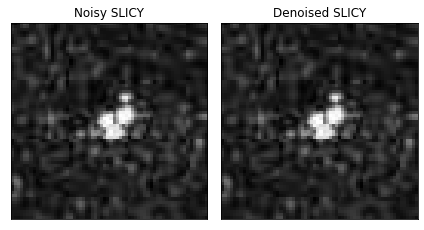

In [90]:
fig = plt.figure()
rows = 1; cols = 2

ax1 = fig.add_subplot(rows, cols, 1)
ax1.set_title('Noisy SLICY')
ax1.imshow(tr_data300[0].view(64,64).numpy(), cmap='gray')
ax1.set_xticks([])
ax1.set_yticks([])

ax2 = fig.add_subplot(rows, cols, 2)
ax2.set_title('Denoised SLICY')
ax2.imshow(tr_wt_data[0].view(64,64).numpy(), cmap='gray')
ax2.set_xticks([])
ax2.set_yticks([])

fig.tight_layout()
plt.show()

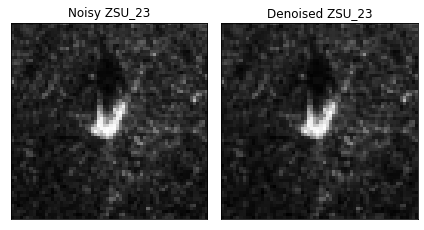

In [91]:
fig = plt.figure()
rows = 1; cols = 2

ax1 = fig.add_subplot(rows, cols, 1)
ax1.set_title('Noisy ZSU_23')
ax1.imshow(tr_data300[300].view(64,64).numpy(), cmap='gray')
ax1.set_xticks([])
ax1.set_yticks([])

ax2 = fig.add_subplot(rows, cols, 2)
ax2.set_title('Denoised ZSU_23')
ax2.imshow(tr_wt_data[300].view(64,64).numpy(), cmap='gray')
ax2.set_xticks([])
ax2.set_yticks([])

fig.tight_layout()
plt.show()

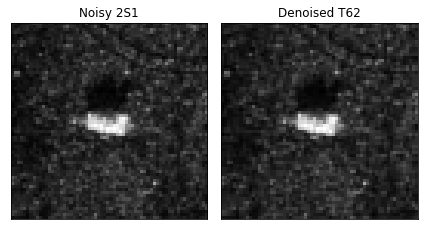

In [92]:
fig = plt.figure()
rows = 1; cols = 2

ax1 = fig.add_subplot(rows, cols, 1)
ax1.set_title('Noisy T62')
ax1.imshow(tr_data300[600].view(64,64).numpy(), cmap='gray')
ax1.set_xticks([])
ax1.set_yticks([])

ax2 = fig.add_subplot(rows, cols, 2)
ax2.set_title('Denoised T62')
ax2.imshow(tr_wt_data[600].view(64,64).numpy(), cmap='gray')
ax2.set_xticks([])
ax2.set_yticks([])

fig.tight_layout()
plt.show()

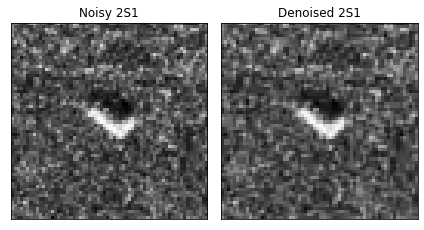

In [97]:
fig = plt.figure()
rows = 1; cols = 2

ax1 = fig.add_subplot(rows, cols, 1)
ax1.set_title('Noisy 2S1')
ax1.imshow(tr_data300[900].view(64,64).numpy(), cmap='gray')
ax1.set_xticks([])
ax1.set_yticks([])

ax2 = fig.add_subplot(rows, cols, 2)
ax2.set_title('Denoised 2S1')
ax2.imshow(tr_wt_data[900].view(64,64).numpy(), cmap='gray')
ax2.set_xticks([])
ax2.set_yticks([])

fig.tight_layout()
plt.show()

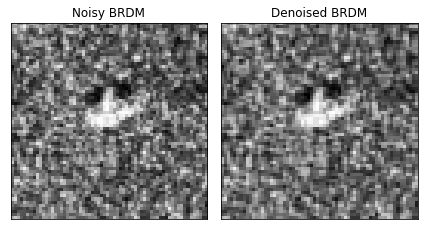

In [98]:
fig = plt.figure()
rows = 1; cols = 2

ax1 = fig.add_subplot(rows, cols, 1)
ax1.set_title('Noisy BRDM')
ax1.imshow(tr_data300[1200].view(64,64).numpy(), cmap='gray')
ax1.set_xticks([])
ax1.set_yticks([])

ax2 = fig.add_subplot(rows, cols, 2)
ax2.set_title('Denoised BRDM')
ax2.imshow(tr_wt_data[1200].view(64,64).numpy(), cmap='gray')
ax2.set_xticks([])
ax2.set_yticks([])

fig.tight_layout()
plt.show()